# Описание

## Задачи
_Испольуется три задачи:_
- DM -- двухальтернативный выбор
- Romo -- сравнение двух сигнало через задержку
- CtxDM -- DM с контекстом
Вход состоит из одного контекстного входа, одного стимула, 6 входов, кодирующих задачи. Выход как и раньше состоит из трех частей: контекстный выход, выходы принятия решения.

## Сеть
 Сеть состоит из lif AdEx нейронов

# Импорт всех необходимых библиотек

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from cgtasknet.instruments.instrument_accuracy_network import CorrectAnswerNetwork
from cgtasknet.tasks.reduce import (
    CtxDMTaskParameters,
    DMTaskParameters,
    DMTaskRandomModParameters,
    GoDlTaskParameters,
    GoDlTaskRandomModParameters,
    GoRtTaskParameters,
    GoRtTaskRandomModParameters,
    GoTaskParameters,
    GoTaskRandomModParameters,
    MultyReduceTasks,
    RomoTaskParameters,
    RomoTaskRandomModParameters,
)
from tqdm import tqdm

# Определяем устройство

In [2]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print(f"{device}")

cuda:1


# Функция построения входов и выходов

In [3]:
import os


def plot_results(inputs, target_outputs, outputs):
    if isinstance(inputs, torch.Tensor) and isinstance(target_outputs, torch.Tensor):
        inputs, t_outputs = (
            inputs.detach().cpu().numpy(),
            target_outputs.detach().cpu().numpy(),
        )
    for bath in range(min(batch_size, 20)):
        fig = plt.figure(figsize=(15, 3))
        ax1 = fig.add_subplot(141)
        plt.title("Inputs")
        plt.xlabel("$time, ms$")
        plt.ylabel("$Magnitude$")
        for i in range(3):
            plt.plot(inputs[:, bath, i].T, label=rf"$in_{i + 1}$")
        plt.legend()
        plt.tight_layout()

        ax2 = fig.add_subplot(142)
        plt.title("Task code (context)")
        plt.xticks(np.arange(1, len(tasks) + 1), sorted(tasks), rotation=90)
        plt.yticks([])
        for i in range(3, inputs.shape[-1]):
            plt.plot([i - 2] * 2, [0, inputs[0, bath, i]])
        plt.tight_layout()

        ax3 = fig.add_subplot(143)
        plt.title("Target output")
        plt.xlabel("$time, ms$")
        for i in range(t_outputs.shape[-1]):
            plt.plot(t_outputs[:, bath, i], label=rf"$out_{i + 1}$")
        plt.legend()
        plt.tight_layout()

        ax4 = fig.add_subplot(144)
        plt.title("Real output")
        plt.xlabel("$time, ms$")
        for i in range(outputs.shape[-1]):
            plt.plot(
                outputs.detach().cpu().numpy()[:, bath, i], label=rf"$out_{i + 1}$"
            )
        plt.legend()
        plt.tight_layout()
        if not os.path.exists("figures"):
            os.mkdir("figures")
        plt.savefig(f"figures{os.sep}network_outputs_{name}_batch_{bath}.pdf")
        plt.show()
        plt.close()

# Определяем датасет
Датасет будет состоять из трех типов задач:
- DM задача;
- Romo задача;
- CtxDM задача.
_Параметры для последней задачи аналогичны DM задаче_
***
## Параметры датасета:

In [4]:
batch_size = 32
number_of_epochs = 3000
number_of_tasks = 2

go_task_list_values = np.linspace(0, 1, 8)

romo_parameters = RomoTaskRandomModParameters(
    romo=RomoTaskParameters(
        delay=0.2,
        positive_shift_delay_time=1.5,
        trial_time=0.2,
        positive_shift_trial_time=0.4,
        answer_time=0.25,
    ),
)
dm_parameters = DMTaskRandomModParameters(
    dm=DMTaskParameters(trial_time=0.3, positive_shift_trial_time=1.5, answer_time=0.25)
)
ctx_parameters = CtxDMTaskParameters(dm=dm_parameters.dm)
go_parameters = GoTaskRandomModParameters(
    go=GoTaskParameters(
        trial_time=0.3,
        positive_shift_trial_time=1.5,
        value=go_task_list_values,
        answer_time=0.25,
    )
)
gort_parameters = GoRtTaskRandomModParameters(
    go_rt=GoRtTaskParameters(
        trial_time=0.3,
        positive_shift_trial_time=1.5,
        answer_time=1.5,
        value=go_task_list_values,
    )
)
godl_parameters = GoDlTaskRandomModParameters(
    go_dl=GoDlTaskParameters(
        go=GoTaskParameters(
            trial_time=0.2,
            positive_shift_trial_time=0.4,
            answer_time=0.25,
            value=go_task_list_values,
        ),
        delay=0.2,
        positive_shift_delay_time=1.5,
    )
)

## Датасет

In [5]:
sigma = 0.5
tasks = [
    "RomoTask1",
    "RomoTask2",
    "DMTask1",
    "DMTask2",
    "CtxDMTask1",
    "CtxDMTask2",
    "GoTask1",
    "GoTask2",
    "GoRtTask1",
    "GoRtTask2",
    "GoDlTask1",
    "GoDlTask2",
]
task_dict = {
    tasks[0]: romo_parameters,
    tasks[1]: romo_parameters,
    tasks[2]: dm_parameters,
    tasks[3]: dm_parameters,
    tasks[4]: ctx_parameters,
    tasks[5]: ctx_parameters,
    tasks[6]: go_parameters,
    tasks[7]: go_parameters,
    tasks[8]: gort_parameters,
    tasks[9]: gort_parameters,
    tasks[10]: godl_parameters,
    tasks[11]: godl_parameters,
}
Task = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
)

print("Task parameters:")
for key in task_dict:
    print(f"{key}:\n{task_dict[key]}\n")

print(f"inputs/outputs: {Task.feature_and_act_size[0]}/{Task.feature_and_act_size[1]}")

Task parameters:
RomoTask1:
RomoTaskRandomModParameters(romo=RomoTaskParameters(dt=0.001, trial_time=0.2, answer_time=0.25, value=(None, None), delay=0.2, negative_shift_trial_time=0, positive_shift_trial_time=0.4, negative_shift_delay_time=0, positive_shift_delay_time=1.5), n_mods=2)

RomoTask2:
RomoTaskRandomModParameters(romo=RomoTaskParameters(dt=0.001, trial_time=0.2, answer_time=0.25, value=(None, None), delay=0.2, negative_shift_trial_time=0, positive_shift_trial_time=0.4, negative_shift_delay_time=0, positive_shift_delay_time=1.5), n_mods=2)

DMTask1:
DMTaskRandomModParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3, answer_time=0.25, value=None, negative_shift_trial_time=0, positive_shift_trial_time=1.5), n_mods=2)

DMTask2:
DMTaskRandomModParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3, answer_time=0.25, value=None, negative_shift_trial_time=0, positive_shift_trial_time=1.5), n_mods=2)

CtxDMTask1:
CtxDMTaskParameters(dm=DMTaskParameters(dt=0.001, trial_time=0.3,

In [6]:
sorted_tasks = sorted(tasks)
re_word = "Go"
choices_tasks = []
values_tasks = []
for i in range(len(sorted_tasks)):
    if re_word in sorted_tasks[i]:
        values_tasks.append(i)
    else:
        choices_tasks.append(i)
can = CorrectAnswerNetwork(choices_tasks, values_tasks, 0.15)

# Инициализация сети и выгрузка на device

In [7]:
from cgtasknet.net import SNNlifadex
from norse.torch import LIFAdExParameters

feature_size, output_size = Task.feature_and_act_size
hidden_size = 256

neuron_parameters = LIFAdExParameters(
    v_th=torch.as_tensor(0.65),
    tau_ada_inv=torch.as_tensor(1 / 2.0),
    alpha=100,
    method="super",
    # rho_reset = torch.as_tensor(5)
)
model = SNNlifadex(
    feature_size,
    hidden_size,
    output_size,
    neuron_parameters=neuron_parameters,
    tau_filter_inv=50,
    save_states=True,
    return_spiking=True
    
).to(device)
for name, param in model.named_parameters():
    if name == 'alif.recurrent_weights':
        initial_parameters = torch.clone(param.detach().cpu())


inputs, _ = Task.dataset(1)
inputs *= 0
additionalCurrent = 0.1 * torch.randn((1, hidden_size)).to(device) + 1.4
inputs = torch.from_numpy(inputs[-1000:]).type(torch.float).to(device)
outputs, states = model(inputs, additional_current = additionalCurrent)
outputs = outputs.detach().cpu()
plt.plot(outputs[:, 0, 0])
plt.show()
plt.close()

mean_fr = torch.zeros((hidden_size))

for i in range(len(states)):
    mean_fr += torch.mean(states[i].z.detach().cpu(), axis=0)
mean_fr /= len(states)
plt.plot(mean_fr == 0, '.')

mean_fr = torch.zeros((hidden_size))

for i in range(len(states)):
    mean_fr += torch.mean(states[i].z.detach().cpu(), axis=0)
mean_fr /= len(states)
plt.plot(mean_fr, '.')

# Критерий и функция ошибки

In [8]:
learning_rate = 5e-3
reg_freq = 1e2 #1e3 for square #for 600 1e5
class RMSELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()

    def forward(self, yhat, y):
        return torch.sqrt(self.mse(yhat, y))


class MaskedMSELoss(torch.nn.Module):
    def __init__(self):
        super(MaskedMSELoss, self).__init__()

    def forward(self, input, target, mask):
        diff2 = (torch.flatten(input) - torch.flatten(target)) ** 2.0 * torch.flatten(
            mask
        )
        result = torch.sum(diff2) / torch.sum(mask)
        return result

class MaskedAndFrRegMSELoss(torch.nn.Module):
    def __init__(self):
        super(MaskedAndFrRegMSELoss, self).__init__()
        
    def forward(self, input, target, mask, state):
        diff2 = (torch.flatten(input) - torch.flatten(target)) ** 2.0 * torch.flatten(
        mask)
        result = torch.sum(diff2) / torch.sum(mask)
        s = []
        for i in range(len(state)):
            s.append(state[i])
        s = torch.stack(s)
        fr_neurons_mean = torch.mean(torch.mean(s, axis=0), axis=0)
        coefs = ((fr_neurons_mean > .01)).detach()
        fr_neurons_mean *= coefs
        fr_neurons_mean = torch.mean(fr_neurons_mean)
        result += fr_neurons_mean  * reg_freq
        return result
    
class MaskedAndFrBinsRegMSELoss(torch.nn.Module):
    
    def __init__(self):
        super(MaskedAndFrBinsRegMSELoss, self).__init__()
        
    def forward(self, input, target, mask, state, window=10):
        diff2 = (torch.flatten(input) - torch.flatten(target)) ** 2.0 * torch.flatten(
        mask)
        result = torch.sum(diff2) / torch.sum(mask)
        s = []
        for i in range(len(state)):
            s.append(state[i])
        s = torch.stack(s)
        time_series = len(s)
        mant = len(s) % window
        mant_ind = bool(mant)
        Nbin = time_series // window + int(mant_ind)
        s_bin = torch.zeros((Nbin, s.shape[1], s.shape[2]), requires_grad = True).to(device)
        
        for i in range(Nbin - 1):
            s_bin[i, ...] = torch.mean(s[i * window: (i + 1) * window, ...], axis=0)
        if not mant_ind:
            s_bin[-1, ...] = torch.mean(s[-window:, ...], axis=0)
        else:
            s_bin[-1, ...] = torch.mean(s[-mant:, ...], axis=0)
        coefs = ((s_bin > .02)).detach()
        s_bin *= coefs
        s_bin = torch.mean(s_bin, axis=[1, 2]) ** 2
        result += reg_freq * torch.sum(s_bin)
        return result

criterion = MaskedAndFrBinsRegMSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

## Генерация всех эпох
> Если память не позволяет, то необходимо генерировать каждую эпоху в основном цикле обучения

In [9]:
if False:
    list_inputs = []
    list_t_outputs = []
    for i in tqdm(range(number_of_epochs)):
        temp_input, temp_t_output = Task.dataset()
        temp_input.astype(dtype=np.float16)
        temp_t_output.astype(dtype=np.float16)
        temp_input[:, :, :] += np.random.normal(0, sigma, size=temp_input.shape)
        list_inputs.append(temp_input)
        list_t_outputs.append(temp_t_output)

# JIT numba generator (test)
TODO: Необходимо добавить в cgtasknet и вызывать оттуда

In [10]:
#from numba import njit, prange


#@njit(cache=True, parallel=True)
def every_bath_generator(
        start_sigma: float,
        stop_sigma: float,
        times: int = 1,
        batches: int = 1,
        actions: int = 1,
):
    data = np.zeros((times, batches, actions))
    for i in range(batches):
        data[:, i, :] = np.random.normal(
            0, np.random.uniform(start_sigma, stop_sigma), size=(times, actions)
        )
    return data

In [11]:
torch.cuda.empty_cache()


In [12]:
from norse.torch import LIFAdExState
Task_test = MultyReduceTasks(
    tasks=task_dict,
    batch_size=batch_size,
    delay_between=0,
    enable_fixation_delay=True,
    mode="random",
    task_number=0
)
def check_mean_fr():
    init_state = LIFAdExState(
            torch.zeros(batch_size, hidden_size).to(device),
            torch.rand(batch_size, hidden_size).to(device),
            torch.zeros(batch_size, hidden_size).to(device),
            torch.zeros(batch_size, hidden_size).to(device),
        )
    inputs, target_outputs = Task_test.dataset(1)

    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    result = model(inputs, init_state,)
    #del inputs, init_state
    torch.cuda.empty_cache()
    states = result[-1]
    spikes = []
    for state in states:
        spikes.append(state.detach().cpu())

    last_fix = torch.where(inputs[:, :, 0] == 1)[0][-1].item()
    s = torch.stack(spikes)[last_fix:, ...]
    freq_sequence_new = torch.sort(
        torch.mean(torch.mean(s, axis=0), axis=0), dim=0
    ).values
    for i in range(len(freq_sequence_new)):
        plt.plot([i + 1] * 2, [0, freq_sequence_new[i] * 1e3], c="b")
    plt.show()
    plt.close()
    index=0
    plt.plot(target_outputs[:, index, 0].detach().cpu(), c='r')
    plt.plot(target_outputs[:, index, 1].detach().cpu(), c='b')
    plt.plot(target_outputs[:, index, 2].detach().cpu(), c='g')

    plt.plot(result[0][:, index, 0].detach().cpu(), c='r', alpha=.6
            )
    plt.plot(result[0][:, index, 1].detach().cpu(), c='b', alpha=.6
            )
    plt.plot(result[0][:, index, 2].detach().cpu(), c='g', alpha=.6
        )
    plt.show()
    plt.close()
    

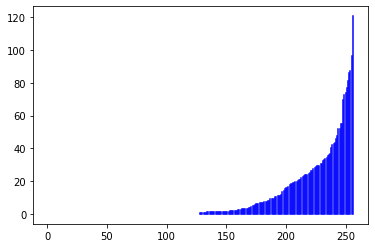

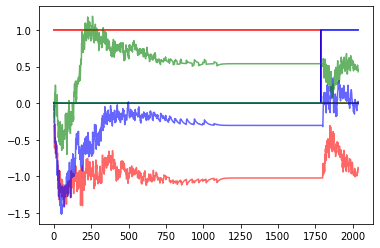

In [13]:
check_mean_fr()

# Основной цикл обучения

  0%|▏                                                                                                                                                              | 4/3000 [01:27<18:00:29, 21.64s/it]

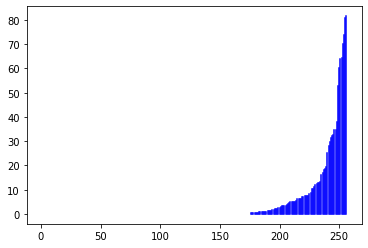

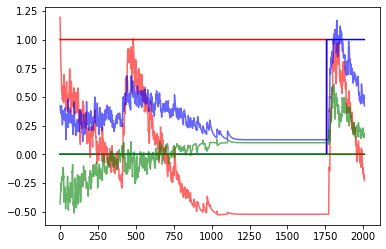

  0%|▍                                                                                                                                                              | 9/3000 [03:15<17:41:42, 21.30s/it]

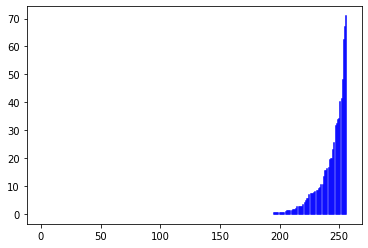

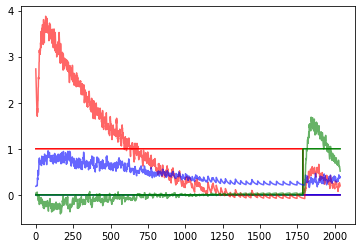

  0%|▋                                                                                                                                                             | 14/3000 [05:05<17:34:01, 21.18s/it]

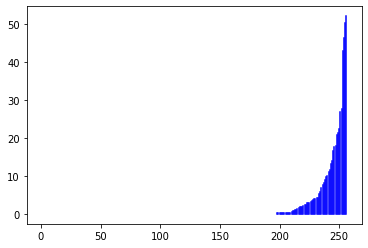

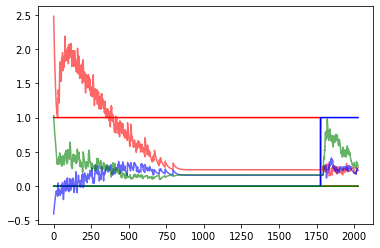

  1%|█                                                                                                                                                             | 19/3000 [06:52<17:26:31, 21.06s/it]

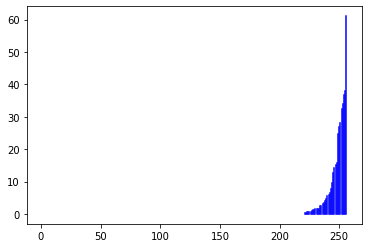

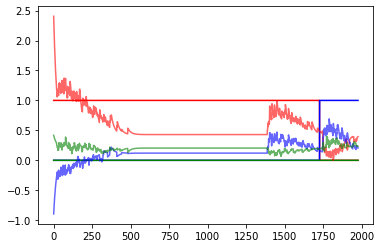

  1%|█▎                                                                                                                                                            | 24/3000 [08:37<17:05:52, 20.68s/it]

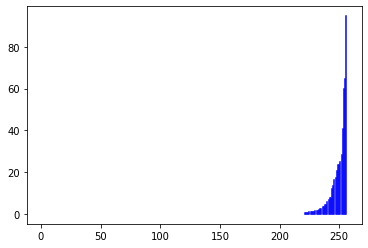

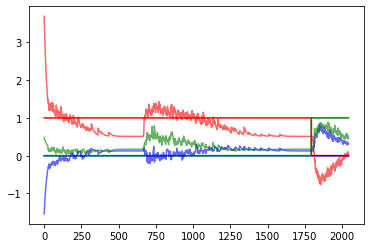

  1%|█▌                                                                                                                                                            | 29/3000 [10:18<16:33:20, 20.06s/it]

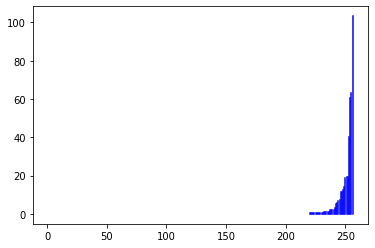

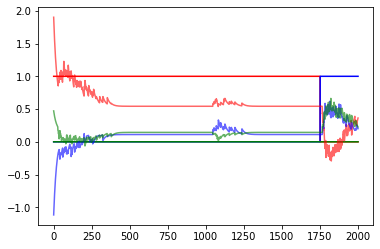

  1%|█▊                                                                                                                                                            | 34/3000 [12:04<17:11:35, 20.87s/it]

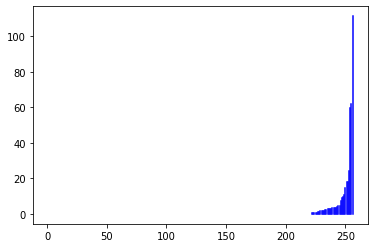

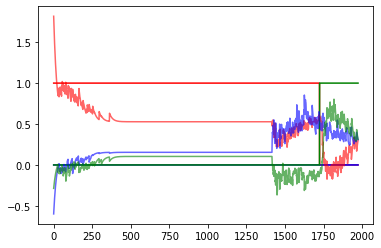

  1%|██                                                                                                                                                            | 39/3000 [13:51<17:11:30, 20.90s/it]

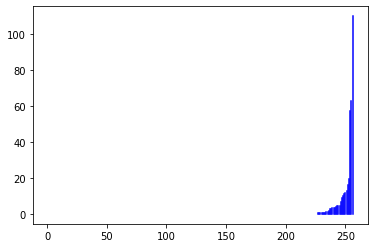

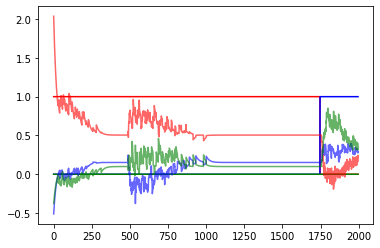

  1%|██▎                                                                                                                                                           | 44/3000 [15:37<16:18:39, 19.86s/it]

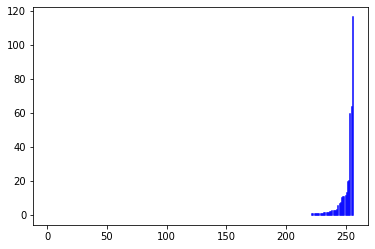

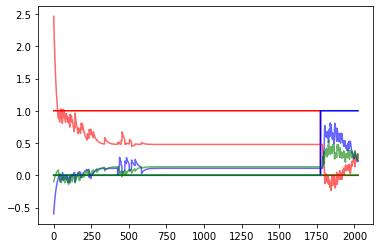

  2%|██▌                                                                                                                                                           | 49/3000 [17:26<17:09:35, 20.93s/it]

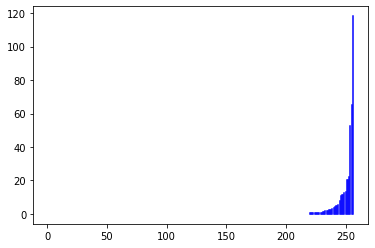

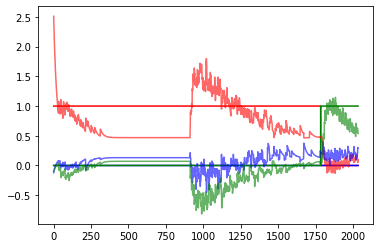

  2%|██▊                                                                                                                                                           | 54/3000 [20:03<20:12:40, 24.70s/it]

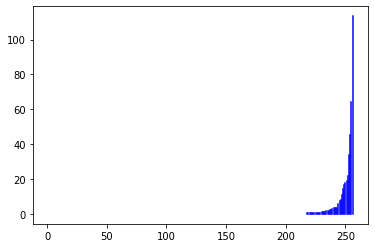

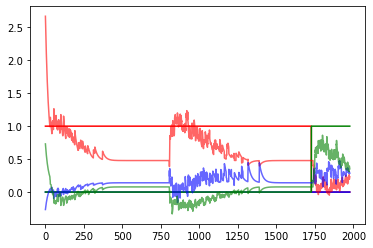

  2%|███                                                                                                                                                           | 59/3000 [21:52<17:43:12, 21.69s/it]

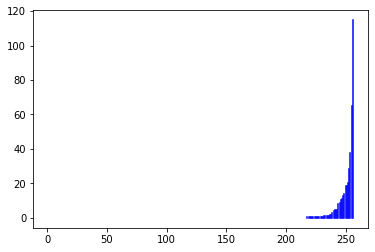

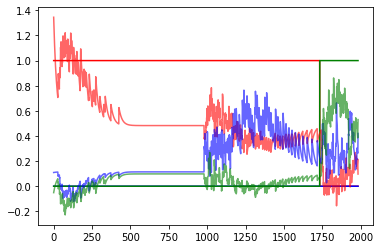

  2%|███▎                                                                                                                                                          | 64/3000 [23:38<16:57:31, 20.79s/it]

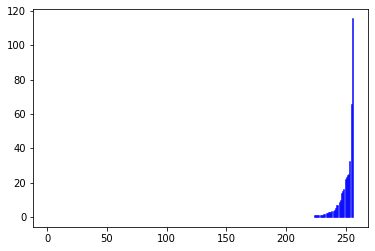

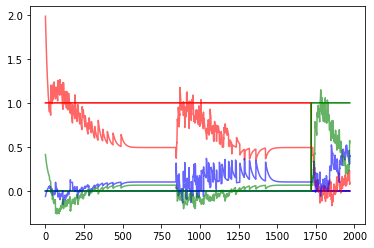

  2%|███▋                                                                                                                                                          | 69/3000 [25:23<16:22:52, 20.12s/it]

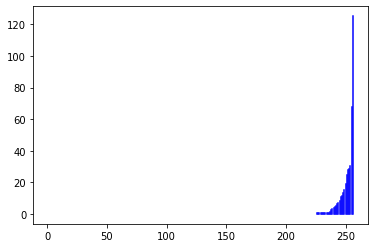

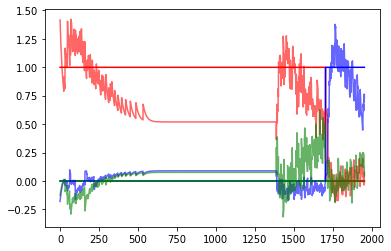

  2%|███▉                                                                                                                                                          | 74/3000 [27:09<17:03:06, 20.98s/it]

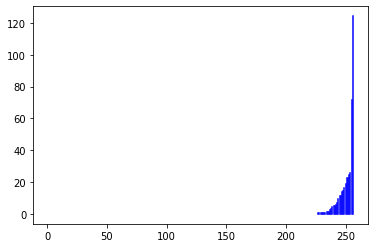

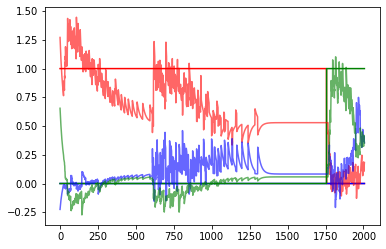

  3%|████▏                                                                                                                                                         | 79/3000 [28:55<17:07:52, 21.11s/it]

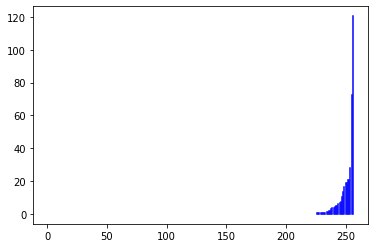

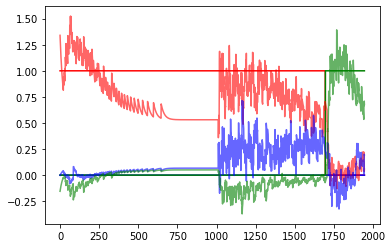

  3%|████▍                                                                                                                                                         | 84/3000 [30:39<16:22:32, 20.22s/it]

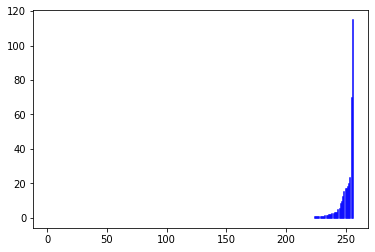

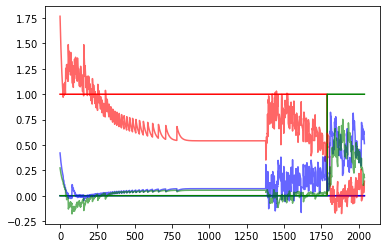

  3%|████▋                                                                                                                                                         | 89/3000 [32:26<17:05:07, 21.13s/it]

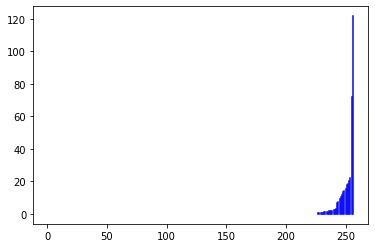

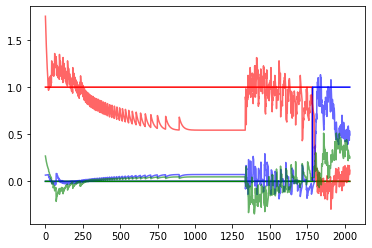

  3%|████▉                                                                                                                                                         | 94/3000 [34:13<16:46:54, 20.79s/it]

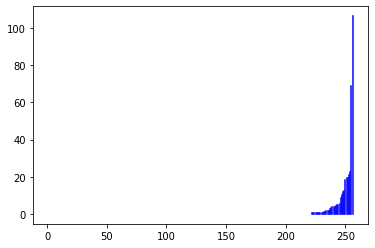

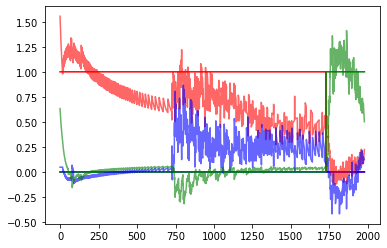

  3%|█████▏                                                                                                                                                        | 99/3000 [35:59<16:55:29, 21.00s/it]

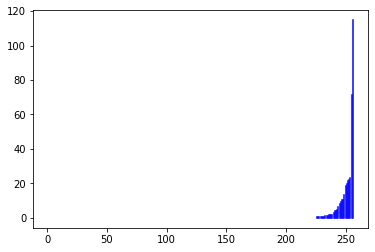

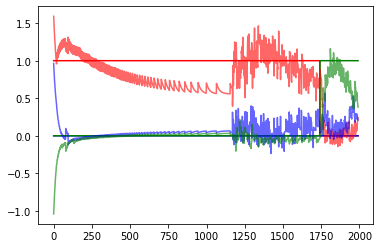

  3%|█████▍                                                                                                                                                       | 104/3000 [38:35<20:03:07, 24.93s/it]

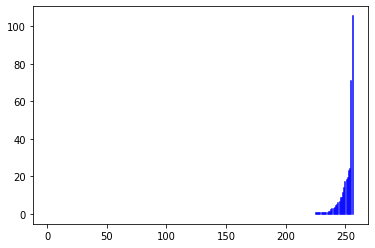

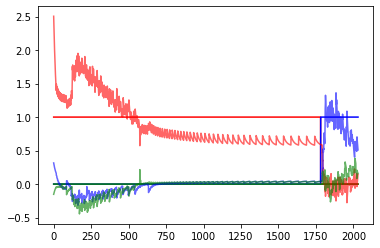

  4%|█████▋                                                                                                                                                       | 109/3000 [40:24<17:41:52, 22.04s/it]

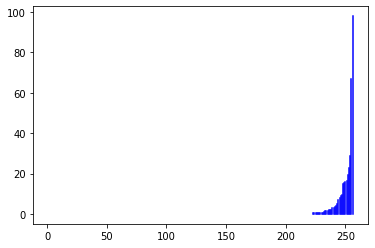

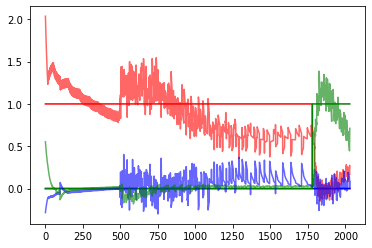

  4%|█████▉                                                                                                                                                       | 114/3000 [42:15<17:12:22, 21.46s/it]

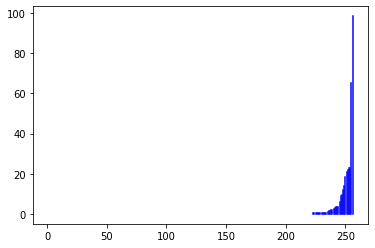

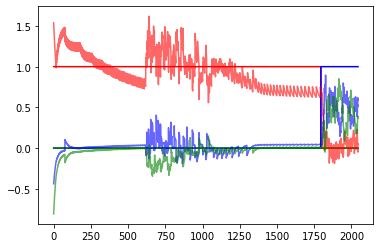

  4%|██████▏                                                                                                                                                      | 119/3000 [44:00<16:34:47, 20.72s/it]

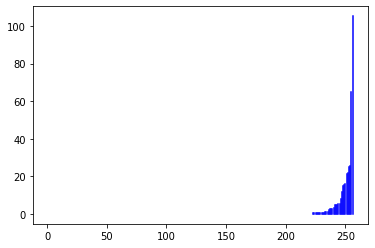

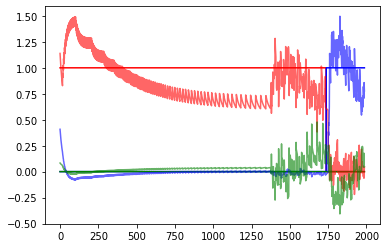

  4%|██████▍                                                                                                                                                      | 124/3000 [45:43<16:09:58, 20.24s/it]

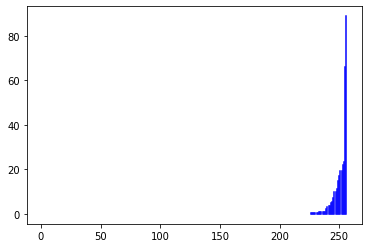

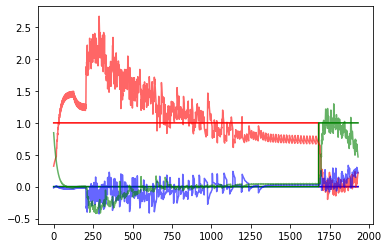

  4%|██████▊                                                                                                                                                      | 129/3000 [47:32<16:58:42, 21.29s/it]

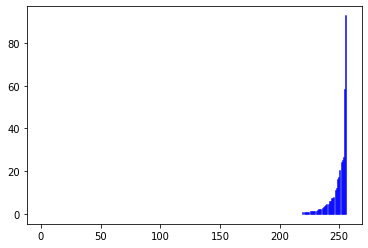

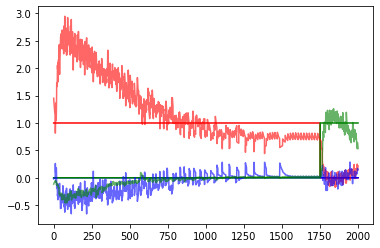

  4%|███████                                                                                                                                                      | 134/3000 [49:16<16:14:45, 20.41s/it]

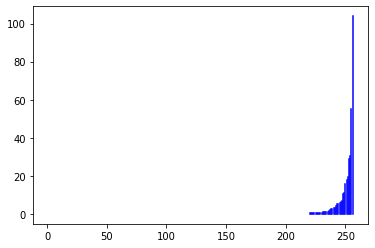

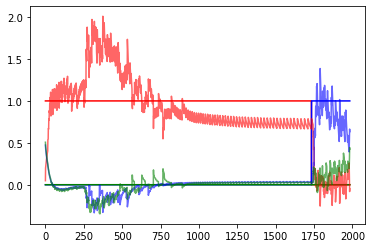

  5%|███████▎                                                                                                                                                     | 139/3000 [51:01<16:17:09, 20.49s/it]

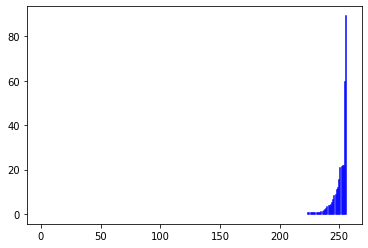

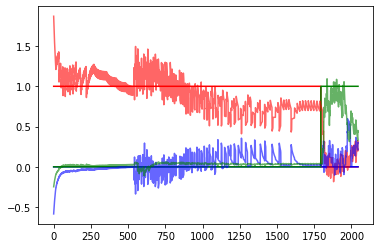

  5%|███████▌                                                                                                                                                     | 144/3000 [52:47<16:27:34, 20.75s/it]

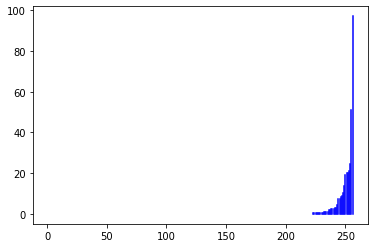

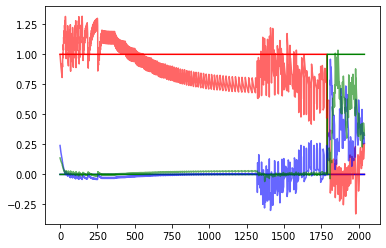

  5%|███████▊                                                                                                                                                     | 149/3000 [54:36<16:45:42, 21.17s/it]

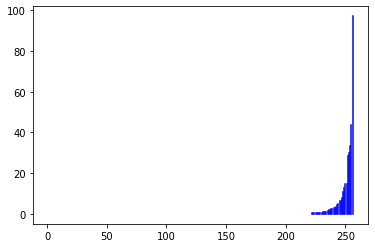

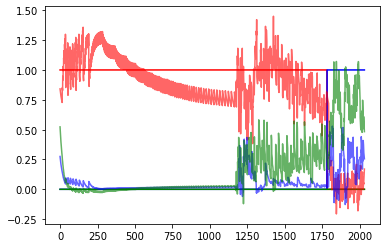

  5%|████████                                                                                                                                                     | 154/3000 [57:15<19:56:01, 25.22s/it]

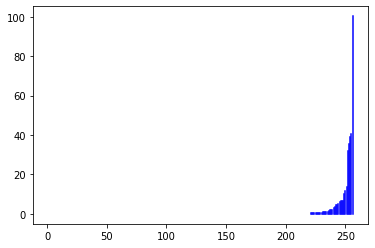

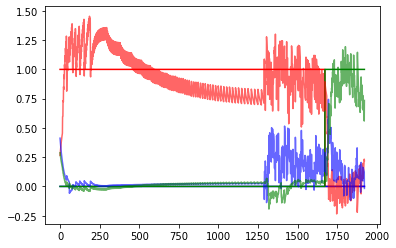

  5%|████████▎                                                                                                                                                    | 159/3000 [58:58<16:26:49, 20.84s/it]

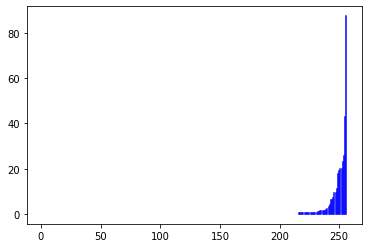

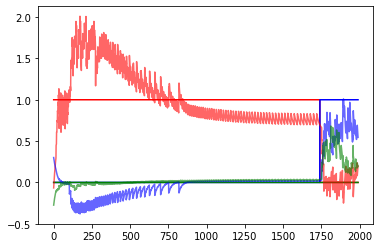

  5%|████████▍                                                                                                                                                  | 164/3000 [1:00:53<17:19:14, 21.99s/it]

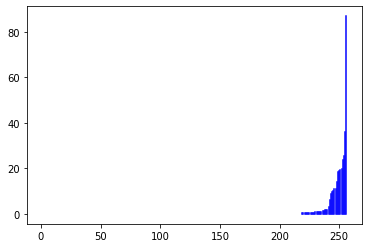

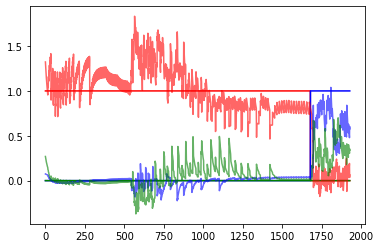

  6%|████████▋                                                                                                                                                  | 169/3000 [1:02:37<16:24:49, 20.87s/it]

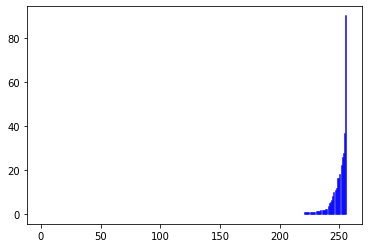

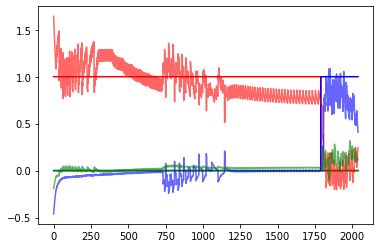

  6%|████████▉                                                                                                                                                  | 174/3000 [1:04:24<16:07:13, 20.54s/it]

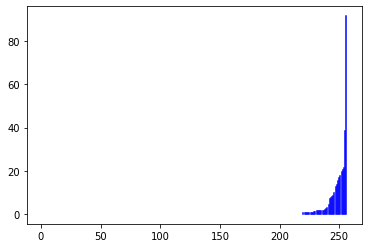

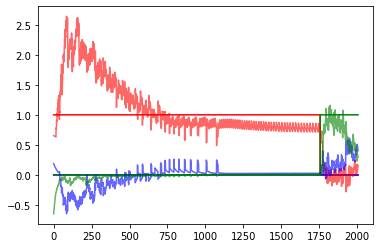

  6%|█████████▏                                                                                                                                                 | 179/3000 [1:06:13<16:24:36, 20.94s/it]

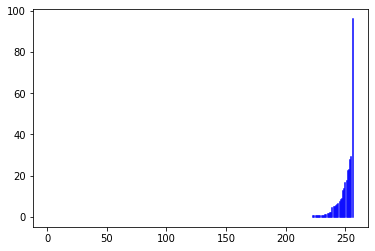

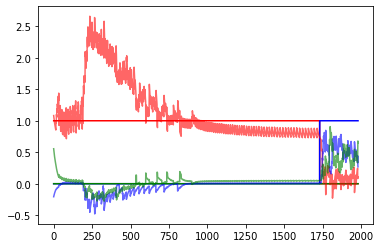

  6%|█████████▌                                                                                                                                                 | 184/3000 [1:08:01<16:12:01, 20.71s/it]

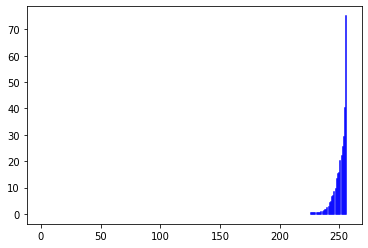

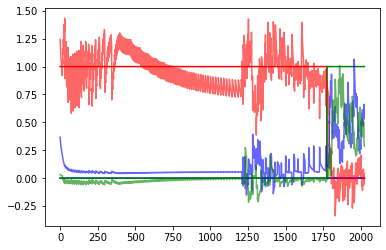

  6%|█████████▊                                                                                                                                                 | 189/3000 [1:09:48<16:16:35, 20.85s/it]

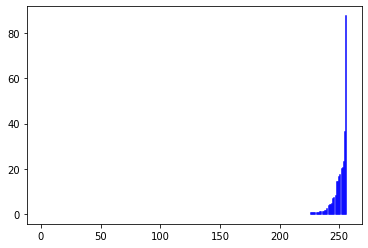

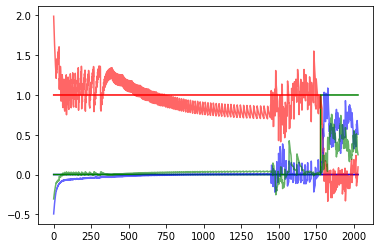

  6%|██████████                                                                                                                                                 | 194/3000 [1:11:38<16:42:24, 21.43s/it]

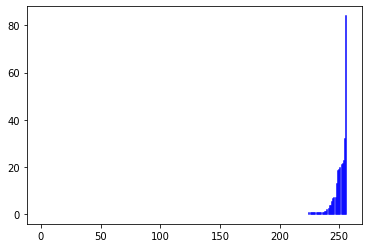

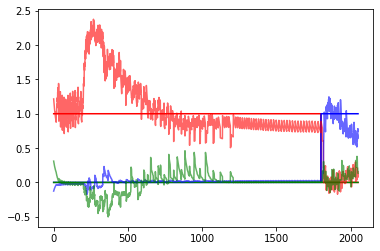

  7%|██████████▎                                                                                                                                                | 199/3000 [1:13:24<16:01:48, 20.60s/it]

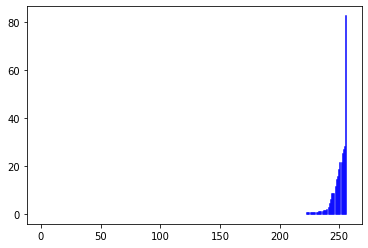

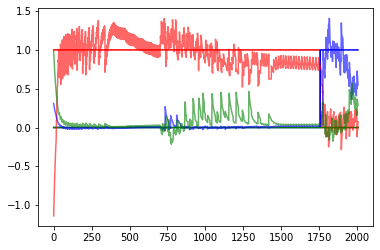

  7%|██████████▌                                                                                                                                                | 204/3000 [1:16:05<19:36:27, 25.25s/it]

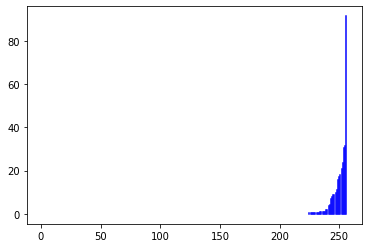

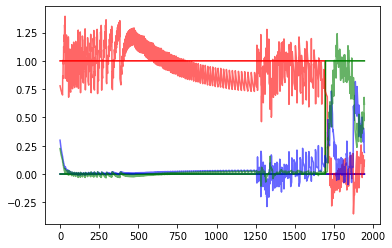

  7%|██████████▊                                                                                                                                                | 209/3000 [1:17:50<16:13:30, 20.93s/it]

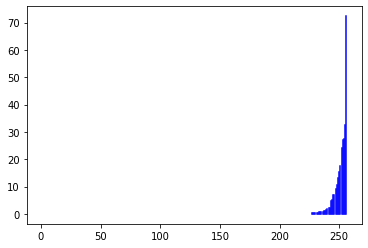

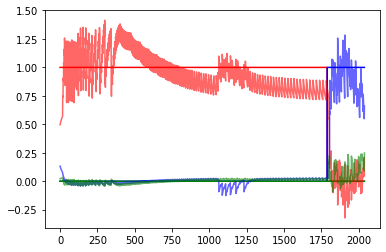

  7%|███████████                                                                                                                                                | 214/3000 [1:19:36<16:16:24, 21.03s/it]

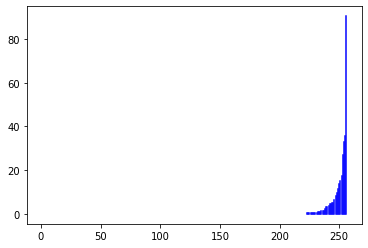

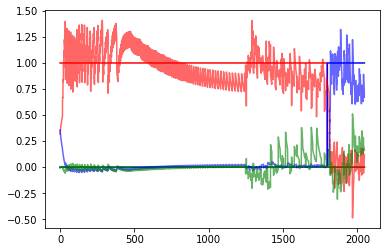

  7%|███████████▎                                                                                                                                               | 219/3000 [1:21:21<15:55:09, 20.61s/it]

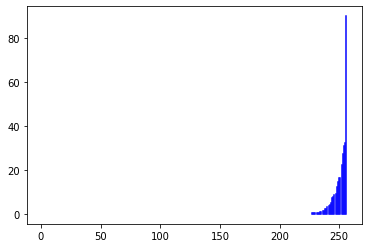

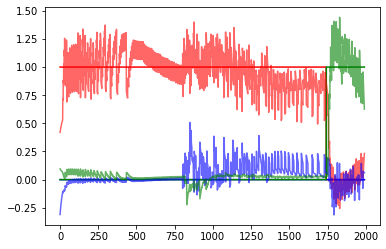

  7%|███████████▌                                                                                                                                               | 224/3000 [1:23:11<16:33:34, 21.48s/it]

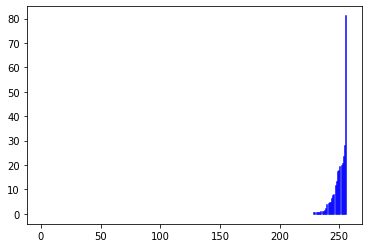

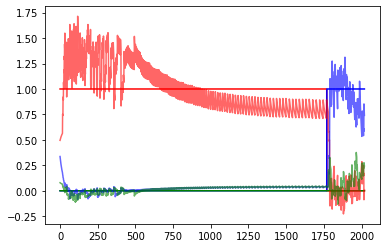

  8%|███████████▊                                                                                                                                               | 229/3000 [1:24:58<16:25:21, 21.34s/it]

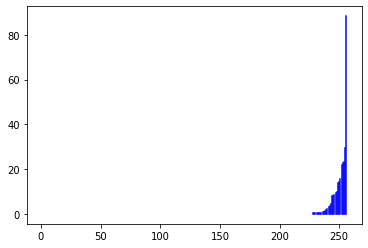

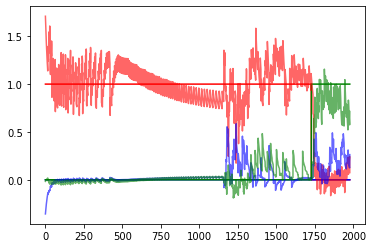

  8%|████████████                                                                                                                                               | 234/3000 [1:26:46<16:14:05, 21.13s/it]

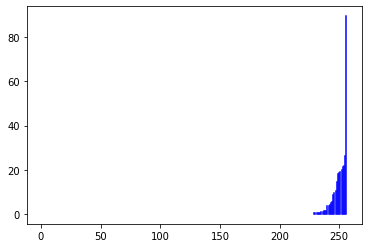

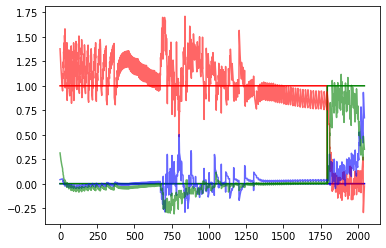

  8%|████████████▎                                                                                                                                              | 239/3000 [1:28:36<16:10:09, 21.08s/it]

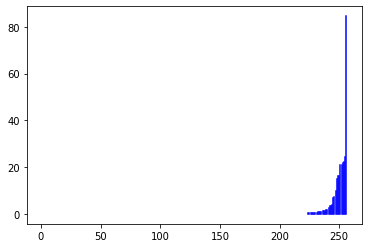

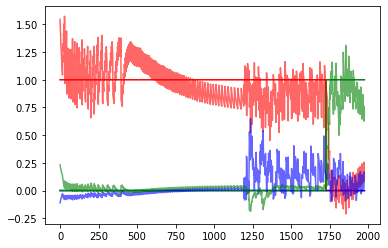

  8%|████████████▌                                                                                                                                              | 244/3000 [1:30:25<16:18:04, 21.29s/it]

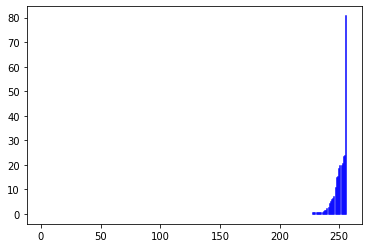

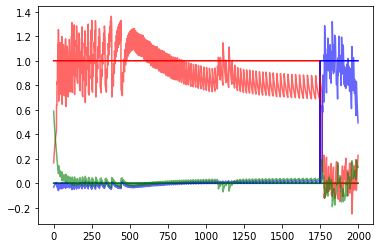

  8%|████████████▊                                                                                                                                              | 249/3000 [1:32:11<16:03:04, 21.00s/it]

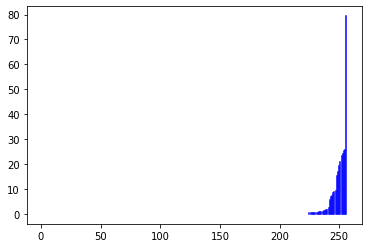

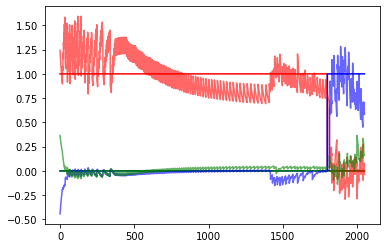

  8%|█████████████                                                                                                                                              | 254/3000 [1:34:49<18:34:10, 24.34s/it]

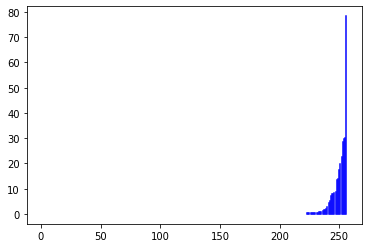

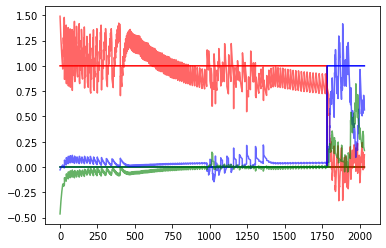

  9%|█████████████▍                                                                                                                                             | 259/3000 [1:36:37<16:18:52, 21.43s/it]

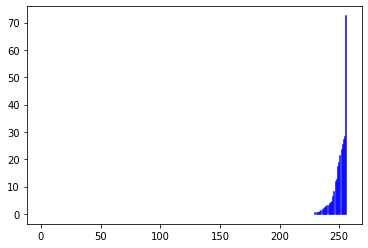

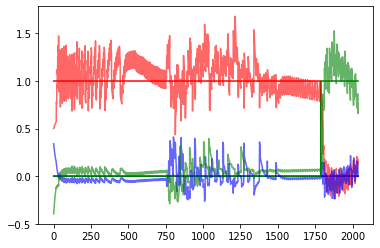

  9%|█████████████▋                                                                                                                                             | 264/3000 [1:38:29<16:42:05, 21.98s/it]

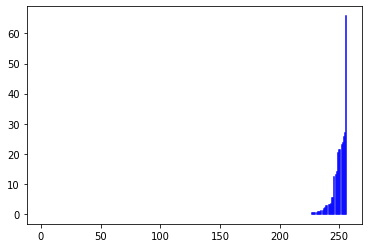

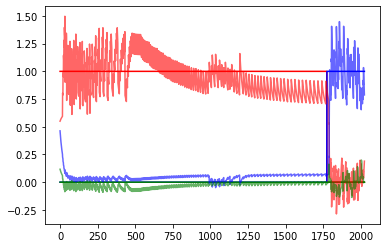

  9%|█████████████▉                                                                                                                                             | 269/3000 [1:40:17<16:10:26, 21.32s/it]

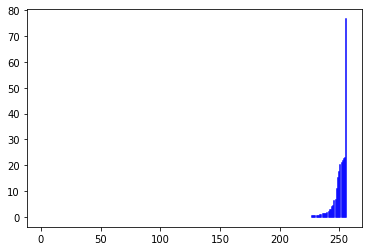

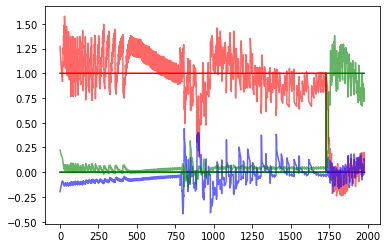

  9%|██████████████▏                                                                                                                                            | 274/3000 [1:42:02<15:24:34, 20.35s/it]

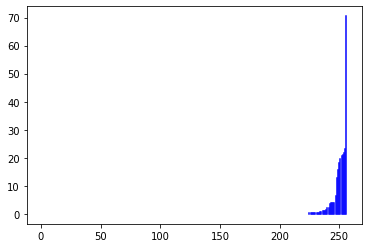

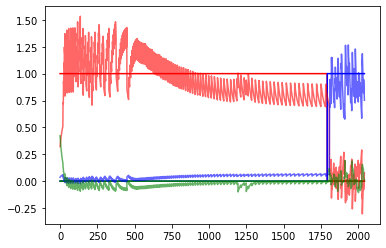

  9%|██████████████▍                                                                                                                                            | 279/3000 [1:43:51<16:00:57, 21.19s/it]

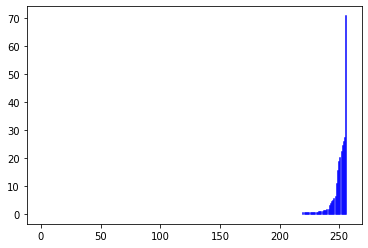

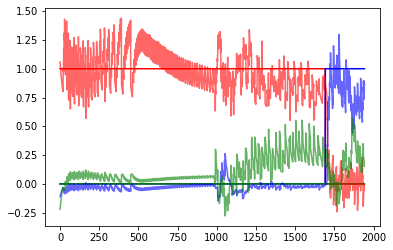

  9%|██████████████▋                                                                                                                                            | 284/3000 [1:45:40<15:56:22, 21.13s/it]

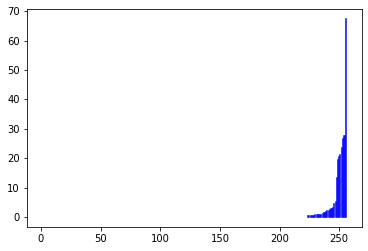

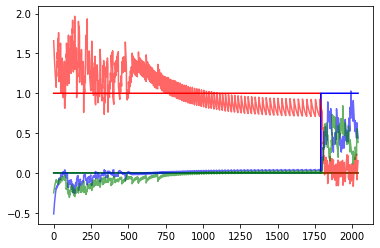

 10%|██████████████▉                                                                                                                                            | 289/3000 [1:47:31<16:19:00, 21.67s/it]

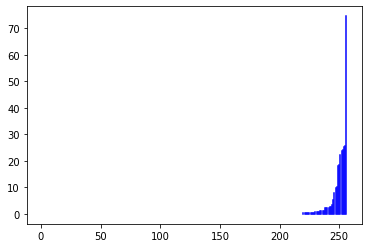

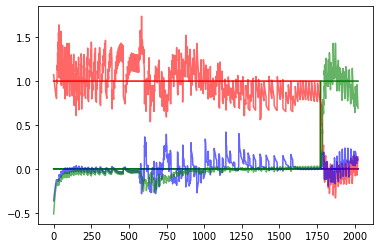

 10%|███████████████▏                                                                                                                                           | 294/3000 [1:49:16<15:29:24, 20.61s/it]

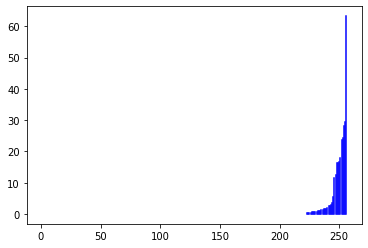

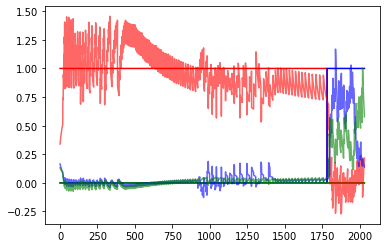

 10%|███████████████▍                                                                                                                                           | 299/3000 [1:51:06<15:58:10, 21.28s/it]

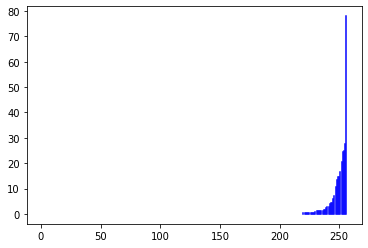

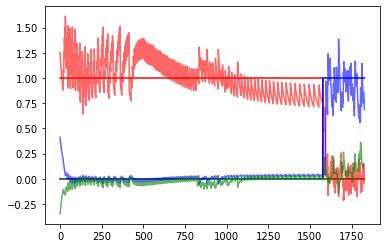

 10%|███████████████▋                                                                                                                                           | 304/3000 [1:53:37<17:59:53, 24.03s/it]

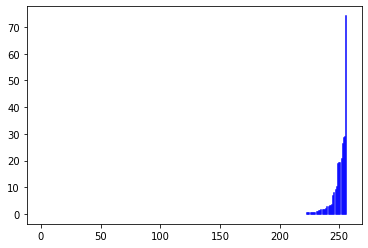

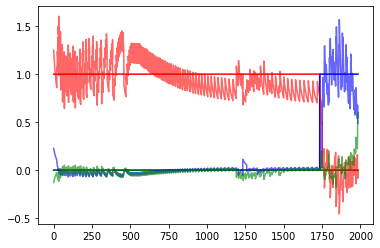

 10%|███████████████▉                                                                                                                                           | 309/3000 [1:55:27<16:14:23, 21.73s/it]

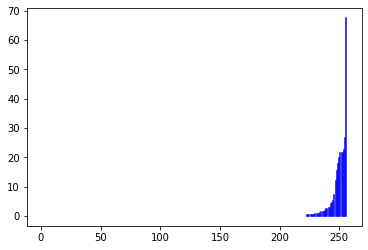

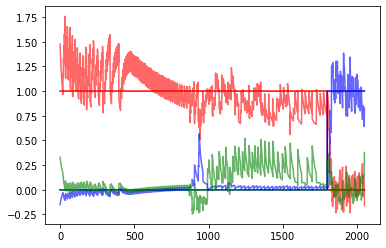

 10%|████████████████▏                                                                                                                                          | 314/3000 [1:57:16<15:55:45, 21.35s/it]

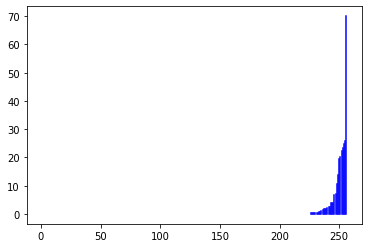

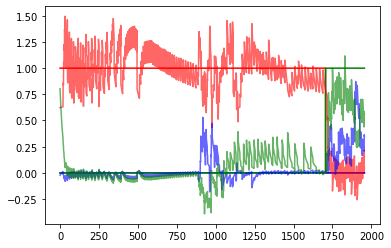

 11%|████████████████▍                                                                                                                                          | 319/3000 [1:59:05<15:54:03, 21.35s/it]

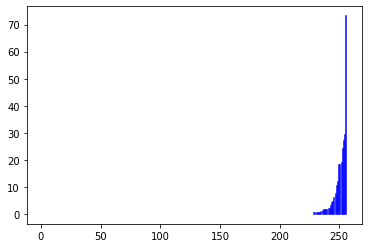

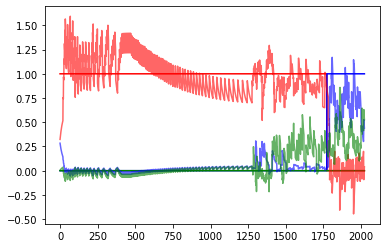

 11%|████████████████▋                                                                                                                                          | 324/3000 [2:00:52<15:33:32, 20.93s/it]

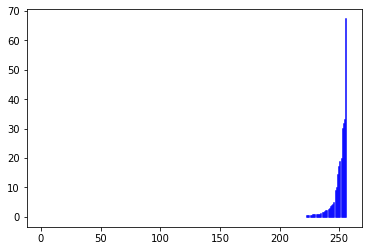

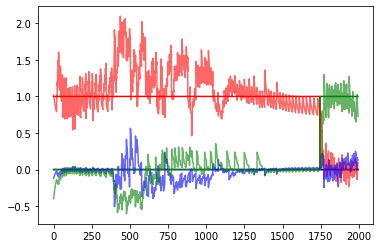

 11%|████████████████▉                                                                                                                                          | 329/3000 [2:02:39<15:27:22, 20.83s/it]

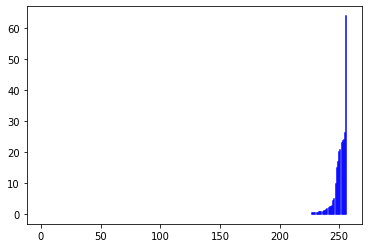

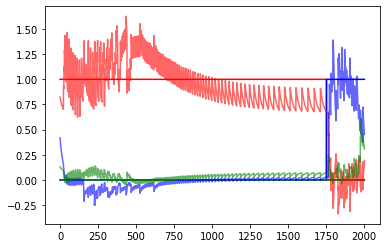

 11%|█████████████████▎                                                                                                                                         | 334/3000 [2:04:25<15:21:10, 20.73s/it]

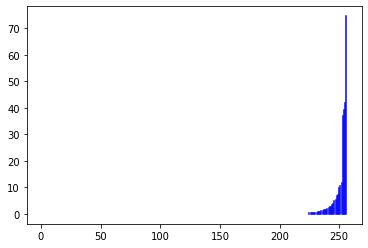

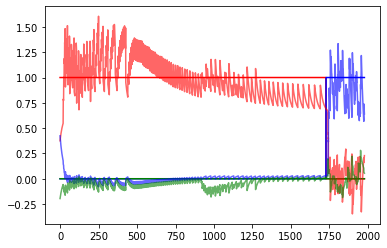

 11%|█████████████████▌                                                                                                                                         | 339/3000 [2:06:14<15:35:51, 21.10s/it]

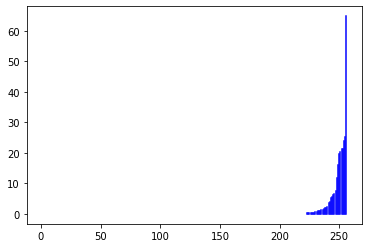

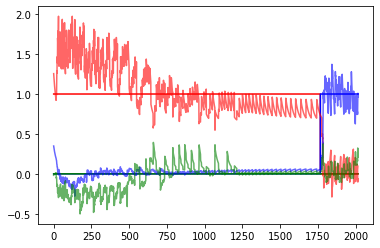

 11%|█████████████████▊                                                                                                                                         | 344/3000 [2:08:02<15:36:07, 21.15s/it]

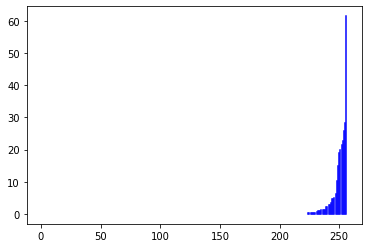

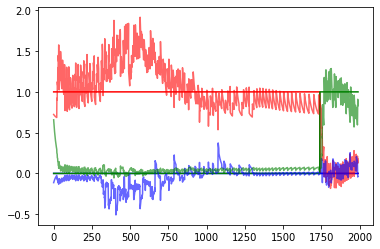

 12%|██████████████████                                                                                                                                         | 349/3000 [2:09:46<15:01:16, 20.40s/it]

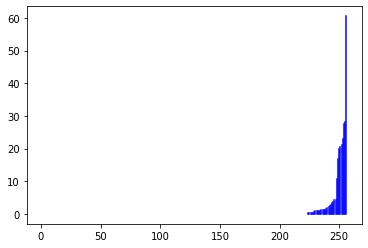

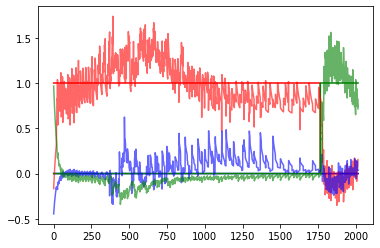

 12%|██████████████████▎                                                                                                                                        | 354/3000 [2:12:24<17:59:01, 24.47s/it]

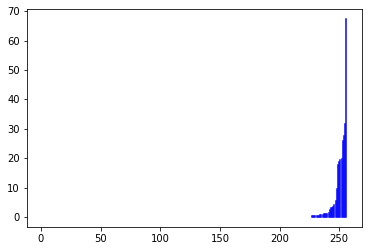

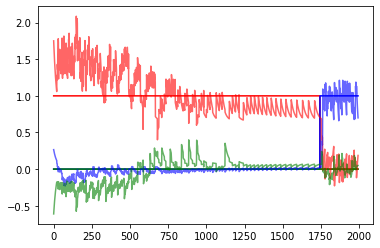

 12%|██████████████████▌                                                                                                                                        | 359/3000 [2:14:07<15:08:46, 20.65s/it]

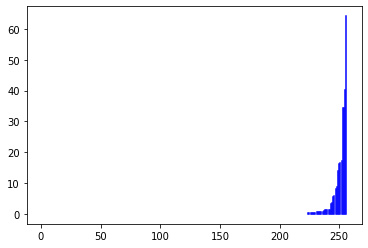

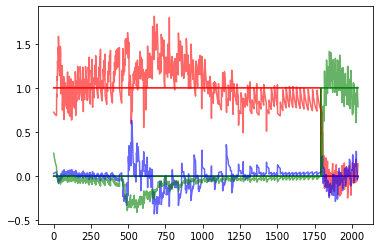

 12%|██████████████████▊                                                                                                                                        | 364/3000 [2:15:57<15:37:17, 21.33s/it]

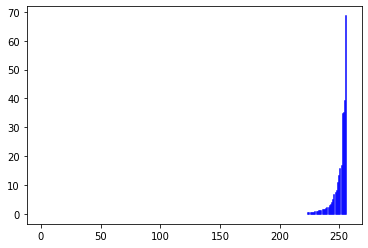

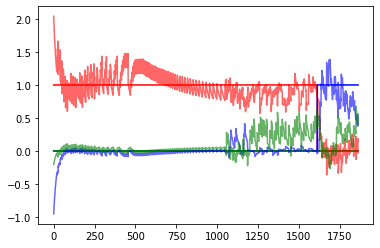

 12%|███████████████████                                                                                                                                        | 369/3000 [2:17:45<15:32:15, 21.26s/it]

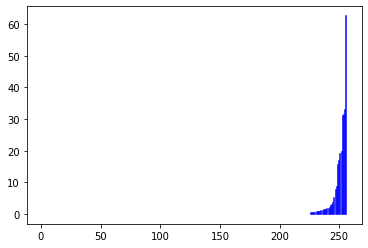

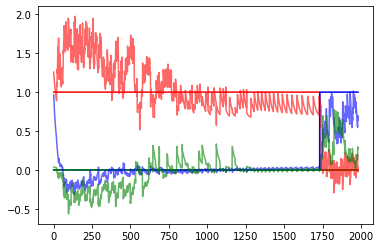

 12%|███████████████████▎                                                                                                                                       | 374/3000 [2:19:33<15:34:18, 21.35s/it]

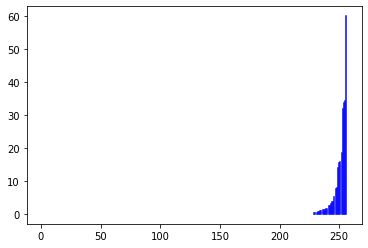

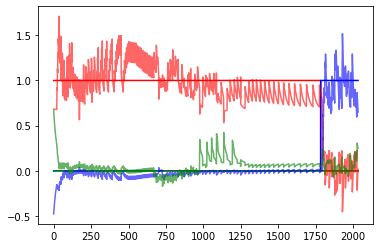

 13%|███████████████████▌                                                                                                                                       | 379/3000 [2:21:18<14:55:00, 20.49s/it]

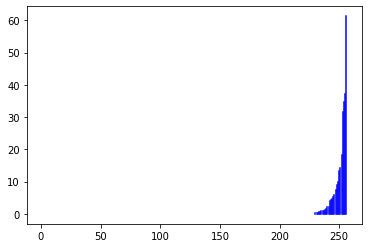

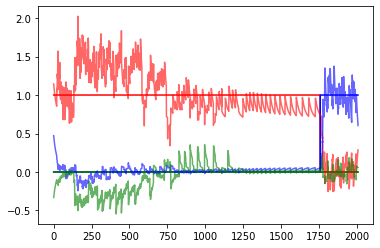

 13%|███████████████████▊                                                                                                                                       | 384/3000 [2:23:06<15:11:27, 20.91s/it]

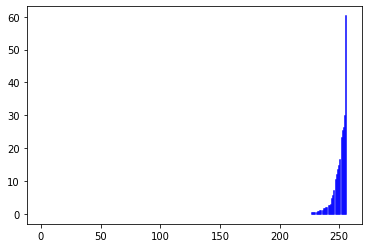

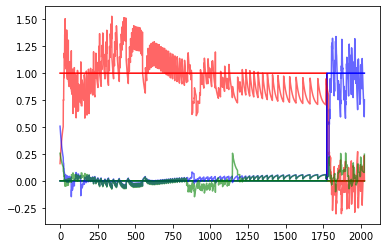

 13%|████████████████████                                                                                                                                       | 389/3000 [2:24:51<14:38:43, 20.19s/it]

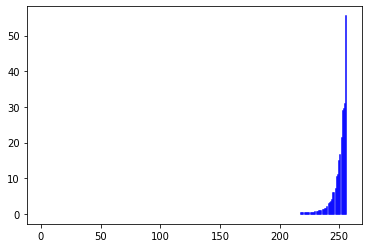

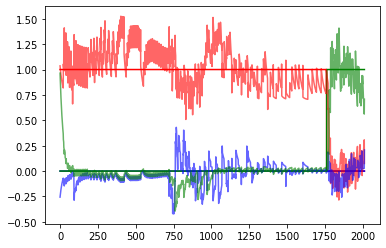

 13%|████████████████████▎                                                                                                                                      | 394/3000 [2:26:42<15:33:00, 21.48s/it]

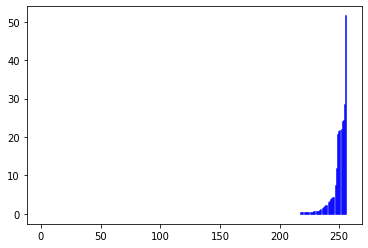

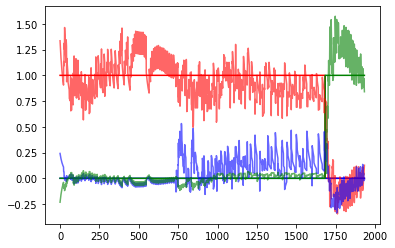

 13%|████████████████████▌                                                                                                                                      | 399/3000 [2:28:30<15:26:22, 21.37s/it]

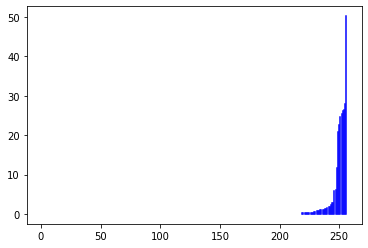

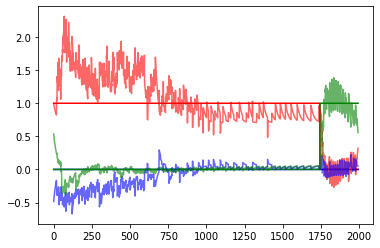

 13%|████████████████████▊                                                                                                                                      | 404/3000 [2:31:07<17:57:28, 24.90s/it]

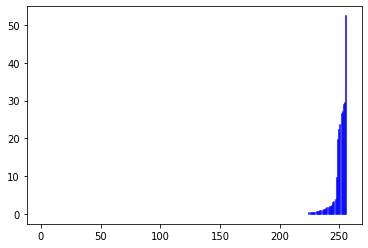

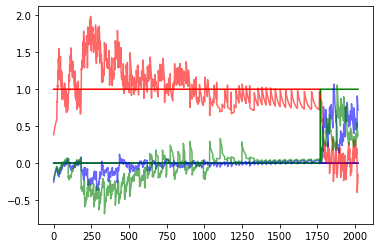

 14%|█████████████████████▏                                                                                                                                     | 409/3000 [2:32:54<15:26:40, 21.46s/it]

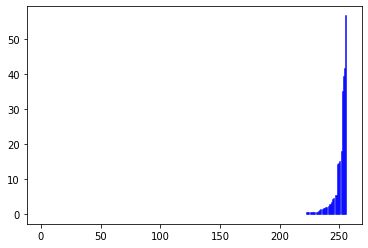

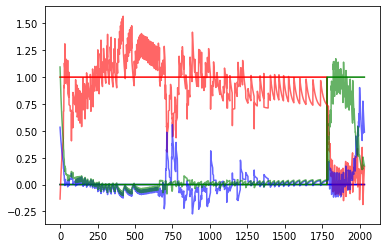

 14%|█████████████████████▍                                                                                                                                     | 414/3000 [2:34:38<14:53:42, 20.74s/it]

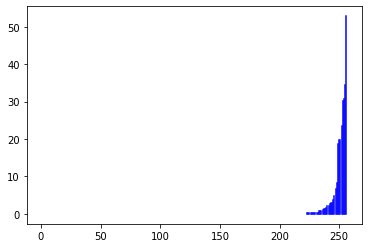

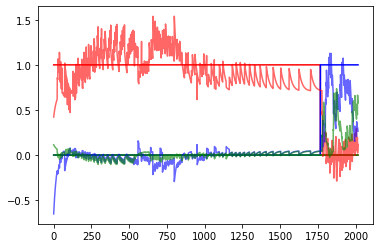

 14%|█████████████████████▋                                                                                                                                     | 419/3000 [2:36:25<15:04:48, 21.03s/it]

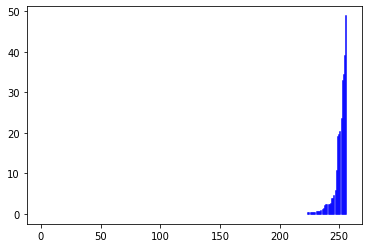

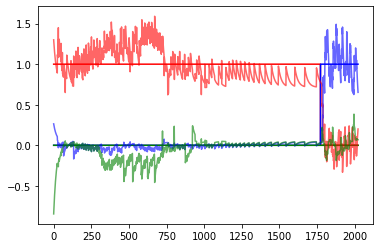

 14%|█████████████████████▉                                                                                                                                     | 424/3000 [2:38:14<15:17:05, 21.36s/it]

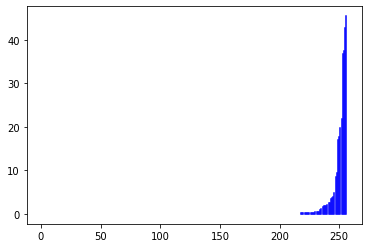

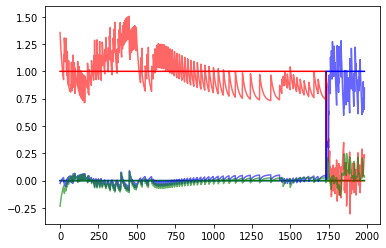

 14%|██████████████████████▏                                                                                                                                    | 429/3000 [2:40:04<15:18:49, 21.44s/it]

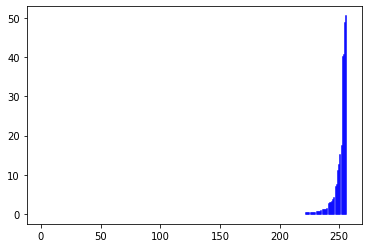

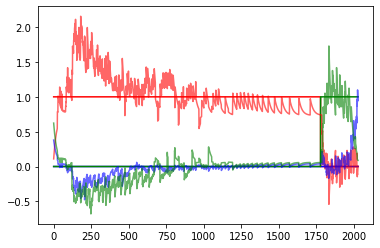

 14%|██████████████████████▍                                                                                                                                    | 434/3000 [2:41:52<15:02:02, 21.09s/it]

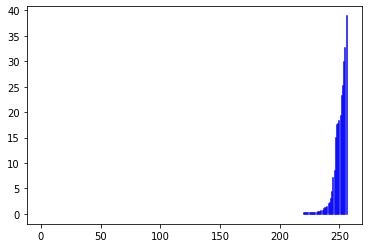

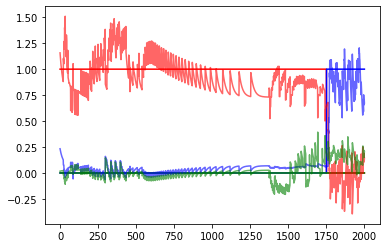

 15%|██████████████████████▋                                                                                                                                    | 439/3000 [2:43:40<14:56:13, 21.00s/it]

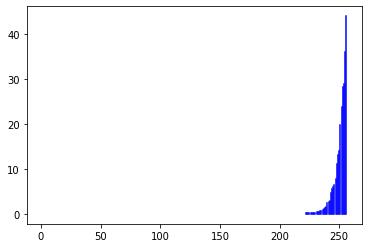

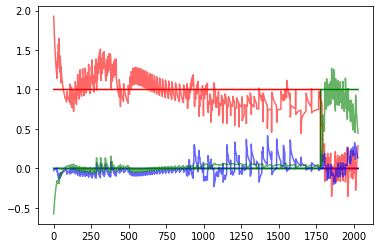

 15%|██████████████████████▉                                                                                                                                    | 444/3000 [2:45:28<14:51:27, 20.93s/it]

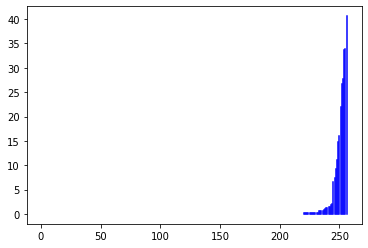

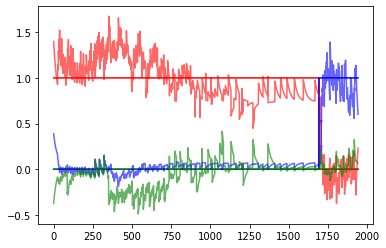

 15%|███████████████████████▏                                                                                                                                   | 449/3000 [2:47:14<14:28:59, 20.44s/it]

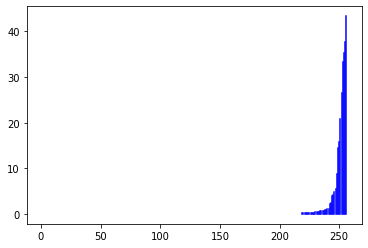

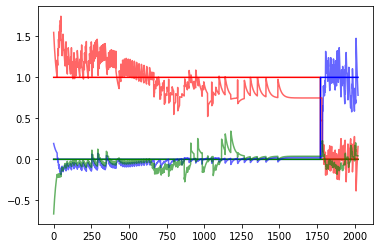

 15%|███████████████████████▍                                                                                                                                   | 454/3000 [2:49:45<17:02:53, 24.11s/it]

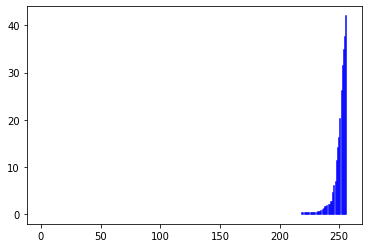

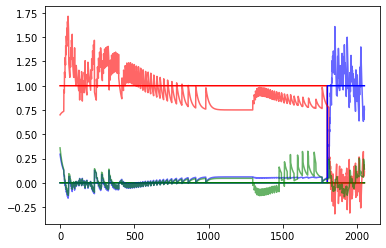

 15%|███████████████████████▋                                                                                                                                   | 459/3000 [2:51:33<15:16:58, 21.65s/it]

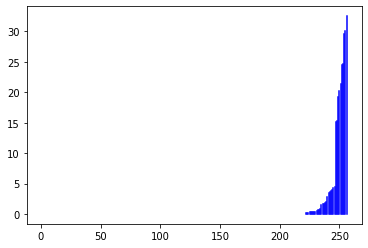

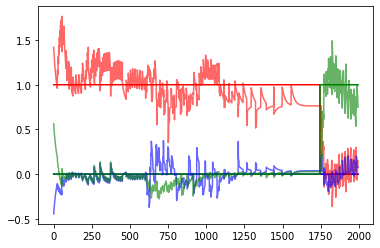

 15%|███████████████████████▉                                                                                                                                   | 464/3000 [2:53:19<14:37:53, 20.77s/it]

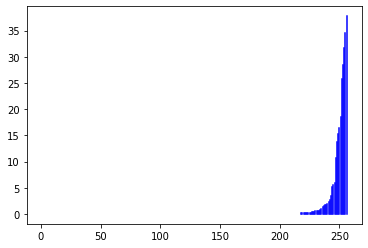

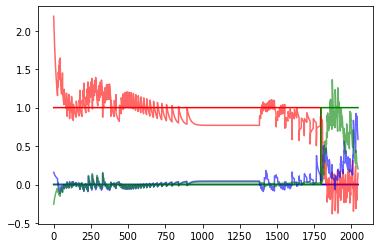

 16%|████████████████████████▏                                                                                                                                  | 469/3000 [2:55:05<14:31:15, 20.65s/it]

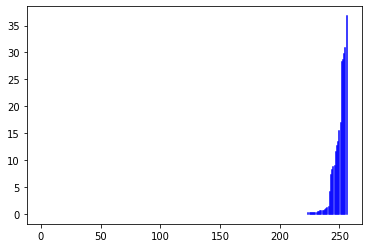

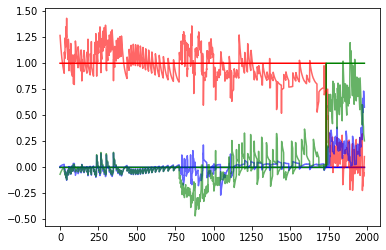

 16%|████████████████████████▍                                                                                                                                  | 474/3000 [2:56:52<14:28:17, 20.62s/it]

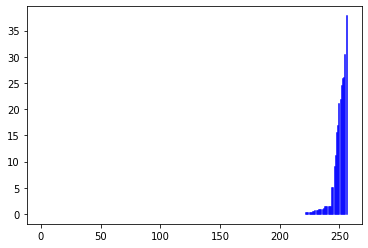

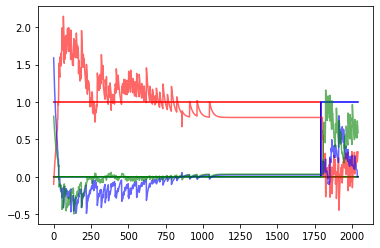

 16%|████████████████████████▋                                                                                                                                  | 479/3000 [2:58:36<14:27:50, 20.65s/it]

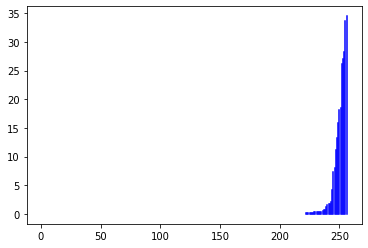

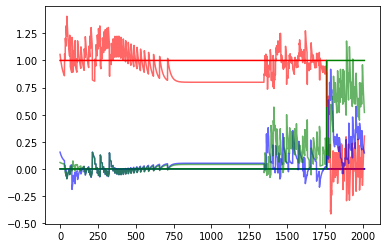

 16%|█████████████████████████                                                                                                                                  | 484/3000 [3:00:20<13:59:19, 20.02s/it]

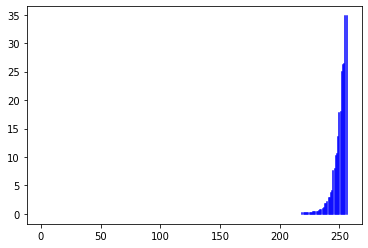

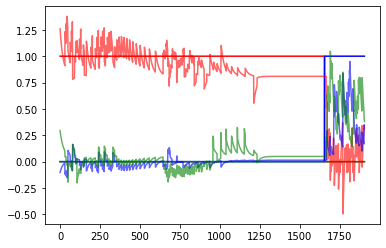

 16%|█████████████████████████▎                                                                                                                                 | 489/3000 [3:02:06<14:10:05, 20.31s/it]

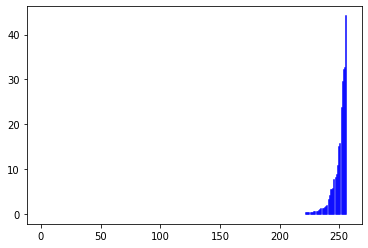

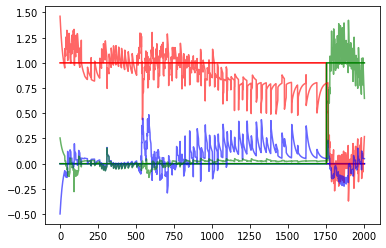

 16%|█████████████████████████▌                                                                                                                                 | 494/3000 [3:03:51<14:10:42, 20.37s/it]

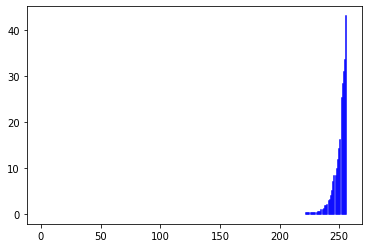

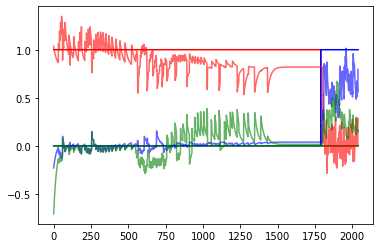

 17%|█████████████████████████▊                                                                                                                                 | 499/3000 [3:05:40<14:48:28, 21.31s/it]

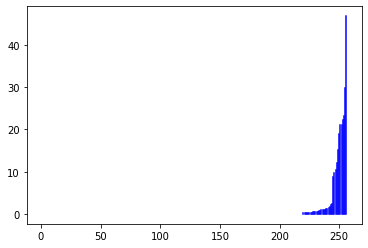

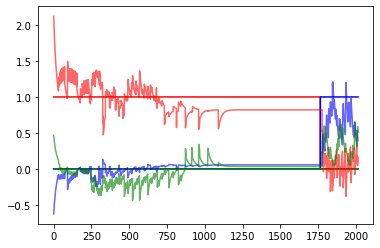

 17%|██████████████████████████                                                                                                                                 | 504/3000 [3:08:17<17:10:24, 24.77s/it]

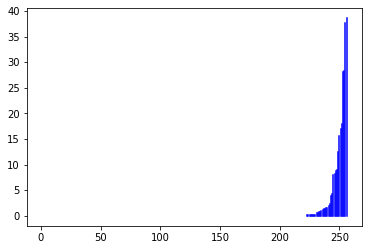

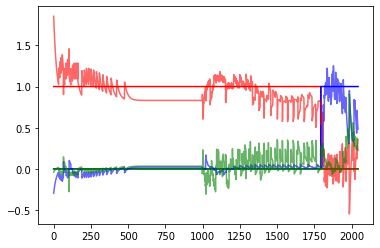

 17%|██████████████████████████▎                                                                                                                                | 509/3000 [3:10:08<15:15:34, 22.05s/it]

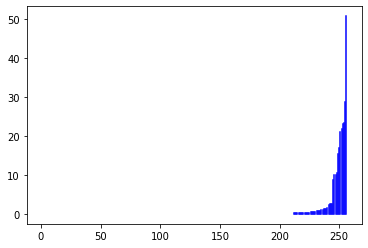

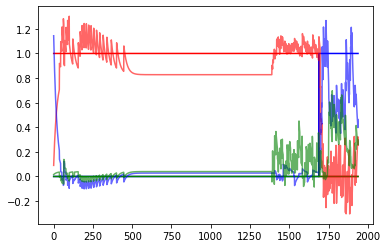

 17%|██████████████████████████▌                                                                                                                                | 514/3000 [3:11:57<14:49:18, 21.46s/it]

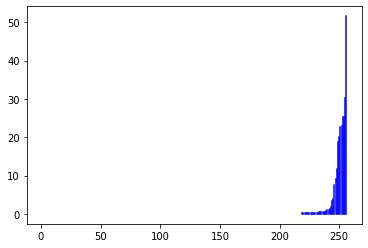

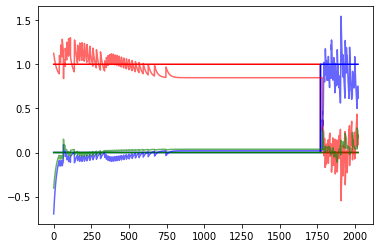

 17%|██████████████████████████▊                                                                                                                                | 519/3000 [3:13:43<14:13:40, 20.65s/it]

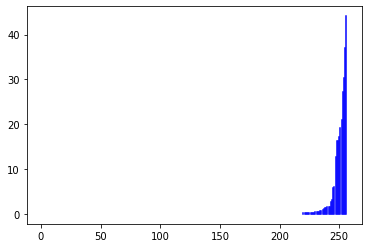

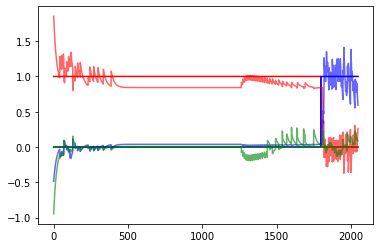

 17%|███████████████████████████                                                                                                                                | 524/3000 [3:15:28<13:56:16, 20.27s/it]

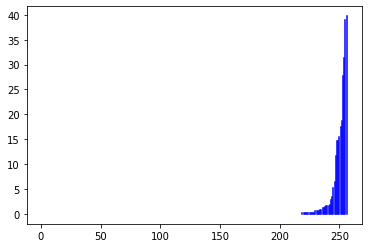

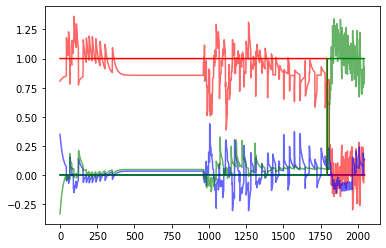

 18%|███████████████████████████▎                                                                                                                               | 529/3000 [3:17:13<14:18:53, 20.86s/it]

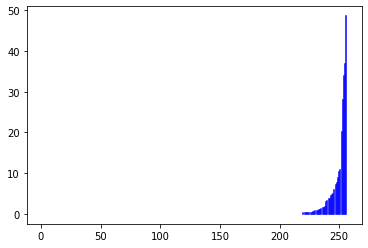

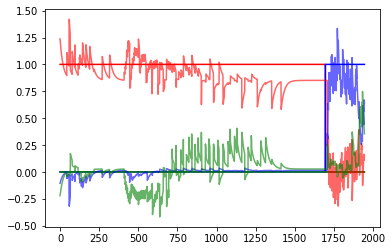

 18%|███████████████████████████▌                                                                                                                               | 534/3000 [3:18:57<13:53:22, 20.28s/it]

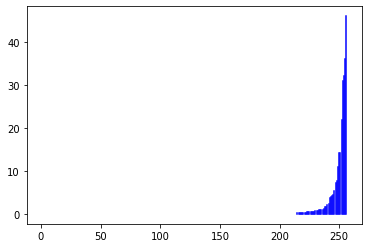

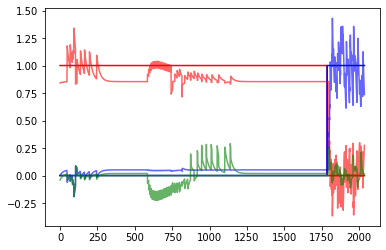

 18%|███████████████████████████▊                                                                                                                               | 539/3000 [3:20:44<14:26:13, 21.12s/it]

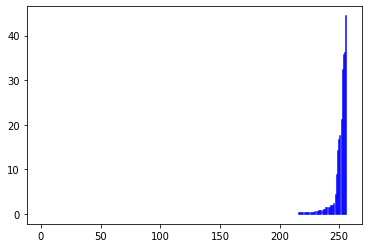

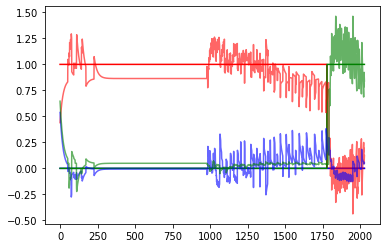

 18%|████████████████████████████                                                                                                                               | 544/3000 [3:22:29<14:01:23, 20.56s/it]

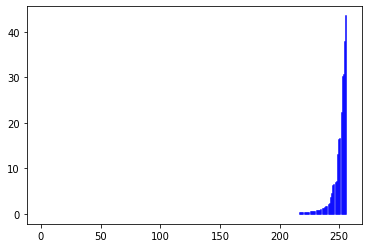

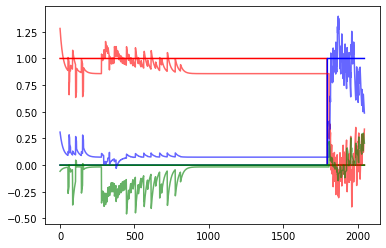

 18%|████████████████████████████▎                                                                                                                              | 549/3000 [3:24:18<14:28:56, 21.27s/it]

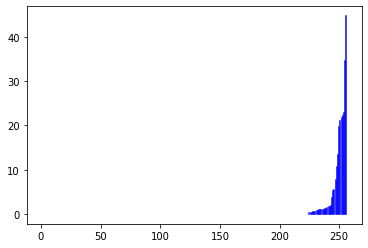

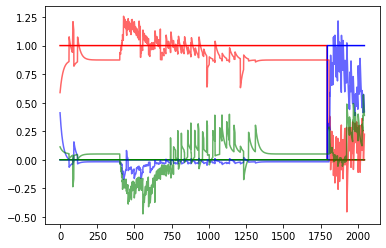

 18%|████████████████████████████▌                                                                                                                              | 554/3000 [3:26:57<16:59:27, 25.01s/it]

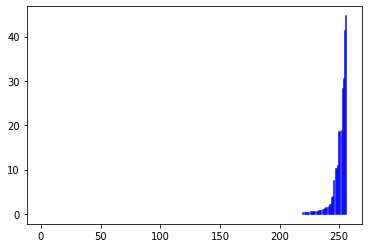

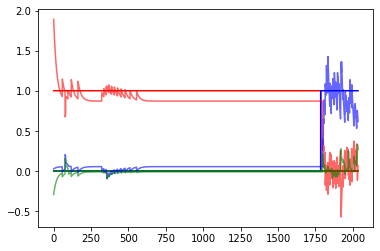

 19%|████████████████████████████▉                                                                                                                              | 559/3000 [3:28:44<14:39:26, 21.62s/it]

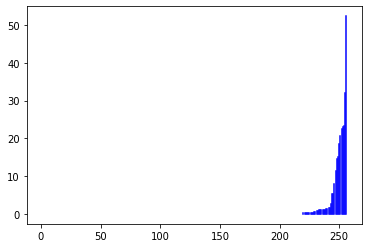

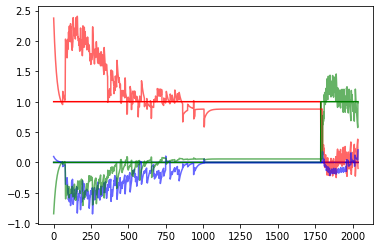

 19%|█████████████████████████████▏                                                                                                                             | 564/3000 [3:30:34<14:41:21, 21.71s/it]

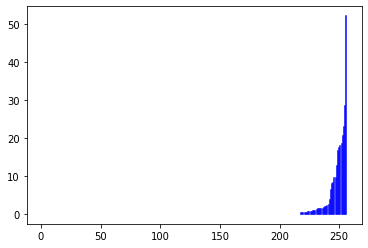

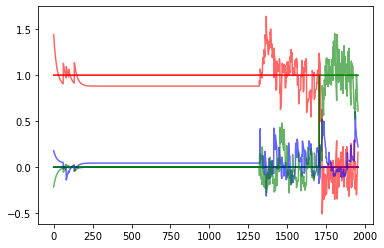

 19%|█████████████████████████████▍                                                                                                                             | 569/3000 [3:32:21<14:17:18, 21.16s/it]

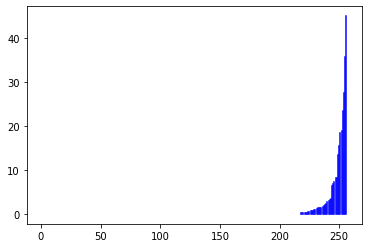

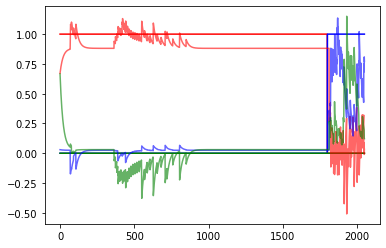

 19%|█████████████████████████████▋                                                                                                                             | 574/3000 [3:34:07<13:52:58, 20.60s/it]

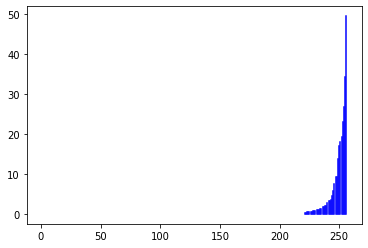

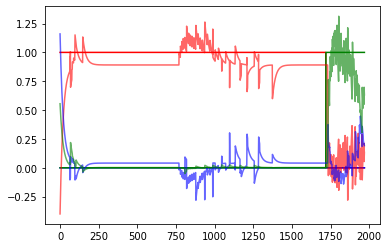

 19%|█████████████████████████████▉                                                                                                                             | 579/3000 [3:35:56<14:12:52, 21.14s/it]

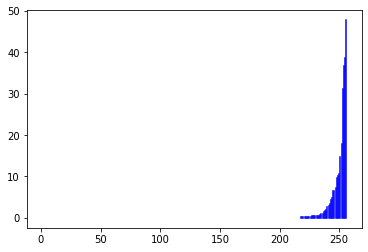

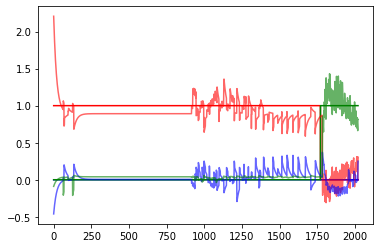

 19%|██████████████████████████████▏                                                                                                                            | 584/3000 [3:37:38<13:18:33, 19.83s/it]

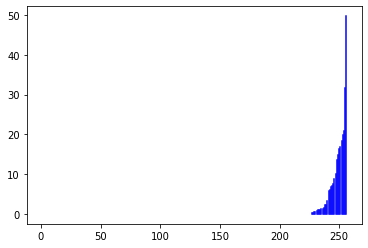

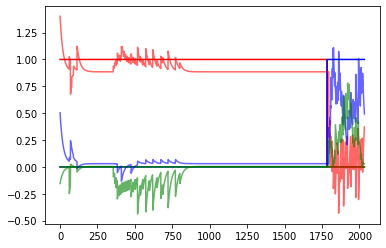

 20%|██████████████████████████████▍                                                                                                                            | 589/3000 [3:39:22<13:39:30, 20.39s/it]

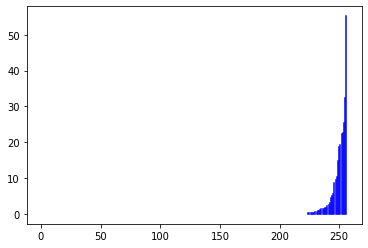

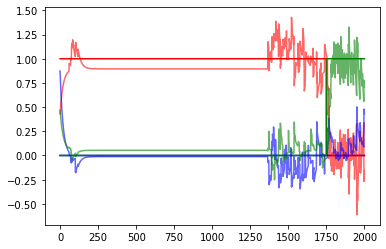

 20%|██████████████████████████████▋                                                                                                                            | 594/3000 [3:41:10<13:55:53, 20.85s/it]

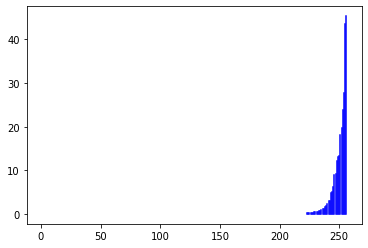

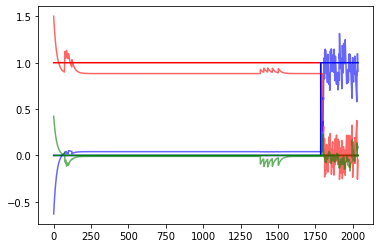

 20%|██████████████████████████████▉                                                                                                                            | 599/3000 [3:43:01<14:23:00, 21.57s/it]

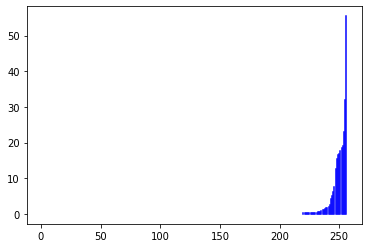

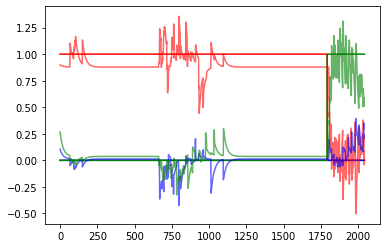

 20%|███████████████████████████████▏                                                                                                                           | 604/3000 [3:45:34<15:58:15, 24.00s/it]

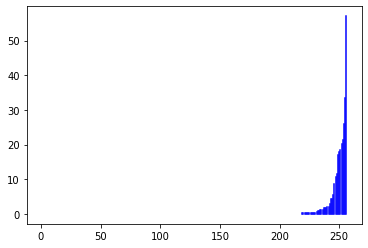

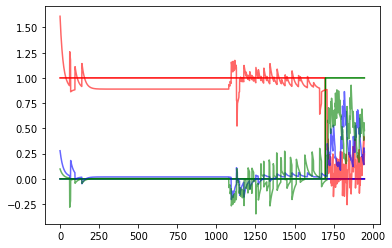

 20%|███████████████████████████████▍                                                                                                                           | 609/3000 [3:47:22<14:26:50, 21.75s/it]

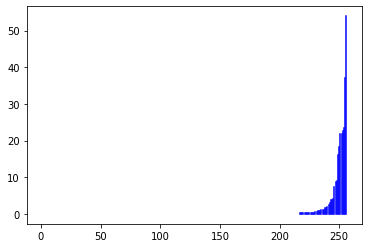

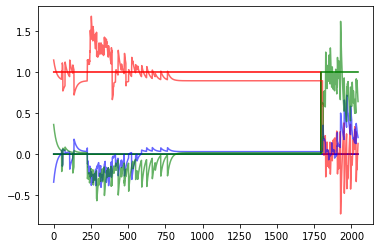

 20%|███████████████████████████████▋                                                                                                                           | 614/3000 [3:49:07<14:01:50, 21.17s/it]

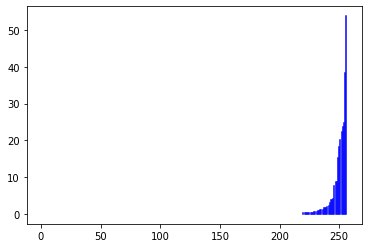

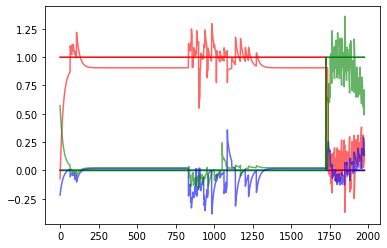

 21%|███████████████████████████████▉                                                                                                                           | 619/3000 [3:50:56<13:50:06, 20.92s/it]

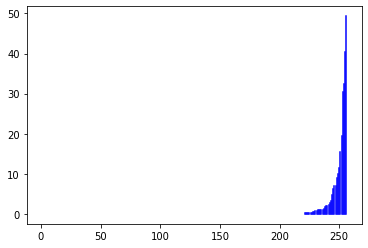

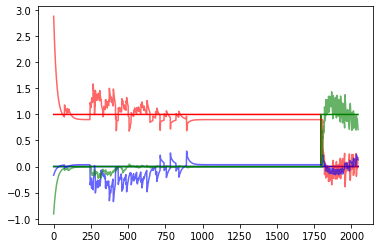

 21%|████████████████████████████████▏                                                                                                                          | 624/3000 [3:52:44<13:51:01, 20.99s/it]

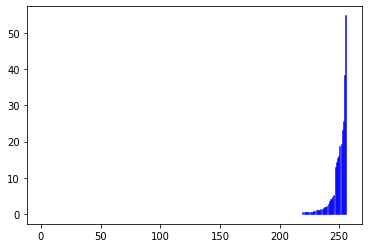

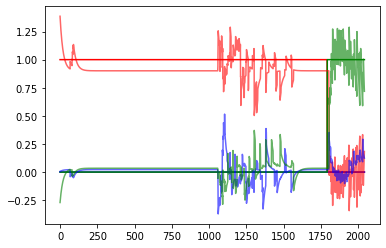

 21%|████████████████████████████████▍                                                                                                                          | 629/3000 [3:54:34<14:11:06, 21.54s/it]

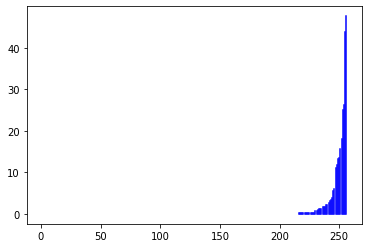

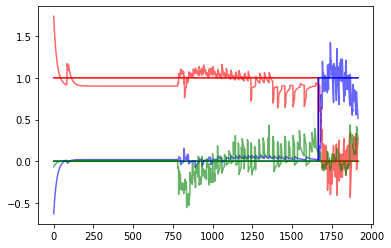

 21%|████████████████████████████████▊                                                                                                                          | 634/3000 [3:56:24<14:16:04, 21.71s/it]

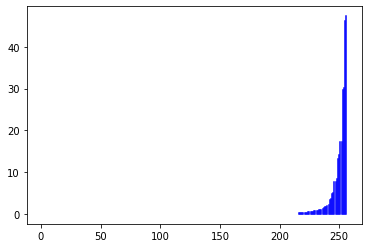

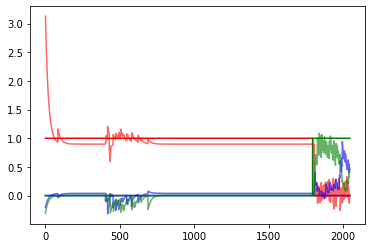

 21%|█████████████████████████████████                                                                                                                          | 639/3000 [3:58:11<13:38:02, 20.79s/it]

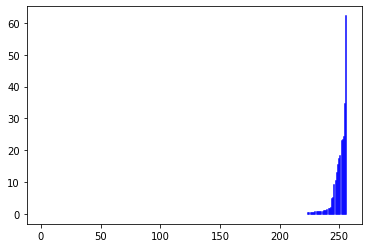

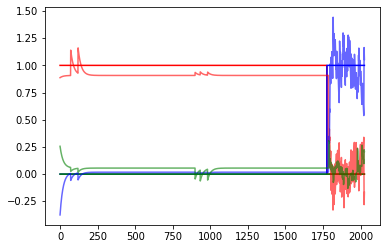

 21%|█████████████████████████████████▎                                                                                                                         | 644/3000 [4:00:01<13:58:09, 21.35s/it]

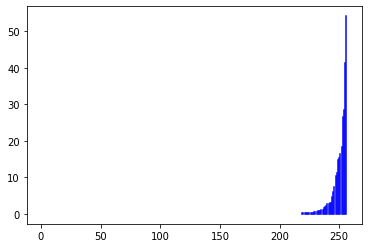

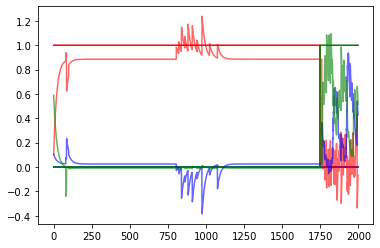

 22%|█████████████████████████████████▌                                                                                                                         | 649/3000 [4:01:47<13:34:33, 20.79s/it]

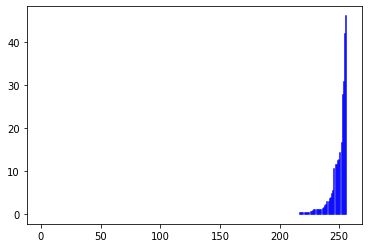

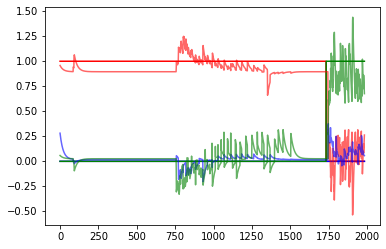

 22%|█████████████████████████████████▊                                                                                                                         | 654/3000 [4:04:21<15:51:21, 24.33s/it]

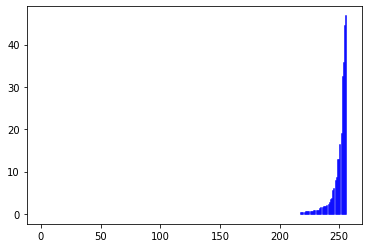

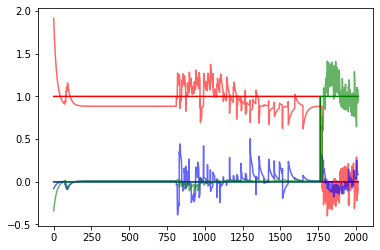

 22%|██████████████████████████████████                                                                                                                         | 659/3000 [4:06:09<14:02:45, 21.60s/it]

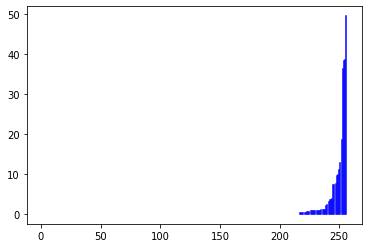

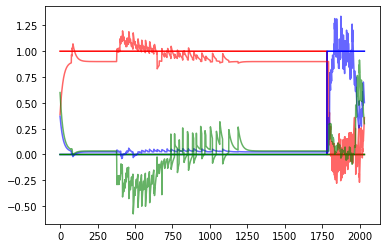

 22%|██████████████████████████████████▎                                                                                                                        | 664/3000 [4:07:55<13:20:00, 20.55s/it]

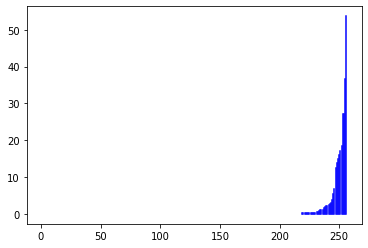

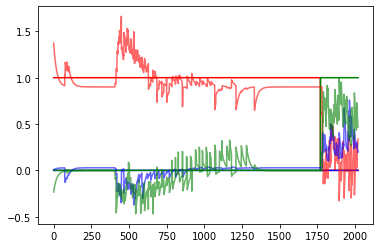

 22%|██████████████████████████████████▌                                                                                                                        | 669/3000 [4:09:47<13:56:35, 21.53s/it]

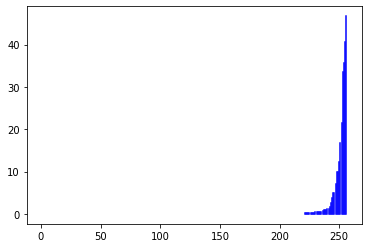

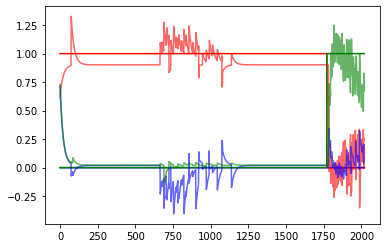

 22%|██████████████████████████████████▊                                                                                                                        | 674/3000 [4:11:28<12:43:37, 19.70s/it]

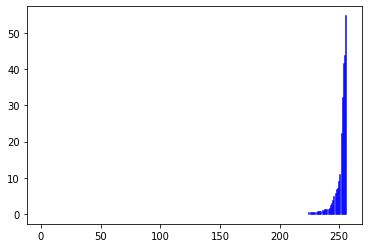

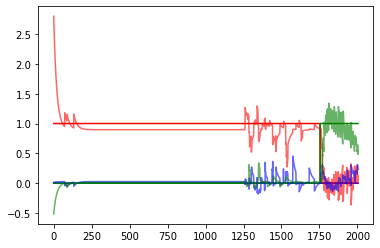

 23%|███████████████████████████████████                                                                                                                        | 679/3000 [4:13:15<13:31:36, 20.98s/it]

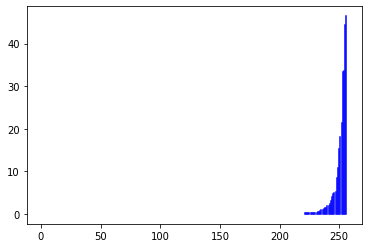

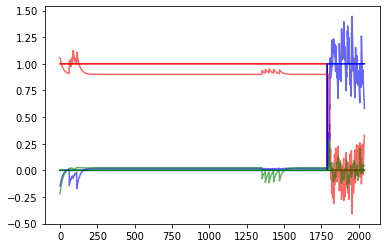

 23%|███████████████████████████████████▎                                                                                                                       | 684/3000 [4:15:05<13:42:31, 21.31s/it]

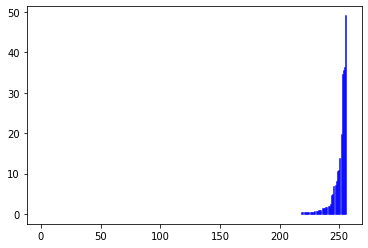

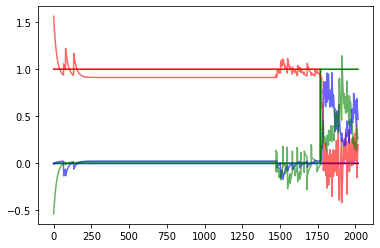

 23%|███████████████████████████████████▌                                                                                                                       | 689/3000 [4:16:53<13:36:00, 21.19s/it]

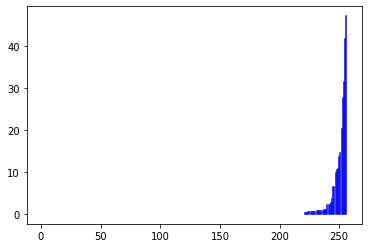

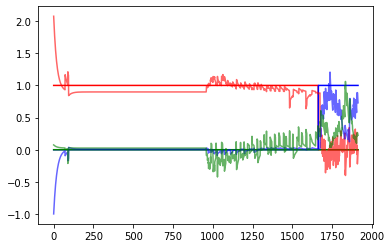

 23%|███████████████████████████████████▊                                                                                                                       | 694/3000 [4:18:43<13:50:35, 21.61s/it]

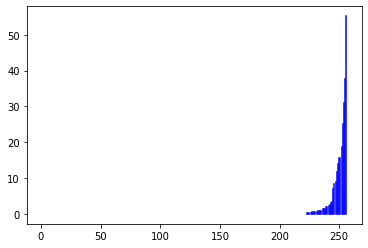

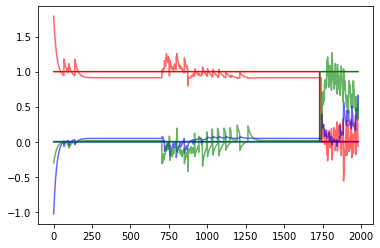

 23%|████████████████████████████████████                                                                                                                       | 699/3000 [4:20:31<13:26:26, 21.03s/it]

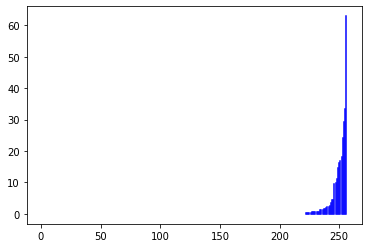

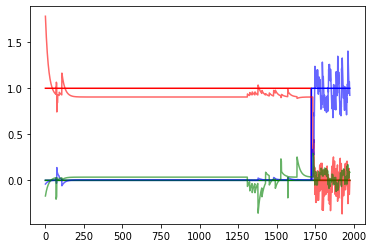

 23%|████████████████████████████████████▎                                                                                                                      | 704/3000 [4:23:05<15:10:45, 23.80s/it]

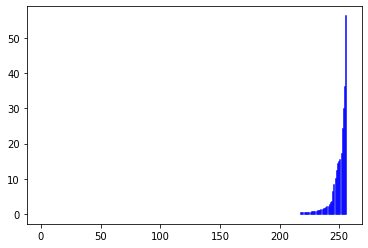

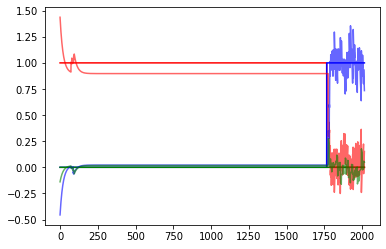

 24%|████████████████████████████████████▋                                                                                                                      | 709/3000 [4:24:51<13:27:30, 21.15s/it]

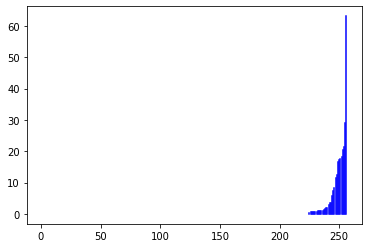

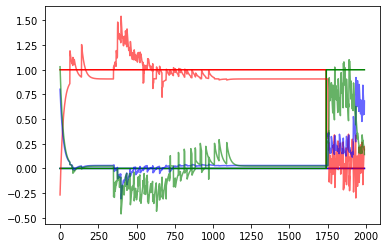

 24%|████████████████████████████████████▉                                                                                                                      | 714/3000 [4:26:36<13:17:25, 20.93s/it]

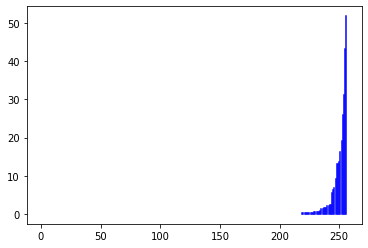

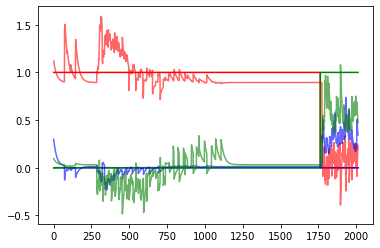

 24%|█████████████████████████████████████▏                                                                                                                     | 719/3000 [4:28:22<13:16:35, 20.95s/it]

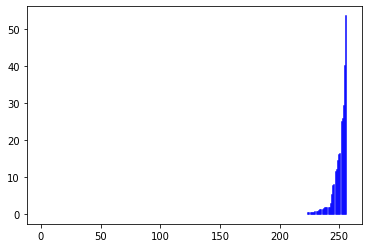

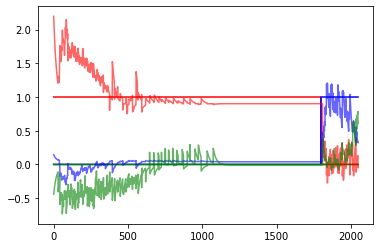

 24%|█████████████████████████████████████▍                                                                                                                     | 724/3000 [4:30:12<13:38:34, 21.58s/it]

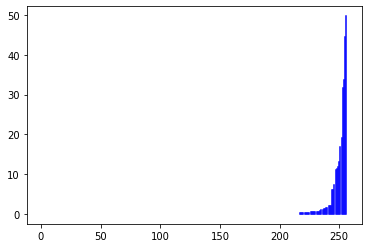

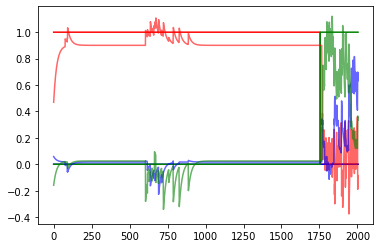

 24%|█████████████████████████████████████▋                                                                                                                     | 729/3000 [4:31:54<13:02:03, 20.66s/it]

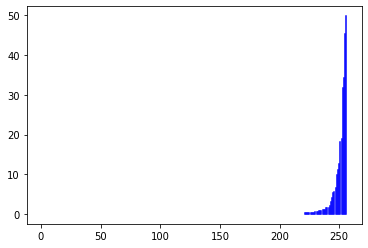

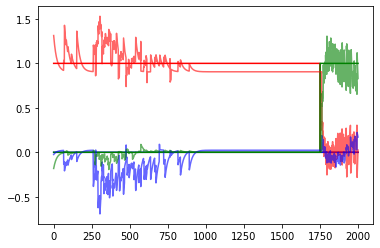

 24%|█████████████████████████████████████▉                                                                                                                     | 734/3000 [4:33:37<12:42:17, 20.18s/it]

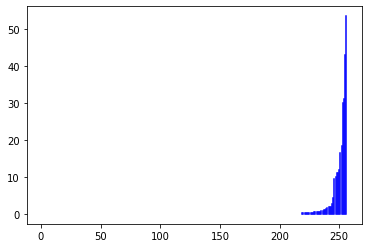

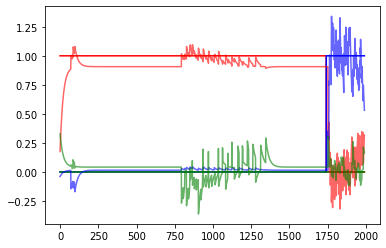

 25%|██████████████████████████████████████▏                                                                                                                    | 739/3000 [4:35:23<12:53:52, 20.54s/it]

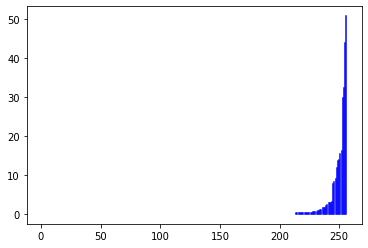

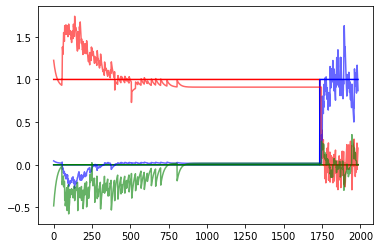

 25%|██████████████████████████████████████▍                                                                                                                    | 744/3000 [4:37:08<13:13:54, 21.11s/it]

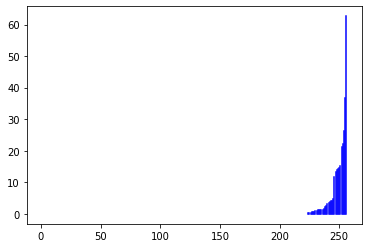

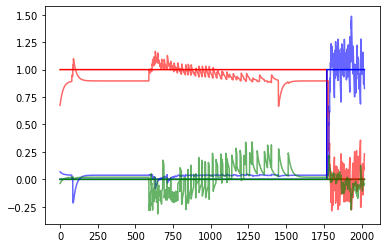

 25%|██████████████████████████████████████▋                                                                                                                    | 749/3000 [4:38:55<12:51:28, 20.56s/it]

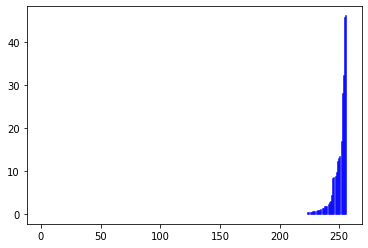

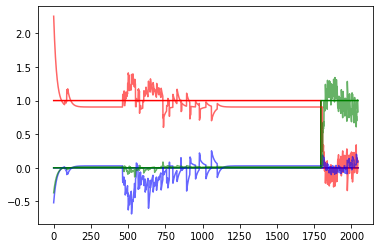

 25%|██████████████████████████████████████▉                                                                                                                    | 754/3000 [4:41:30<14:59:51, 24.04s/it]

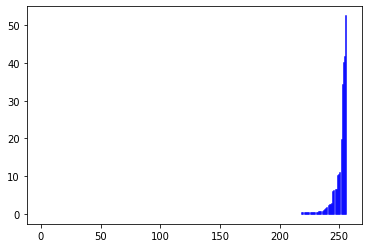

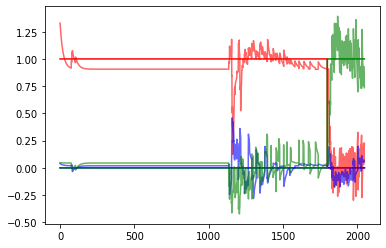

 25%|███████████████████████████████████████▏                                                                                                                   | 759/3000 [4:43:20<13:38:11, 21.91s/it]

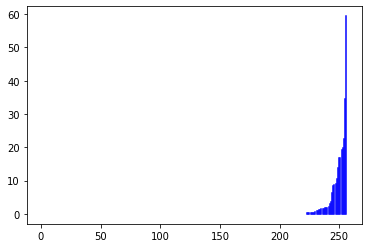

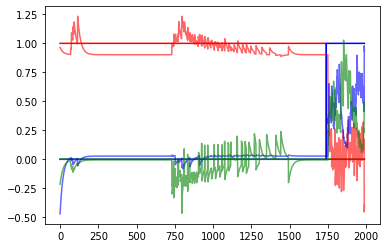

 25%|███████████████████████████████████████▍                                                                                                                   | 764/3000 [4:45:09<13:15:26, 21.34s/it]

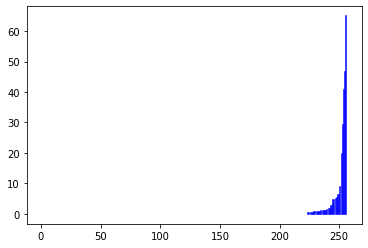

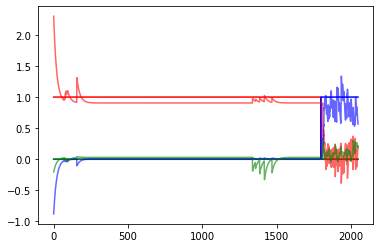

 26%|███████████████████████████████████████▋                                                                                                                   | 769/3000 [4:46:55<12:49:00, 20.68s/it]

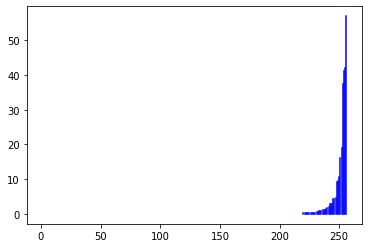

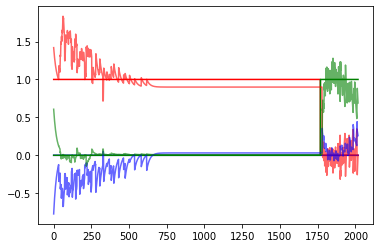

 26%|███████████████████████████████████████▉                                                                                                                   | 774/3000 [4:48:45<13:08:21, 21.25s/it]

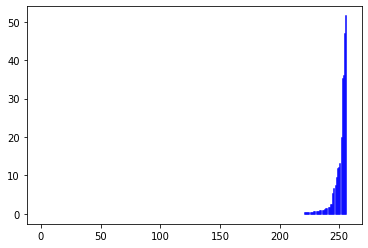

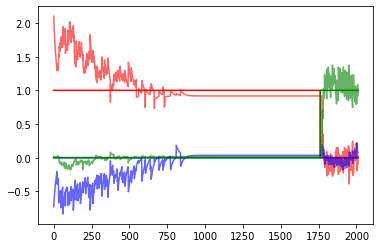

 26%|████████████████████████████████████████▏                                                                                                                  | 779/3000 [4:50:33<13:16:51, 21.53s/it]

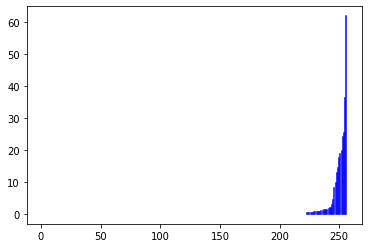

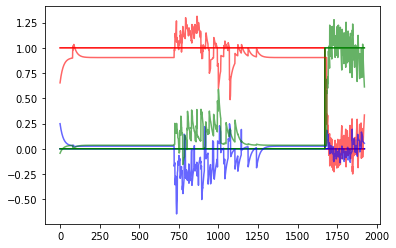

 26%|████████████████████████████████████████▌                                                                                                                  | 784/3000 [4:52:22<13:24:23, 21.78s/it]

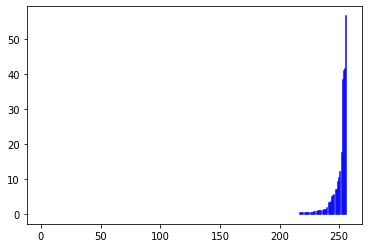

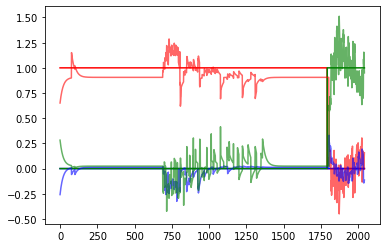

 26%|████████████████████████████████████████▊                                                                                                                  | 789/3000 [4:54:11<13:18:28, 21.67s/it]

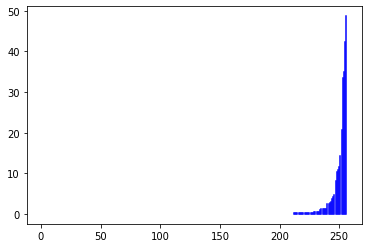

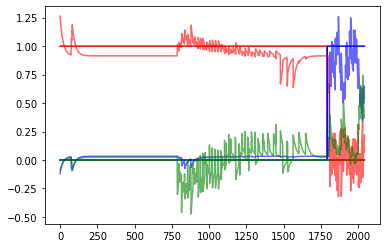

 26%|█████████████████████████████████████████                                                                                                                  | 794/3000 [4:55:57<12:40:12, 20.68s/it]

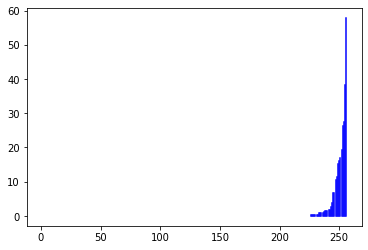

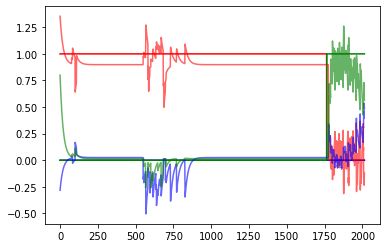

 27%|█████████████████████████████████████████▎                                                                                                                 | 799/3000 [4:57:40<12:20:14, 20.18s/it]

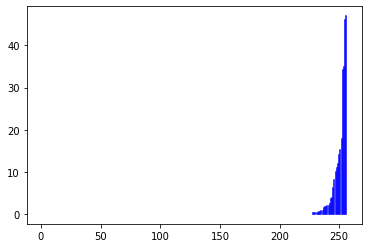

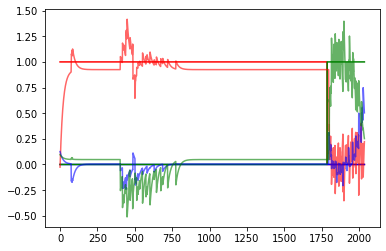

 27%|█████████████████████████████████████████▌                                                                                                                 | 804/3000 [5:00:17<14:40:44, 24.06s/it]

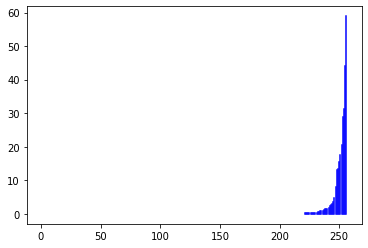

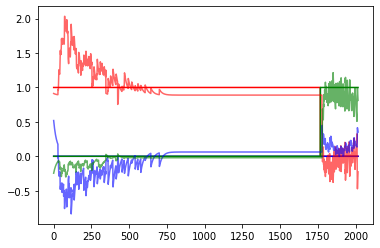

 27%|█████████████████████████████████████████▊                                                                                                                 | 809/3000 [5:02:07<13:20:34, 21.92s/it]

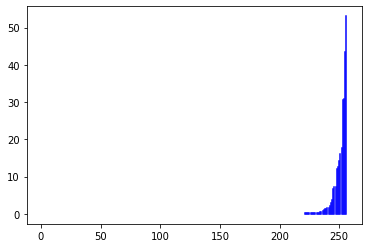

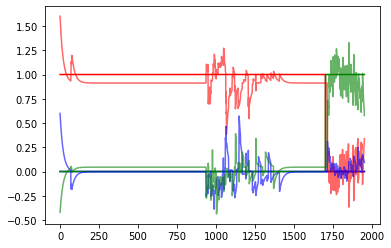

 27%|██████████████████████████████████████████                                                                                                                 | 814/3000 [5:03:55<12:54:43, 21.26s/it]

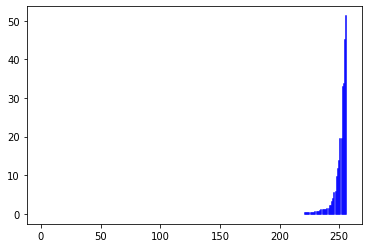

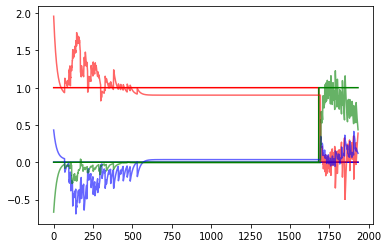

 27%|██████████████████████████████████████████▎                                                                                                                | 819/3000 [5:05:39<12:19:00, 20.33s/it]

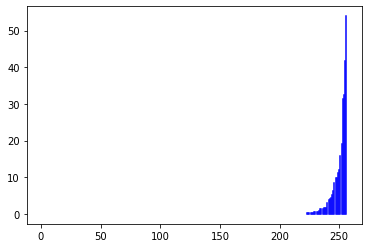

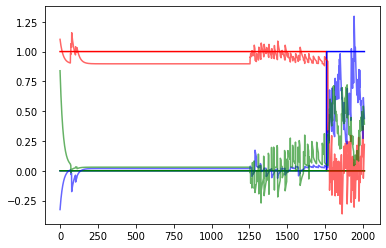

 27%|██████████████████████████████████████████▌                                                                                                                | 824/3000 [5:07:26<12:27:14, 20.60s/it]

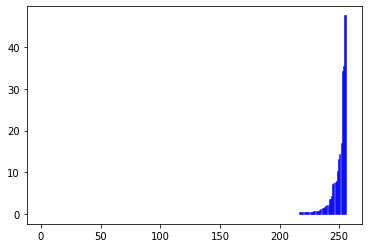

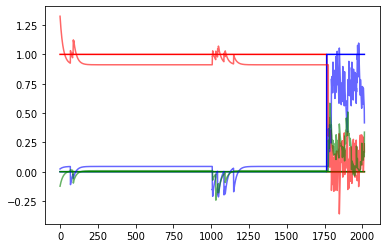

 28%|██████████████████████████████████████████▊                                                                                                                | 829/3000 [5:09:14<12:58:04, 21.50s/it]

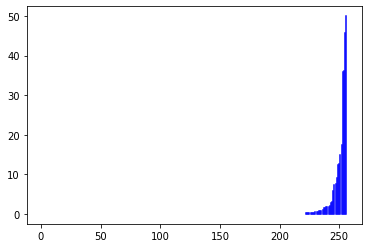

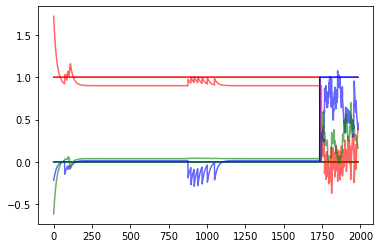

 28%|███████████████████████████████████████████                                                                                                                | 834/3000 [5:10:57<12:28:16, 20.73s/it]

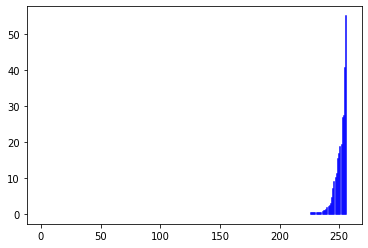

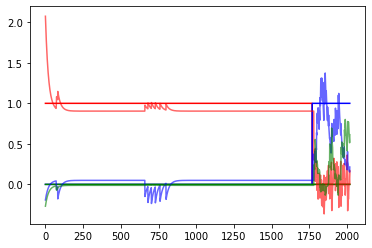

 28%|███████████████████████████████████████████▎                                                                                                               | 839/3000 [5:12:40<12:16:12, 20.44s/it]

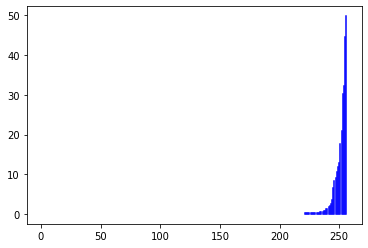

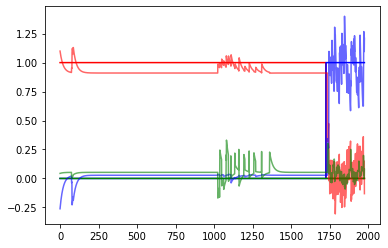

 28%|███████████████████████████████████████████▌                                                                                                               | 844/3000 [5:14:20<11:42:07, 19.54s/it]

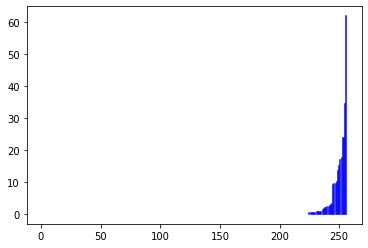

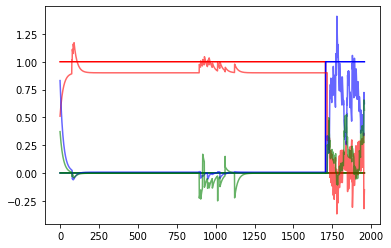

 28%|███████████████████████████████████████████▊                                                                                                               | 849/3000 [5:16:08<12:22:55, 20.72s/it]

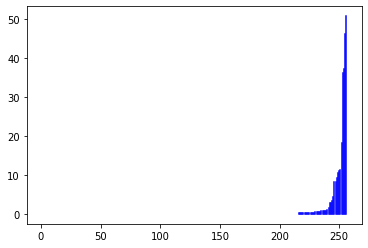

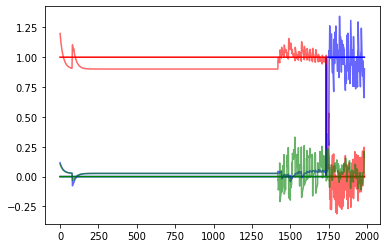

 28%|████████████████████████████████████████████                                                                                                               | 854/3000 [5:18:47<14:42:37, 24.68s/it]

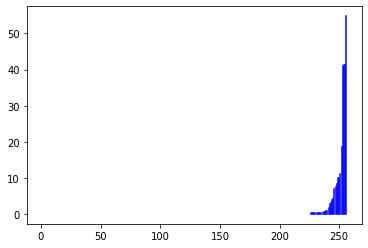

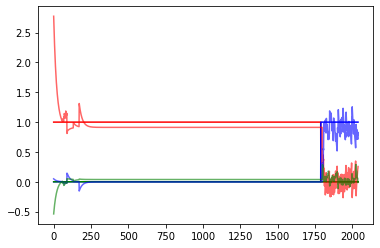

 29%|████████████████████████████████████████████▍                                                                                                              | 859/3000 [5:20:31<12:36:39, 21.20s/it]

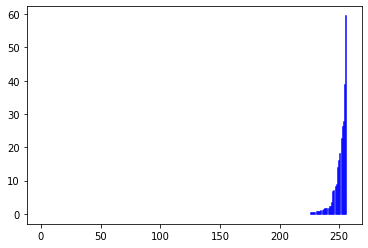

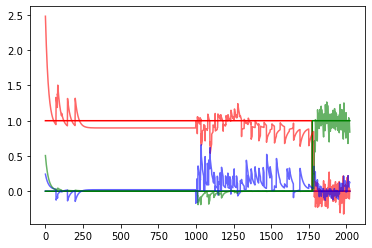

 29%|████████████████████████████████████████████▋                                                                                                              | 864/3000 [5:22:17<12:29:07, 21.04s/it]

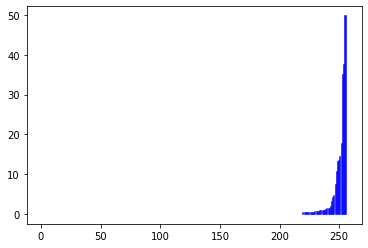

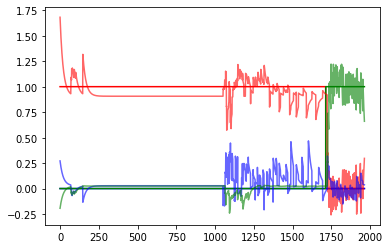

 29%|████████████████████████████████████████████▉                                                                                                              | 869/3000 [5:23:54<11:17:19, 19.07s/it]

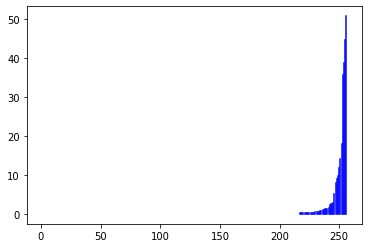

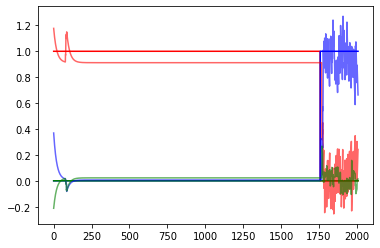

 29%|█████████████████████████████████████████████▏                                                                                                             | 874/3000 [5:25:42<12:10:26, 20.61s/it]

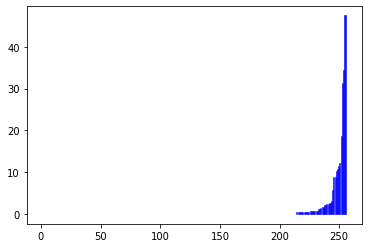

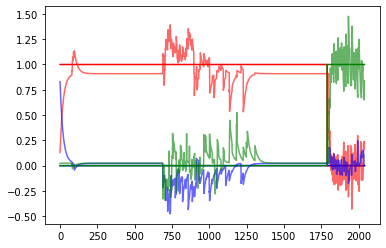

 29%|█████████████████████████████████████████████▍                                                                                                             | 879/3000 [5:27:28<12:20:22, 20.94s/it]

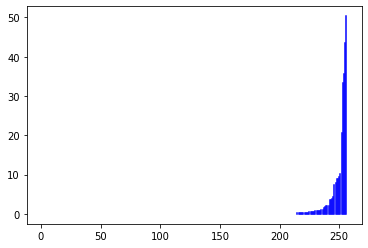

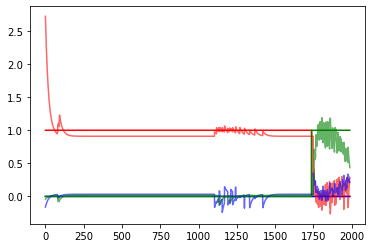

 29%|█████████████████████████████████████████████▋                                                                                                             | 884/3000 [5:29:17<12:31:11, 21.30s/it]

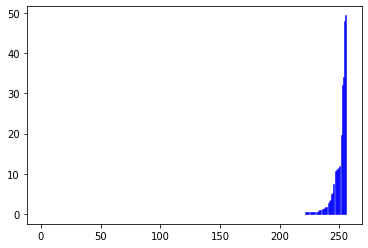

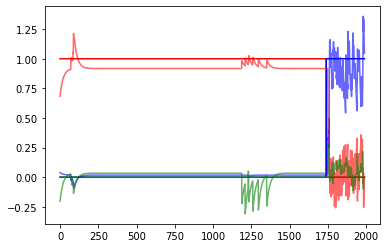

 30%|█████████████████████████████████████████████▉                                                                                                             | 889/3000 [5:31:02<12:18:45, 21.00s/it]

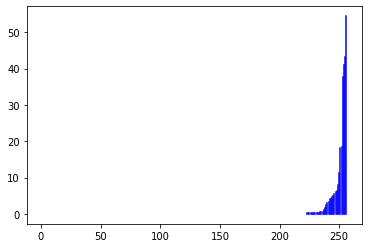

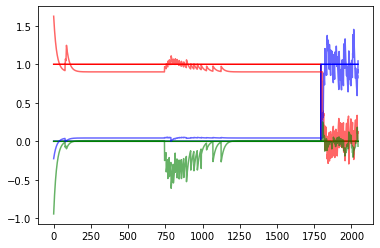

 30%|██████████████████████████████████████████████▏                                                                                                            | 894/3000 [5:32:47<12:13:38, 20.90s/it]

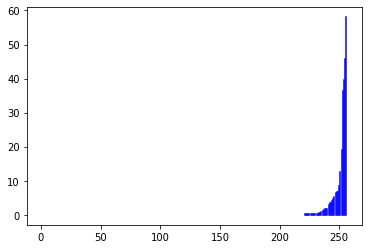

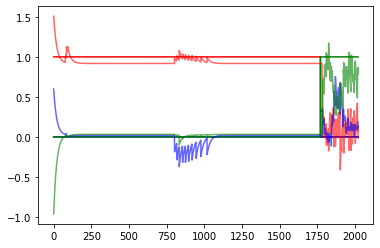

 30%|██████████████████████████████████████████████▍                                                                                                            | 899/3000 [5:34:30<11:46:23, 20.17s/it]

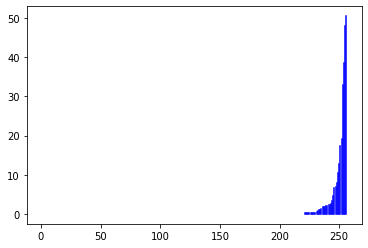

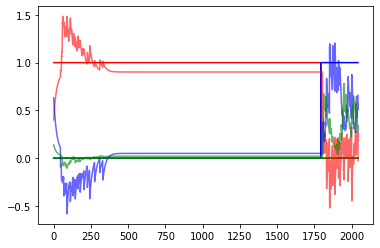

 30%|██████████████████████████████████████████████▋                                                                                                            | 904/3000 [5:37:03<14:10:02, 24.33s/it]

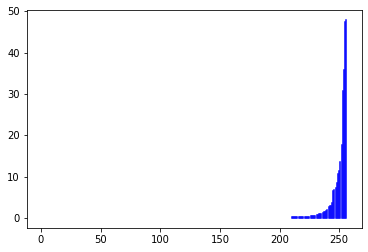

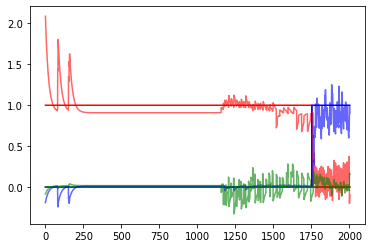

 30%|██████████████████████████████████████████████▉                                                                                                            | 909/3000 [5:38:49<12:11:17, 20.98s/it]

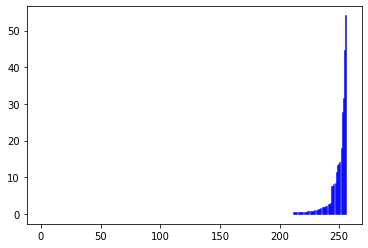

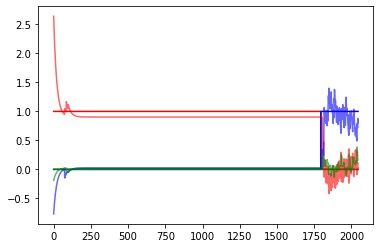

 30%|███████████████████████████████████████████████▏                                                                                                           | 914/3000 [5:40:39<12:22:27, 21.36s/it]

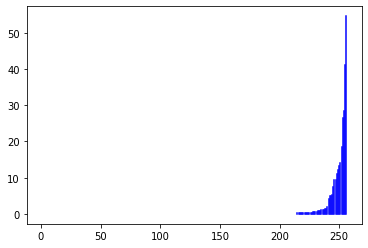

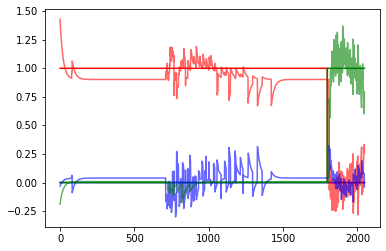

 31%|███████████████████████████████████████████████▍                                                                                                           | 919/3000 [5:42:29<12:26:29, 21.52s/it]

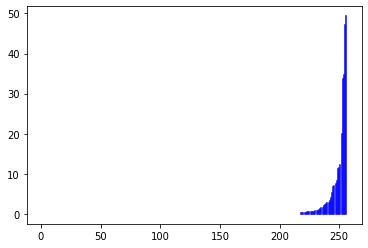

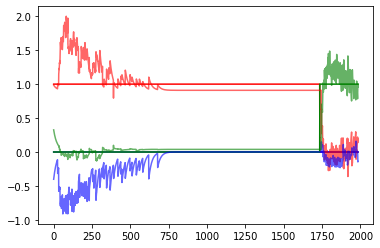

 31%|███████████████████████████████████████████████▋                                                                                                           | 924/3000 [5:44:17<11:57:40, 20.74s/it]

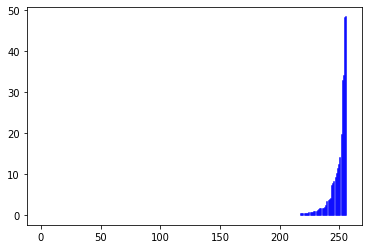

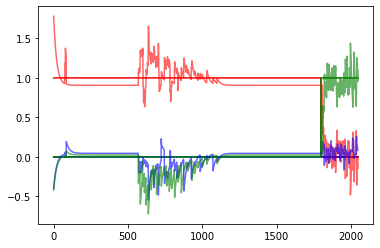

 31%|███████████████████████████████████████████████▉                                                                                                           | 929/3000 [5:46:00<11:44:43, 20.42s/it]

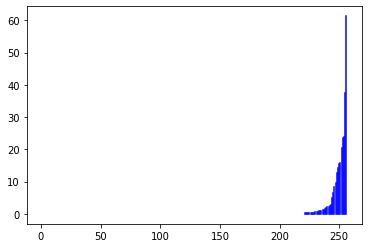

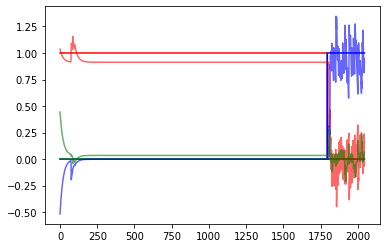

 31%|████████████████████████████████████████████████▎                                                                                                          | 934/3000 [5:47:48<12:06:00, 21.08s/it]

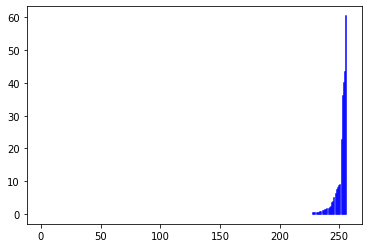

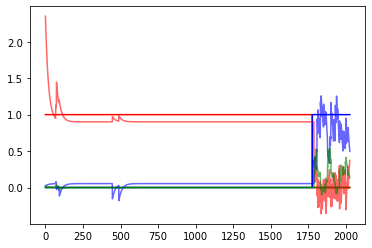

 31%|████████████████████████████████████████████████▌                                                                                                          | 939/3000 [5:49:30<11:38:25, 20.33s/it]

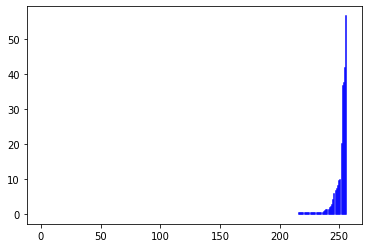

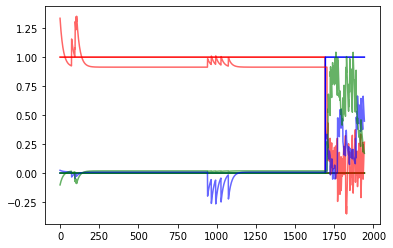

 31%|████████████████████████████████████████████████▊                                                                                                          | 944/3000 [5:51:19<11:52:58, 20.81s/it]

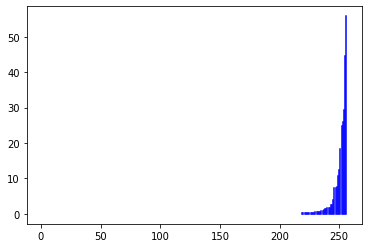

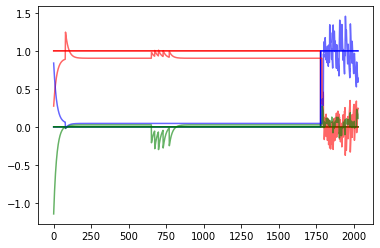

 32%|█████████████████████████████████████████████████                                                                                                          | 949/3000 [5:53:05<11:51:23, 20.81s/it]

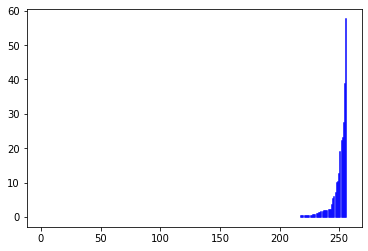

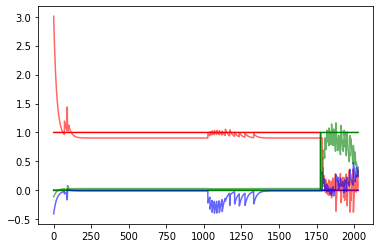

 32%|█████████████████████████████████████████████████▎                                                                                                         | 954/3000 [5:55:42<13:52:19, 24.41s/it]

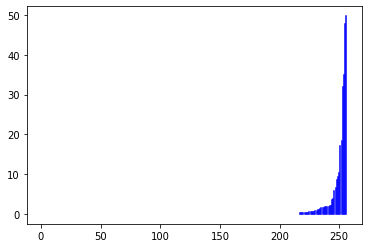

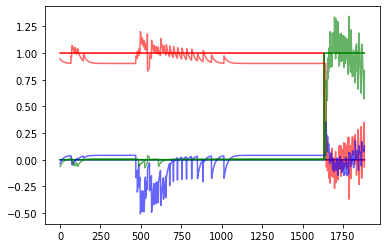

 32%|█████████████████████████████████████████████████▌                                                                                                         | 959/3000 [5:57:31<12:19:59, 21.75s/it]

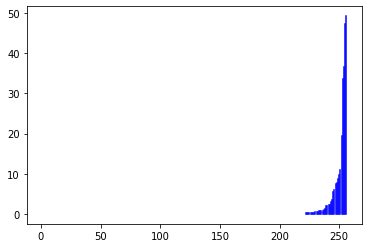

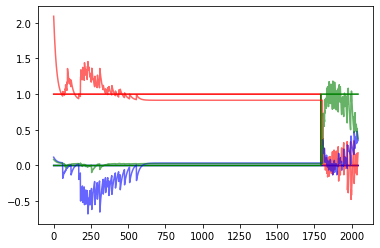

 32%|█████████████████████████████████████████████████▊                                                                                                         | 964/3000 [5:59:18<11:38:43, 20.59s/it]

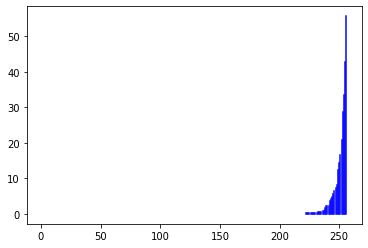

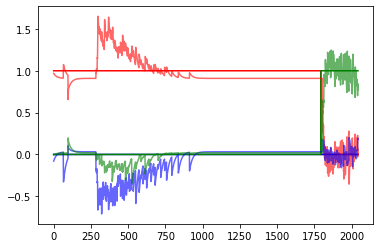

 32%|██████████████████████████████████████████████████                                                                                                         | 969/3000 [6:01:02<11:32:20, 20.45s/it]

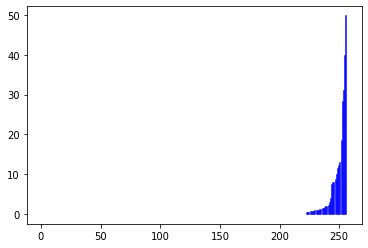

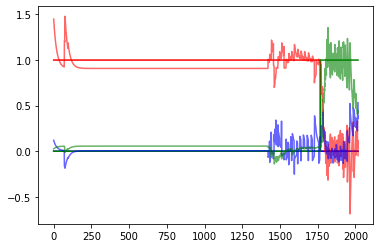

 32%|██████████████████████████████████████████████████▎                                                                                                        | 974/3000 [6:02:47<11:34:39, 20.57s/it]

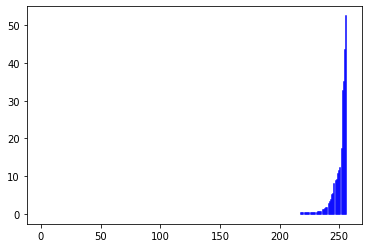

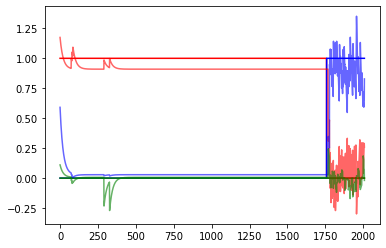

 33%|██████████████████████████████████████████████████▌                                                                                                        | 979/3000 [6:04:30<11:23:53, 20.30s/it]

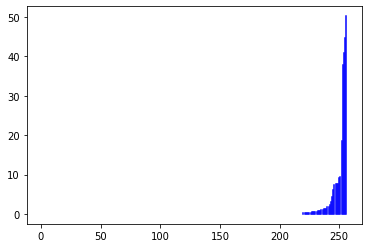

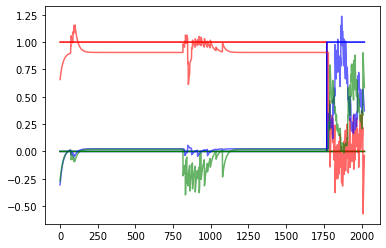

 33%|██████████████████████████████████████████████████▊                                                                                                        | 984/3000 [6:06:13<11:20:16, 20.25s/it]

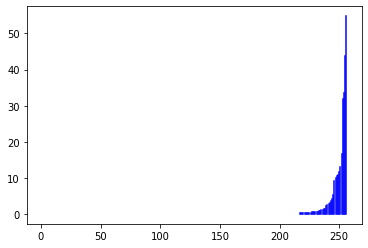

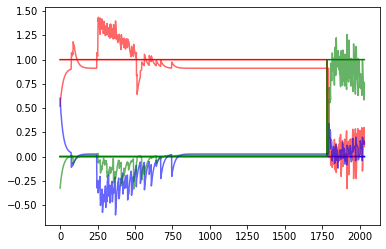

 33%|███████████████████████████████████████████████████                                                                                                        | 989/3000 [6:08:01<11:37:08, 20.80s/it]

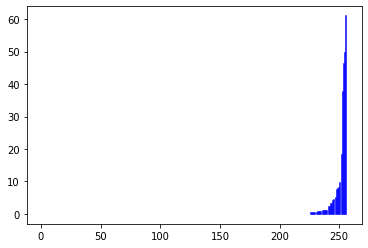

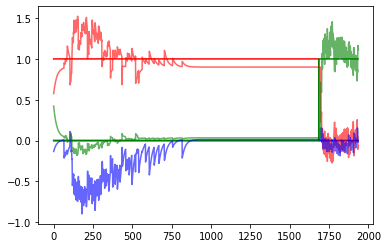

 33%|███████████████████████████████████████████████████▎                                                                                                       | 994/3000 [6:09:47<11:39:41, 20.93s/it]

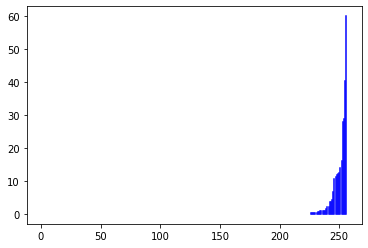

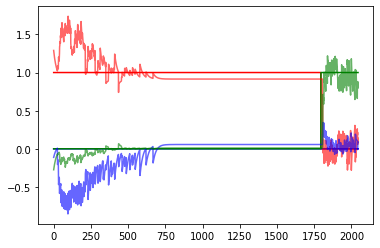

 33%|███████████████████████████████████████████████████▌                                                                                                       | 999/3000 [6:11:33<11:46:19, 21.18s/it]

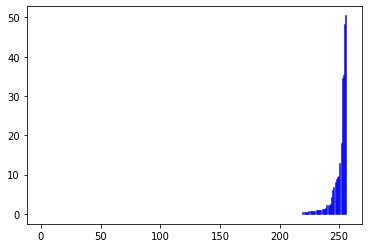

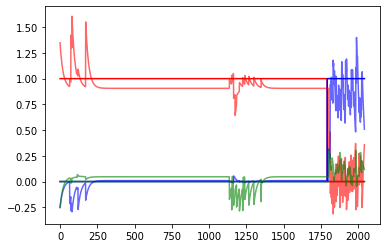

 33%|███████████████████████████████████████████████████▌                                                                                                      | 1004/3000 [6:14:11<13:40:31, 24.67s/it]

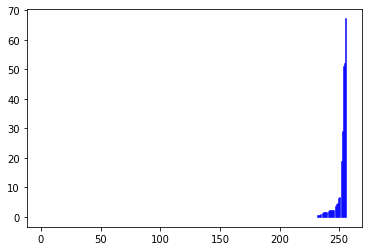

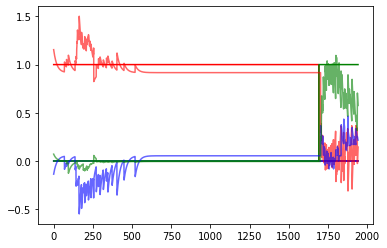

 34%|███████████████████████████████████████████████████▊                                                                                                      | 1009/3000 [6:16:02<12:17:10, 22.22s/it]

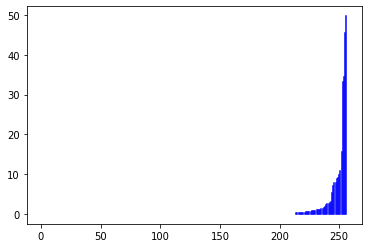

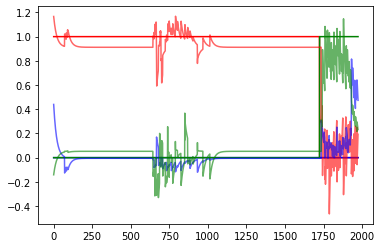

 34%|████████████████████████████████████████████████████                                                                                                      | 1014/3000 [6:17:50<11:41:43, 21.20s/it]

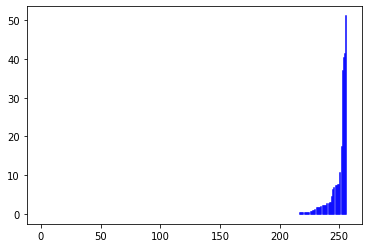

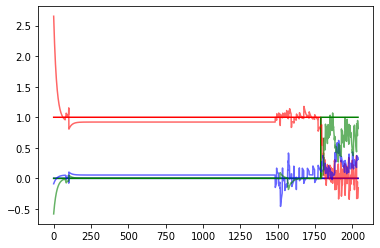

 34%|████████████████████████████████████████████████████▎                                                                                                     | 1019/3000 [6:19:38<11:37:45, 21.13s/it]

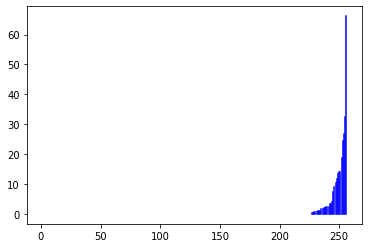

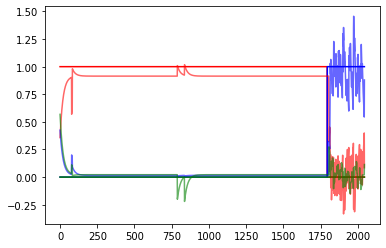

 34%|████████████████████████████████████████████████████▌                                                                                                     | 1024/3000 [6:21:24<11:38:18, 21.20s/it]

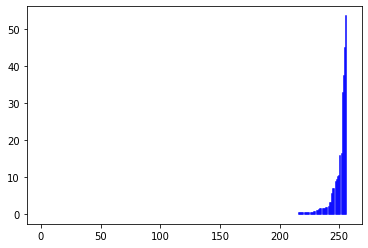

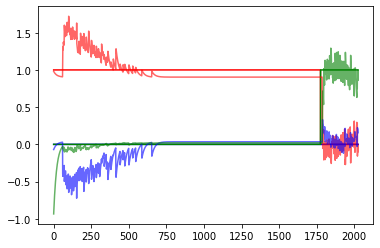

 34%|████████████████████████████████████████████████████▊                                                                                                     | 1029/3000 [6:23:10<11:14:41, 20.54s/it]

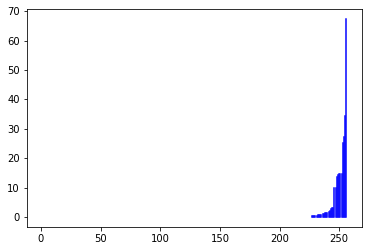

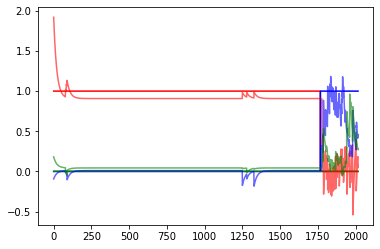

 34%|█████████████████████████████████████████████████████                                                                                                     | 1034/3000 [6:25:03<11:58:55, 21.94s/it]

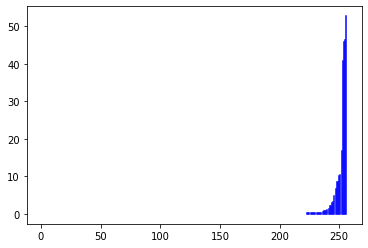

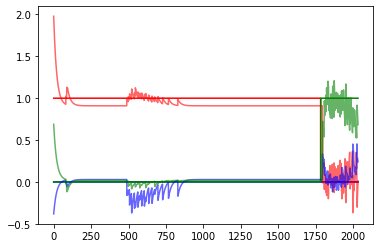

 35%|█████████████████████████████████████████████████████▎                                                                                                    | 1039/3000 [6:26:47<11:31:05, 21.14s/it]

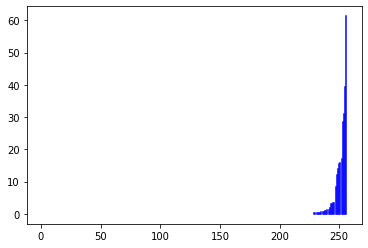

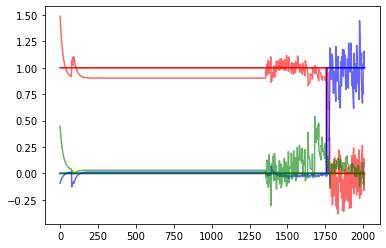

 35%|█████████████████████████████████████████████████████▌                                                                                                    | 1044/3000 [6:28:37<11:33:08, 21.26s/it]

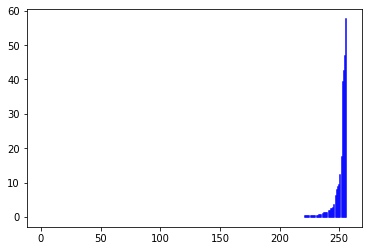

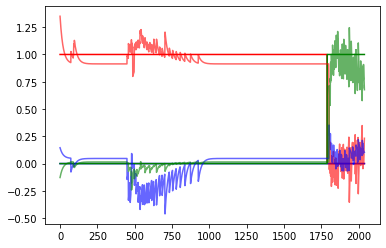

 35%|█████████████████████████████████████████████████████▊                                                                                                    | 1049/3000 [6:30:23<11:18:16, 20.86s/it]

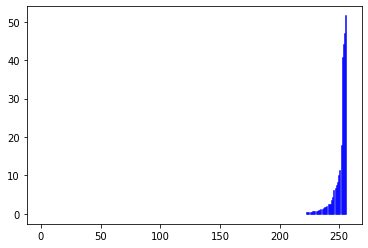

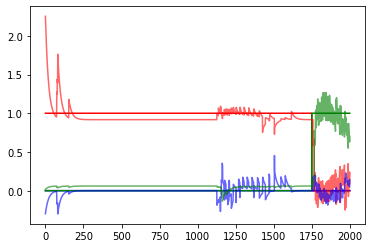

 35%|██████████████████████████████████████████████████████                                                                                                    | 1054/3000 [6:33:01<13:23:35, 24.78s/it]

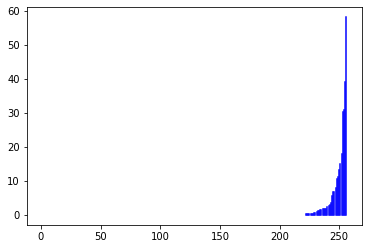

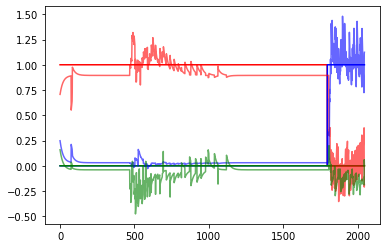

 35%|██████████████████████████████████████████████████████▎                                                                                                   | 1059/3000 [6:34:51<11:59:01, 22.23s/it]

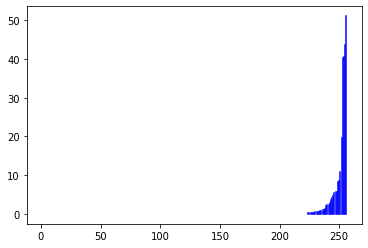

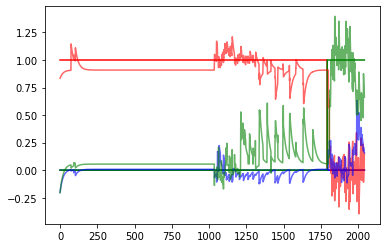

 35%|██████████████████████████████████████████████████████▌                                                                                                   | 1064/3000 [6:36:41<11:34:46, 21.53s/it]

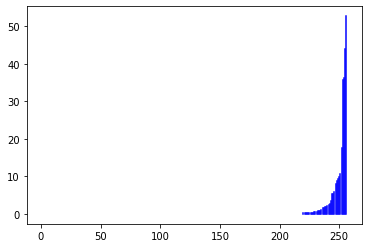

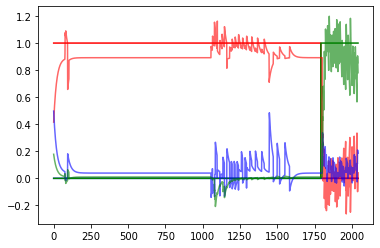

 36%|██████████████████████████████████████████████████████▉                                                                                                   | 1069/3000 [6:38:31<11:28:28, 21.39s/it]

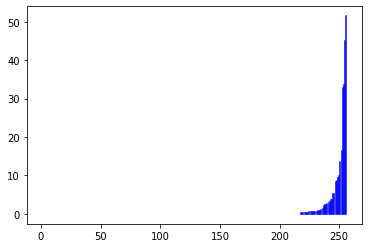

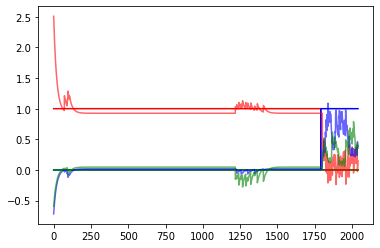

 36%|███████████████████████████████████████████████████████▏                                                                                                  | 1074/3000 [6:40:21<11:28:34, 21.45s/it]

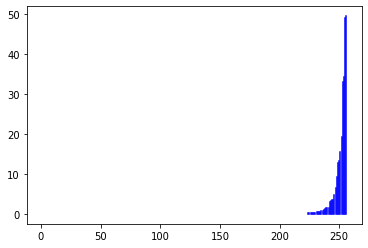

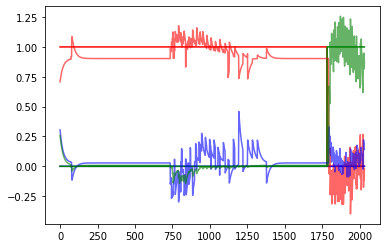

 36%|███████████████████████████████████████████████████████▍                                                                                                  | 1079/3000 [6:42:12<11:32:04, 21.62s/it]

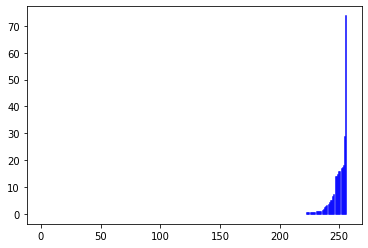

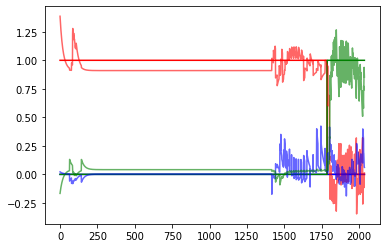

 36%|███████████████████████████████████████████████████████▋                                                                                                  | 1084/3000 [6:44:00<11:18:02, 21.23s/it]

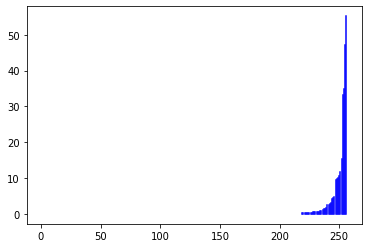

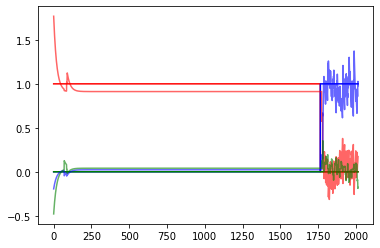

 36%|███████████████████████████████████████████████████████▉                                                                                                  | 1089/3000 [6:45:49<11:17:20, 21.27s/it]

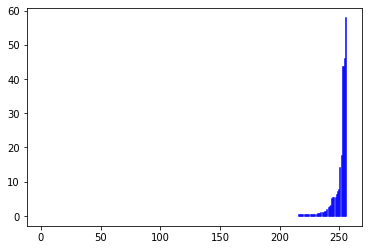

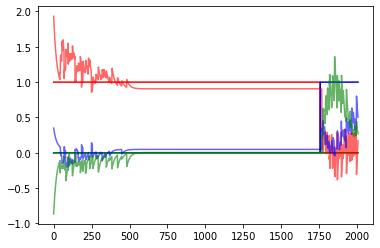

 36%|████████████████████████████████████████████████████████▏                                                                                                 | 1094/3000 [6:47:37<11:11:55, 21.15s/it]

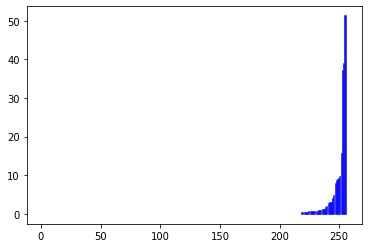

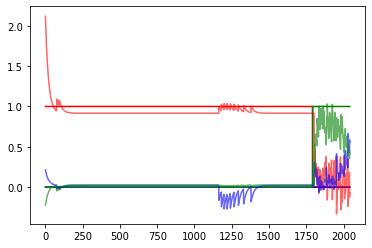

 37%|████████████████████████████████████████████████████████▍                                                                                                 | 1099/3000 [6:49:25<11:01:36, 20.88s/it]

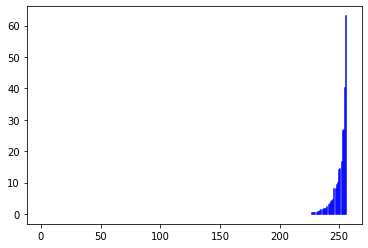

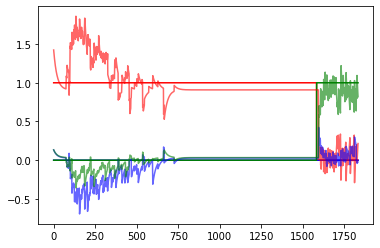

 37%|████████████████████████████████████████████████████████▋                                                                                                 | 1104/3000 [6:52:02<13:12:20, 25.07s/it]

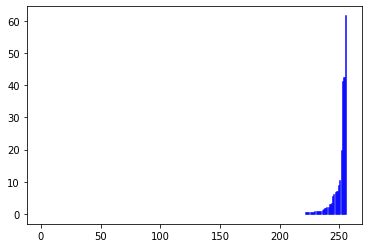

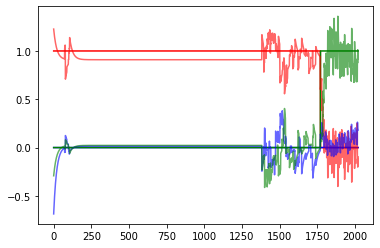

 37%|████████████████████████████████████████████████████████▉                                                                                                 | 1109/3000 [6:53:51<11:33:14, 22.00s/it]

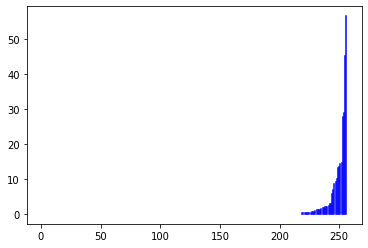

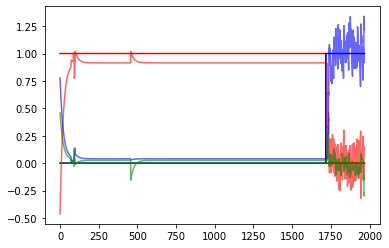

 37%|█████████████████████████████████████████████████████████▏                                                                                                | 1114/3000 [6:55:35<10:47:01, 20.58s/it]

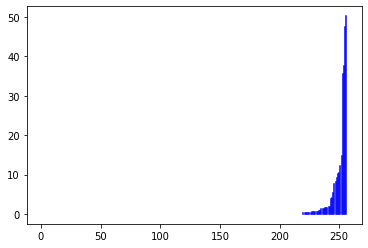

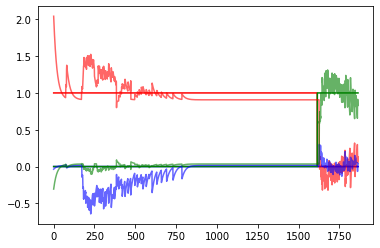

 37%|█████████████████████████████████████████████████████████▍                                                                                                | 1119/3000 [6:57:22<10:42:43, 20.50s/it]

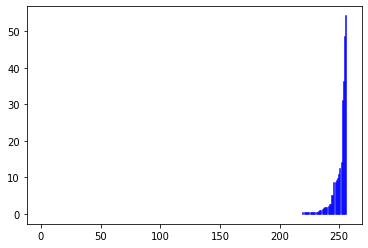

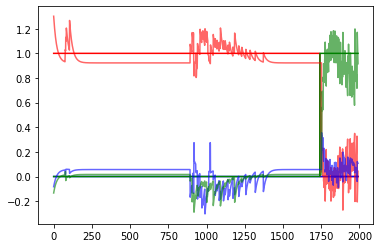

 37%|█████████████████████████████████████████████████████████▋                                                                                                | 1124/3000 [6:59:05<10:31:32, 20.20s/it]

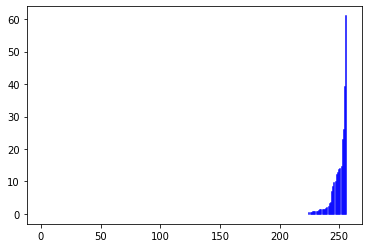

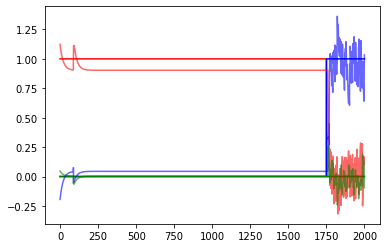

 38%|█████████████████████████████████████████████████████████▉                                                                                                | 1129/3000 [7:00:51<10:48:24, 20.79s/it]

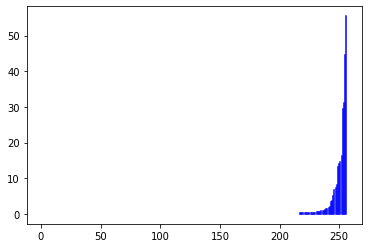

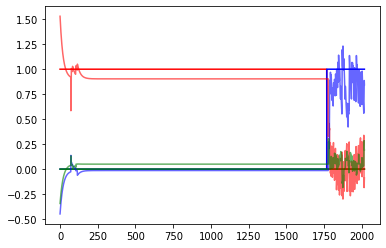

 38%|██████████████████████████████████████████████████████████▏                                                                                               | 1134/3000 [7:02:39<10:47:29, 20.82s/it]

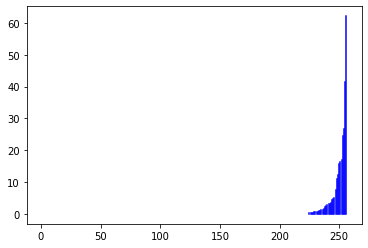

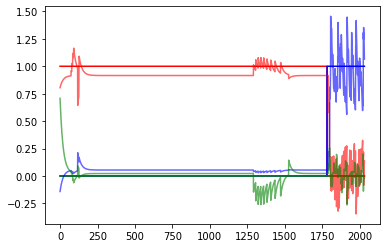

 38%|██████████████████████████████████████████████████████████▍                                                                                               | 1139/3000 [7:04:27<10:44:40, 20.78s/it]

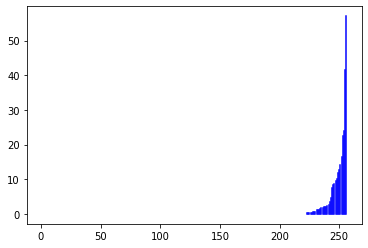

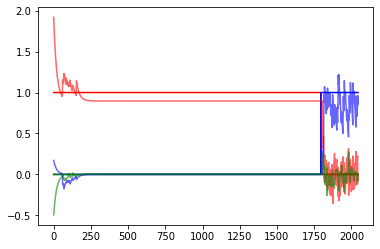

 38%|██████████████████████████████████████████████████████████▋                                                                                               | 1144/3000 [7:06:15<10:51:49, 21.07s/it]

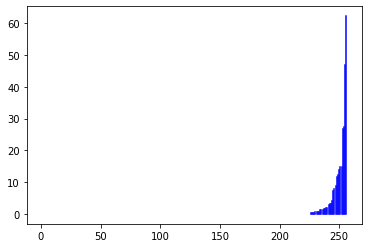

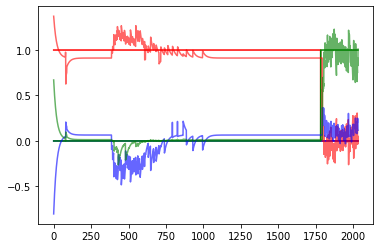

 38%|██████████████████████████████████████████████████████████▉                                                                                               | 1149/3000 [7:08:01<10:35:45, 20.61s/it]

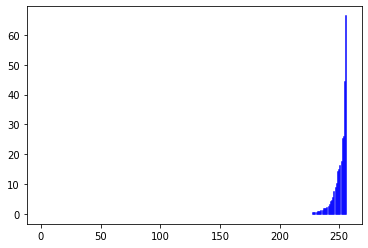

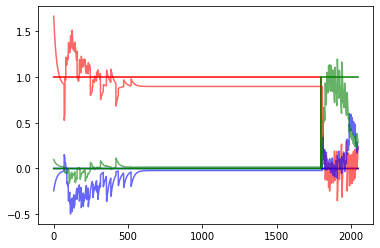

 38%|███████████████████████████████████████████████████████████▏                                                                                              | 1154/3000 [7:10:33<12:00:39, 23.42s/it]

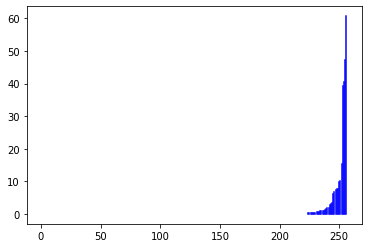

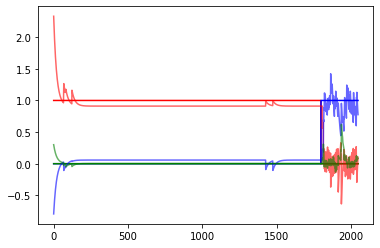

 39%|███████████████████████████████████████████████████████████▍                                                                                              | 1159/3000 [7:12:21<10:58:06, 21.45s/it]

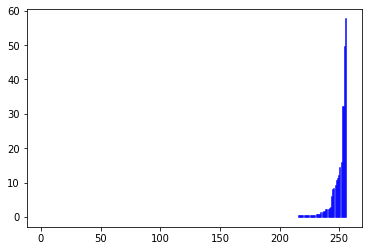

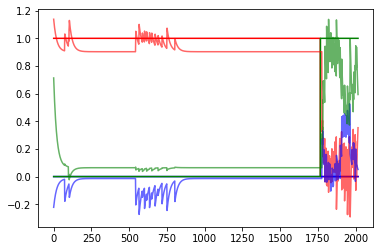

 39%|███████████████████████████████████████████████████████████▊                                                                                              | 1164/3000 [7:14:05<10:47:37, 21.16s/it]

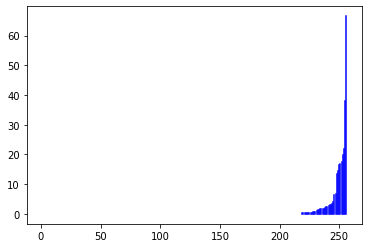

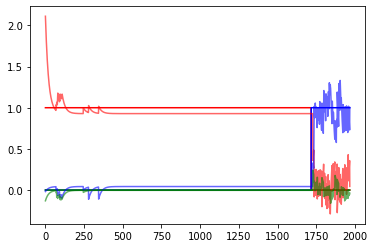

 39%|████████████████████████████████████████████████████████████                                                                                              | 1169/3000 [7:15:51<10:39:18, 20.95s/it]

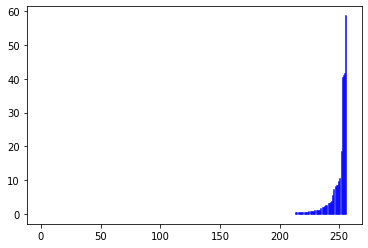

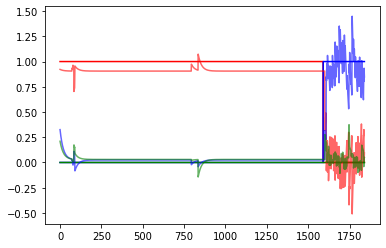

 39%|████████████████████████████████████████████████████████████▎                                                                                             | 1174/3000 [7:17:33<10:11:54, 20.11s/it]

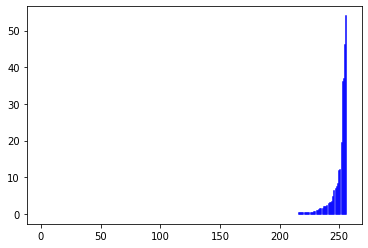

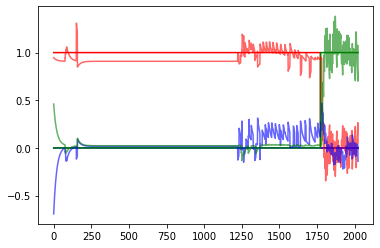

 39%|████████████████████████████████████████████████████████████▌                                                                                             | 1179/3000 [7:19:21<10:32:49, 20.85s/it]

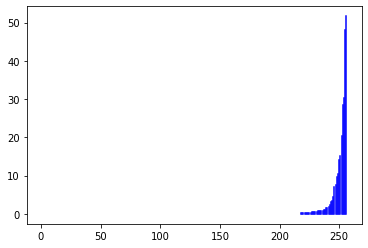

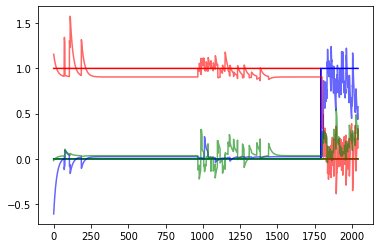

 39%|████████████████████████████████████████████████████████████▊                                                                                             | 1184/3000 [7:21:13<10:57:52, 21.74s/it]

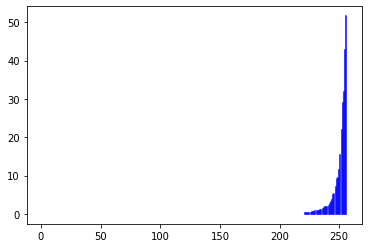

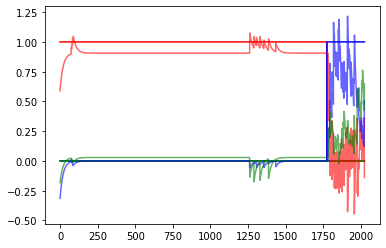

 40%|█████████████████████████████████████████████████████████████                                                                                             | 1189/3000 [7:23:03<10:45:44, 21.39s/it]

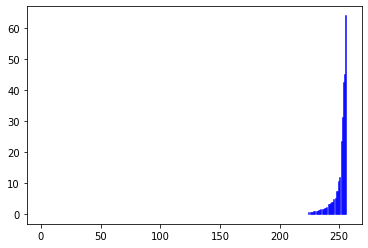

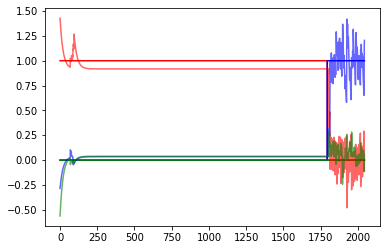

 40%|█████████████████████████████████████████████████████████████▎                                                                                            | 1194/3000 [7:24:56<11:01:34, 21.98s/it]

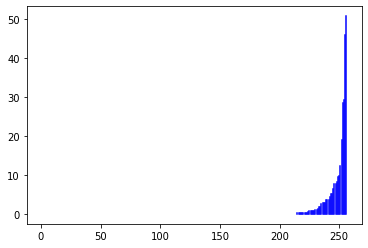

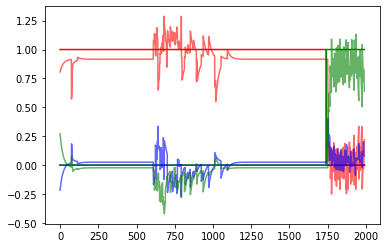

 40%|█████████████████████████████████████████████████████████████▌                                                                                            | 1199/3000 [7:26:44<10:42:39, 21.41s/it]

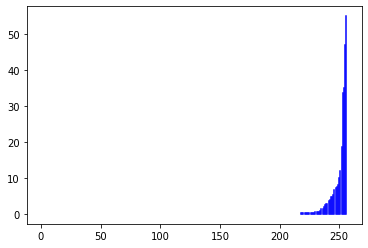

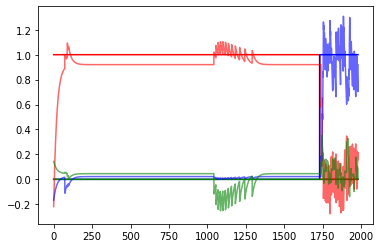

 40%|█████████████████████████████████████████████████████████████▊                                                                                            | 1204/3000 [7:29:17<12:18:18, 24.67s/it]

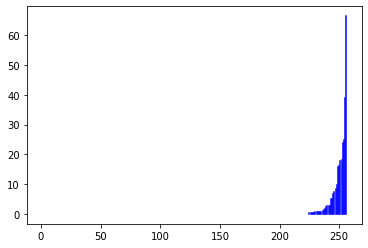

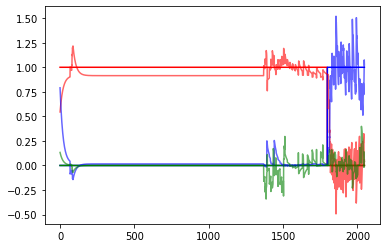

 40%|██████████████████████████████████████████████████████████████                                                                                            | 1209/3000 [7:31:08<10:52:52, 21.87s/it]

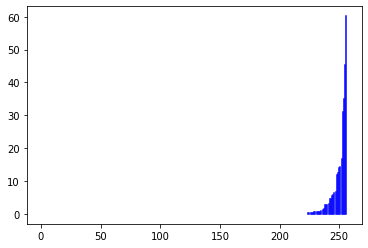

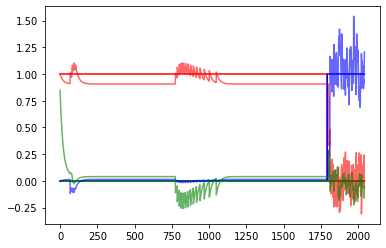

 40%|██████████████████████████████████████████████████████████████▎                                                                                           | 1214/3000 [7:32:53<10:05:03, 20.33s/it]

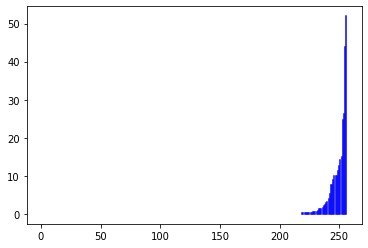

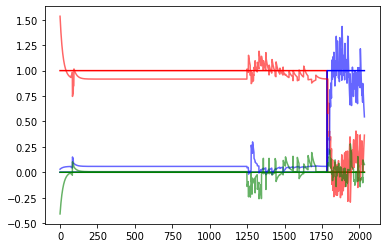

 41%|██████████████████████████████████████████████████████████████▌                                                                                           | 1219/3000 [7:34:40<10:23:42, 21.01s/it]

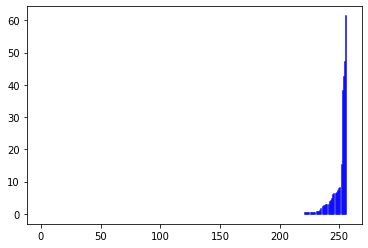

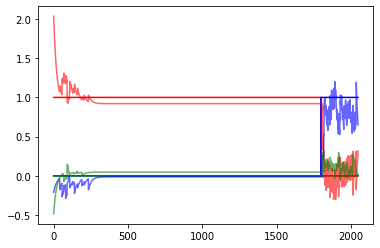

 41%|██████████████████████████████████████████████████████████████▊                                                                                           | 1224/3000 [7:36:29<10:22:59, 21.05s/it]

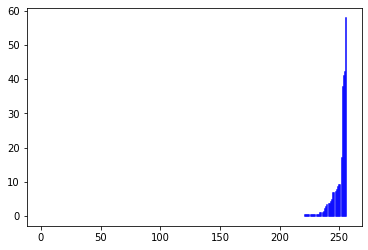

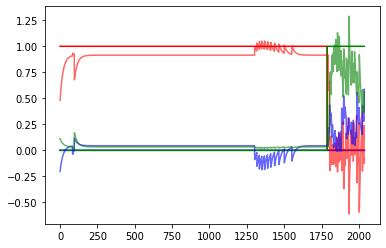

 41%|███████████████████████████████████████████████████████████████                                                                                           | 1229/3000 [7:38:16<10:14:48, 20.83s/it]

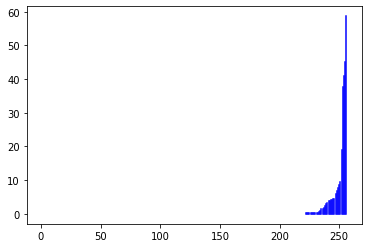

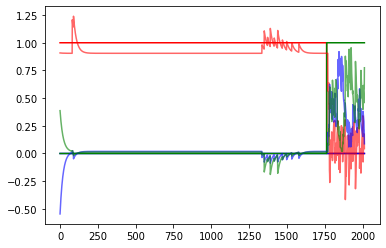

 41%|███████████████████████████████████████████████████████████████▎                                                                                          | 1234/3000 [7:40:05<10:17:47, 20.99s/it]

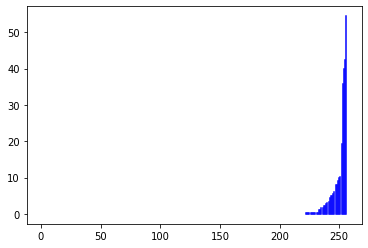

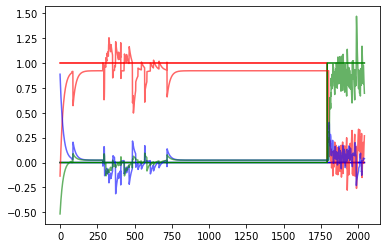

 41%|███████████████████████████████████████████████████████████████▌                                                                                          | 1239/3000 [7:41:52<10:09:33, 20.77s/it]

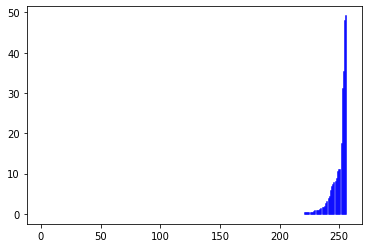

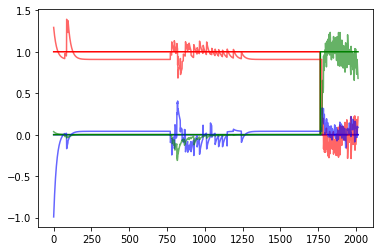

 41%|████████████████████████████████████████████████████████████████▎                                                                                          | 1244/3000 [7:43:37<9:50:25, 20.17s/it]

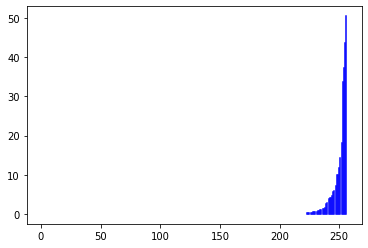

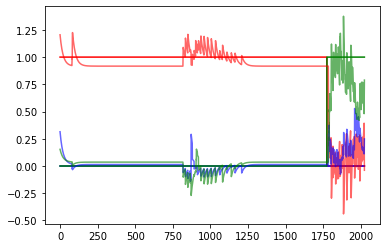

 42%|████████████████████████████████████████████████████████████████                                                                                          | 1249/3000 [7:45:26<10:25:06, 21.42s/it]

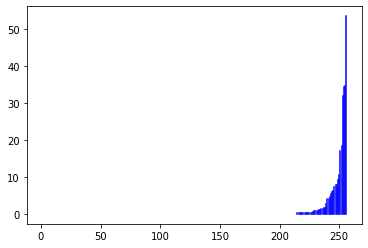

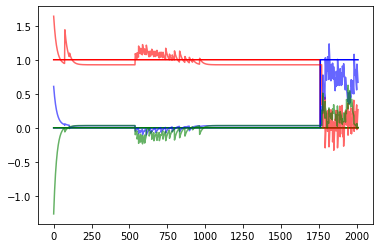

 42%|████████████████████████████████████████████████████████████████▎                                                                                         | 1254/3000 [7:48:06<12:12:42, 25.18s/it]

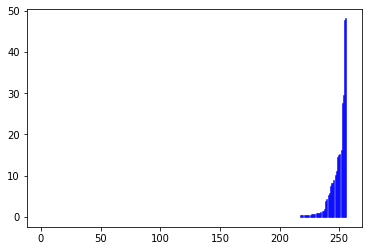

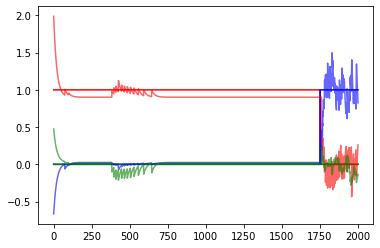

 42%|████████████████████████████████████████████████████████████████▋                                                                                         | 1259/3000 [7:49:53<10:34:29, 21.87s/it]

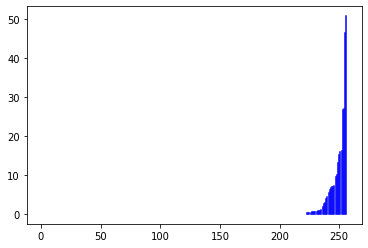

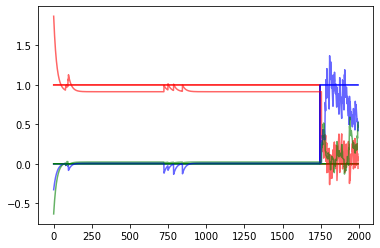

 42%|█████████████████████████████████████████████████████████████████▎                                                                                         | 1264/3000 [7:51:36<9:49:29, 20.37s/it]

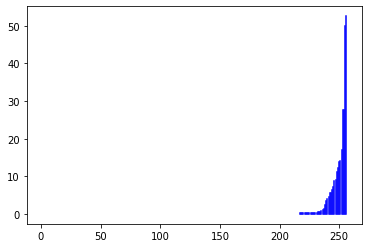

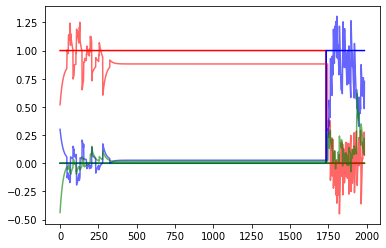

 42%|█████████████████████████████████████████████████████████████████▌                                                                                         | 1269/3000 [7:53:18<9:24:22, 19.56s/it]

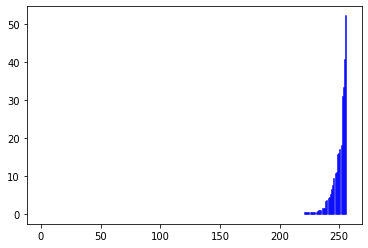

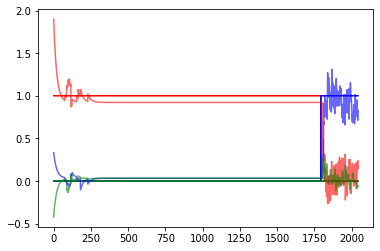

 42%|█████████████████████████████████████████████████████████████████▊                                                                                         | 1274/3000 [7:55:04<9:54:50, 20.68s/it]

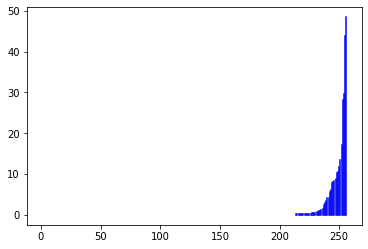

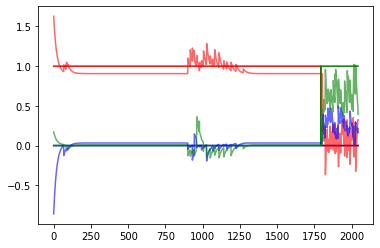

 43%|██████████████████████████████████████████████████████████████████                                                                                         | 1279/3000 [7:56:51<9:56:57, 20.81s/it]

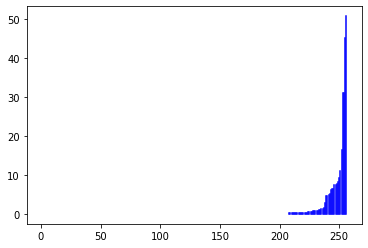

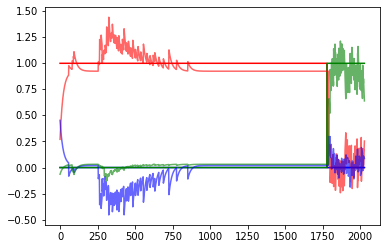

 43%|█████████████████████████████████████████████████████████████████▉                                                                                        | 1284/3000 [7:58:40<10:09:45, 21.32s/it]

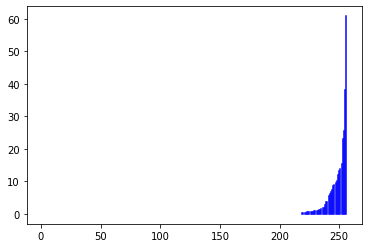

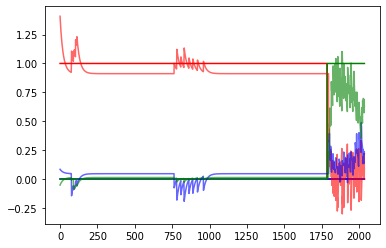

 43%|██████████████████████████████████████████████████████████████████▌                                                                                        | 1289/3000 [8:00:27<9:46:28, 20.57s/it]

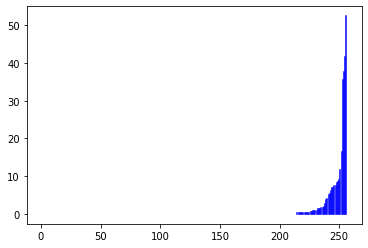

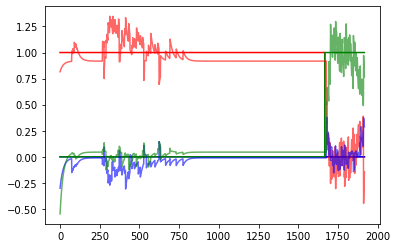

 43%|██████████████████████████████████████████████████████████████████▍                                                                                       | 1294/3000 [8:02:14<10:03:16, 21.22s/it]

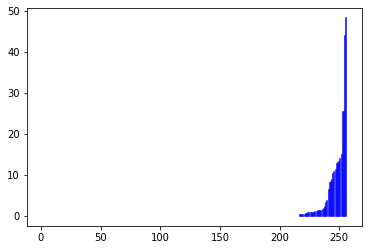

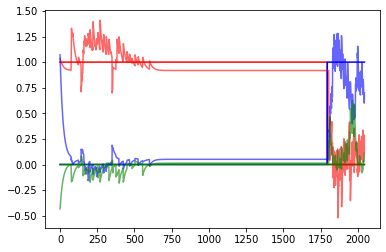

 43%|███████████████████████████████████████████████████████████████████                                                                                        | 1299/3000 [8:04:01<9:37:35, 20.37s/it]

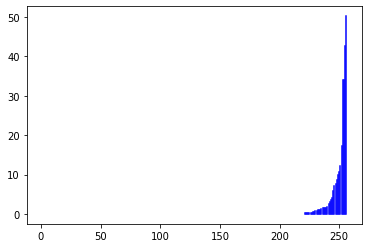

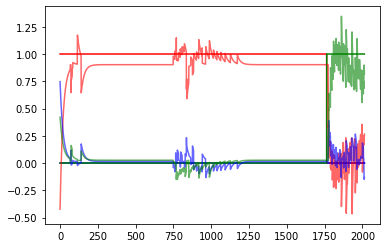

 43%|██████████████████████████████████████████████████████████████████▉                                                                                       | 1304/3000 [8:06:37<11:28:21, 24.35s/it]

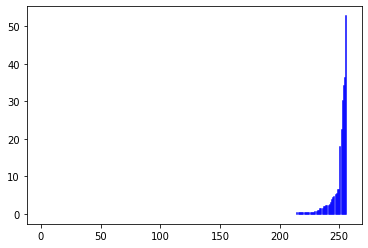

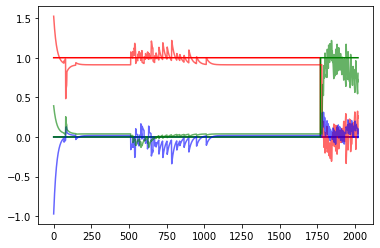

 44%|███████████████████████████████████████████████████████████████████▏                                                                                      | 1309/3000 [8:08:24<10:09:23, 21.62s/it]

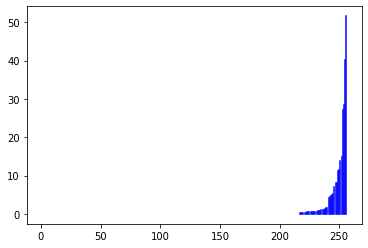

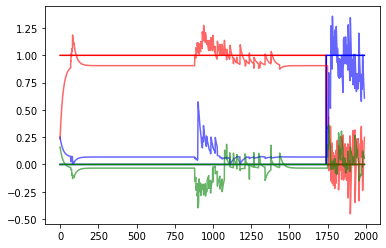

 44%|███████████████████████████████████████████████████████████████████▉                                                                                       | 1314/3000 [8:10:10<9:43:57, 20.78s/it]

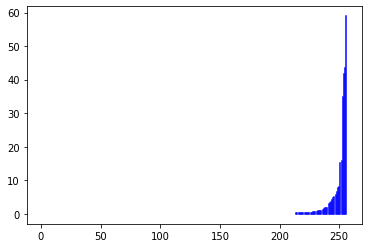

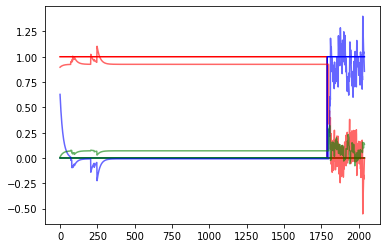

 44%|███████████████████████████████████████████████████████████████████▋                                                                                      | 1319/3000 [8:12:02<10:10:32, 21.79s/it]

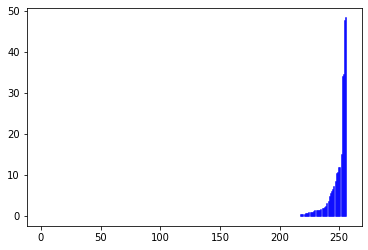

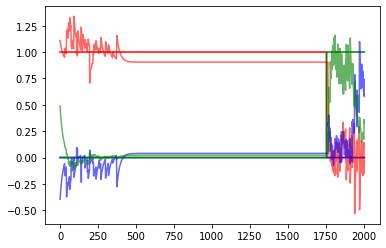

 44%|████████████████████████████████████████████████████████████████████▍                                                                                      | 1324/3000 [8:13:49<9:49:14, 21.09s/it]

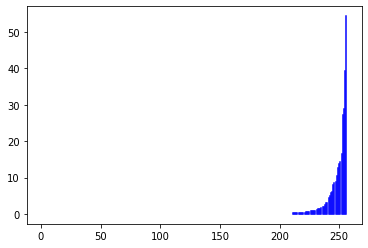

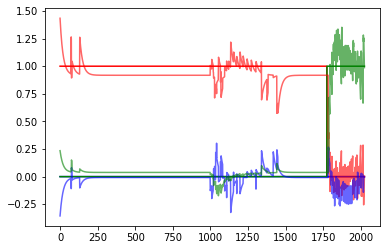

 44%|████████████████████████████████████████████████████████████████████▋                                                                                      | 1329/3000 [8:15:34<9:29:30, 20.45s/it]

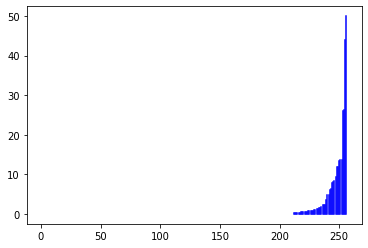

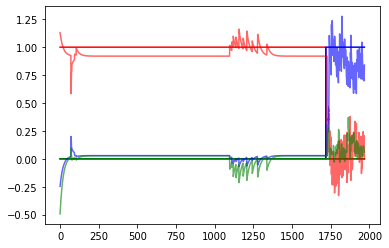

 44%|████████████████████████████████████████████████████████████████████▉                                                                                      | 1334/3000 [8:17:24<9:55:56, 21.46s/it]

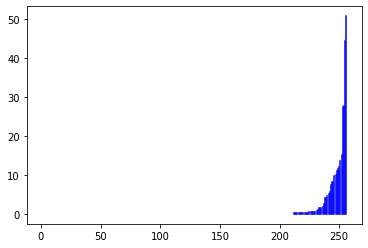

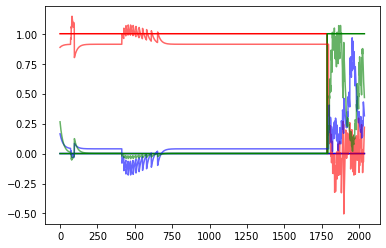

 45%|█████████████████████████████████████████████████████████████████████▏                                                                                     | 1339/3000 [8:19:13<9:45:42, 21.16s/it]

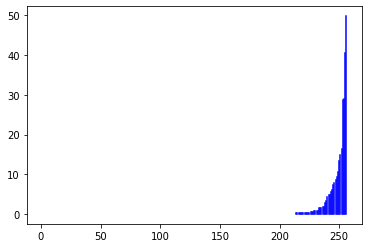

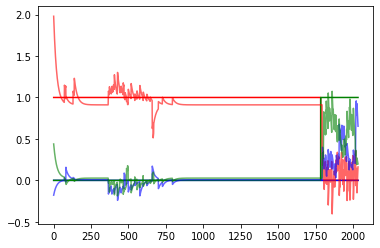

 45%|█████████████████████████████████████████████████████████████████████▍                                                                                     | 1344/3000 [8:21:00<9:36:10, 20.88s/it]

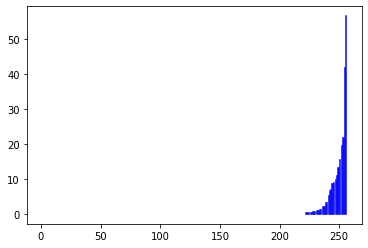

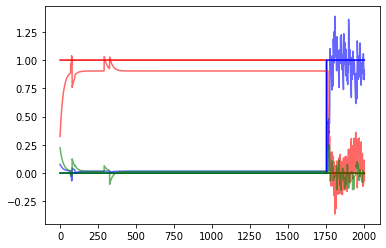

 45%|█████████████████████████████████████████████████████████████████████▋                                                                                     | 1349/3000 [8:22:46<9:41:00, 21.11s/it]

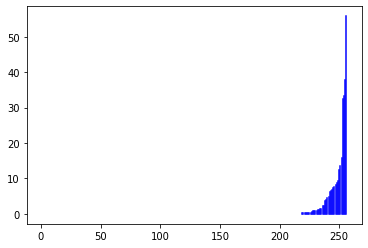

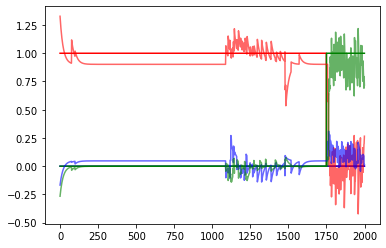

 45%|█████████████████████████████████████████████████████████████████████▌                                                                                    | 1354/3000 [8:25:21<11:05:09, 24.25s/it]

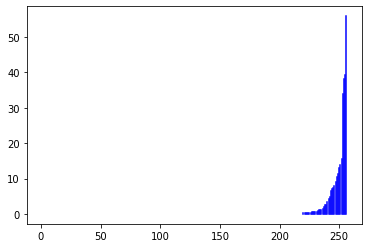

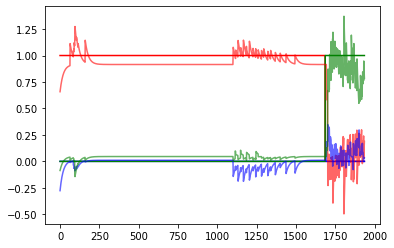

 45%|██████████████████████████████████████████████████████████████████████▏                                                                                    | 1359/3000 [8:27:09<9:52:16, 21.66s/it]

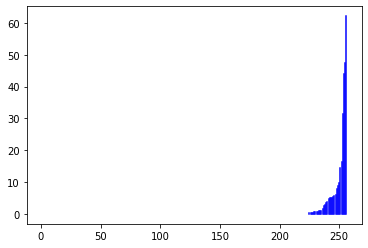

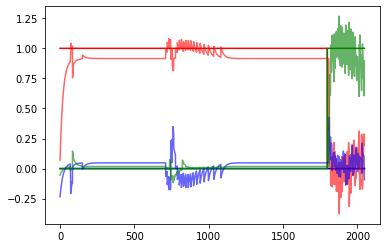

 45%|██████████████████████████████████████████████████████████████████████▍                                                                                    | 1364/3000 [8:29:00<9:54:08, 21.79s/it]

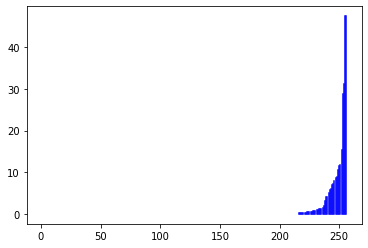

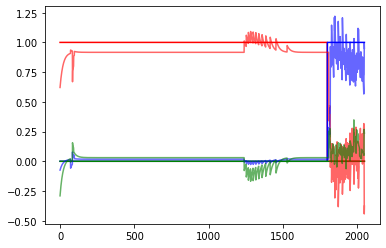

 46%|██████████████████████████████████████████████████████████████████████▋                                                                                    | 1369/3000 [8:30:50<9:43:06, 21.45s/it]

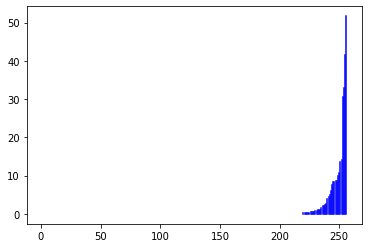

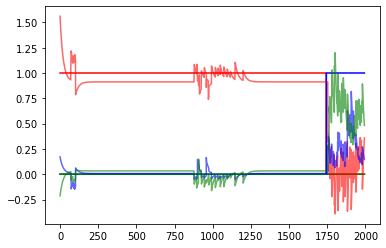

 46%|██████████████████████████████████████████████████████████████████████▉                                                                                    | 1374/3000 [8:32:40<9:41:52, 21.47s/it]

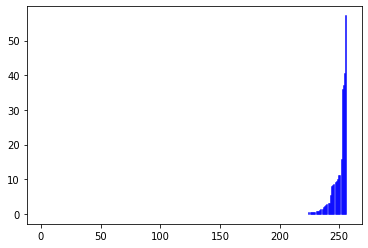

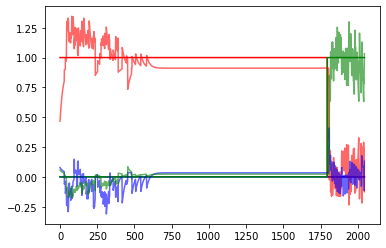

 46%|███████████████████████████████████████████████████████████████████████▏                                                                                   | 1379/3000 [8:34:30<9:46:45, 21.72s/it]

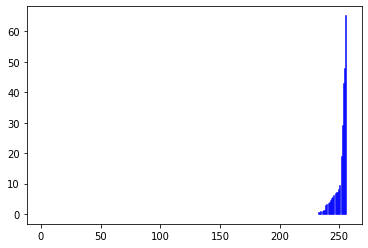

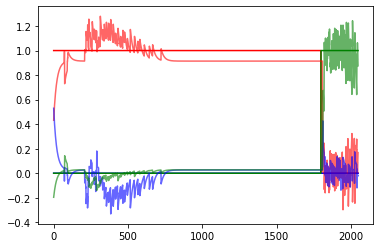

 46%|███████████████████████████████████████████████████████████████████████▌                                                                                   | 1384/3000 [8:36:16<9:11:35, 20.48s/it]

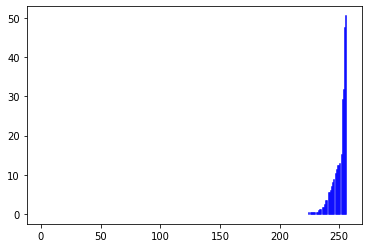

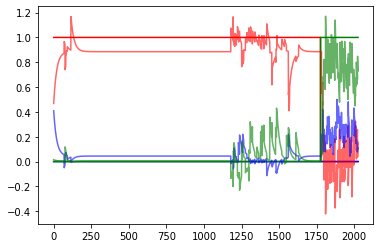

 46%|███████████████████████████████████████████████████████████████████████▊                                                                                   | 1389/3000 [8:38:05<9:23:09, 20.97s/it]

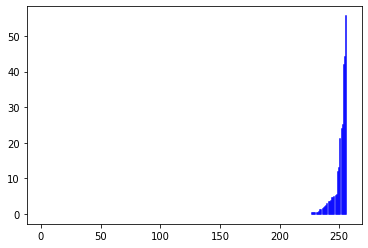

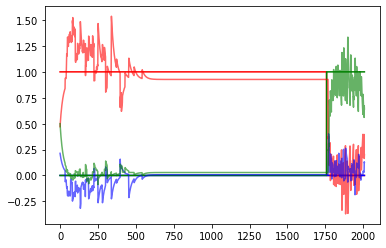

 46%|████████████████████████████████████████████████████████████████████████                                                                                   | 1394/3000 [8:39:48<9:12:57, 20.66s/it]

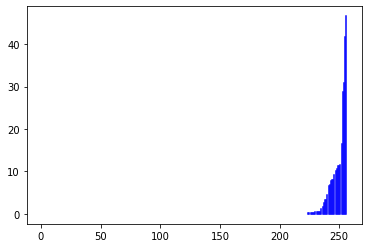

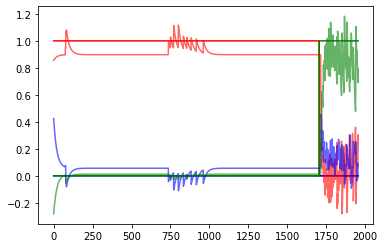

 47%|████████████████████████████████████████████████████████████████████████▎                                                                                  | 1399/3000 [8:41:36<9:24:26, 21.15s/it]

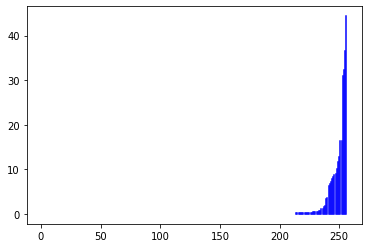

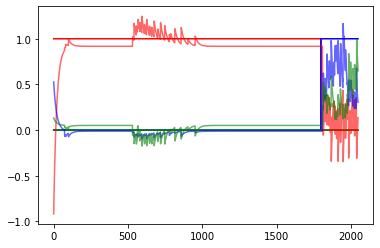

 47%|████████████████████████████████████████████████████████████████████████                                                                                  | 1404/3000 [8:44:13<10:59:27, 24.79s/it]

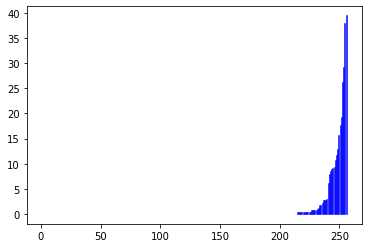

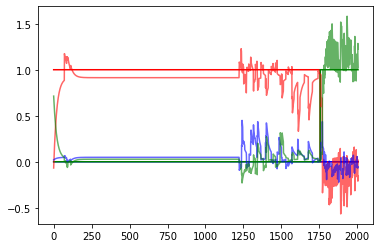

 47%|████████████████████████████████████████████████████████████████████████▊                                                                                  | 1409/3000 [8:46:05<9:51:46, 22.32s/it]

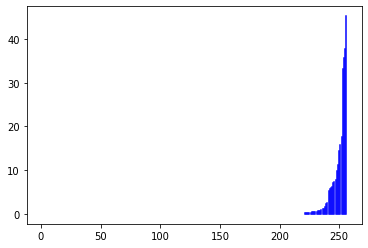

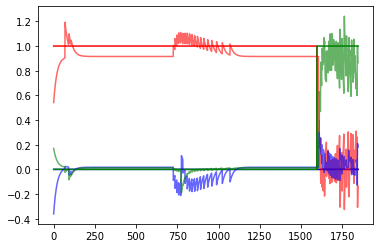

 47%|█████████████████████████████████████████████████████████████████████████                                                                                  | 1414/3000 [8:47:49<9:05:12, 20.63s/it]

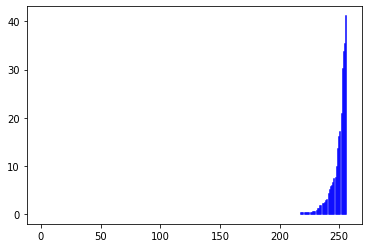

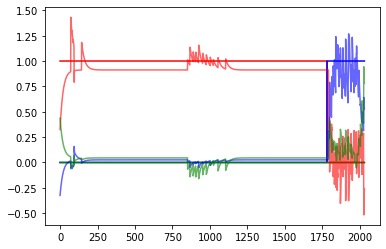

 47%|█████████████████████████████████████████████████████████████████████████▎                                                                                 | 1419/3000 [8:49:34<8:50:29, 20.13s/it]

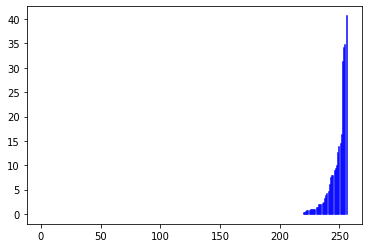

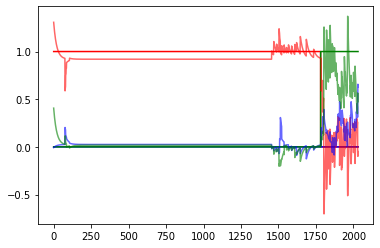

 47%|█████████████████████████████████████████████████████████████████████████▌                                                                                 | 1424/3000 [8:51:23<9:05:24, 20.76s/it]

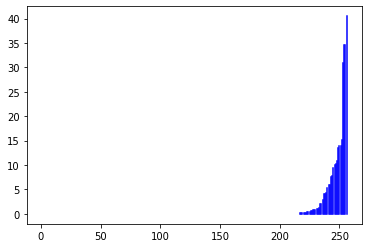

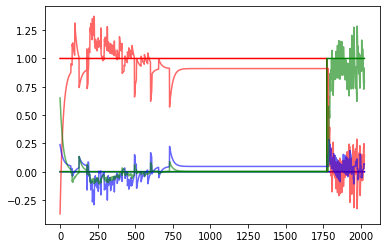

 48%|█████████████████████████████████████████████████████████████████████████▊                                                                                 | 1429/3000 [8:53:07<8:54:00, 20.40s/it]

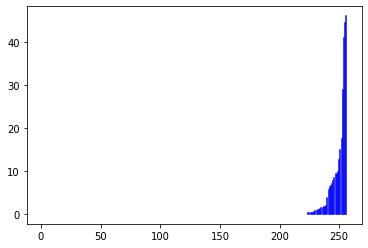

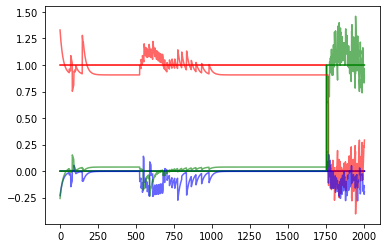

 48%|██████████████████████████████████████████████████████████████████████████                                                                                 | 1434/3000 [8:54:56<9:09:57, 21.07s/it]

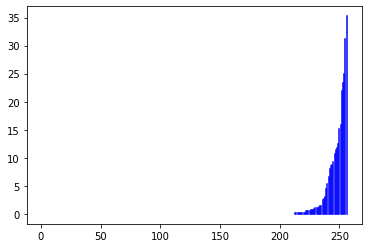

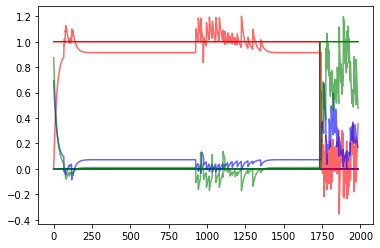

 48%|██████████████████████████████████████████████████████████████████████████▎                                                                                | 1439/3000 [8:56:47<9:14:37, 21.32s/it]

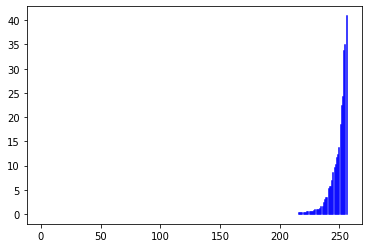

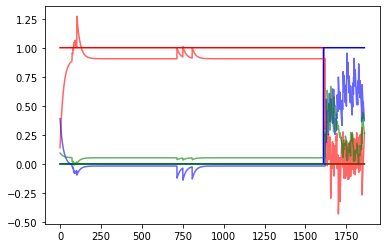

 48%|██████████████████████████████████████████████████████████████████████████▌                                                                                | 1444/3000 [8:58:28<8:33:58, 19.82s/it]

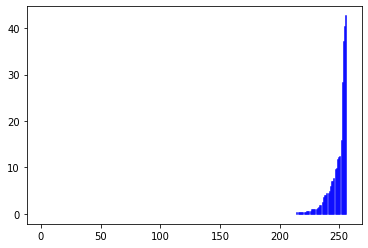

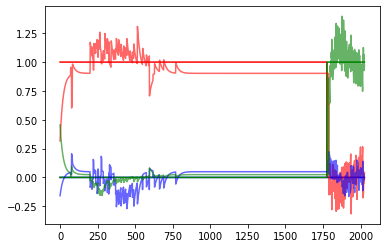

 48%|██████████████████████████████████████████████████████████████████████████▊                                                                                | 1449/3000 [9:00:11<8:46:33, 20.37s/it]

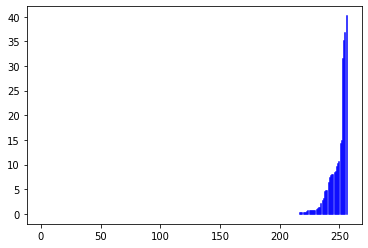

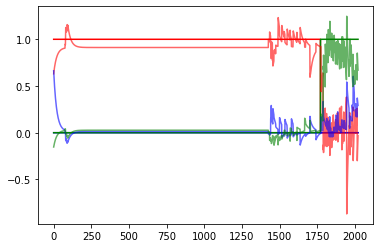

 48%|██████████████████████████████████████████████████████████████████████████▋                                                                               | 1454/3000 [9:02:45<10:28:30, 24.39s/it]

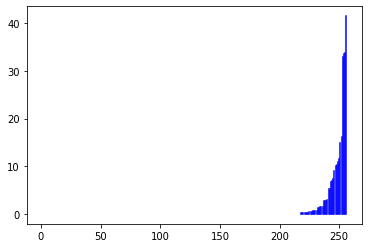

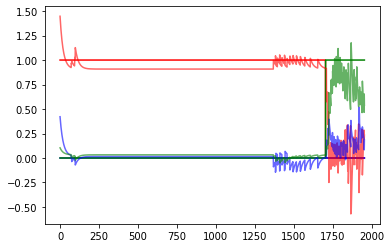

 49%|███████████████████████████████████████████████████████████████████████████▍                                                                               | 1459/3000 [9:04:28<8:41:06, 20.29s/it]

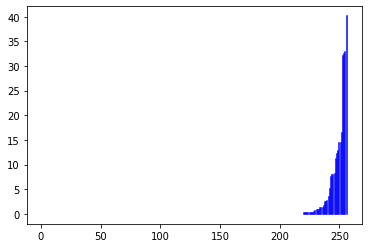

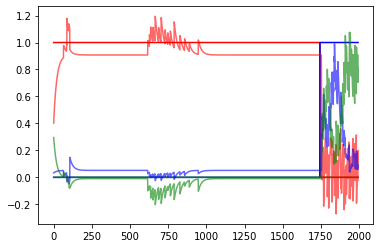

 49%|███████████████████████████████████████████████████████████████████████████▋                                                                               | 1464/3000 [9:06:17<9:04:35, 21.27s/it]

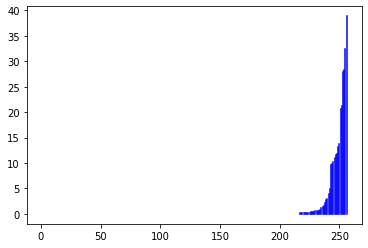

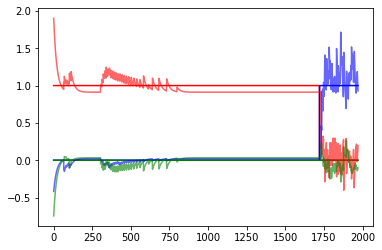

 49%|███████████████████████████████████████████████████████████████████████████▉                                                                               | 1469/3000 [9:08:07<9:05:28, 21.38s/it]

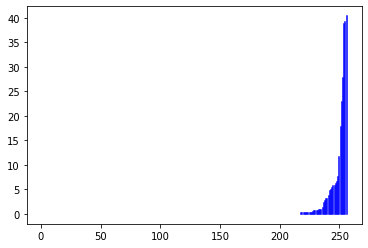

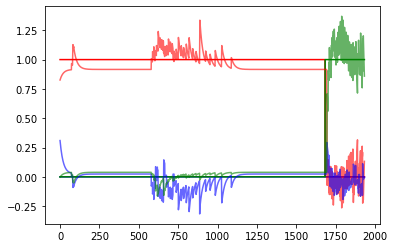

 49%|████████████████████████████████████████████████████████████████████████████▏                                                                              | 1474/3000 [9:09:46<8:22:25, 19.75s/it]

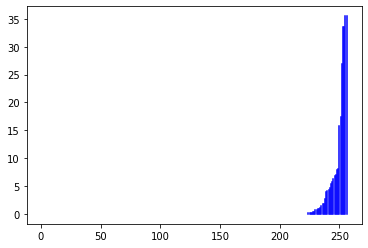

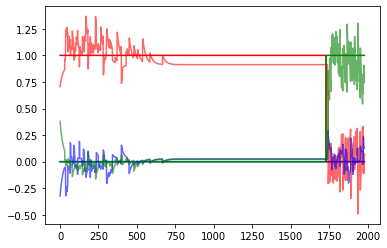

 49%|████████████████████████████████████████████████████████████████████████████▍                                                                              | 1479/3000 [9:11:32<8:48:06, 20.83s/it]

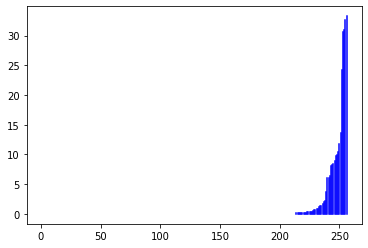

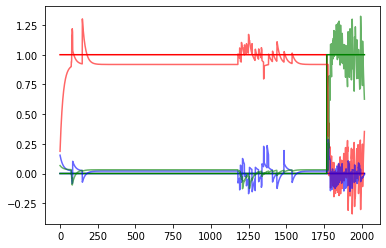

 49%|████████████████████████████████████████████████████████████████████████████▋                                                                              | 1484/3000 [9:13:19<8:47:09, 20.86s/it]

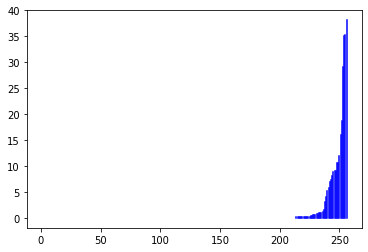

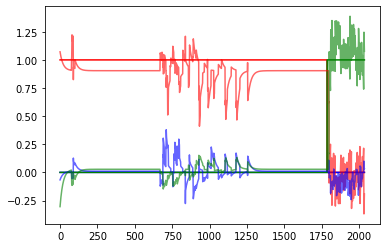

 50%|████████████████████████████████████████████████████████████████████████████▉                                                                              | 1489/3000 [9:15:11<8:57:00, 21.32s/it]

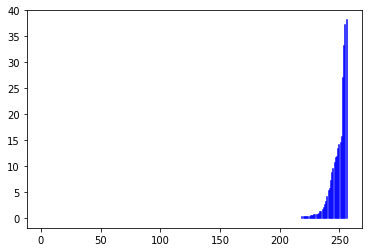

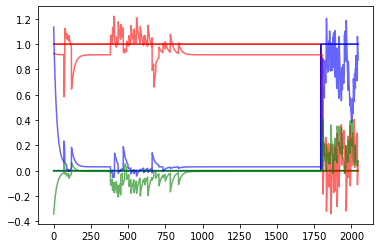

 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                             | 1494/3000 [9:16:59<8:52:14, 21.20s/it]

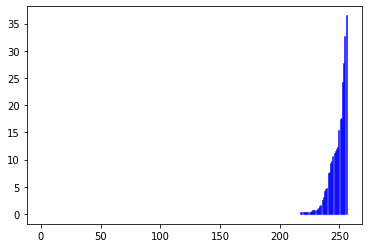

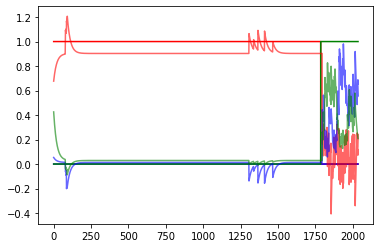

 50%|█████████████████████████████████████████████████████████████████████████████▍                                                                             | 1499/3000 [9:18:47<8:50:46, 21.22s/it]

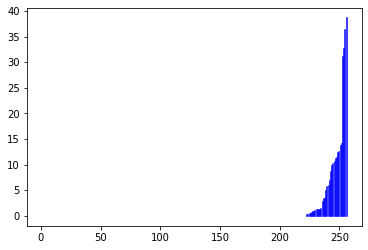

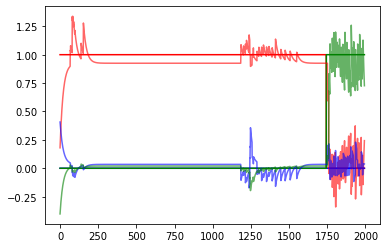

 50%|█████████████████████████████████████████████████████████████████████████████▏                                                                            | 1504/3000 [9:21:26<10:22:33, 24.97s/it]

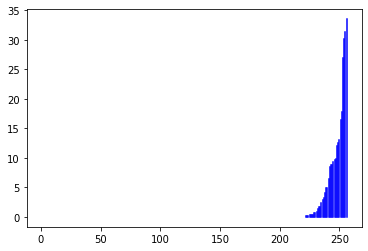

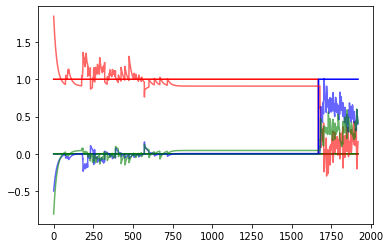

 50%|█████████████████████████████████████████████████████████████████████████████▉                                                                             | 1509/3000 [9:23:12<8:49:43, 21.32s/it]

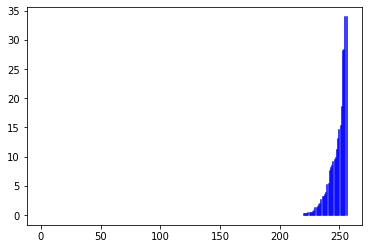

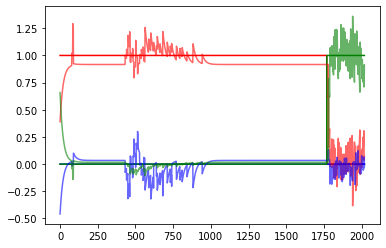

 50%|██████████████████████████████████████████████████████████████████████████████▏                                                                            | 1514/3000 [9:25:03<8:58:35, 21.75s/it]

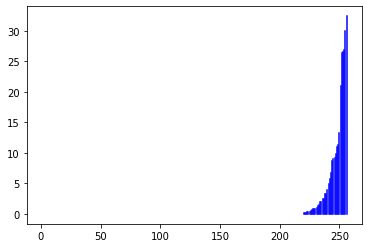

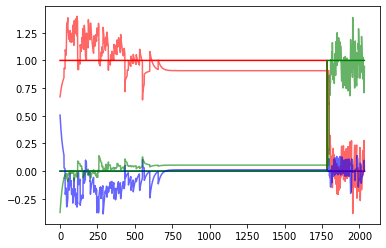

 51%|██████████████████████████████████████████████████████████████████████████████▍                                                                            | 1519/3000 [9:26:49<8:36:45, 20.94s/it]

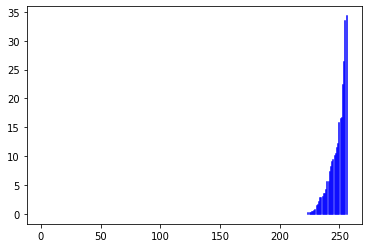

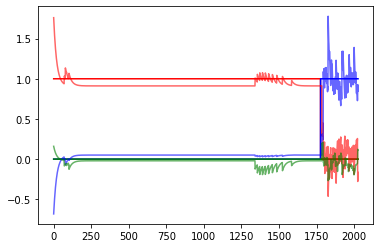

 51%|██████████████████████████████████████████████████████████████████████████████▋                                                                            | 1524/3000 [9:28:36<8:31:22, 20.79s/it]

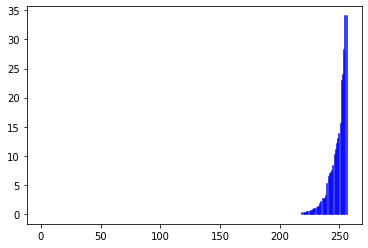

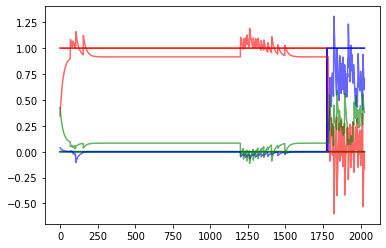

 51%|██████████████████████████████████████████████████████████████████████████████▉                                                                            | 1529/3000 [9:30:20<8:20:06, 20.40s/it]

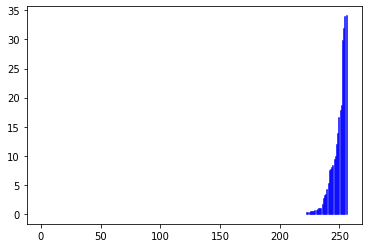

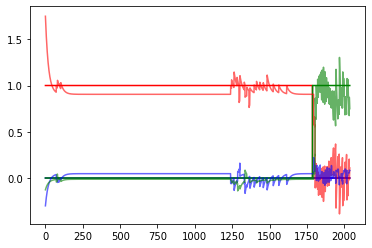

 51%|███████████████████████████████████████████████████████████████████████████████▎                                                                           | 1534/3000 [9:32:08<8:39:05, 21.24s/it]

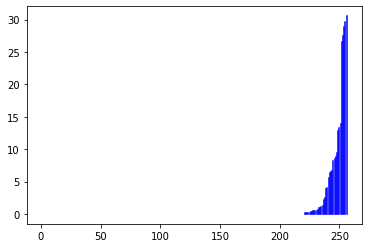

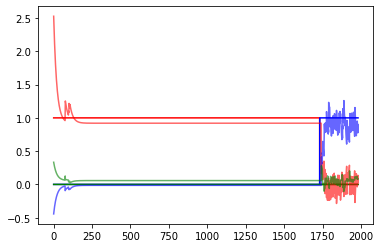

 51%|███████████████████████████████████████████████████████████████████████████████▌                                                                           | 1539/3000 [9:33:57<8:36:11, 21.20s/it]

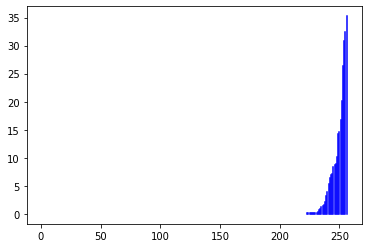

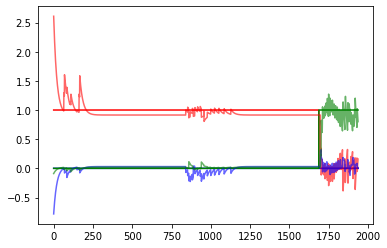

 51%|███████████████████████████████████████████████████████████████████████████████▊                                                                           | 1544/3000 [9:35:41<8:13:52, 20.35s/it]

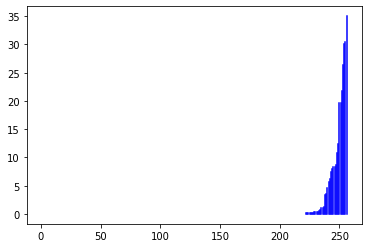

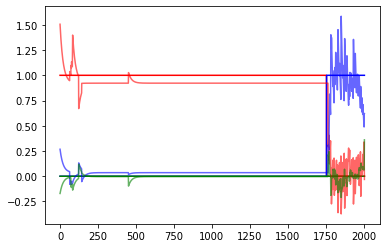

 52%|████████████████████████████████████████████████████████████████████████████████                                                                           | 1549/3000 [9:37:29<8:19:08, 20.64s/it]

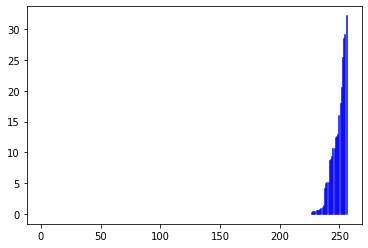

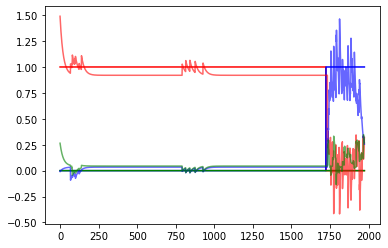

 52%|████████████████████████████████████████████████████████████████████████████████▎                                                                          | 1554/3000 [9:39:58<9:21:09, 23.28s/it]

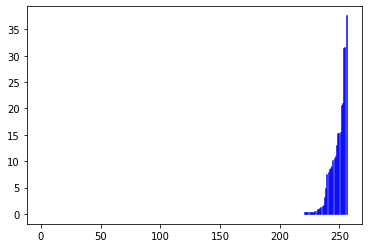

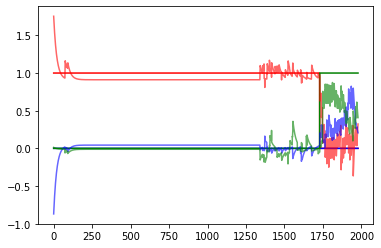

 52%|████████████████████████████████████████████████████████████████████████████████▌                                                                          | 1559/3000 [9:41:47<8:41:18, 21.71s/it]

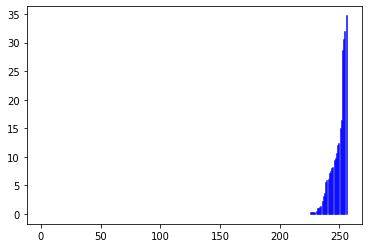

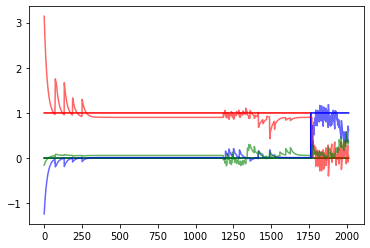

 52%|████████████████████████████████████████████████████████████████████████████████▊                                                                          | 1564/3000 [9:43:35<8:33:15, 21.45s/it]

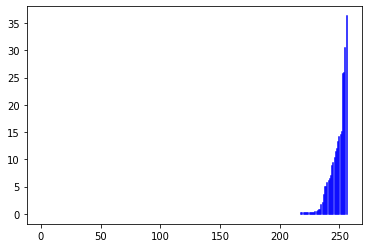

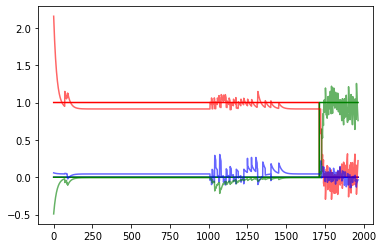

 52%|█████████████████████████████████████████████████████████████████████████████████                                                                          | 1569/3000 [9:45:17<8:12:04, 20.63s/it]

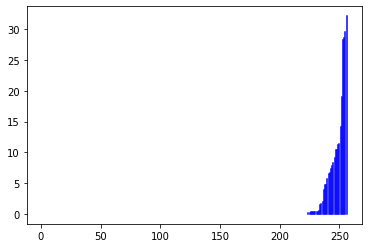

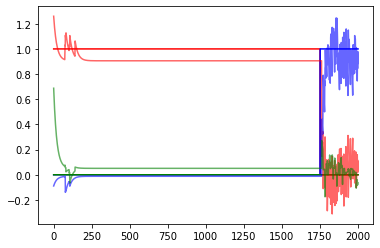

 52%|█████████████████████████████████████████████████████████████████████████████████▎                                                                         | 1574/3000 [9:47:03<8:16:39, 20.90s/it]

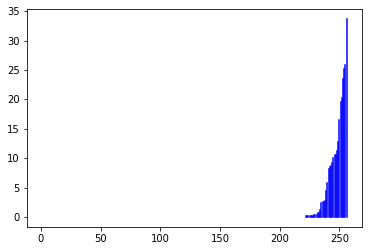

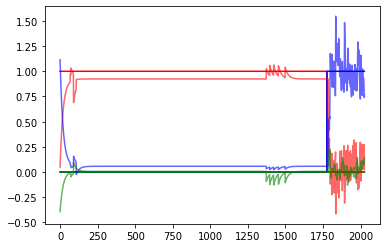

 53%|█████████████████████████████████████████████████████████████████████████████████▌                                                                         | 1579/3000 [9:48:50<8:15:44, 20.93s/it]

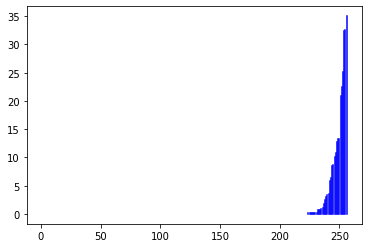

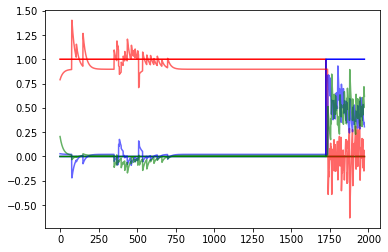

 53%|█████████████████████████████████████████████████████████████████████████████████▊                                                                         | 1584/3000 [9:50:36<8:10:34, 20.79s/it]

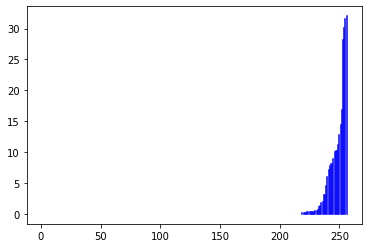

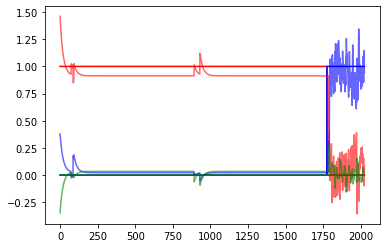

 53%|██████████████████████████████████████████████████████████████████████████████████                                                                         | 1589/3000 [9:52:22<7:57:54, 20.32s/it]

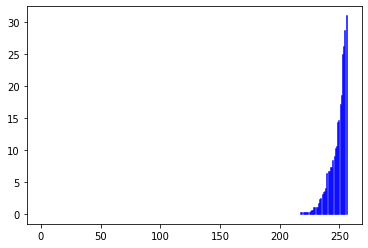

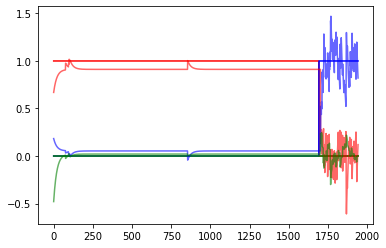

 53%|██████████████████████████████████████████████████████████████████████████████████▎                                                                        | 1594/3000 [9:54:10<8:12:59, 21.04s/it]

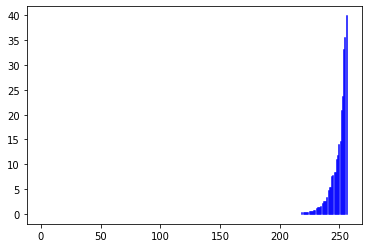

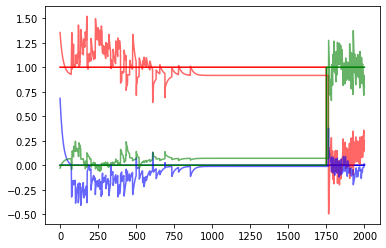

 53%|██████████████████████████████████████████████████████████████████████████████████▌                                                                        | 1599/3000 [9:55:55<8:02:18, 20.66s/it]

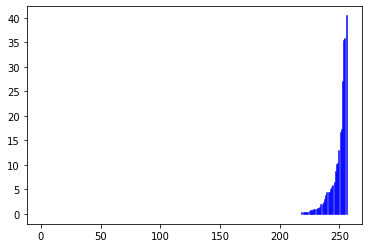

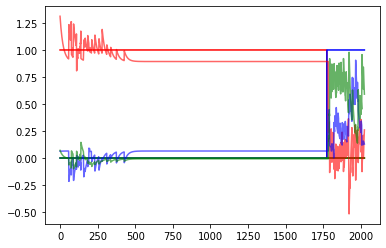

 53%|██████████████████████████████████████████████████████████████████████████████████▊                                                                        | 1604/3000 [9:58:29<9:11:42, 23.71s/it]

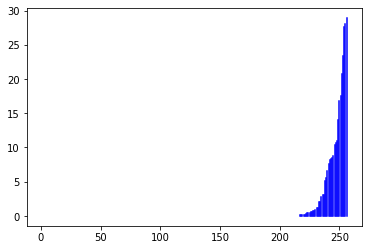

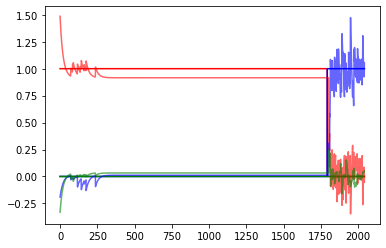

 54%|██████████████████████████████████████████████████████████████████████████████████▌                                                                       | 1609/3000 [10:00:18<8:27:21, 21.88s/it]

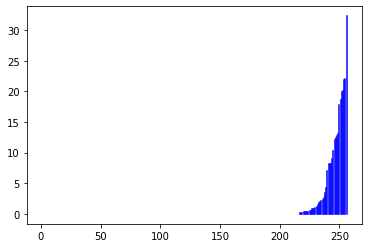

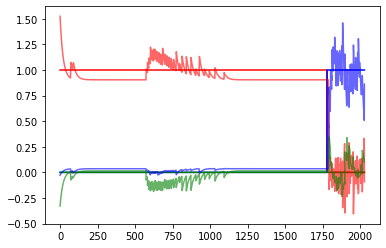

 54%|██████████████████████████████████████████████████████████████████████████████████▊                                                                       | 1614/3000 [10:02:07<8:17:43, 21.55s/it]

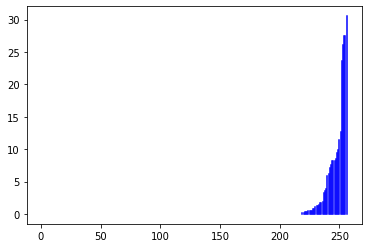

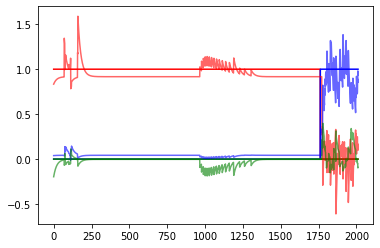

 54%|███████████████████████████████████████████████████████████████████████████████████                                                                       | 1619/3000 [10:03:51<7:54:22, 20.61s/it]

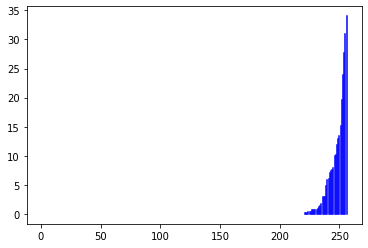

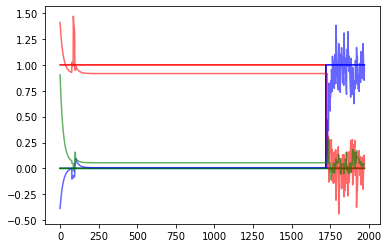

 54%|███████████████████████████████████████████████████████████████████████████████████▎                                                                      | 1624/3000 [10:05:36<7:50:27, 20.51s/it]

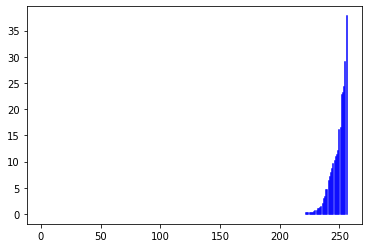

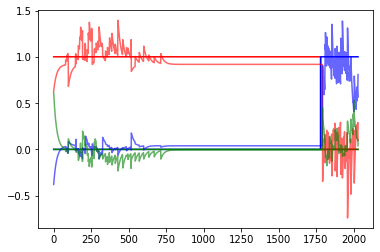

 54%|███████████████████████████████████████████████████████████████████████████████████▌                                                                      | 1629/3000 [10:07:27<8:16:23, 21.72s/it]

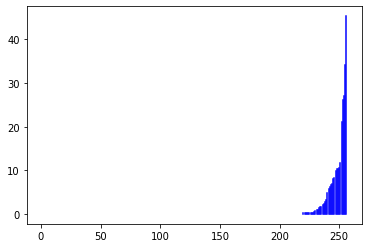

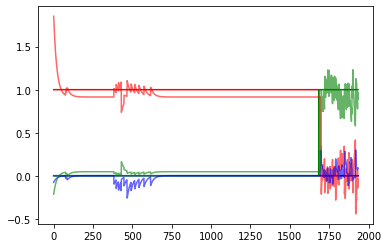

 54%|███████████████████████████████████████████████████████████████████████████████████▉                                                                      | 1634/3000 [10:09:16<8:04:54, 21.30s/it]

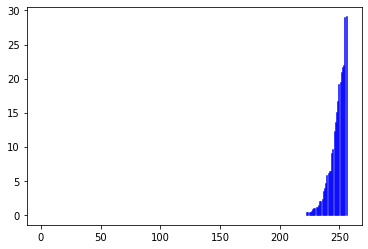

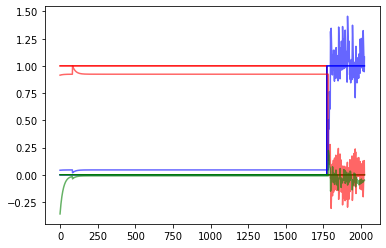

 55%|████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 1639/3000 [10:11:04<8:02:08, 21.26s/it]

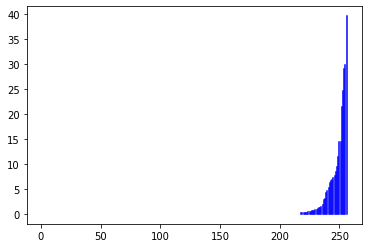

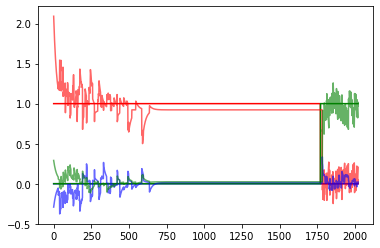

 55%|████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1644/3000 [10:12:53<7:51:41, 20.87s/it]

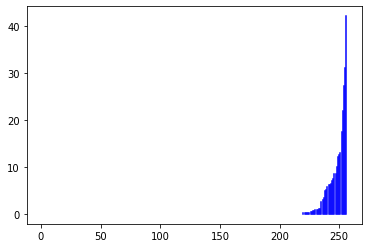

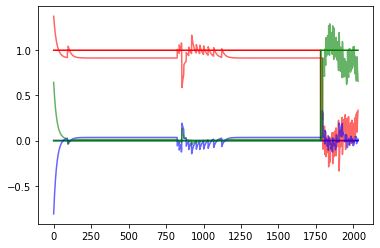

 55%|████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 1649/3000 [10:14:43<7:55:28, 21.12s/it]

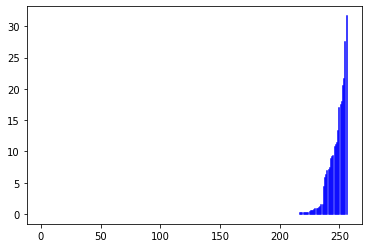

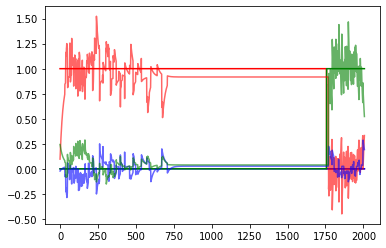

 55%|████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 1654/3000 [10:17:23<9:18:46, 24.91s/it]

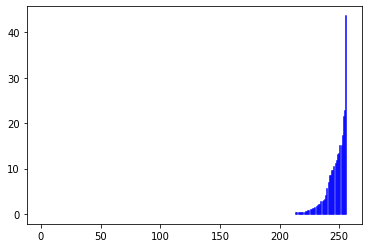

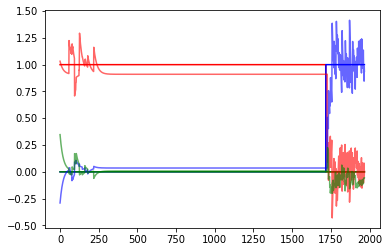

 55%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 1659/3000 [10:19:11<8:03:25, 21.63s/it]

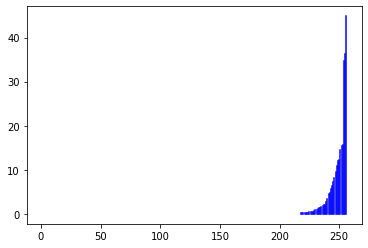

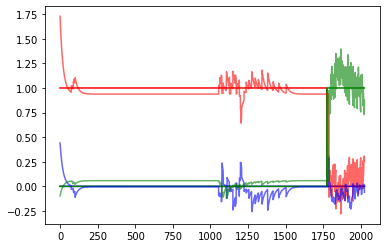

 55%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 1664/3000 [10:20:57<7:39:43, 20.65s/it]

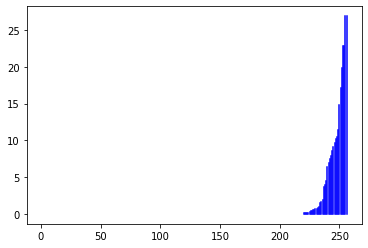

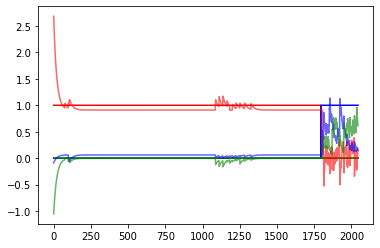

 56%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 1669/3000 [10:22:42<7:38:31, 20.67s/it]

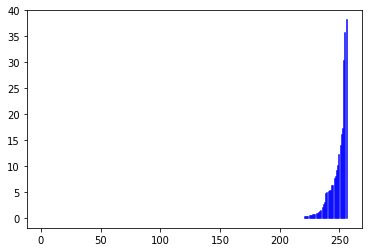

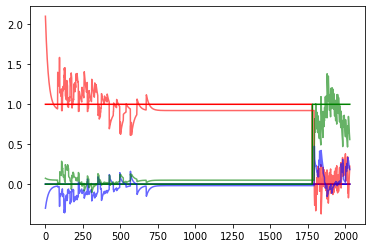

 56%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 1674/3000 [10:24:32<7:41:52, 20.90s/it]

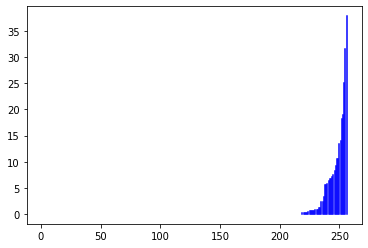

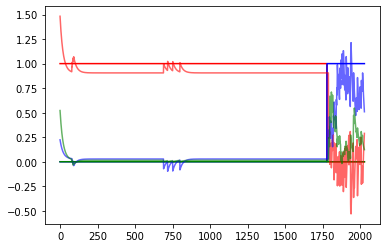

 56%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 1679/3000 [10:26:22<7:52:51, 21.48s/it]

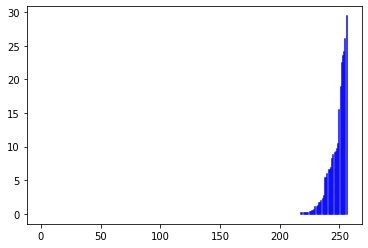

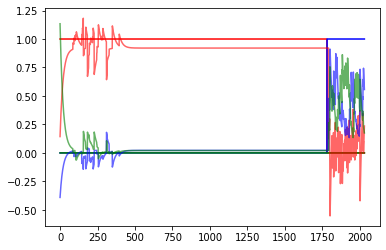

 56%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 1684/3000 [10:28:10<7:36:52, 20.83s/it]

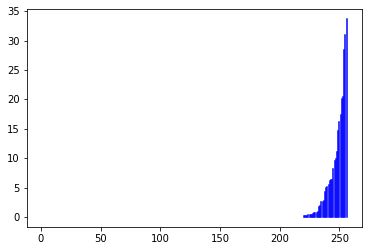

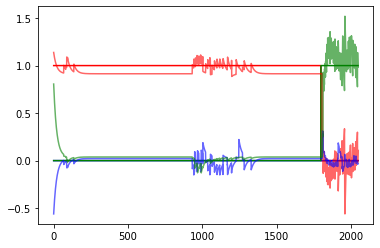

 56%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 1689/3000 [10:29:51<7:06:39, 19.53s/it]

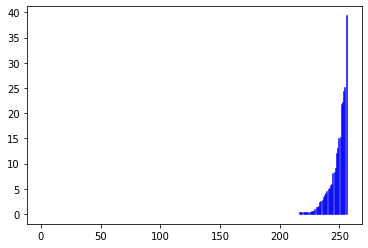

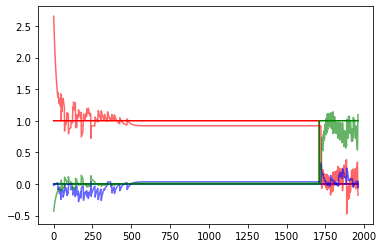

 56%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 1694/3000 [10:31:41<7:38:41, 21.07s/it]

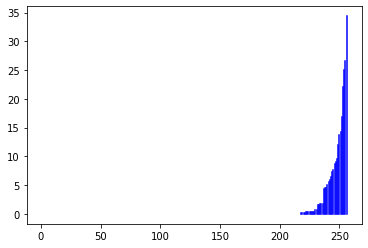

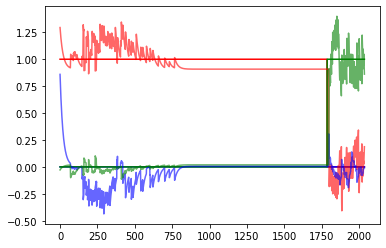

 57%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 1699/3000 [10:33:24<7:24:50, 20.52s/it]

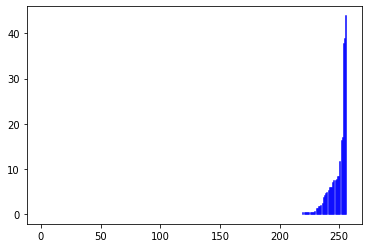

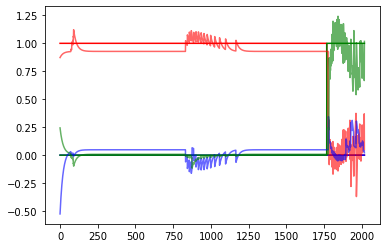

 57%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 1704/3000 [10:35:59<8:46:06, 24.36s/it]

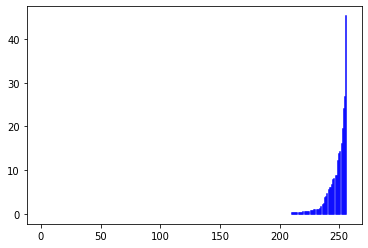

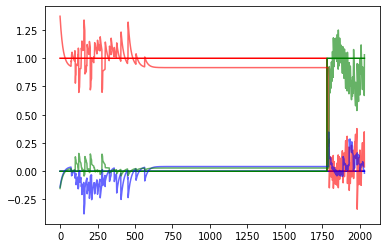

 57%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 1709/3000 [10:37:49<7:48:36, 21.78s/it]

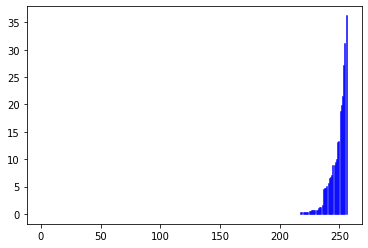

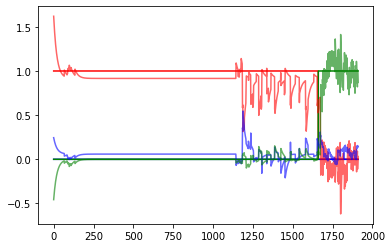

 57%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 1714/3000 [10:39:38<7:38:15, 21.38s/it]

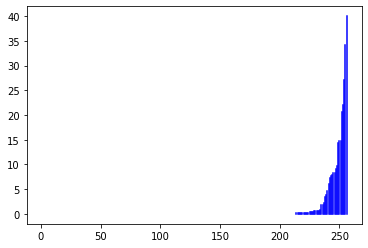

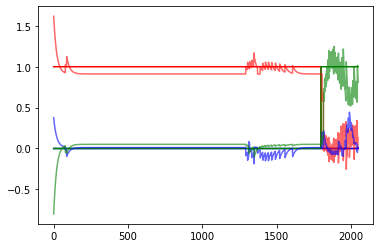

 57%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 1719/3000 [10:41:26<7:29:35, 21.06s/it]

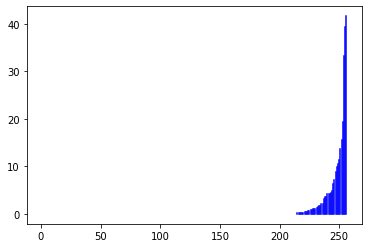

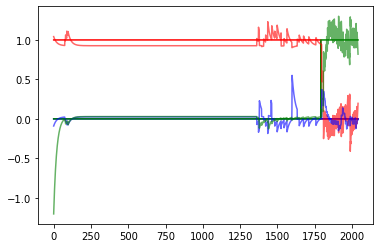

 57%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 1724/3000 [10:43:13<7:28:39, 21.10s/it]

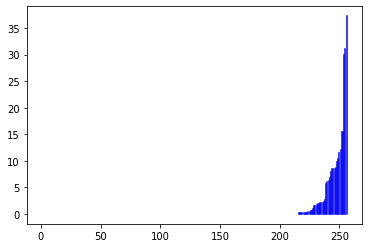

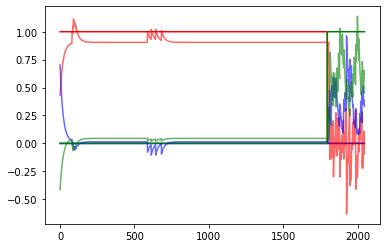

 58%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 1729/3000 [10:45:04<7:34:07, 21.44s/it]

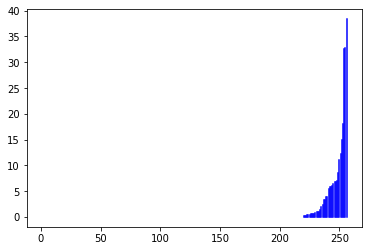

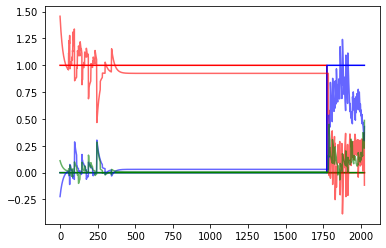

 58%|█████████████████████████████████████████████████████████████████████████████████████████                                                                 | 1734/3000 [10:46:52<7:28:09, 21.24s/it]

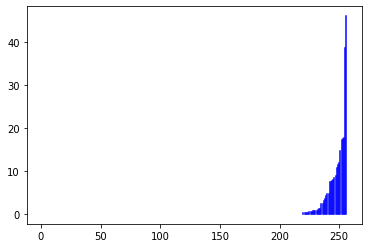

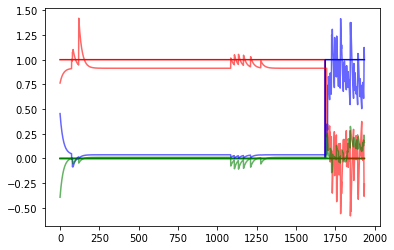

 58%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 1739/3000 [10:48:41<7:21:15, 21.00s/it]

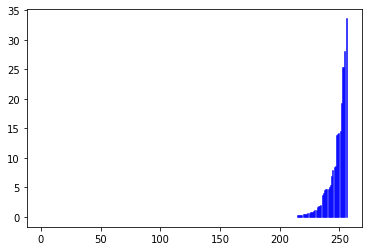

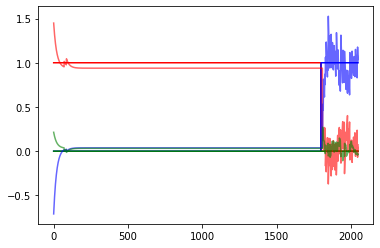

 58%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 1744/3000 [10:50:28<7:19:57, 21.02s/it]

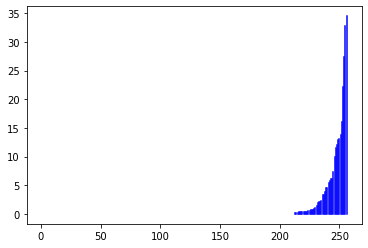

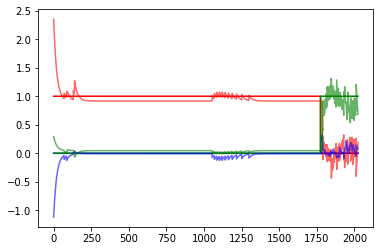

 58%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 1749/3000 [10:52:20<7:34:49, 21.81s/it]

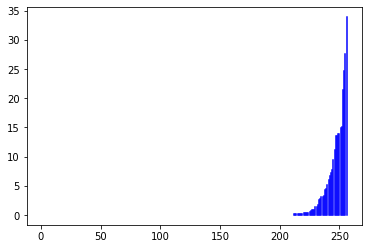

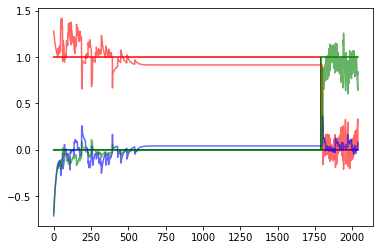

 58%|██████████████████████████████████████████████████████████████████████████████████████████                                                                | 1754/3000 [10:54:55<8:26:48, 24.40s/it]

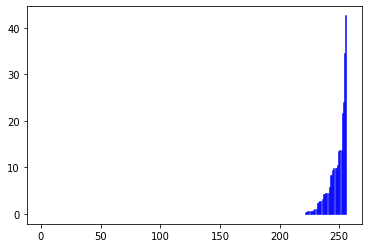

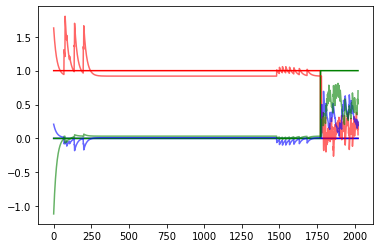

 59%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 1759/3000 [10:56:44<7:35:53, 22.04s/it]

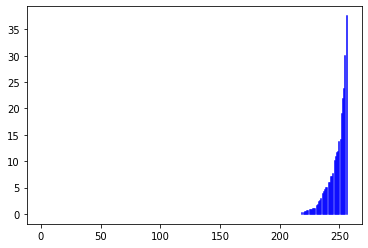

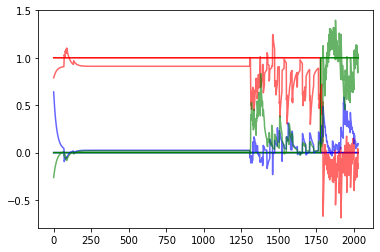

 59%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 1764/3000 [10:58:32<7:21:47, 21.45s/it]

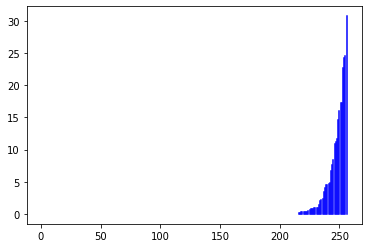

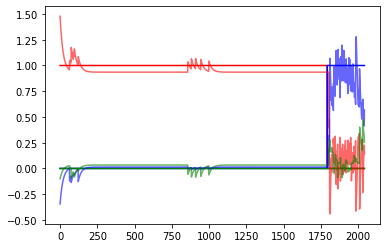

 59%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 1769/3000 [11:00:15<7:07:51, 20.85s/it]

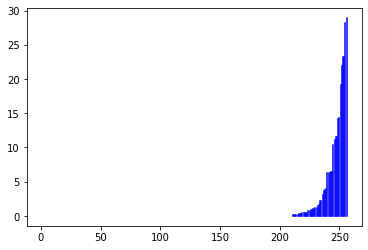

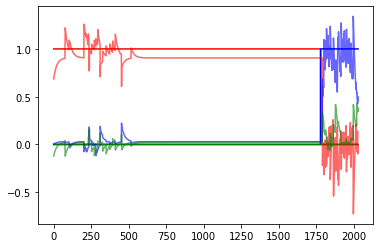

 59%|███████████████████████████████████████████████████████████████████████████████████████████                                                               | 1774/3000 [11:02:05<7:18:38, 21.47s/it]

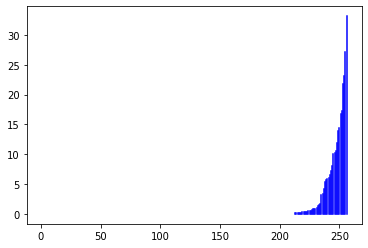

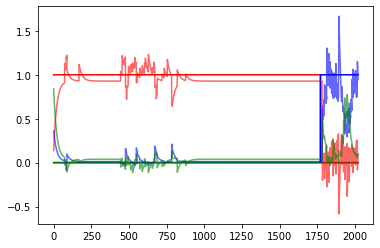

 59%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 1779/3000 [11:03:50<6:58:51, 20.58s/it]

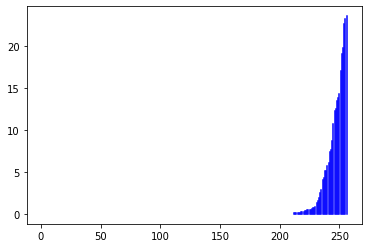

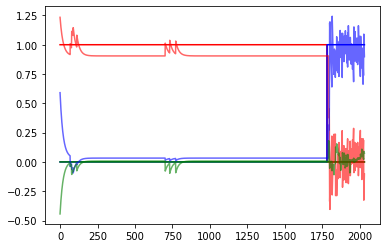

 59%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 1784/3000 [11:05:40<7:12:50, 21.36s/it]

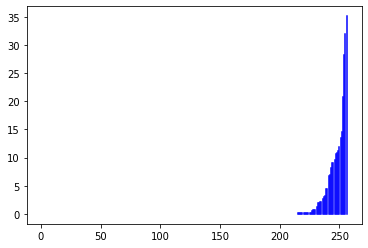

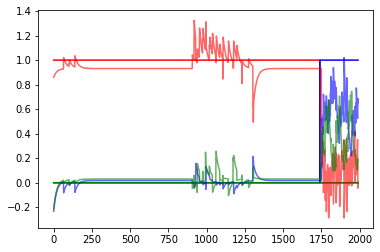

 60%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 1789/3000 [11:07:29<7:10:22, 21.32s/it]

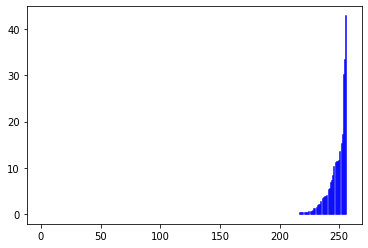

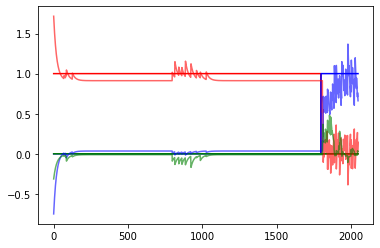

 60%|████████████████████████████████████████████████████████████████████████████████████████████                                                              | 1794/3000 [11:09:16<7:01:20, 20.96s/it]

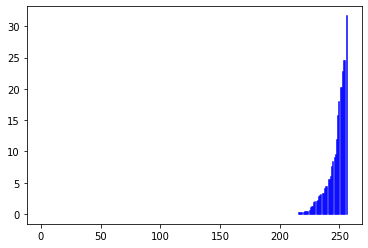

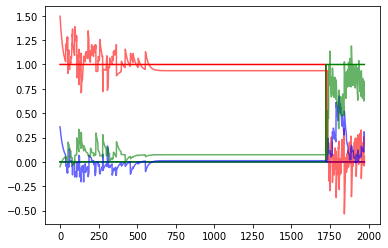

 60%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 1799/3000 [11:10:57<6:37:33, 19.86s/it]

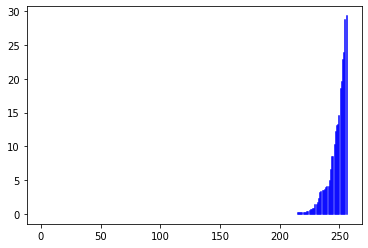

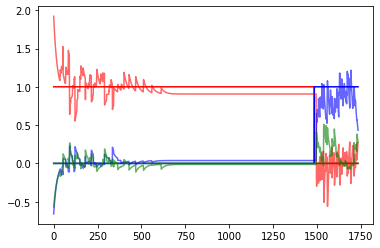

 60%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 1804/3000 [11:13:29<7:56:39, 23.91s/it]

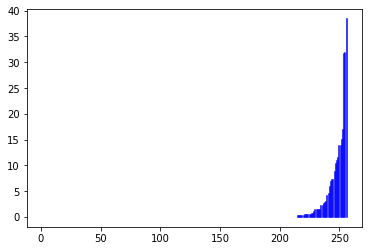

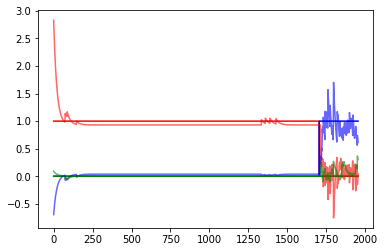

 60%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 1809/3000 [11:15:20<7:17:06, 22.02s/it]

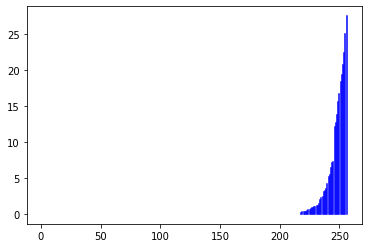

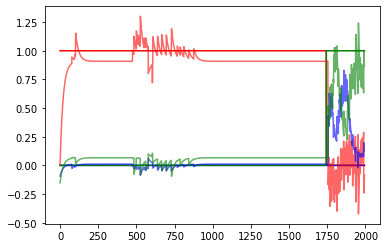

 60%|█████████████████████████████████████████████████████████████████████████████████████████████                                                             | 1814/3000 [11:17:06<6:56:56, 21.09s/it]

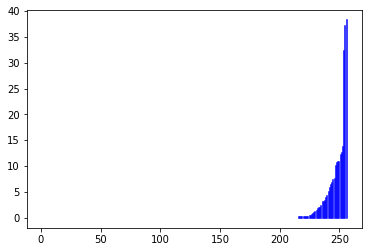

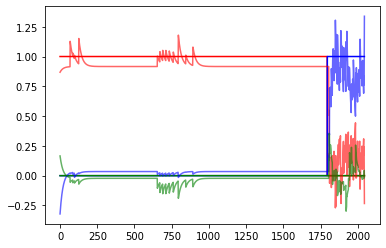

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 1819/3000 [11:18:54<6:49:51, 20.82s/it]

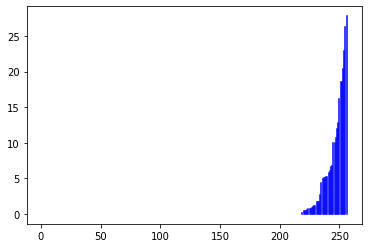

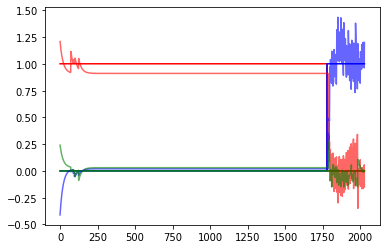

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 1824/3000 [11:20:41<6:49:42, 20.90s/it]

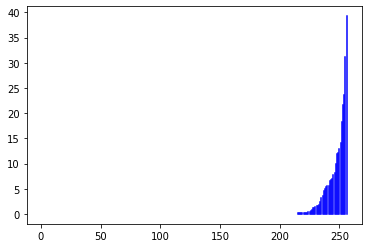

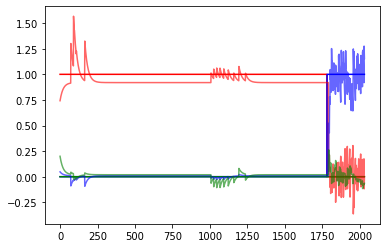

 61%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 1829/3000 [11:22:30<6:59:13, 21.48s/it]

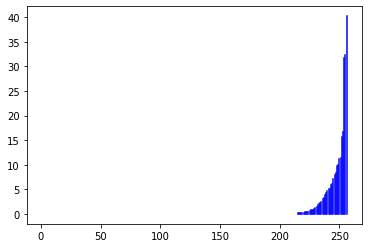

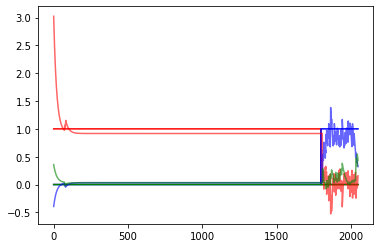

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 1834/3000 [11:24:17<6:43:40, 20.77s/it]

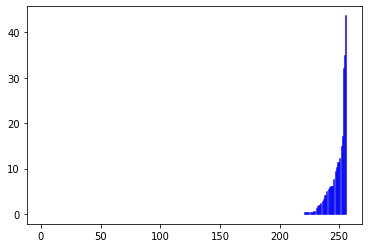

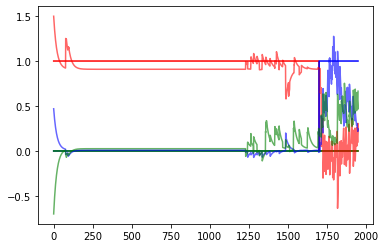

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 1839/3000 [11:26:03<6:37:07, 20.52s/it]

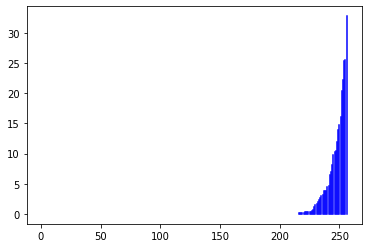

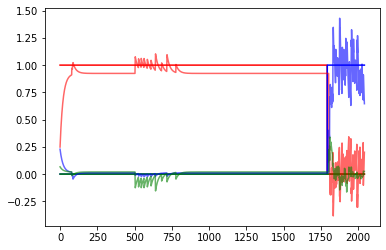

 61%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 1844/3000 [11:27:48<6:43:06, 20.92s/it]

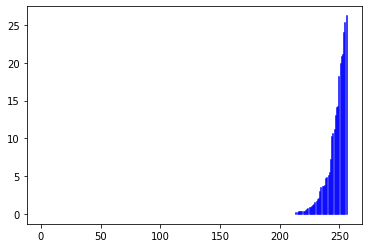

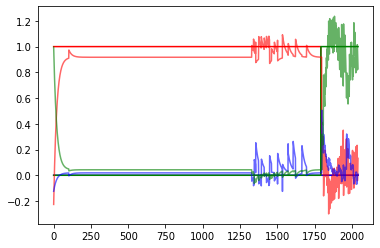

 62%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 1849/3000 [11:29:35<6:42:33, 20.98s/it]

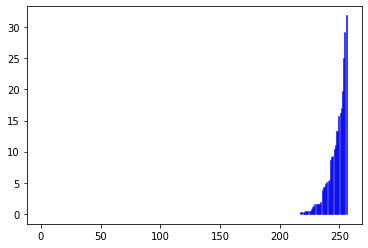

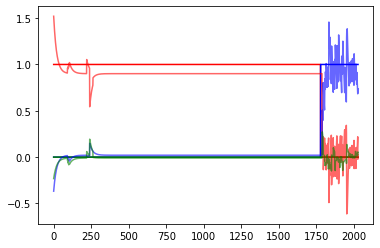

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 1854/3000 [11:32:15<7:53:25, 24.79s/it]

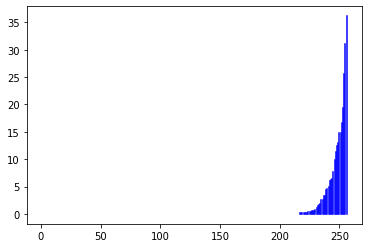

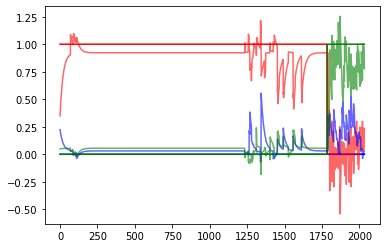

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 1859/3000 [11:34:07<7:06:59, 22.45s/it]

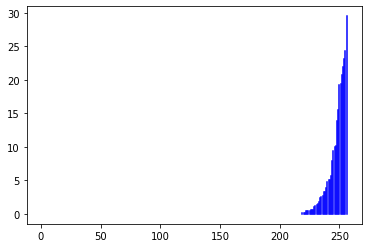

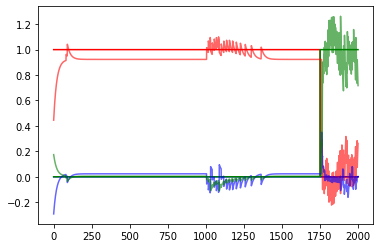

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 1864/3000 [11:35:50<6:22:48, 20.22s/it]

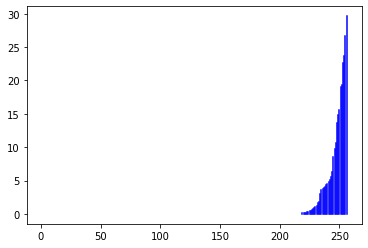

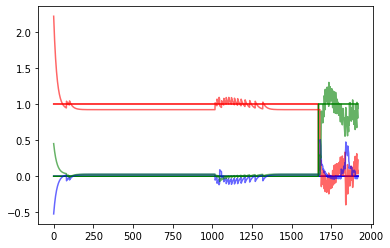

 62%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 1869/3000 [11:37:42<6:45:37, 21.52s/it]

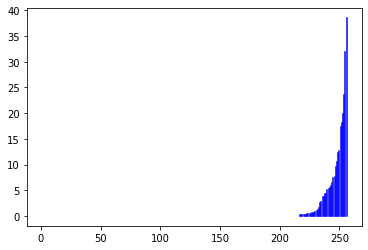

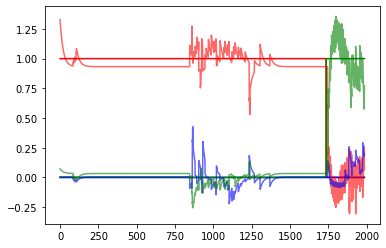

 62%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 1874/3000 [11:39:24<6:22:17, 20.37s/it]

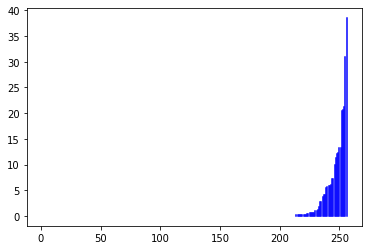

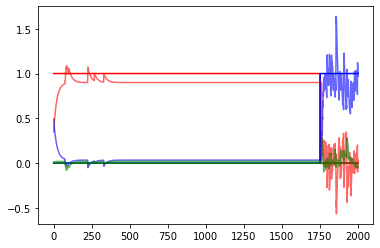

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 1879/3000 [11:41:05<6:16:03, 20.13s/it]

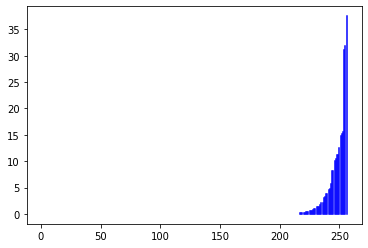

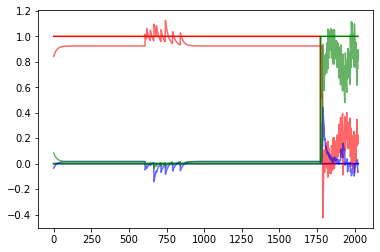

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 1884/3000 [11:42:53<6:31:02, 21.02s/it]

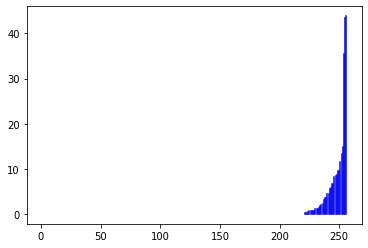

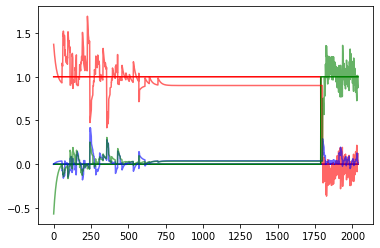

 63%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 1889/3000 [11:44:38<6:18:19, 20.43s/it]

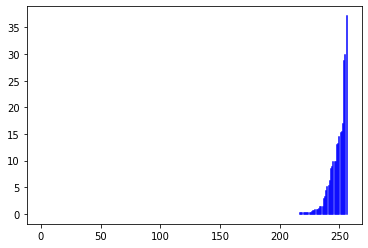

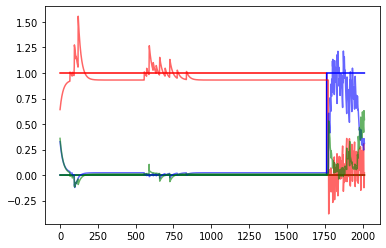

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 1894/3000 [11:46:24<6:26:50, 20.99s/it]

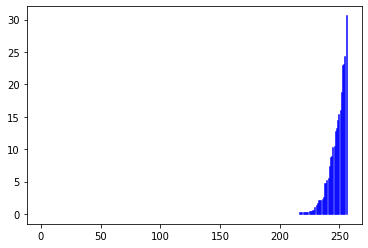

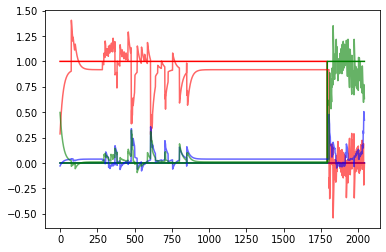

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 1899/3000 [11:48:10<6:17:47, 20.59s/it]

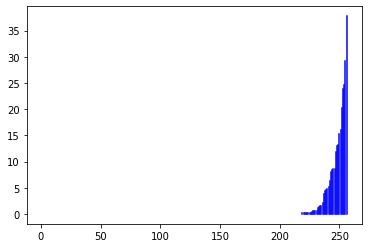

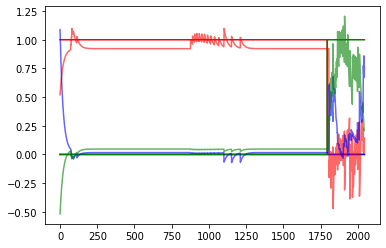

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 1904/3000 [11:50:44<7:12:14, 23.66s/it]

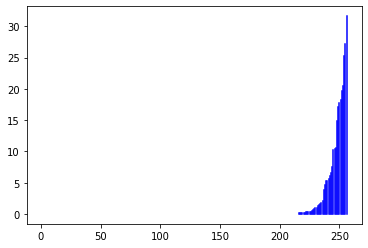

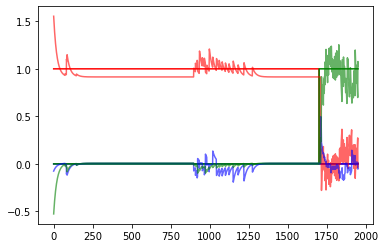

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 1909/3000 [11:52:30<6:30:48, 21.49s/it]

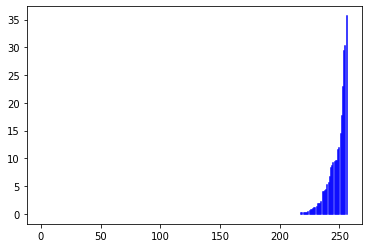

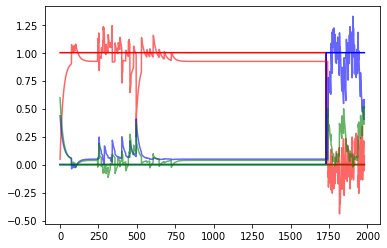

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 1914/3000 [11:54:19<6:22:45, 21.15s/it]

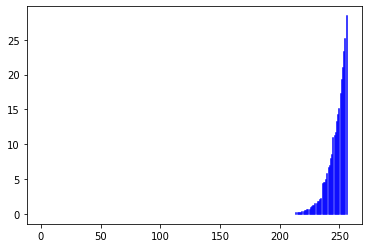

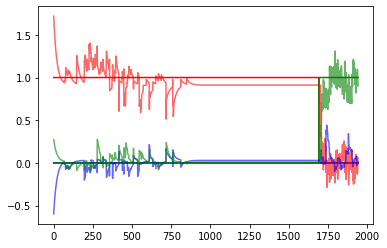

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 1919/3000 [11:56:04<6:18:06, 20.99s/it]

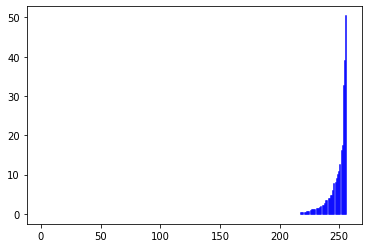

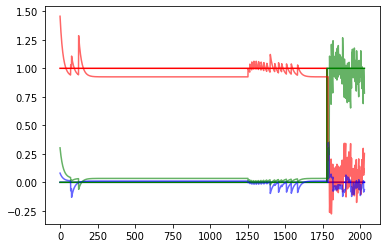

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 1924/3000 [11:57:54<6:22:15, 21.32s/it]

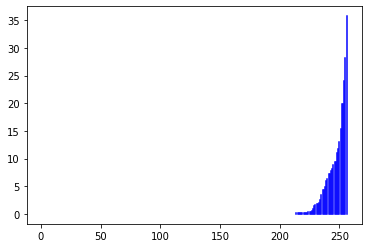

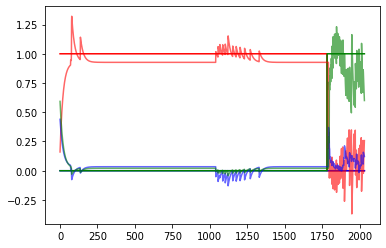

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 1929/3000 [11:59:42<6:24:51, 21.56s/it]

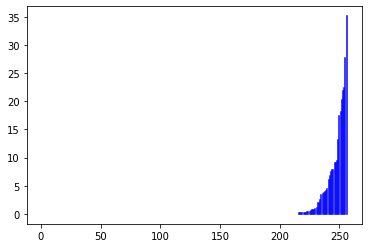

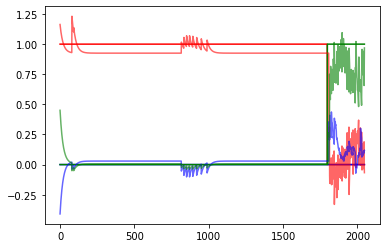

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 1934/3000 [12:01:27<6:10:23, 20.85s/it]

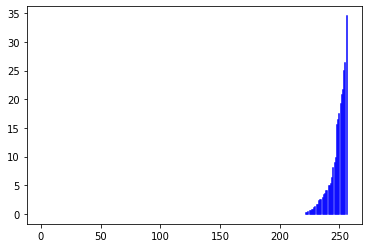

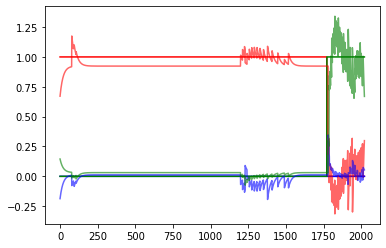

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 1939/3000 [12:03:16<6:16:53, 21.31s/it]

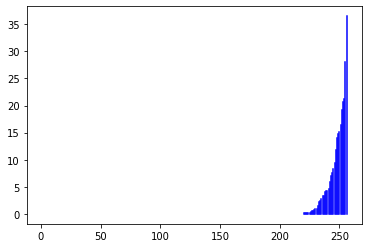

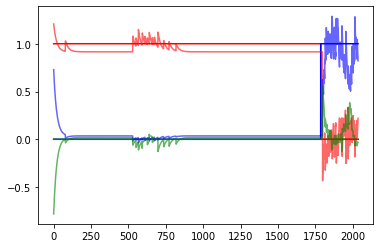

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 1944/3000 [12:05:08<6:22:17, 21.72s/it]

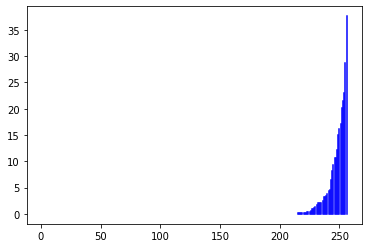

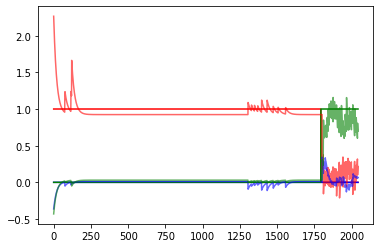

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 1949/3000 [12:06:56<6:03:01, 20.72s/it]

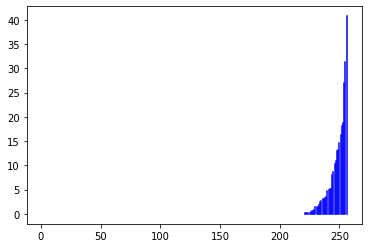

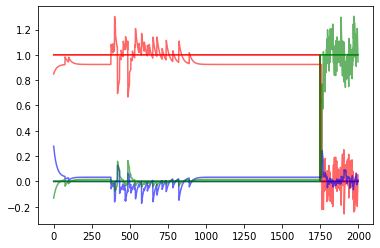

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 1954/3000 [12:09:33<7:06:59, 24.49s/it]

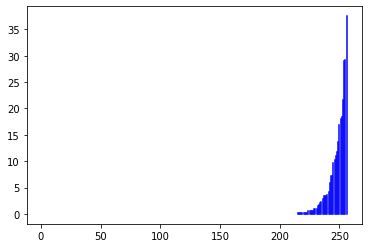

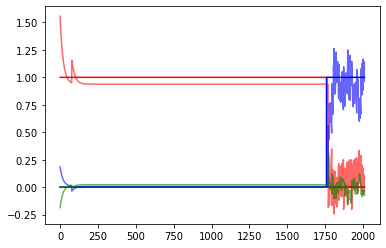

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 1959/3000 [12:11:18<6:12:33, 21.47s/it]

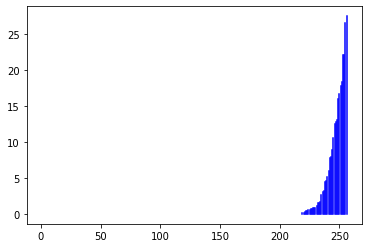

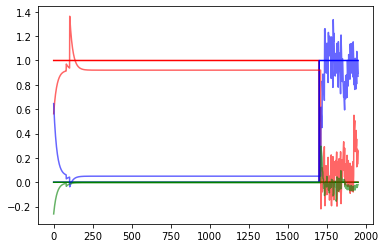

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 1964/3000 [12:13:08<6:11:25, 21.51s/it]

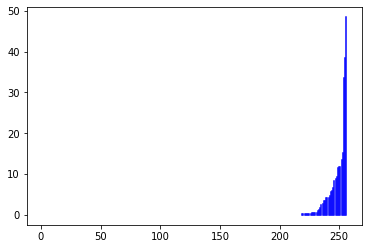

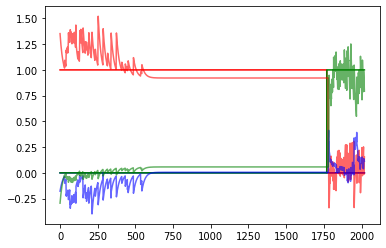

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 1969/3000 [12:14:55<5:57:06, 20.78s/it]

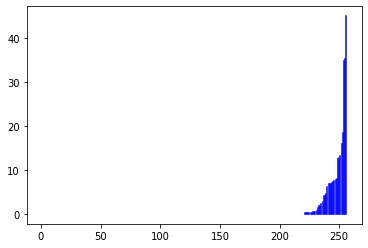

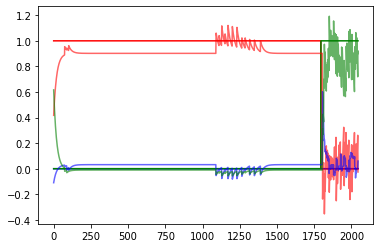

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 1974/3000 [12:16:46<6:09:06, 21.58s/it]

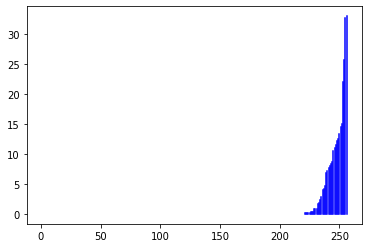

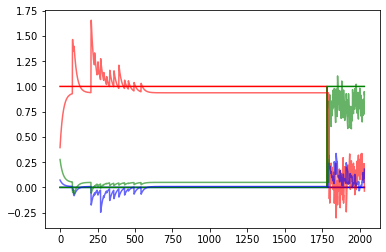

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 1979/3000 [12:18:39<6:14:28, 22.01s/it]

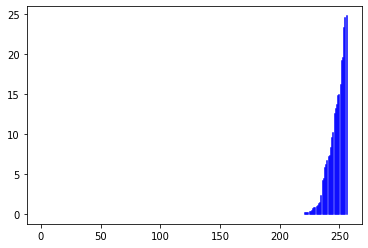

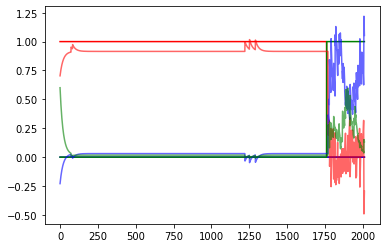

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 1984/3000 [12:20:25<5:52:43, 20.83s/it]

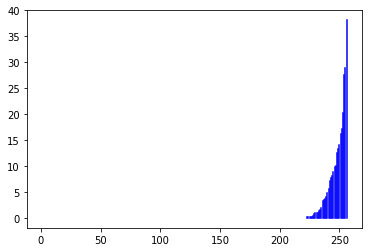

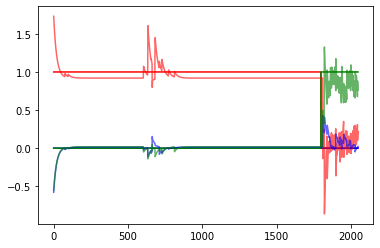

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 1989/3000 [12:22:13<5:56:36, 21.16s/it]

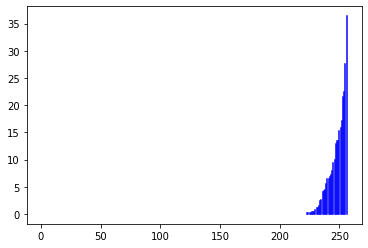

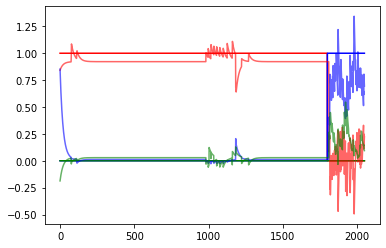

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 1994/3000 [12:24:03<5:56:18, 21.25s/it]

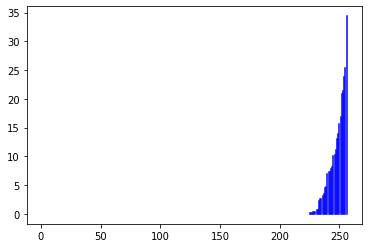

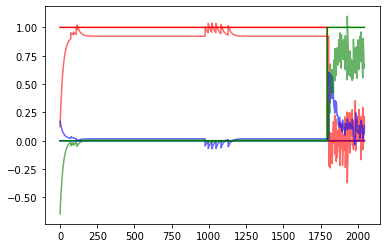

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 1999/3000 [12:25:52<5:57:50, 21.45s/it]

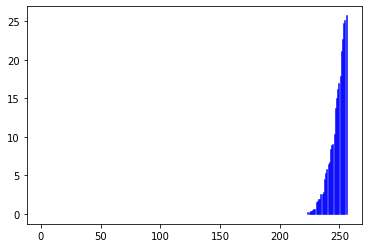

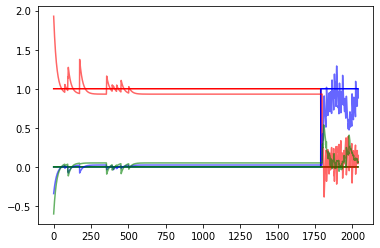

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 2004/3000 [12:28:25<6:41:32, 24.19s/it]

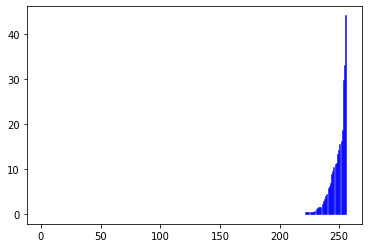

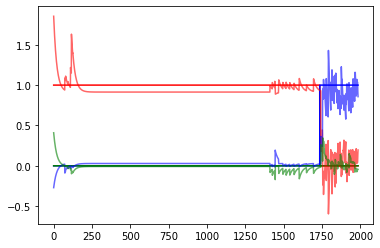

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 2009/3000 [12:30:10<5:49:29, 21.16s/it]

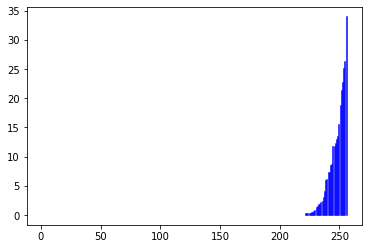

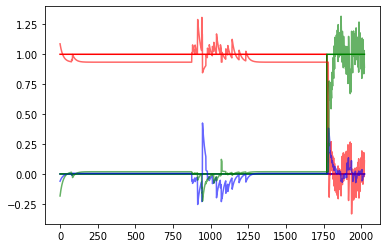

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 2014/3000 [12:32:00<5:46:06, 21.06s/it]

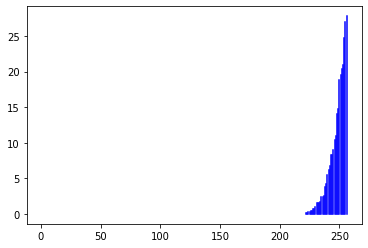

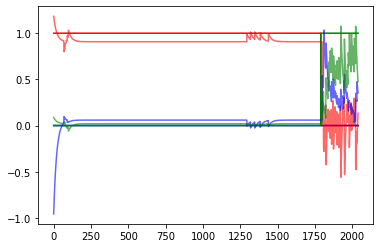

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 2019/3000 [12:33:49<5:53:44, 21.64s/it]

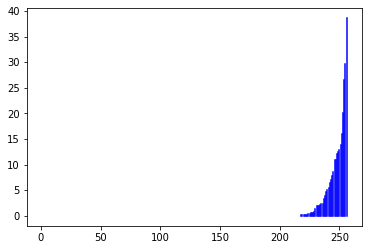

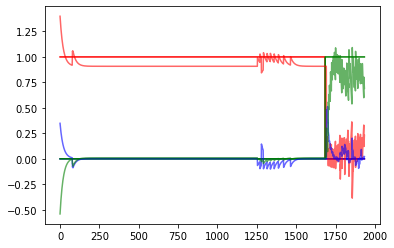

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2024/3000 [12:35:34<5:33:37, 20.51s/it]

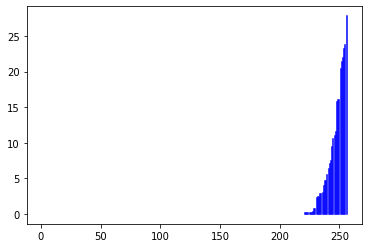

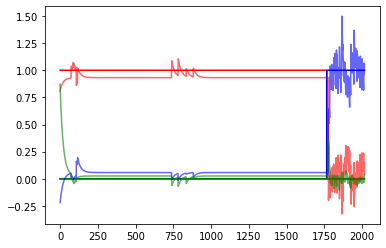

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 2029/3000 [12:37:17<5:24:45, 20.07s/it]

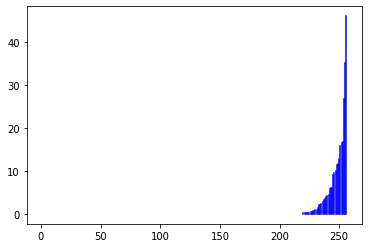

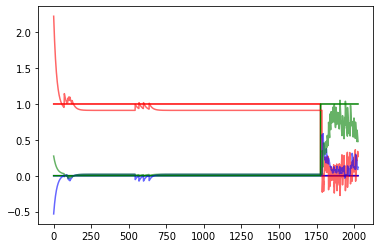

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 2034/3000 [12:39:05<5:42:29, 21.27s/it]

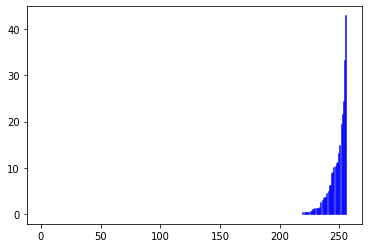

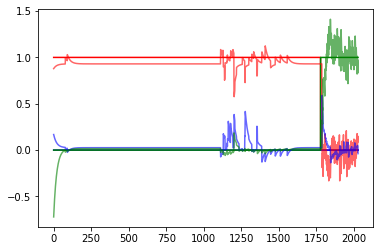

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 2039/3000 [12:40:55<5:48:38, 21.77s/it]

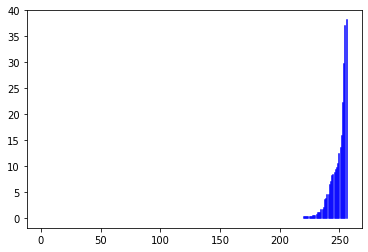

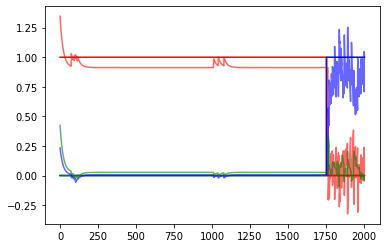

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 2044/3000 [12:42:38<5:20:32, 20.12s/it]

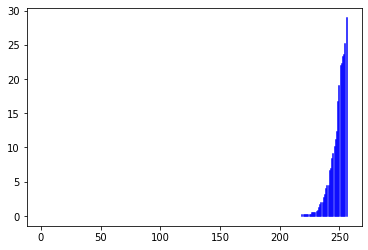

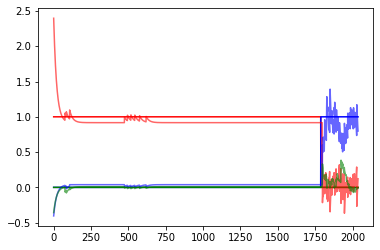

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 2049/3000 [12:44:26<5:34:44, 21.12s/it]

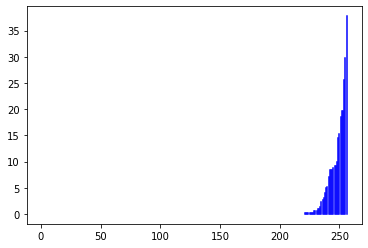

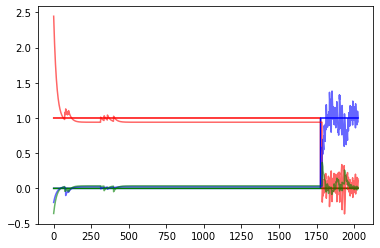

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 2054/3000 [12:47:06<6:32:52, 24.92s/it]

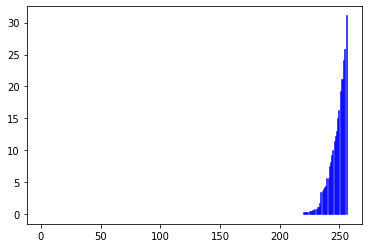

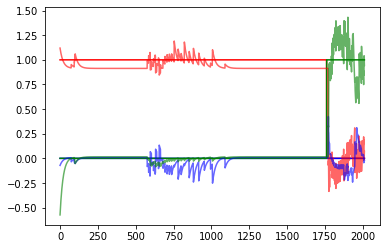

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 2059/3000 [12:48:54<5:44:57, 22.00s/it]

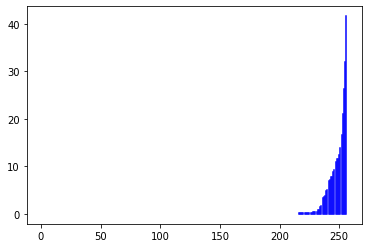

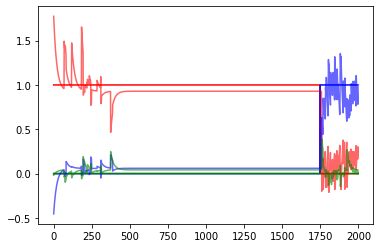

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 2064/3000 [12:50:38<5:15:41, 20.24s/it]

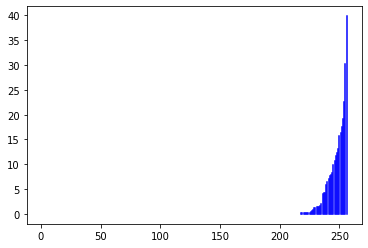

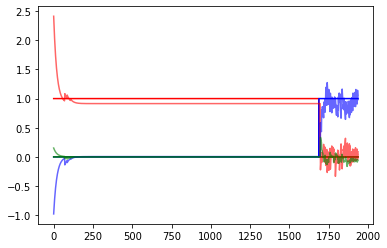

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 2069/3000 [12:52:20<5:12:55, 20.17s/it]

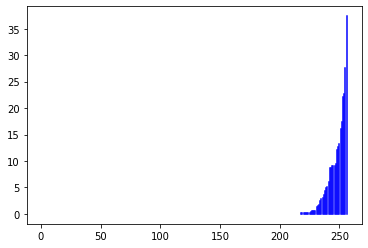

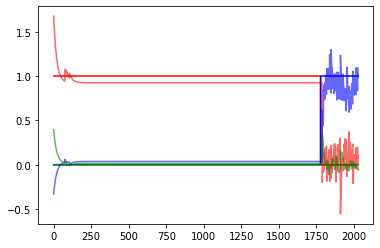

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 2074/3000 [12:54:08<5:28:13, 21.27s/it]

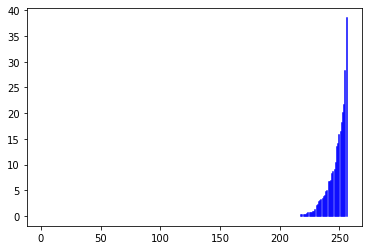

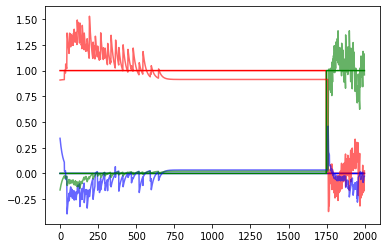

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 2079/3000 [12:55:54<5:15:50, 20.58s/it]

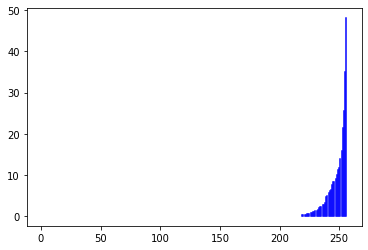

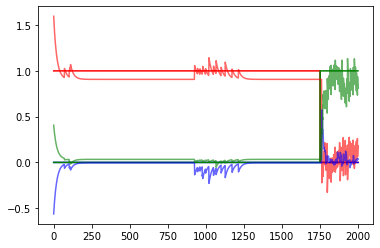

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 2084/3000 [12:57:38<5:05:16, 20.00s/it]

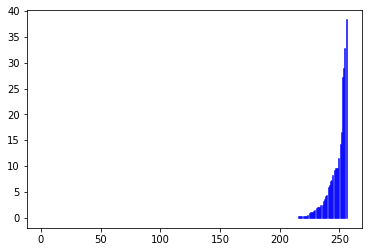

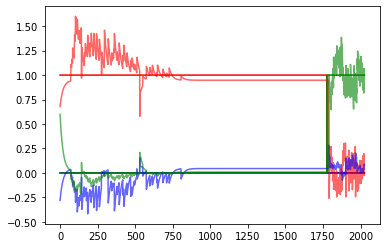

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 2089/3000 [12:59:24<5:08:36, 20.33s/it]

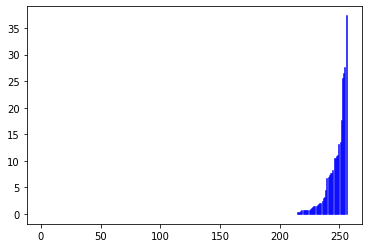

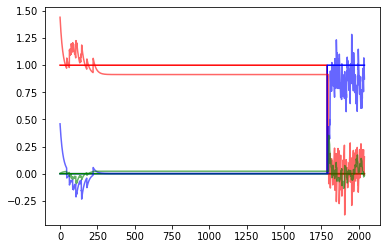

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 2094/3000 [13:01:13<5:15:08, 20.87s/it]

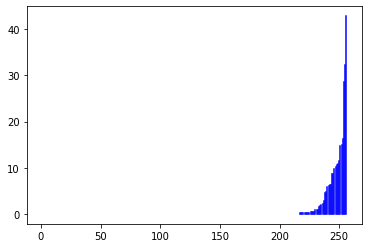

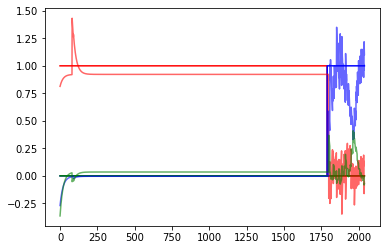

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 2099/3000 [13:03:00<5:18:46, 21.23s/it]

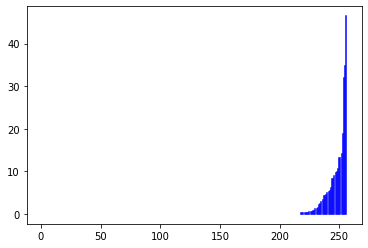

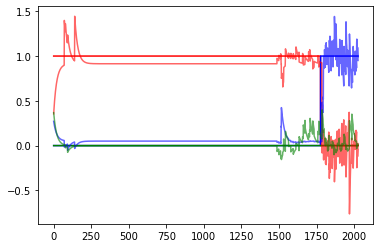

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 2104/3000 [13:05:40<6:16:22, 25.20s/it]

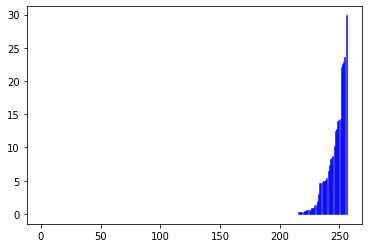

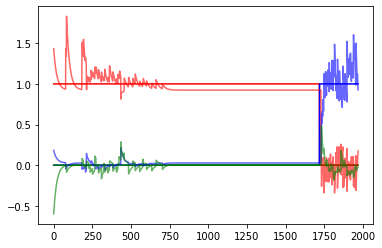

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 2109/3000 [13:07:24<5:10:44, 20.93s/it]

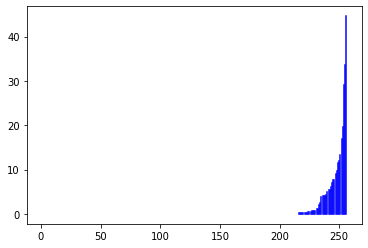

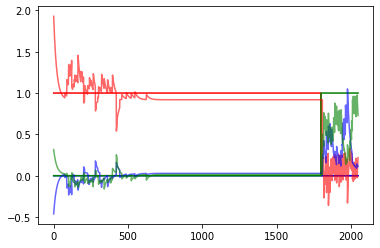

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 2114/3000 [13:09:11<5:10:44, 21.04s/it]

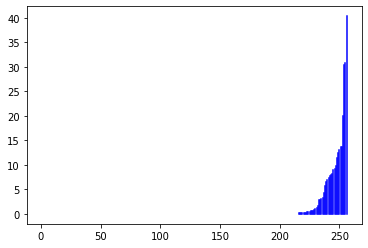

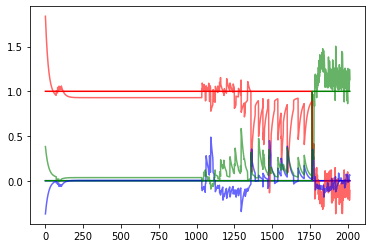

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 2119/3000 [13:10:59<5:10:40, 21.16s/it]

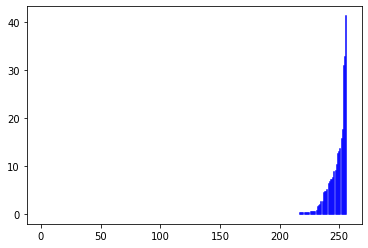

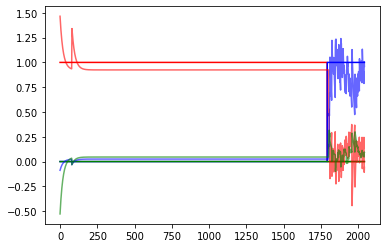

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 2124/3000 [13:12:49<5:14:07, 21.52s/it]

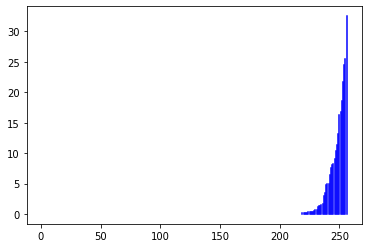

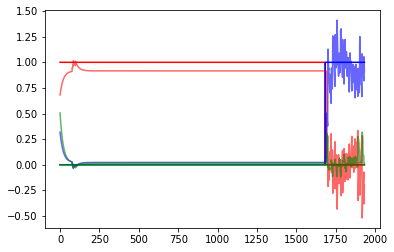

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 2129/3000 [13:14:36<5:04:54, 21.00s/it]

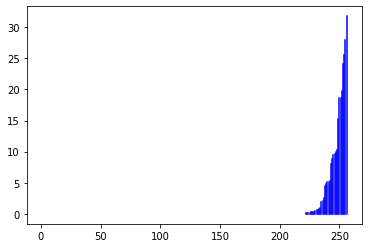

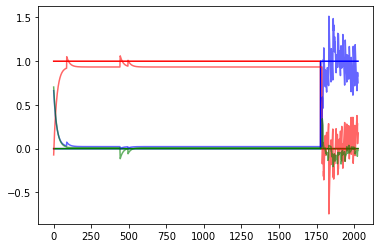

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 2134/3000 [13:16:24<5:01:34, 20.89s/it]

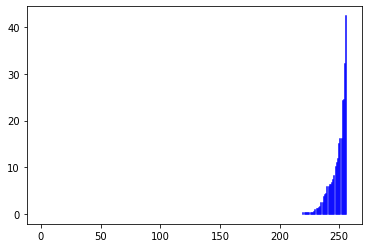

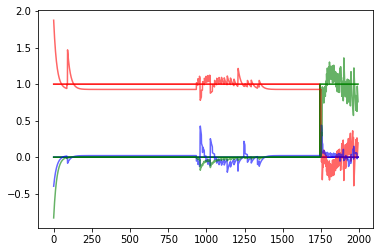

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 2139/3000 [13:18:12<5:04:01, 21.19s/it]

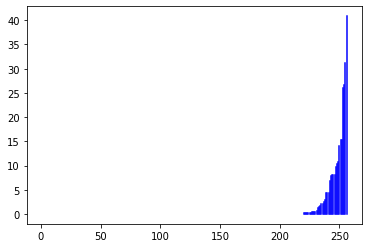

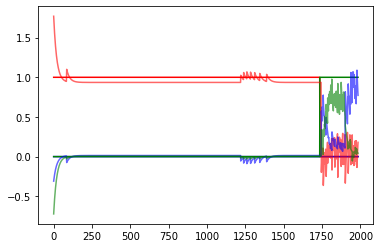

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 2144/3000 [13:20:02<5:03:53, 21.30s/it]

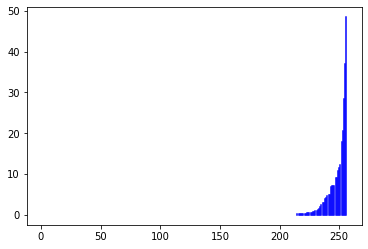

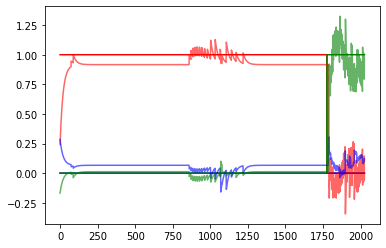

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 2149/3000 [13:21:52<5:07:49, 21.70s/it]

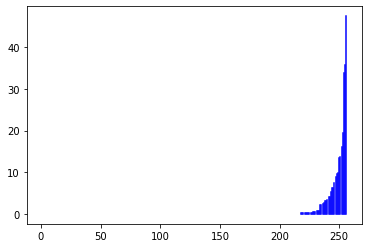

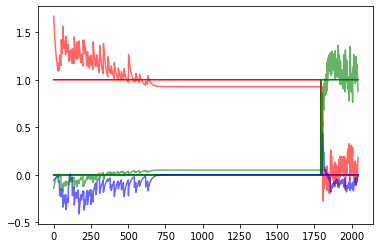

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 2154/3000 [13:24:30<5:46:54, 24.60s/it]

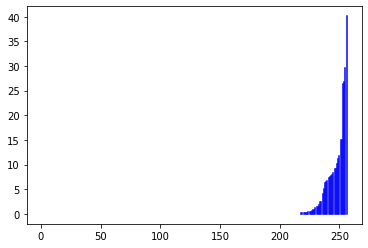

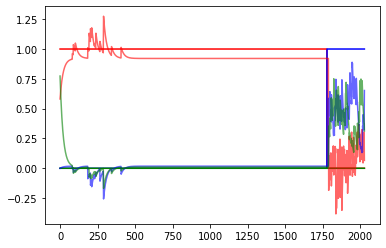

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 2159/3000 [13:26:17<4:58:20, 21.28s/it]

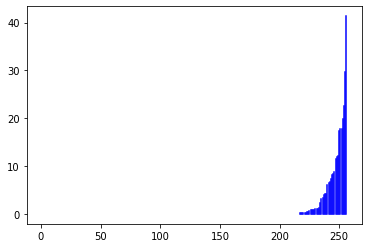

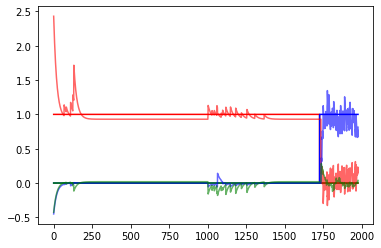

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 2164/3000 [13:28:04<4:53:07, 21.04s/it]

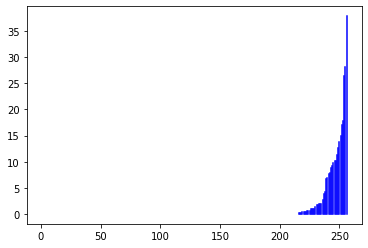

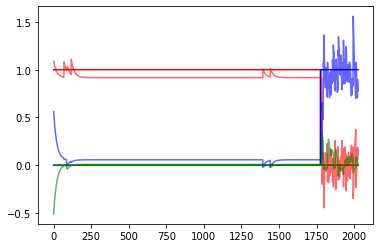

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 2169/3000 [13:29:51<4:43:44, 20.49s/it]

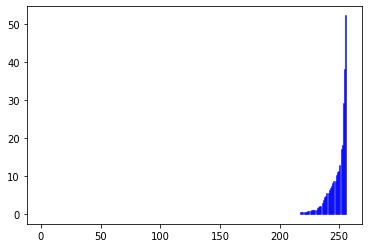

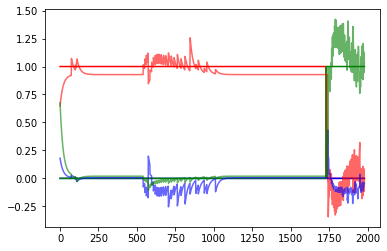

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 2174/3000 [13:31:37<4:43:52, 20.62s/it]

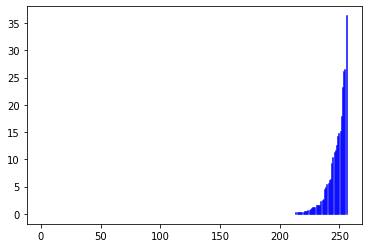

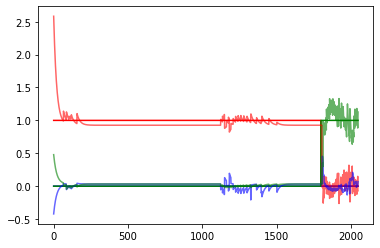

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2179/3000 [13:33:26<4:48:32, 21.09s/it]

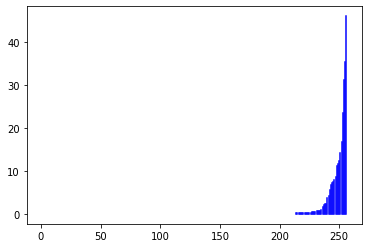

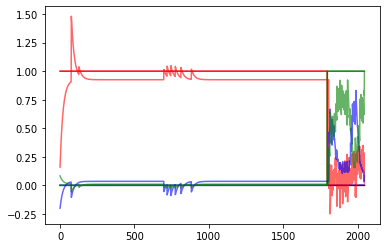

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 2184/3000 [13:35:13<4:48:51, 21.24s/it]

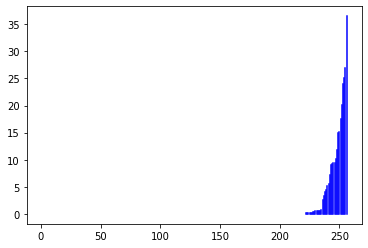

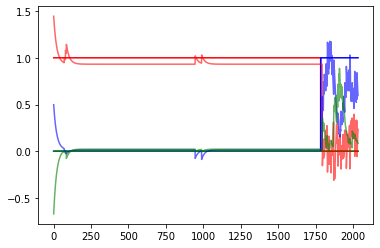

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 2189/3000 [13:37:01<4:50:26, 21.49s/it]

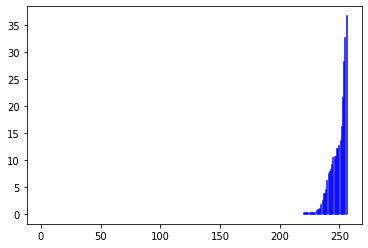

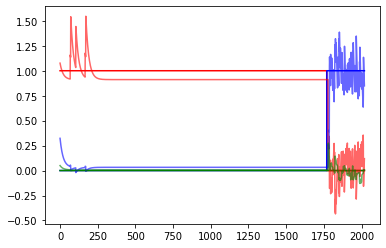

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 2194/3000 [13:38:45<4:34:33, 20.44s/it]

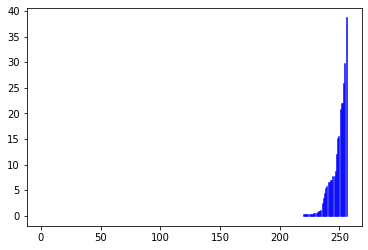

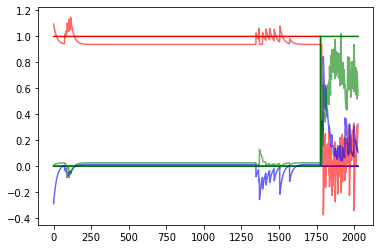

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 2199/3000 [13:40:35<4:46:30, 21.46s/it]

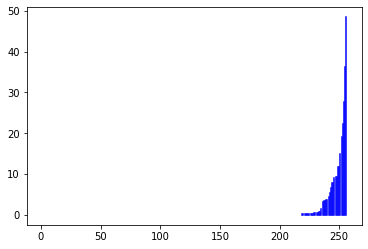

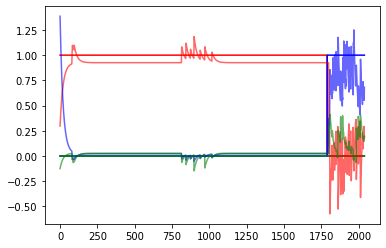

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 2204/3000 [13:43:14<5:27:28, 24.68s/it]

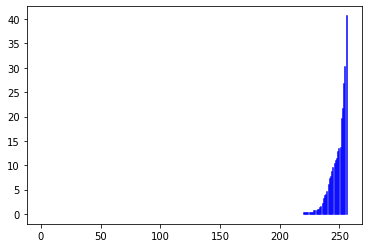

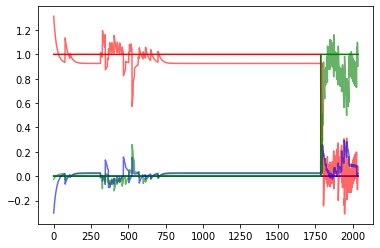

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 2209/3000 [13:44:59<4:44:13, 21.56s/it]

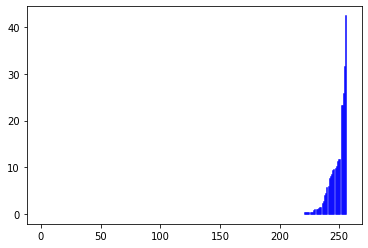

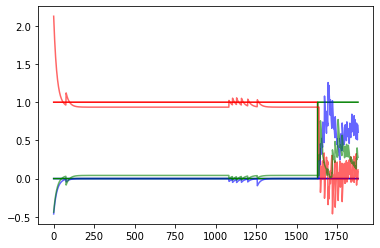

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 2214/3000 [13:46:44<4:32:40, 20.81s/it]

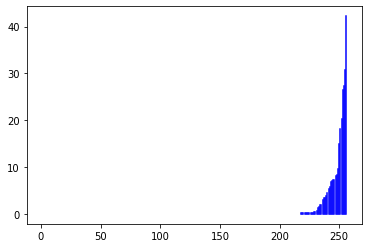

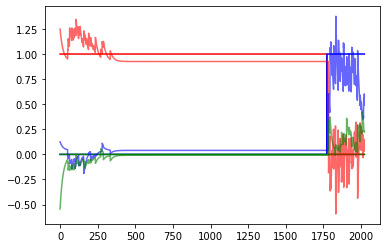

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 2219/3000 [13:48:29<4:28:32, 20.63s/it]

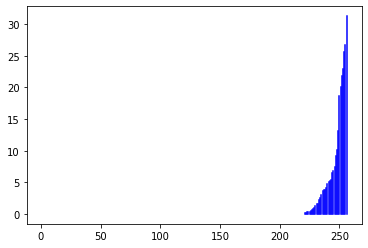

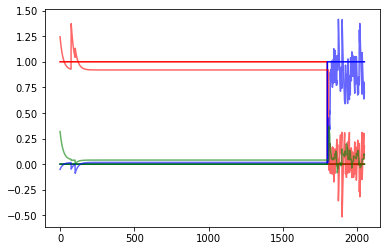

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 2224/3000 [13:50:17<4:32:11, 21.05s/it]

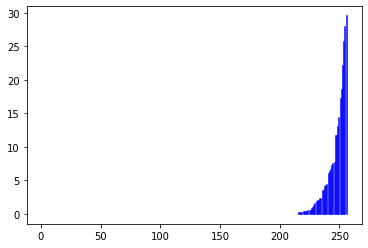

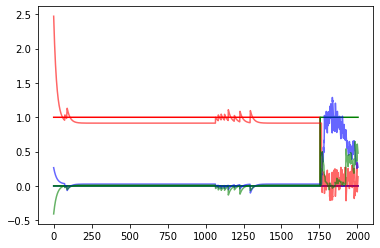

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 2229/3000 [13:52:03<4:26:13, 20.72s/it]

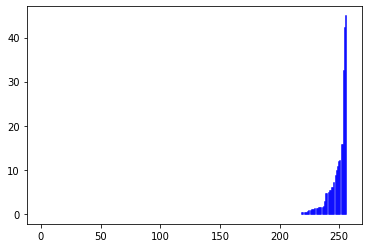

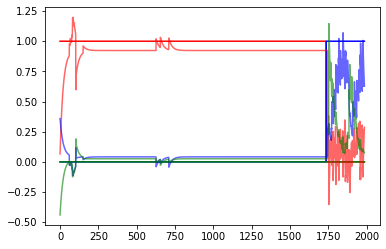

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 2234/3000 [13:53:52<4:35:59, 21.62s/it]

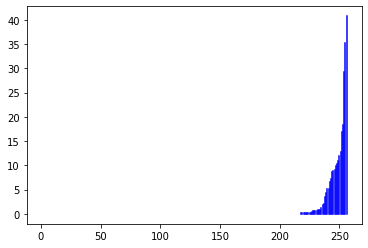

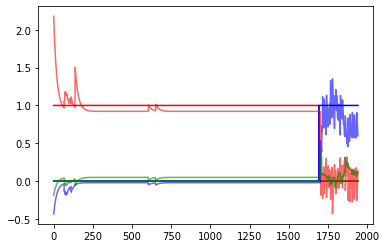

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 2239/3000 [13:55:38<4:22:43, 20.71s/it]

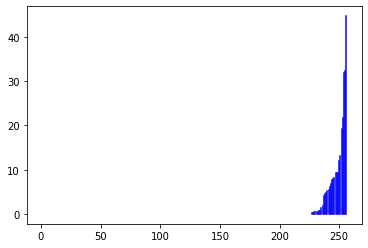

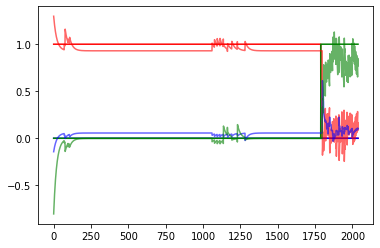

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 2244/3000 [13:57:21<4:16:38, 20.37s/it]

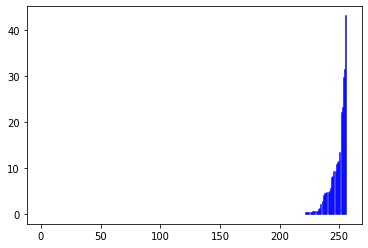

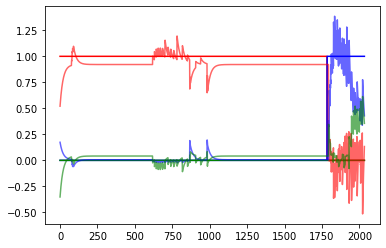

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 2249/3000 [13:59:06<4:18:45, 20.67s/it]

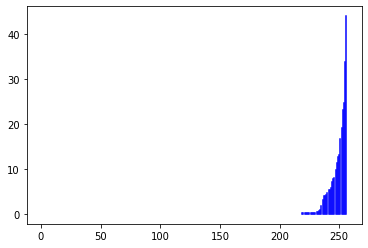

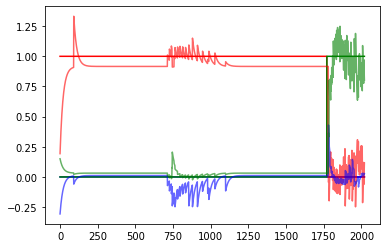

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2254/3000 [14:01:41<5:00:11, 24.14s/it]

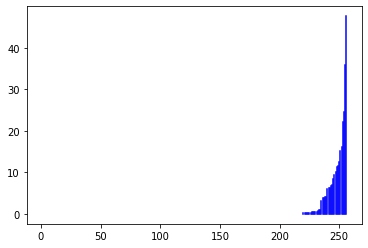

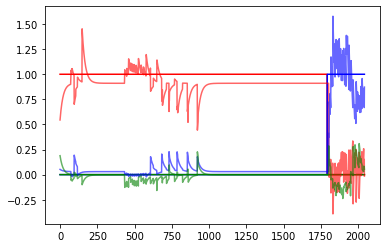

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 2259/3000 [14:03:26<4:22:33, 21.26s/it]

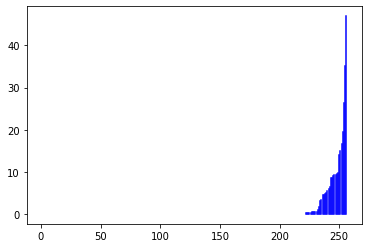

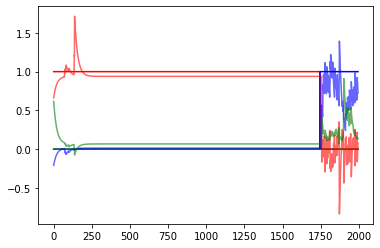

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 2264/3000 [14:05:09<4:10:10, 20.40s/it]

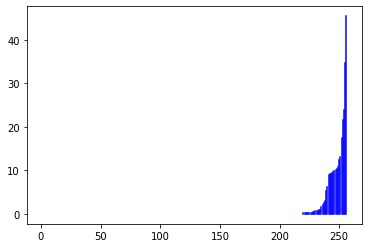

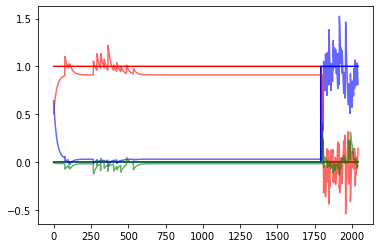

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 2269/3000 [14:06:56<4:10:15, 20.54s/it]

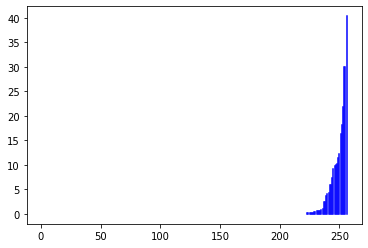

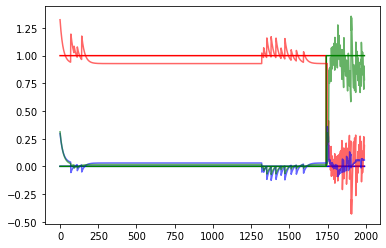

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 2274/3000 [14:08:47<4:23:08, 21.75s/it]

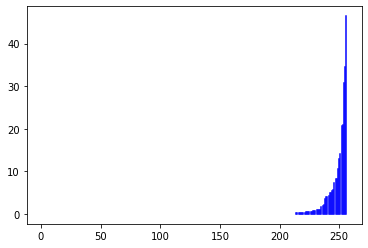

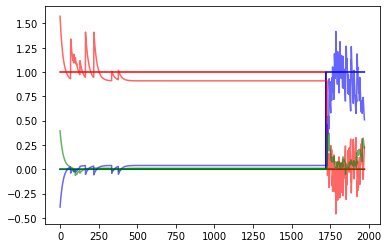

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 2279/3000 [14:10:34<4:09:59, 20.80s/it]

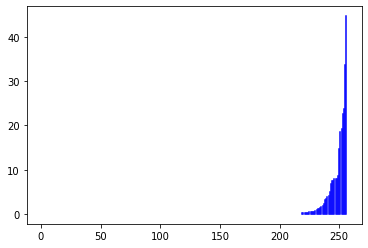

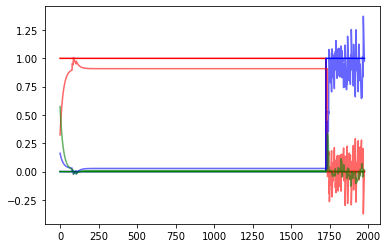

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 2284/3000 [14:12:23<4:15:23, 21.40s/it]

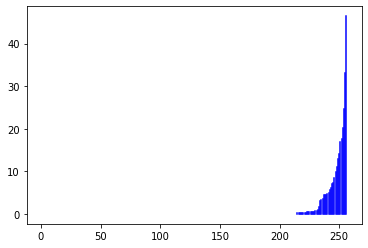

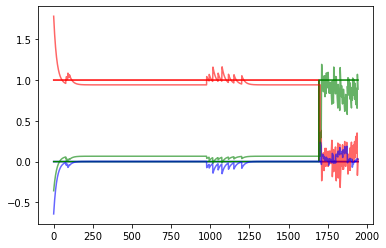

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 2289/3000 [14:14:09<4:05:04, 20.68s/it]

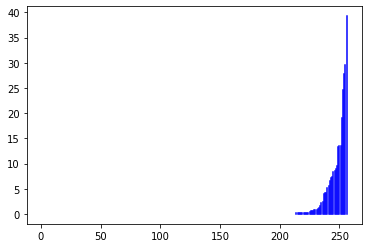

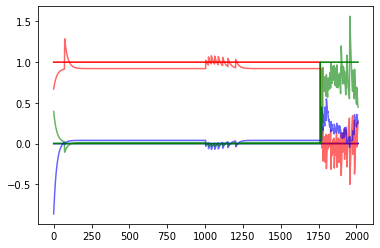

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 2294/3000 [14:15:53<3:58:58, 20.31s/it]

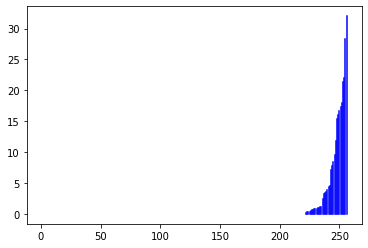

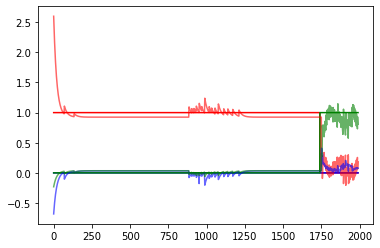

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 2299/3000 [14:17:39<4:02:41, 20.77s/it]

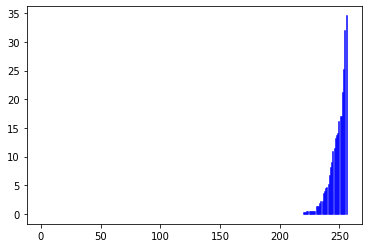

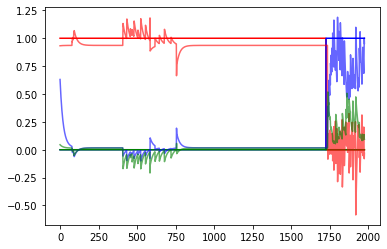

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 2304/3000 [14:20:15<4:46:23, 24.69s/it]

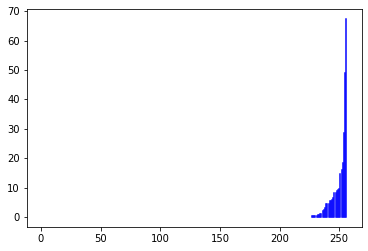

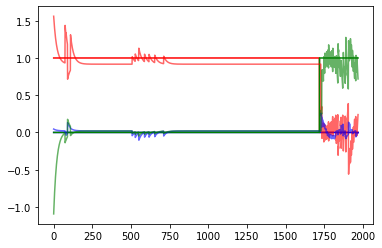

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 2309/3000 [14:22:07<4:11:50, 21.87s/it]

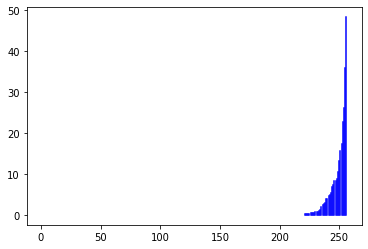

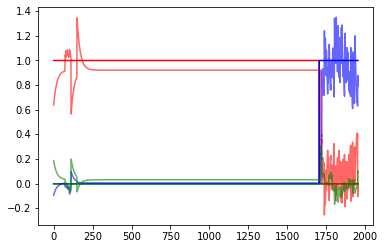

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 2314/3000 [14:23:56<4:06:17, 21.54s/it]

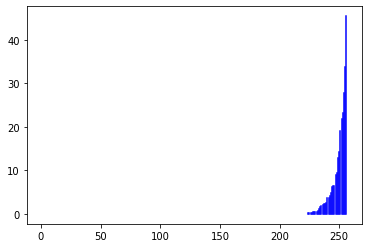

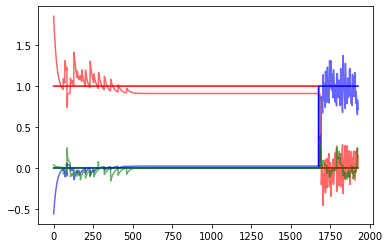

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 2319/3000 [14:25:43<3:57:14, 20.90s/it]

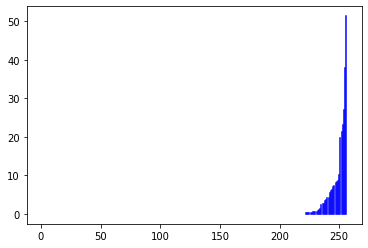

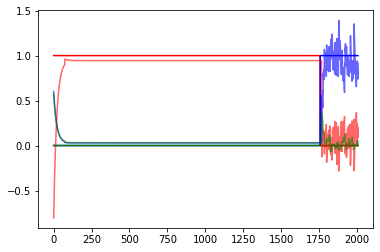

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 2324/3000 [14:27:29<3:55:12, 20.88s/it]

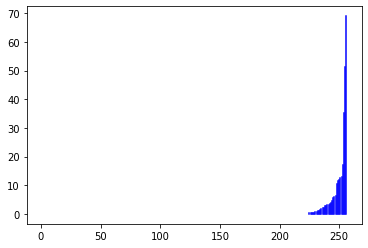

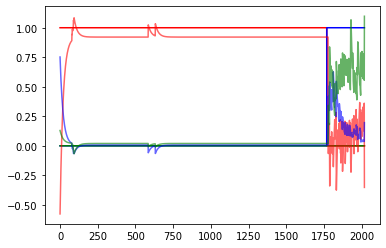

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 2329/3000 [14:29:18<3:57:16, 21.22s/it]

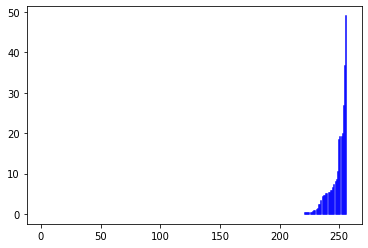

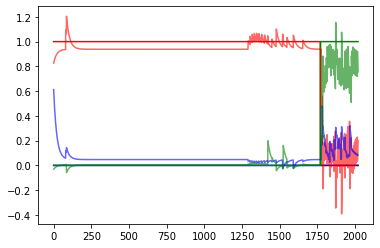

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2334/3000 [14:31:08<3:58:44, 21.51s/it]

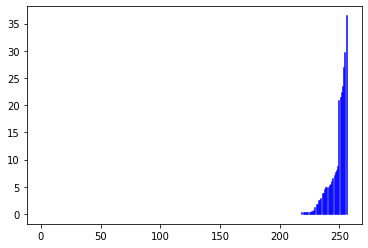

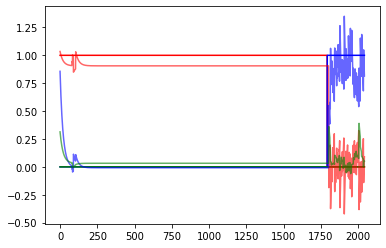

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 2339/3000 [14:32:51<3:44:11, 20.35s/it]

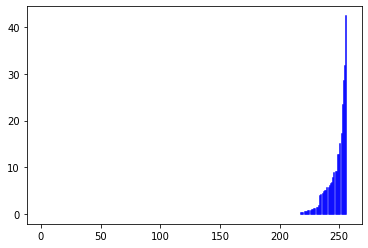

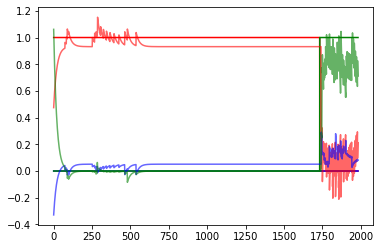

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 2344/3000 [14:34:35<3:40:58, 20.21s/it]

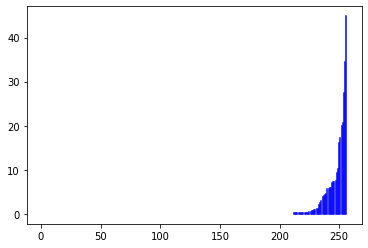

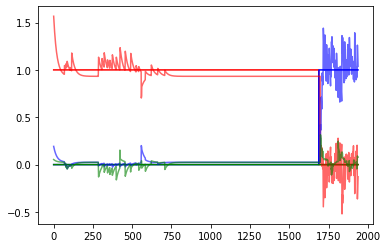

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 2349/3000 [14:36:22<3:47:18, 20.95s/it]

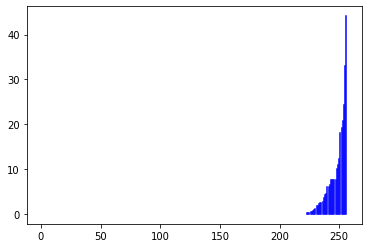

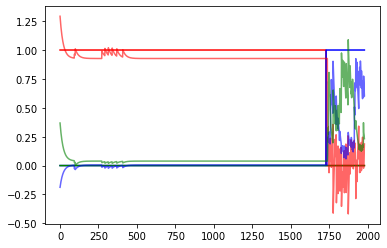

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 2354/3000 [14:39:01<4:27:26, 24.84s/it]

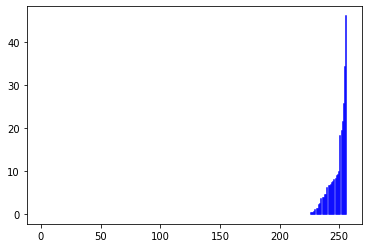

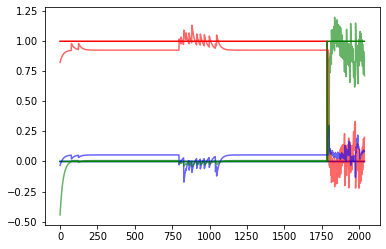

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 2359/3000 [14:40:46<3:48:26, 21.38s/it]

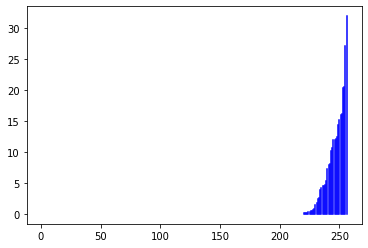

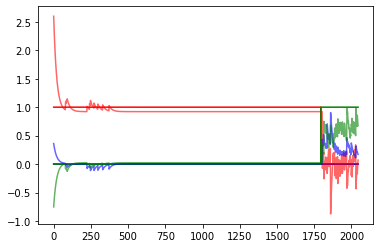

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 2364/3000 [14:42:36<3:48:56, 21.60s/it]

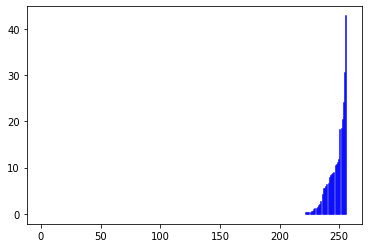

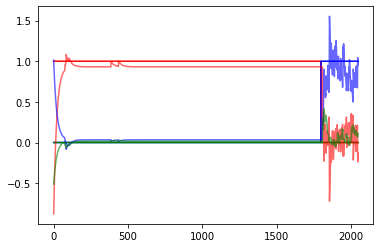

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 2369/3000 [14:44:26<3:48:01, 21.68s/it]

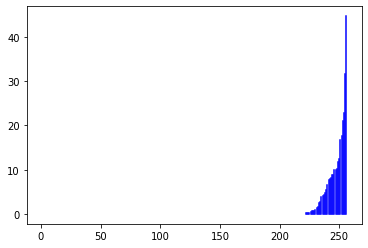

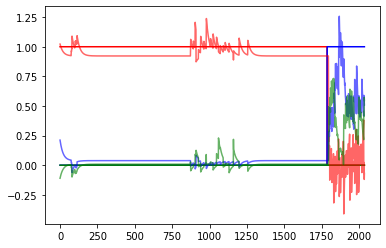

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 2374/3000 [14:46:13<3:41:08, 21.20s/it]

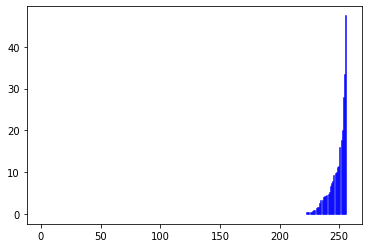

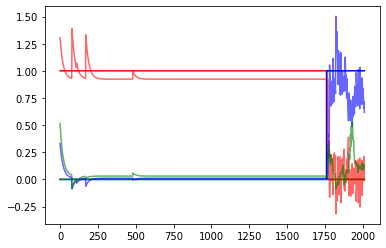

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 2379/3000 [14:48:00<3:38:00, 21.06s/it]

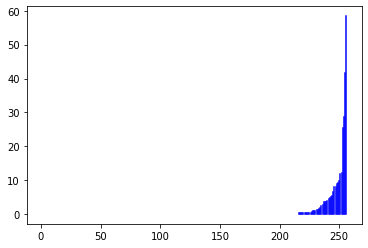

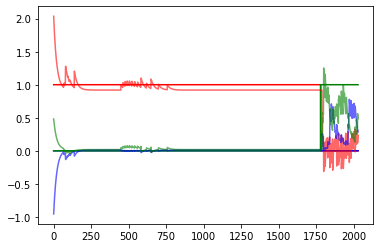

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 2384/3000 [14:49:49<3:38:01, 21.24s/it]

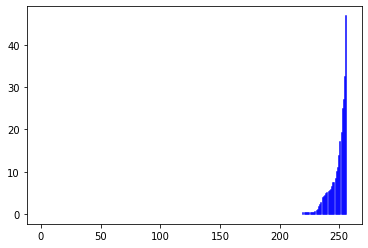

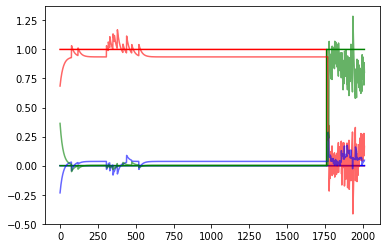

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 2389/3000 [14:51:39<3:37:20, 21.34s/it]

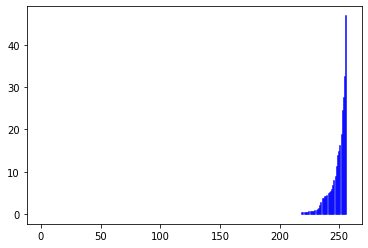

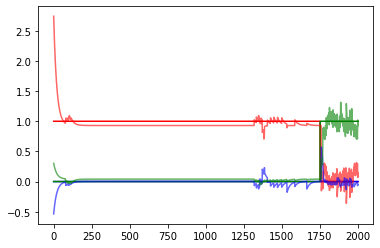

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 2394/3000 [14:53:23<3:31:45, 20.97s/it]

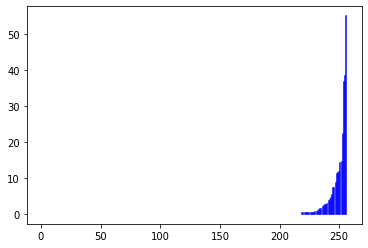

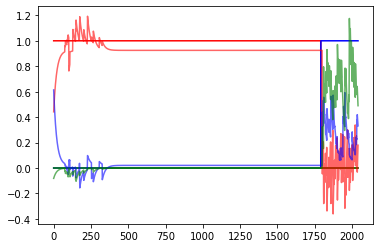

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 2399/3000 [14:55:10<3:31:21, 21.10s/it]

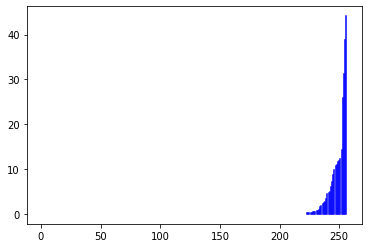

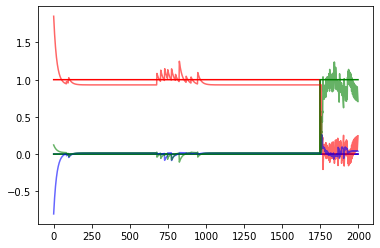

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 2404/3000 [14:57:47<4:01:18, 24.29s/it]

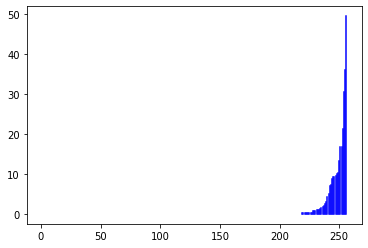

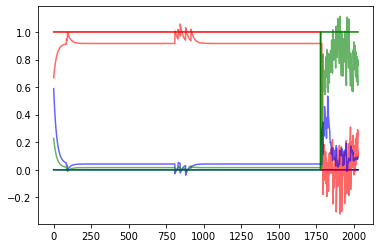

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2409/3000 [14:59:35<3:30:23, 21.36s/it]

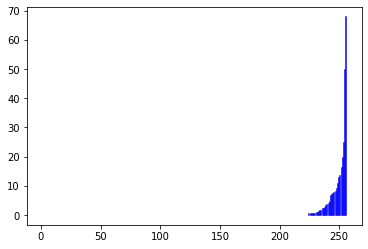

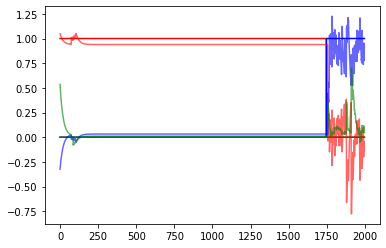

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 2414/3000 [15:01:21<3:24:18, 20.92s/it]

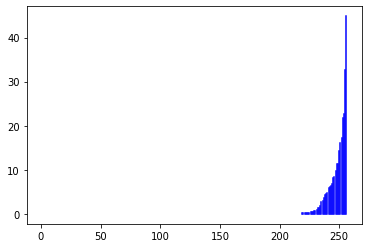

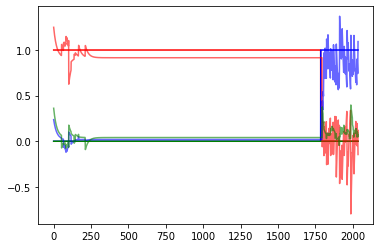

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 2419/3000 [15:03:10<3:29:16, 21.61s/it]

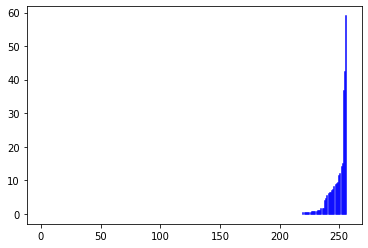

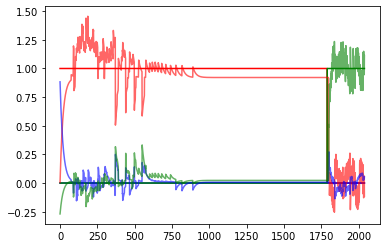

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 2424/3000 [15:04:56<3:19:01, 20.73s/it]

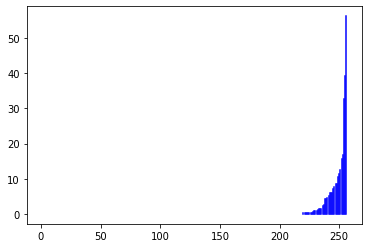

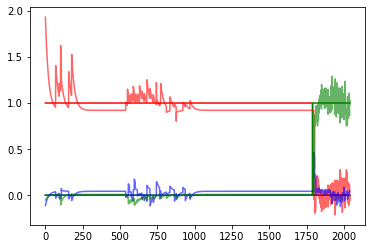

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 2429/3000 [15:06:43<3:18:42, 20.88s/it]

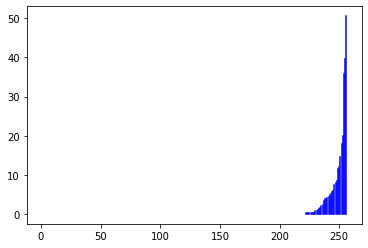

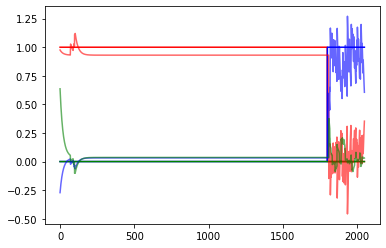

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 2434/3000 [15:08:27<3:12:08, 20.37s/it]

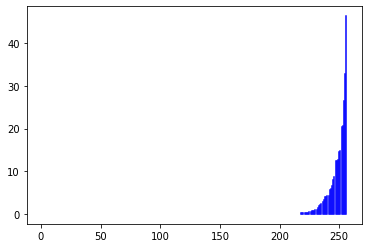

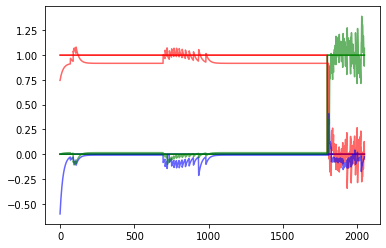

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 2439/3000 [15:10:16<3:19:22, 21.32s/it]

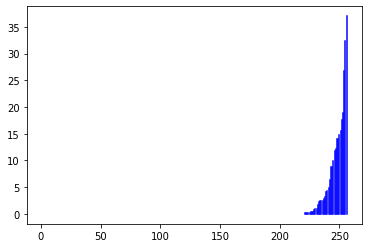

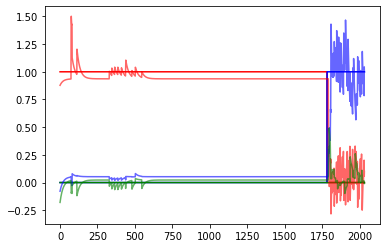

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 2444/3000 [15:12:04<3:14:37, 21.00s/it]

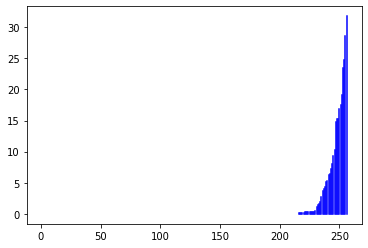

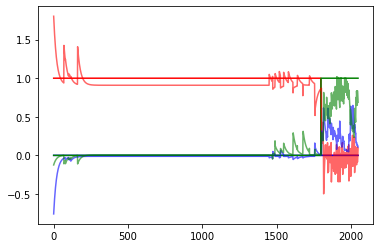

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 2449/3000 [15:13:51<3:11:54, 20.90s/it]

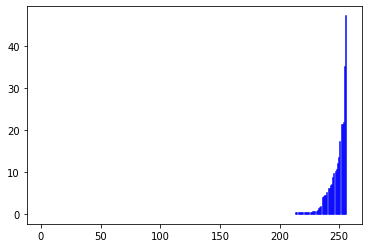

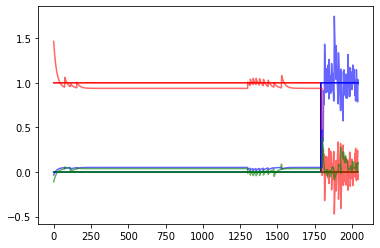

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 2454/3000 [15:16:29<3:45:03, 24.73s/it]

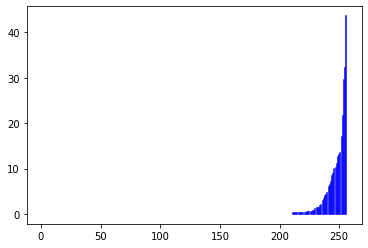

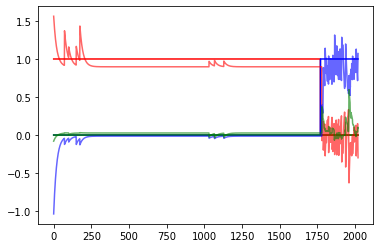

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 2459/3000 [15:18:17<3:17:55, 21.95s/it]

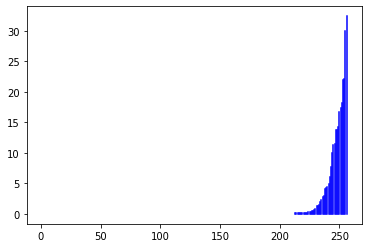

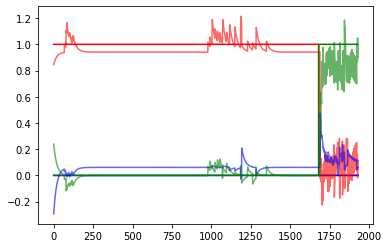

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 2464/3000 [15:20:04<3:08:24, 21.09s/it]

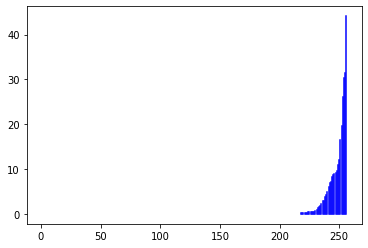

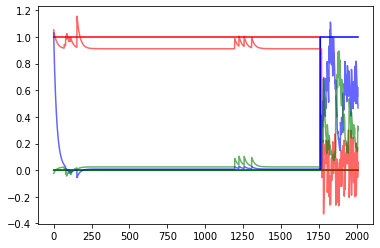

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 2469/3000 [15:21:46<2:59:32, 20.29s/it]

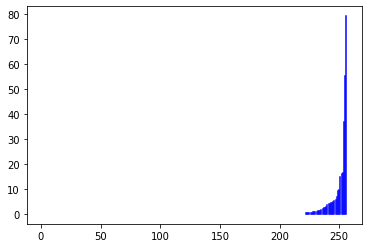

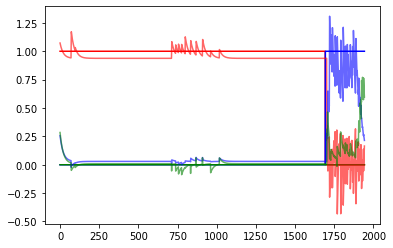

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 2474/3000 [15:23:36<3:05:40, 21.18s/it]

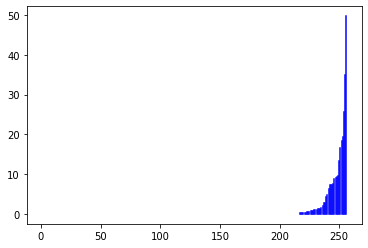

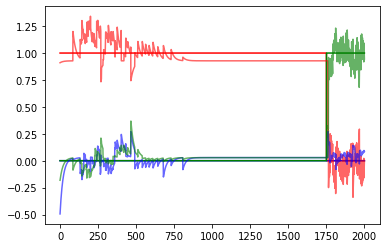

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 2479/3000 [15:25:23<3:03:24, 21.12s/it]

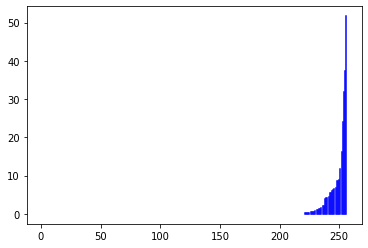

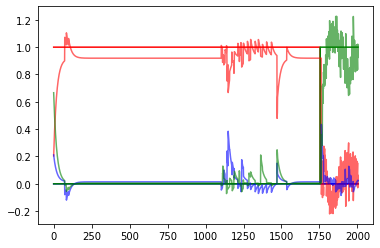

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 2484/3000 [15:27:11<3:00:55, 21.04s/it]

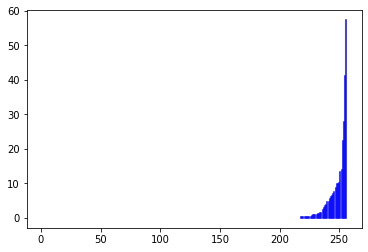

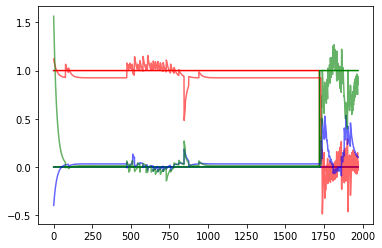

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2489/3000 [15:28:55<2:50:30, 20.02s/it]

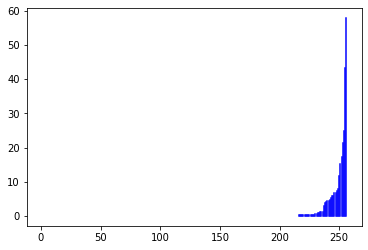

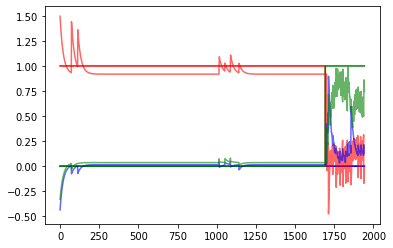

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 2494/3000 [15:30:37<2:50:18, 20.19s/it]

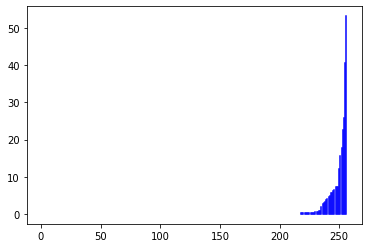

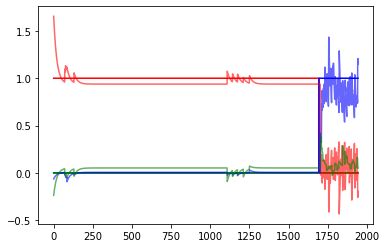

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 2499/3000 [15:32:28<3:00:48, 21.65s/it]

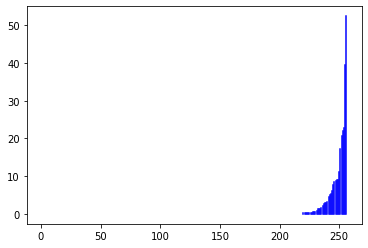

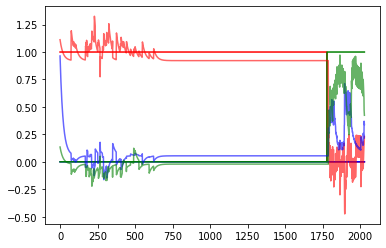

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 2504/3000 [15:35:10<3:30:56, 25.52s/it]

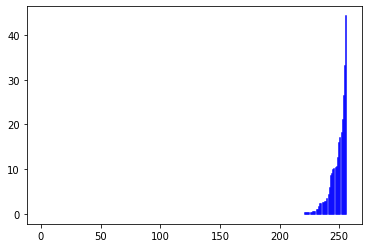

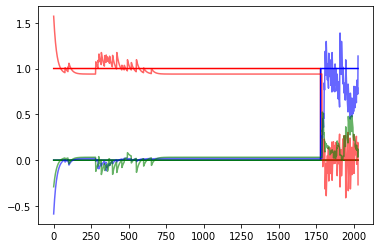

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 2509/3000 [15:36:59<3:01:03, 22.12s/it]

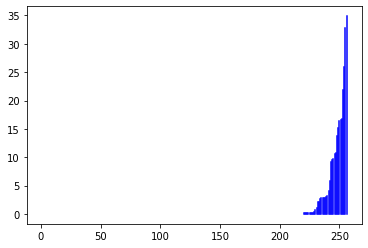

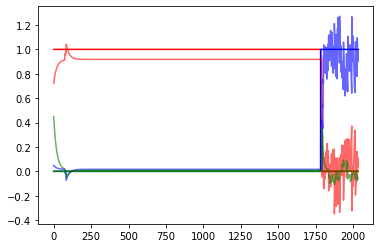

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 2514/3000 [15:38:50<2:58:01, 21.98s/it]

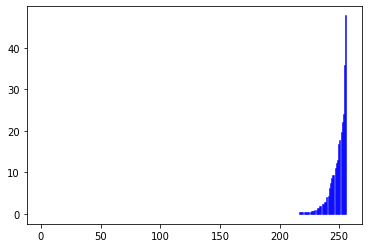

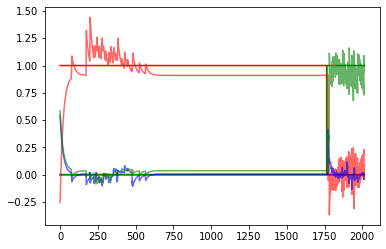

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 2519/3000 [15:40:37<2:48:44, 21.05s/it]

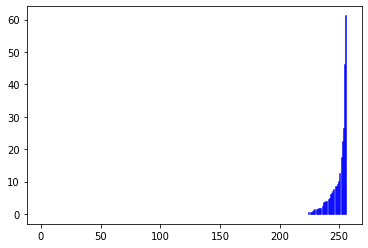

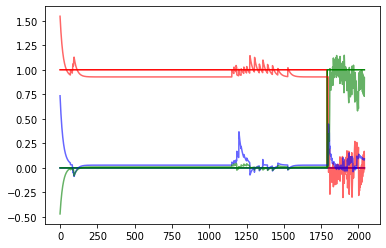

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 2524/3000 [15:42:22<2:42:16, 20.45s/it]

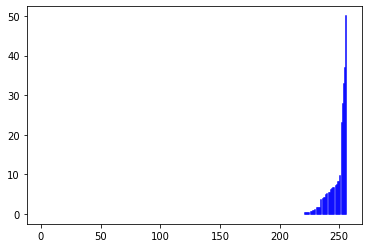

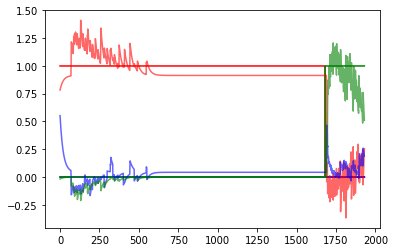

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 2529/3000 [15:44:06<2:39:22, 20.30s/it]

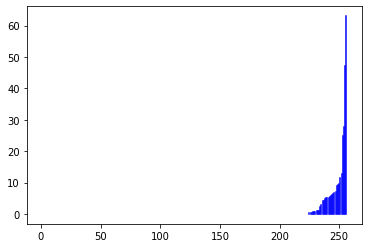

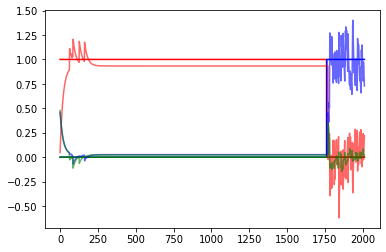

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 2534/3000 [15:45:52<2:38:36, 20.42s/it]

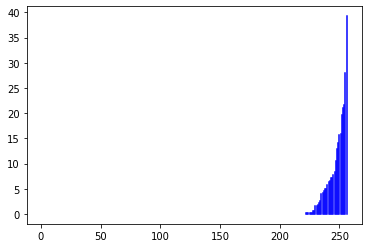

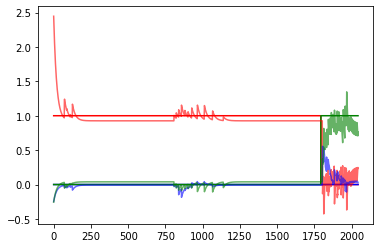

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 2539/3000 [15:47:39<2:44:13, 21.38s/it]

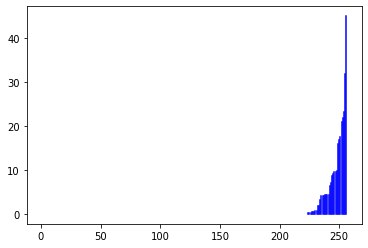

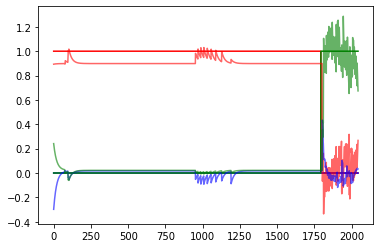

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 2544/3000 [15:49:28<2:38:10, 20.81s/it]

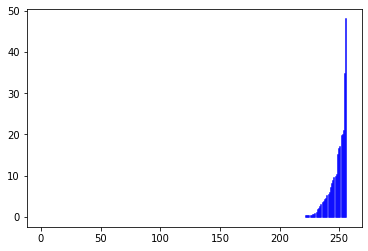

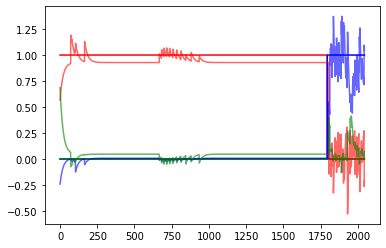

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 2549/3000 [15:51:09<2:33:12, 20.38s/it]

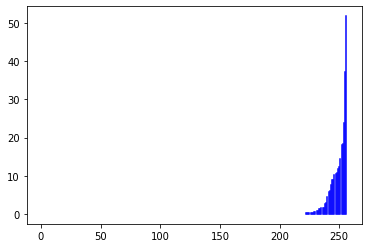

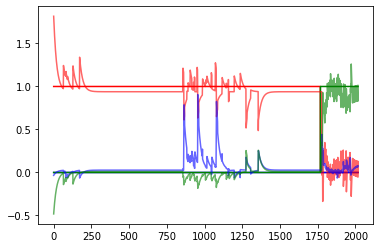

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 2554/3000 [15:53:42<2:57:31, 23.88s/it]

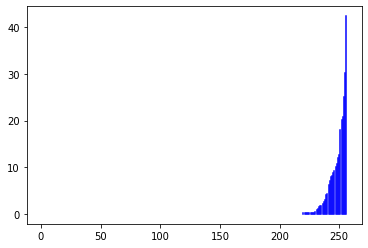

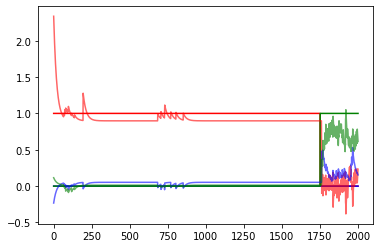

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 2559/3000 [15:55:32<2:42:16, 22.08s/it]

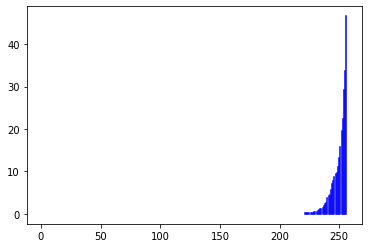

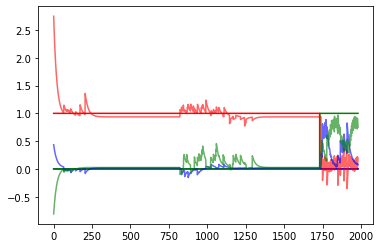

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2564/3000 [15:57:22<2:37:22, 21.66s/it]

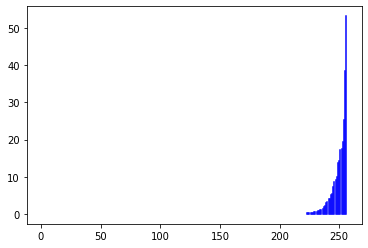

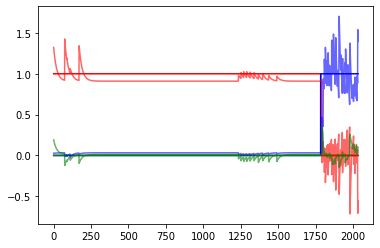

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 2569/3000 [15:59:09<2:31:01, 21.02s/it]

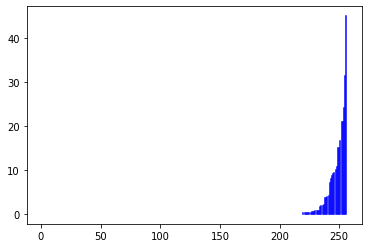

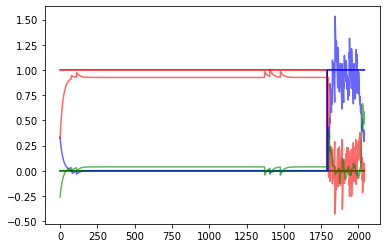

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 2574/3000 [16:00:56<2:28:30, 20.92s/it]

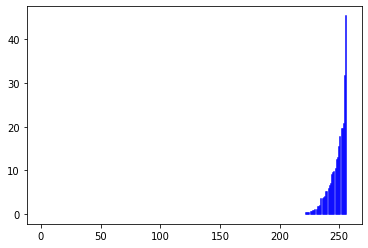

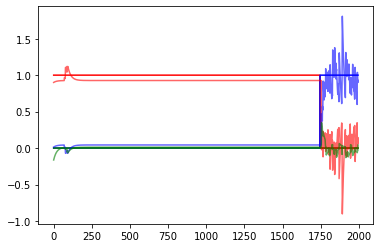

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 2579/3000 [16:02:46<2:29:42, 21.34s/it]

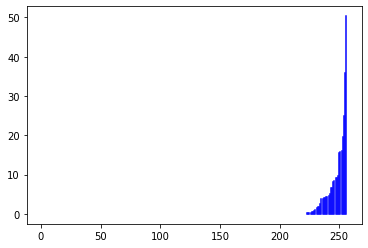

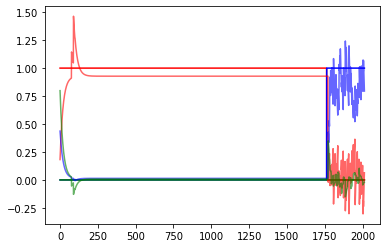

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 2584/3000 [16:04:31<2:20:34, 20.28s/it]

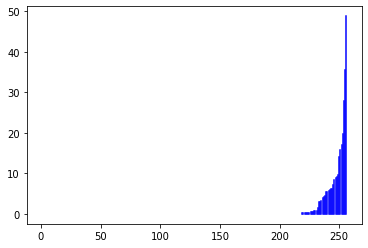

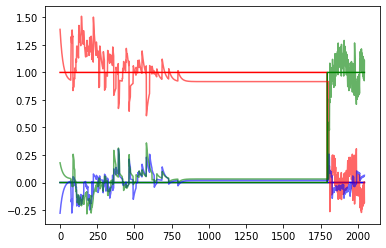

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 2589/3000 [16:06:19<2:22:42, 20.83s/it]

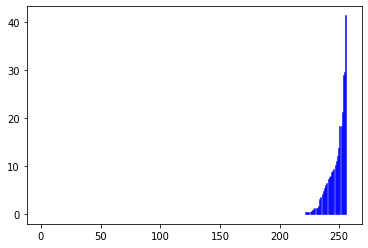

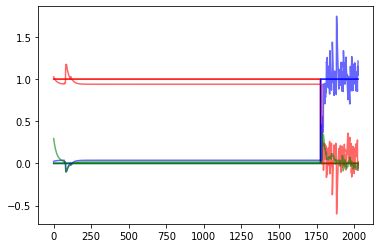

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 2594/3000 [16:08:09<2:23:46, 21.25s/it]

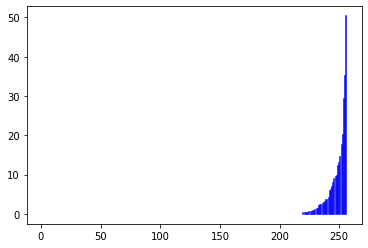

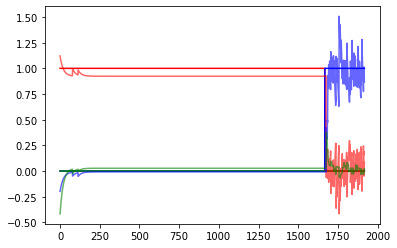

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 2599/3000 [16:09:58<2:22:10, 21.27s/it]

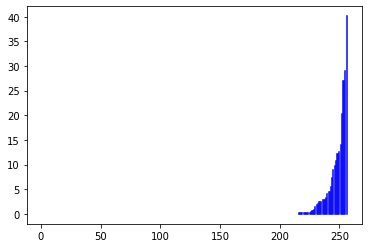

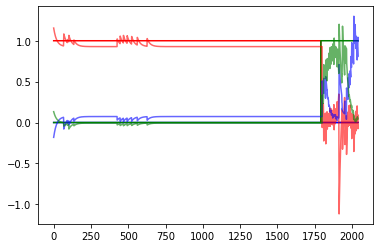

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 2604/3000 [16:12:39<2:45:22, 25.06s/it]

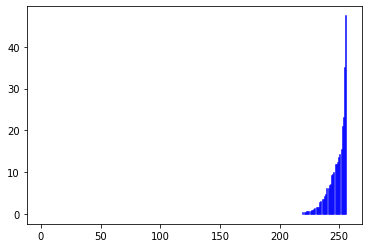

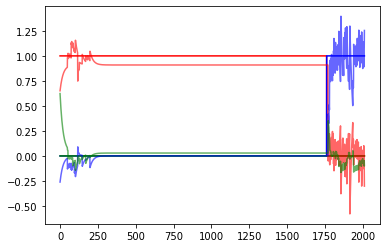

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 2609/3000 [16:14:25<2:19:55, 21.47s/it]

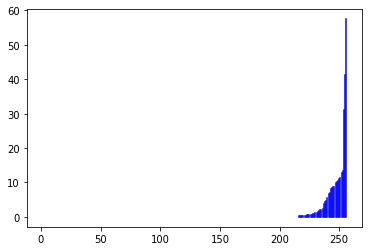

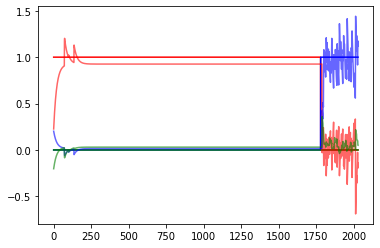

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 2614/3000 [16:16:11<2:15:01, 20.99s/it]

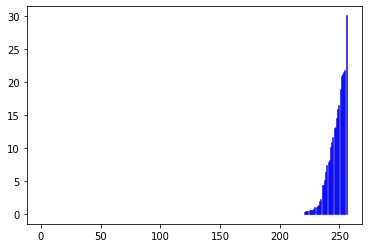

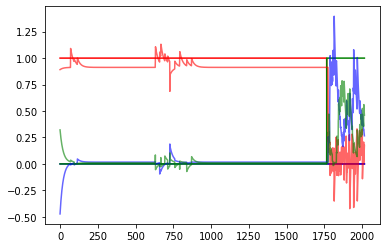

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 2619/3000 [16:17:54<2:09:54, 20.46s/it]

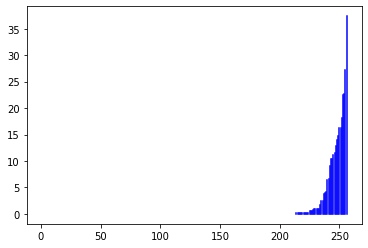

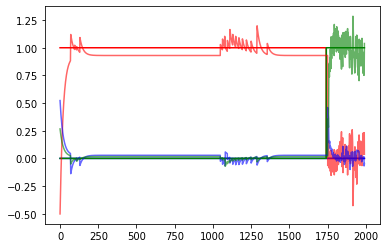

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 2624/3000 [16:19:39<2:08:58, 20.58s/it]

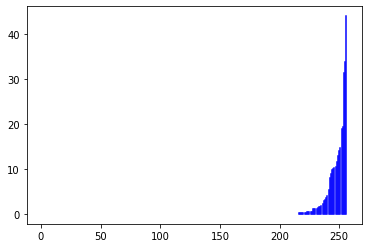

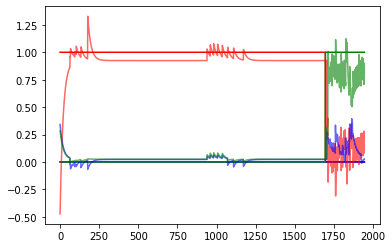

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 2629/3000 [16:21:25<2:06:37, 20.48s/it]

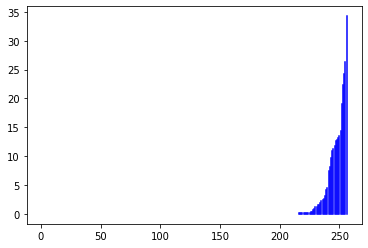

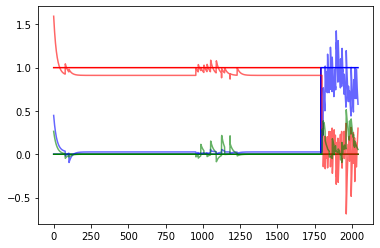

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 2634/3000 [16:23:17<2:12:10, 21.67s/it]

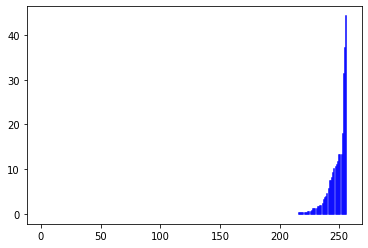

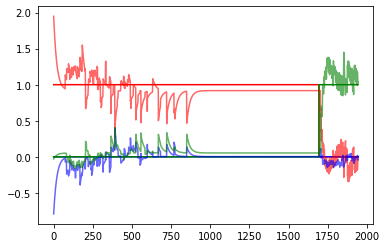

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 2639/3000 [16:25:03<2:06:57, 21.10s/it]

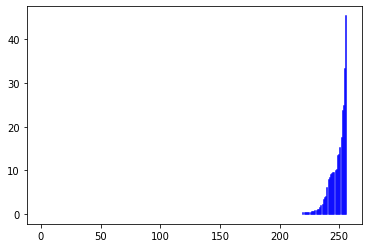

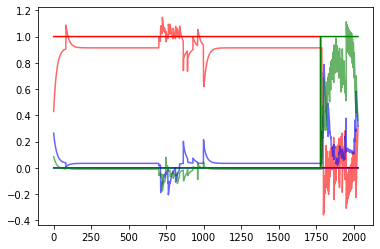

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2644/3000 [16:26:51<2:06:02, 21.24s/it]

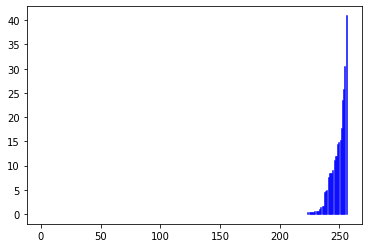

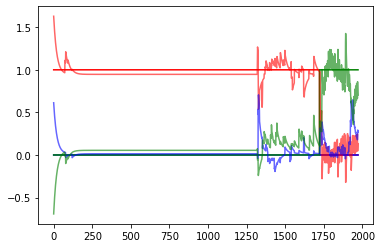

 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 2649/3000 [16:28:38<2:00:50, 20.66s/it]

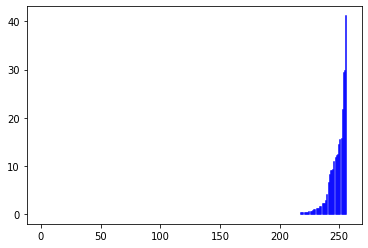

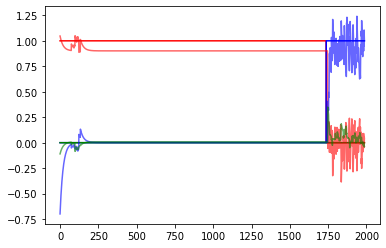

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 2654/3000 [16:31:13<2:19:53, 24.26s/it]

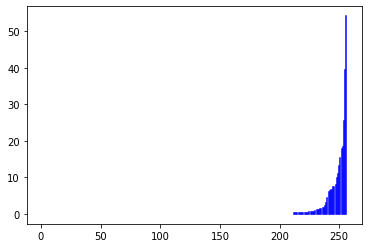

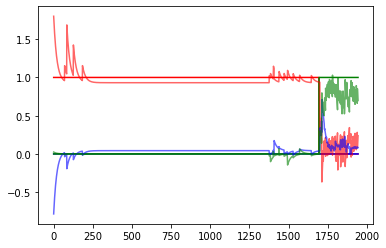

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 2659/3000 [16:33:01<2:02:02, 21.47s/it]

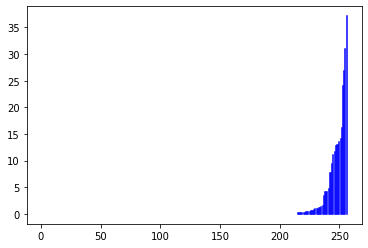

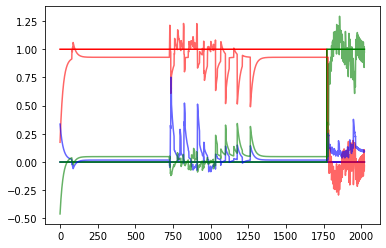

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 2664/3000 [16:34:48<1:58:01, 21.08s/it]

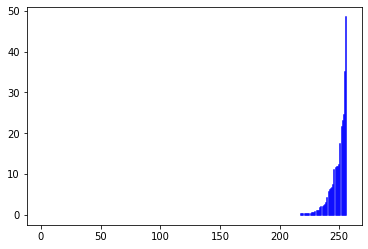

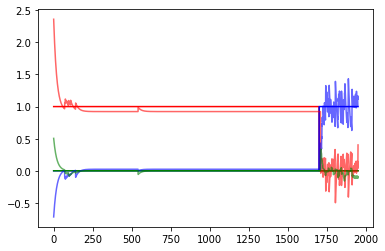

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 2669/3000 [16:36:38<1:58:55, 21.56s/it]

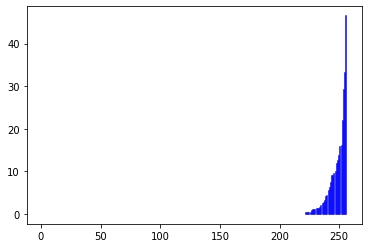

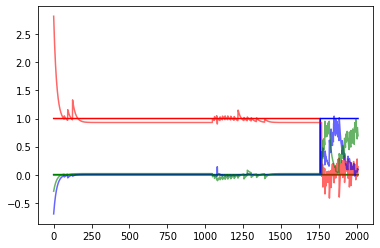

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 2674/3000 [16:38:20<1:51:27, 20.51s/it]

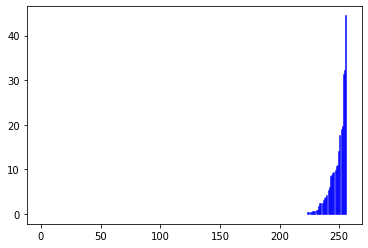

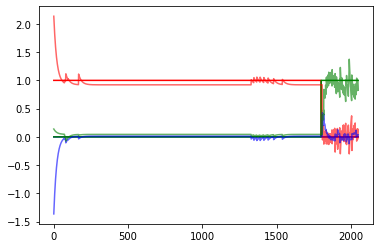

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 2679/3000 [16:40:11<1:53:57, 21.30s/it]

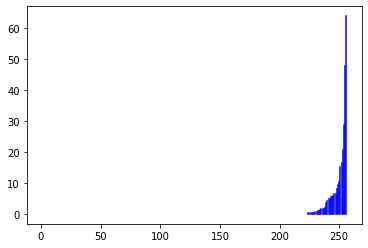

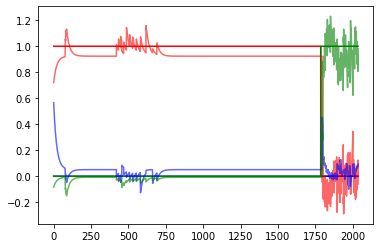

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 2684/3000 [16:41:57<1:49:23, 20.77s/it]

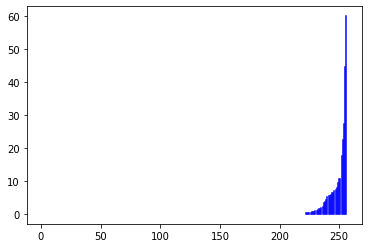

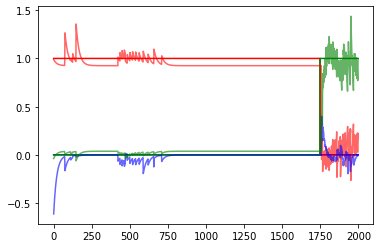

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 2689/3000 [16:43:46<1:50:49, 21.38s/it]

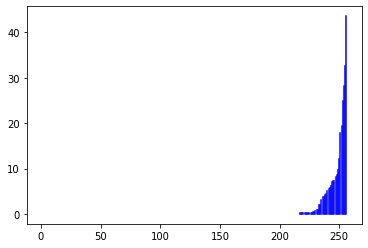

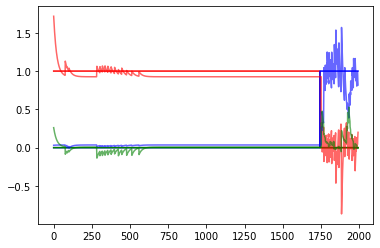

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 2694/3000 [16:45:33<1:45:18, 20.65s/it]

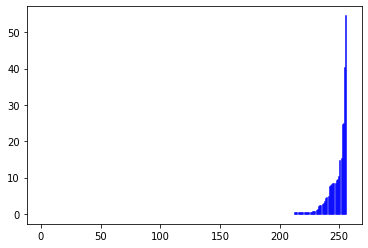

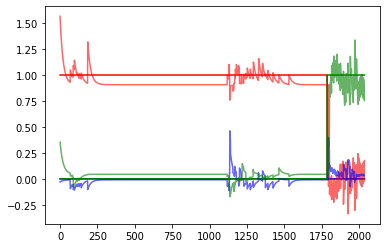

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 2699/3000 [16:47:21<1:45:29, 21.03s/it]

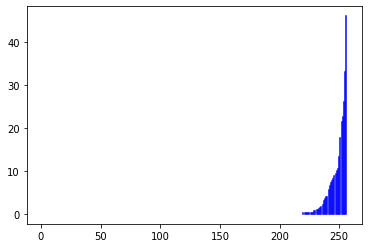

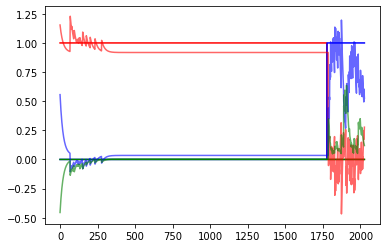

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 2704/3000 [16:50:04<2:05:34, 25.46s/it]

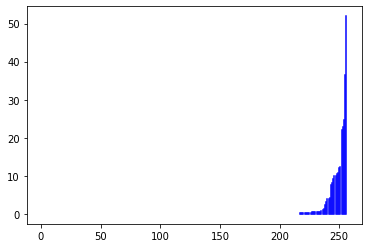

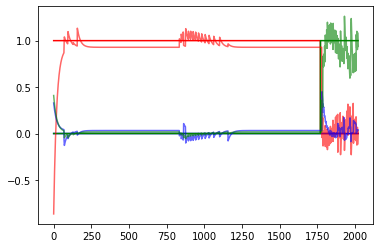

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 2709/3000 [16:51:53<1:46:04, 21.87s/it]

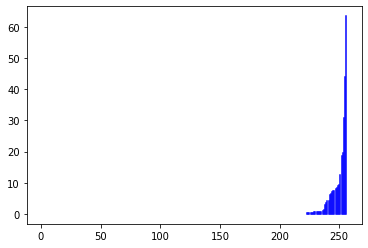

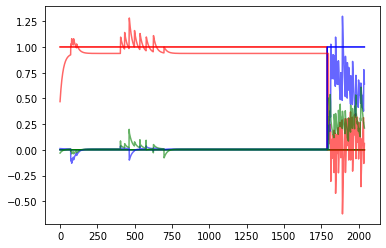

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2714/3000 [16:53:41<1:41:53, 21.38s/it]

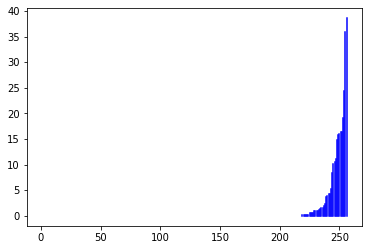

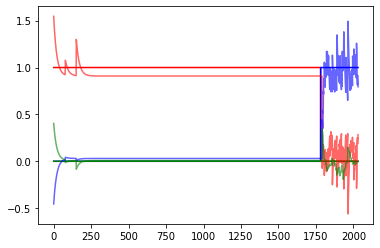

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2719/3000 [16:55:29<1:40:02, 21.36s/it]

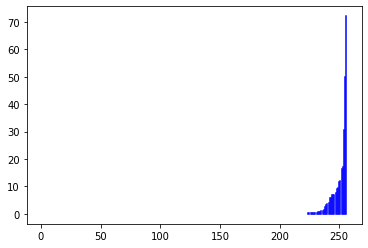

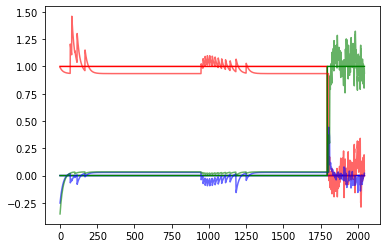

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 2724/3000 [16:57:10<1:32:11, 20.04s/it]

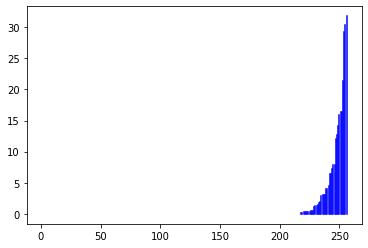

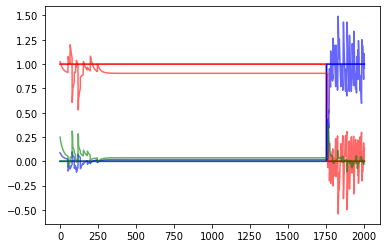

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 2729/3000 [16:58:57<1:35:23, 21.12s/it]

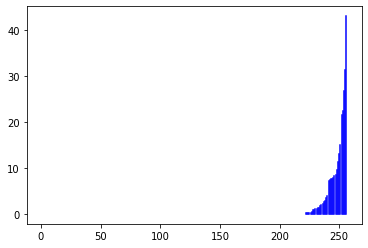

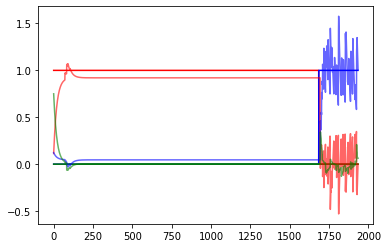

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 2734/3000 [17:00:50<1:36:48, 21.84s/it]

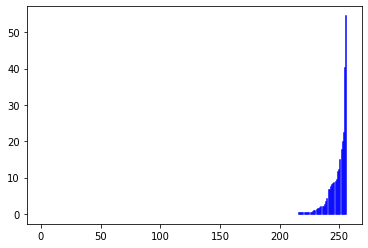

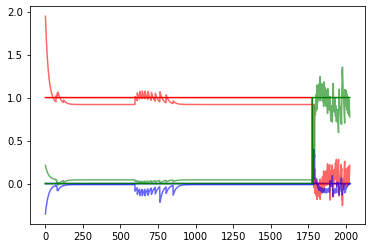

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 2739/3000 [17:02:39<1:34:11, 21.65s/it]

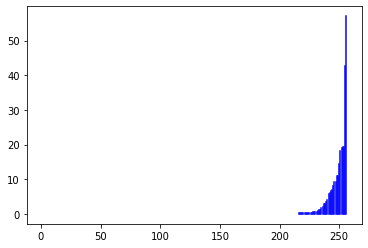

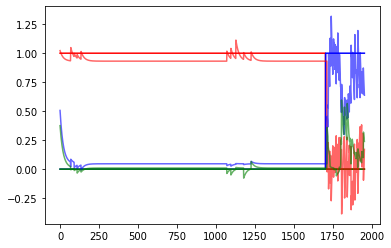

 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 2744/3000 [17:04:26<1:29:54, 21.07s/it]

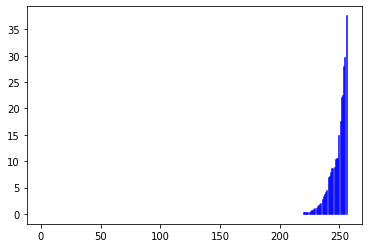

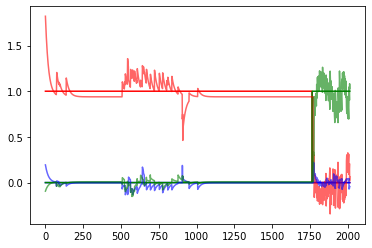

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 2749/3000 [17:06:14<1:28:26, 21.14s/it]

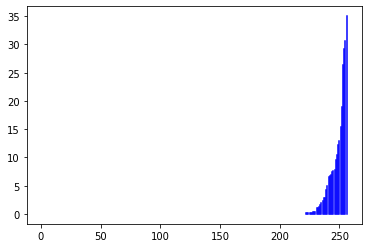

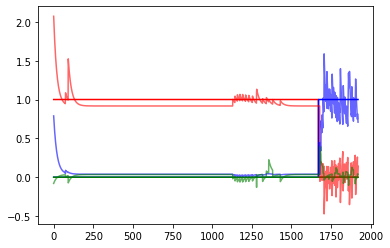

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 2754/3000 [17:08:53<1:42:21, 24.97s/it]

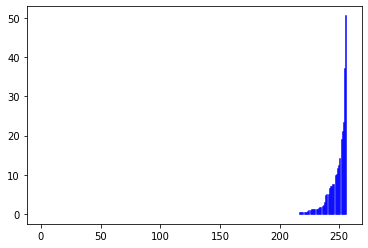

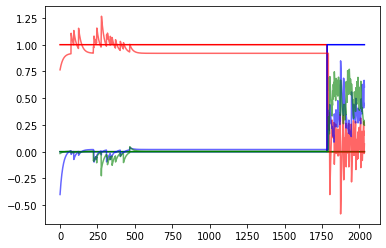

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 2759/3000 [17:10:41<1:27:33, 21.80s/it]

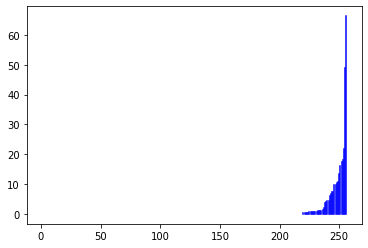

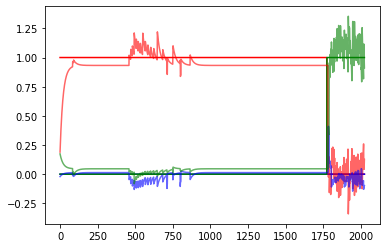

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 2764/3000 [17:12:28<1:22:08, 20.88s/it]

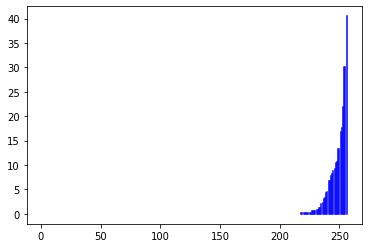

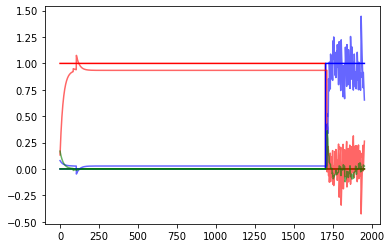

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 2769/3000 [17:14:16<1:21:42, 21.22s/it]

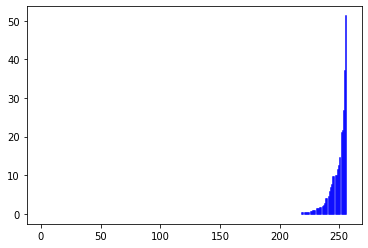

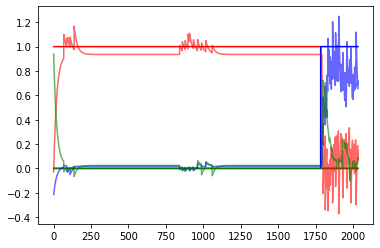

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 2774/3000 [17:16:10<1:24:04, 22.32s/it]

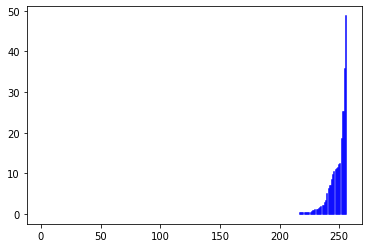

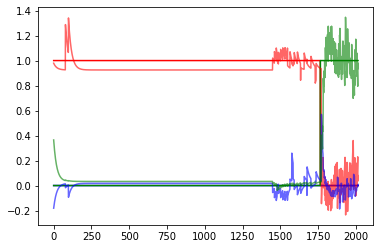

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 2779/3000 [17:17:58<1:18:48, 21.40s/it]

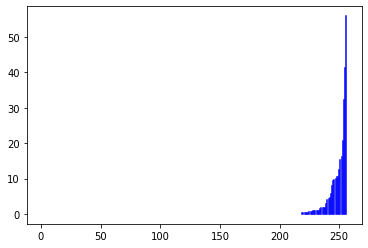

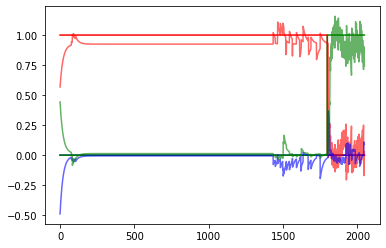

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 2784/3000 [17:19:46<1:16:02, 21.12s/it]

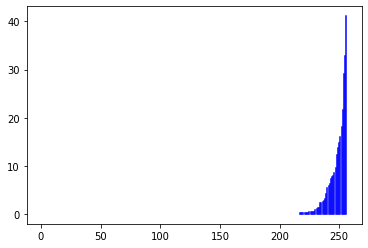

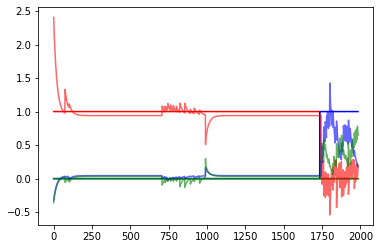

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 2789/3000 [17:21:33<1:12:59, 20.76s/it]

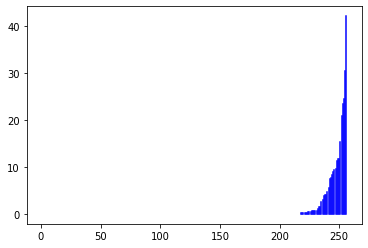

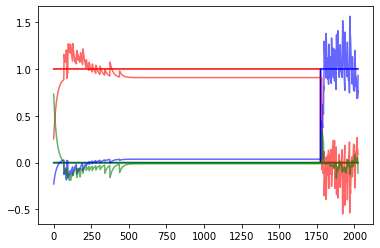

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2794/3000 [17:23:22<1:11:59, 20.97s/it]

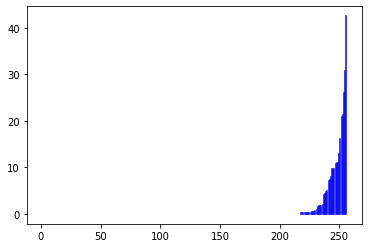

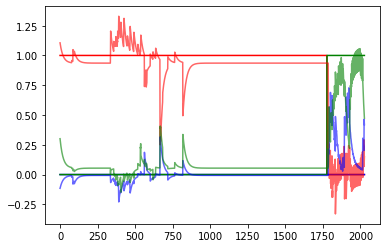

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 2799/3000 [17:25:09<1:10:06, 20.93s/it]

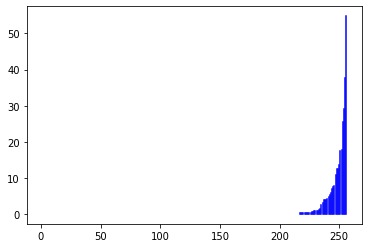

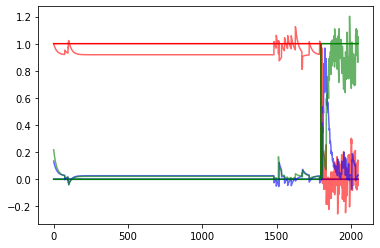

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 2804/3000 [17:27:44<1:19:22, 24.30s/it]

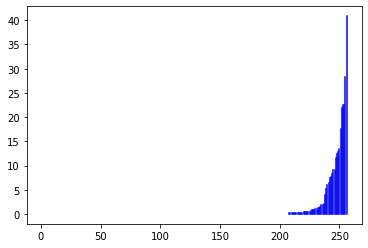

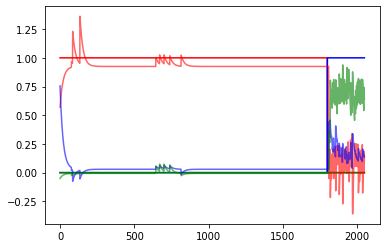

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 2809/3000 [17:29:35<1:09:37, 21.87s/it]

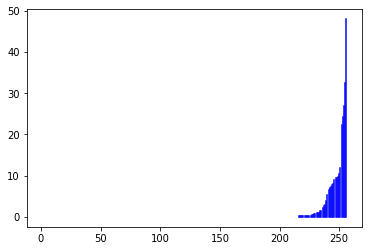

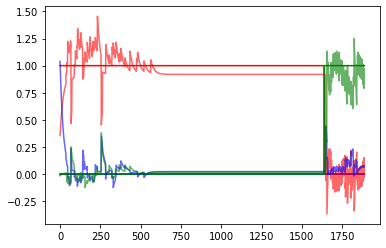

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 2814/3000 [17:31:21<1:05:41, 21.19s/it]

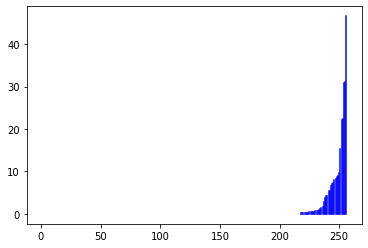

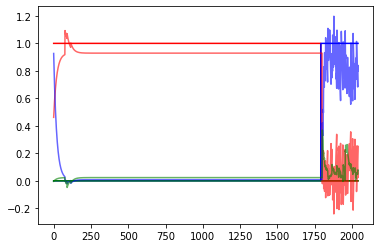

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 2819/3000 [17:33:10<1:03:43, 21.13s/it]

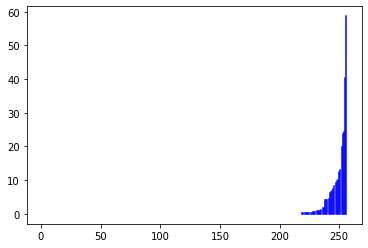

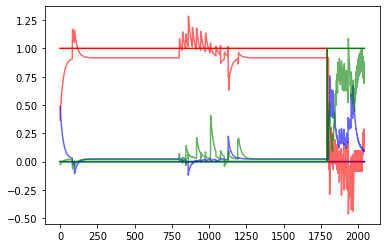

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 2824/3000 [17:34:56<1:01:57, 21.12s/it]

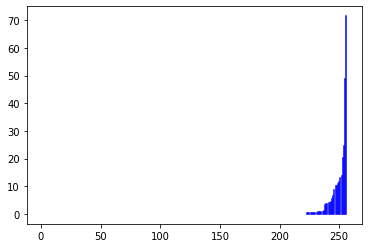

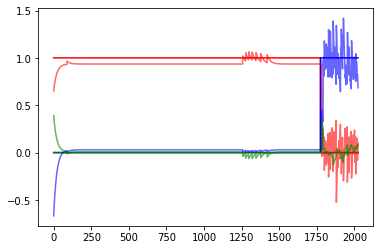

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 2829/3000 [17:36:45<1:01:39, 21.63s/it]

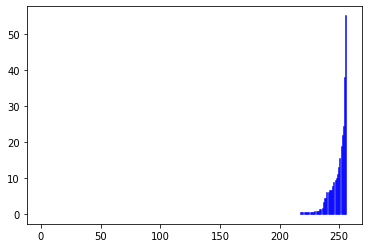

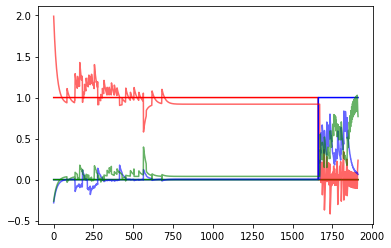

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 2834/3000 [17:38:32<59:01, 21.34s/it]

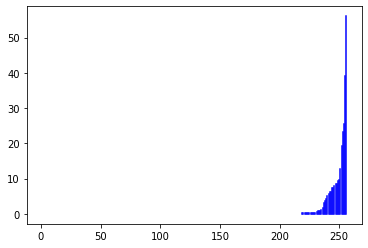

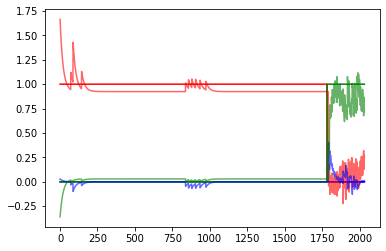

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 2839/3000 [17:40:18<54:48, 20.42s/it]

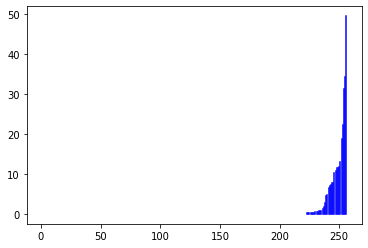

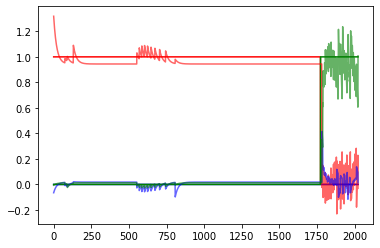

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 2844/3000 [17:42:06<54:30, 20.96s/it]

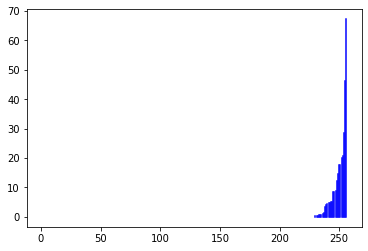

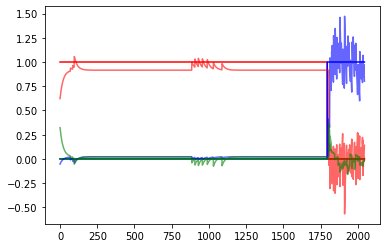

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 2849/3000 [17:43:56<53:24, 21.22s/it]

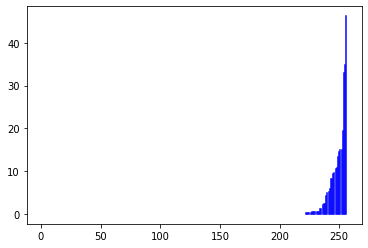

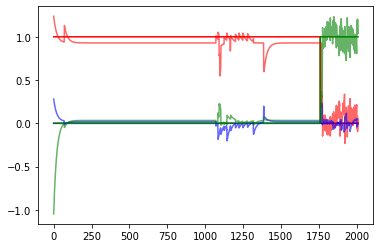

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 2854/3000 [17:46:31<59:54, 24.62s/it]

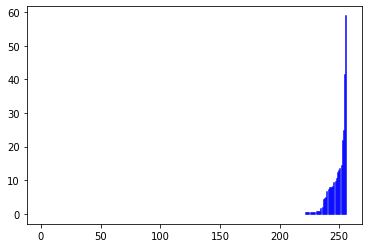

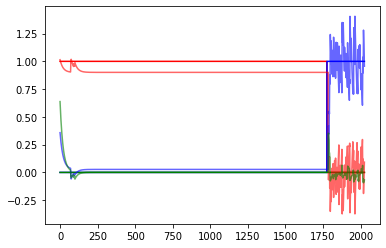

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 2859/3000 [17:48:16<49:25, 21.03s/it]

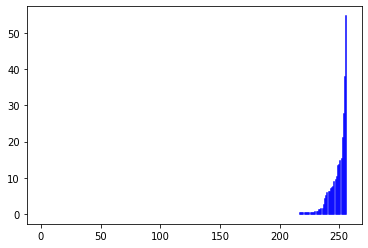

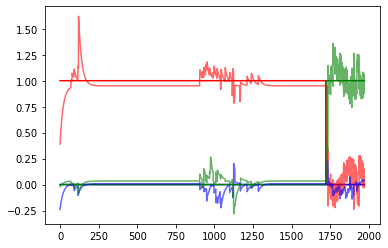

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 2864/3000 [17:49:57<44:37, 19.69s/it]

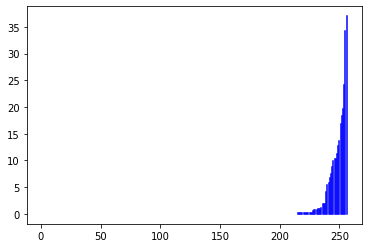

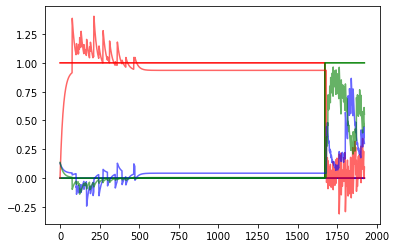

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 2869/3000 [17:51:43<44:08, 20.21s/it]

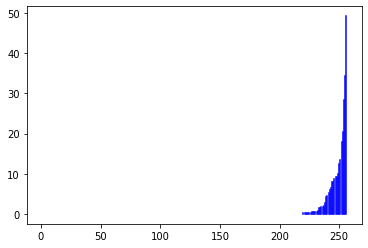

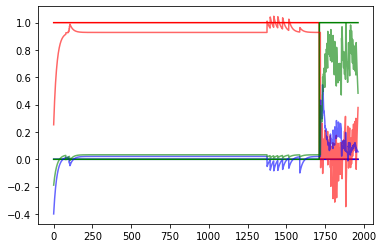

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2874/3000 [17:53:33<44:12, 21.05s/it]

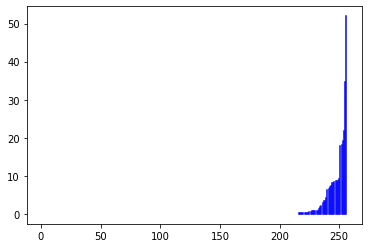

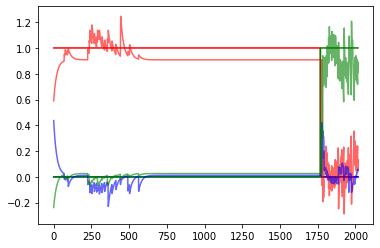

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 2879/3000 [17:55:15<40:05, 19.88s/it]

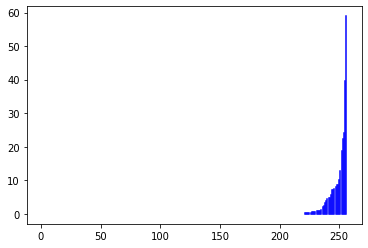

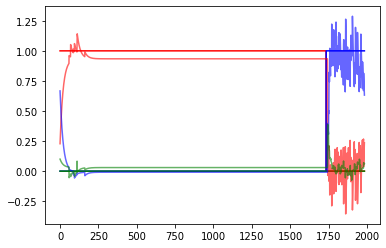

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 2884/3000 [17:57:07<41:50, 21.64s/it]

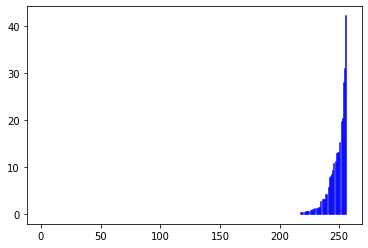

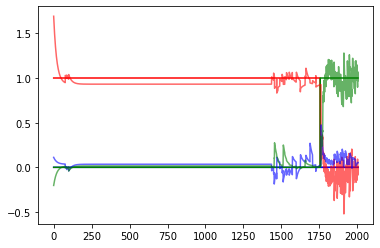

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 2889/3000 [17:58:56<39:18, 21.25s/it]

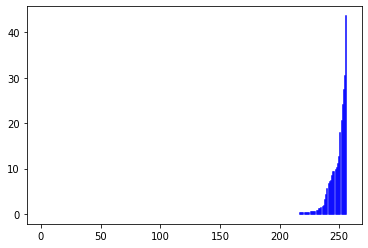

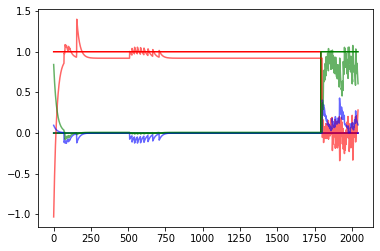

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 2894/3000 [18:00:48<38:10, 21.61s/it]

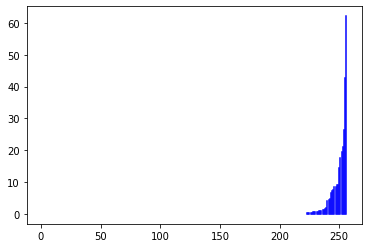

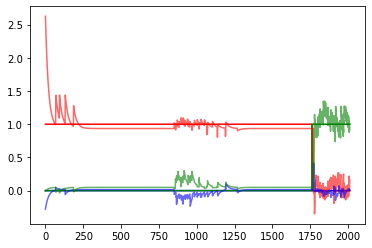

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 2899/3000 [18:02:38<36:24, 21.63s/it]

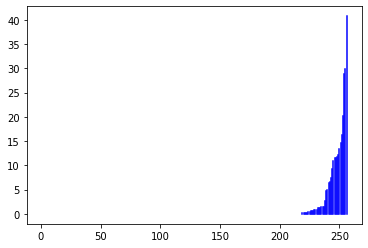

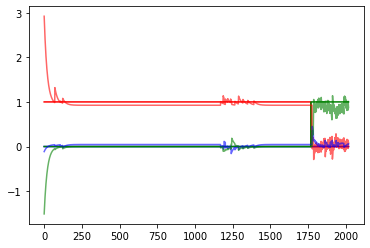

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 2904/3000 [18:05:16<39:38, 24.78s/it]

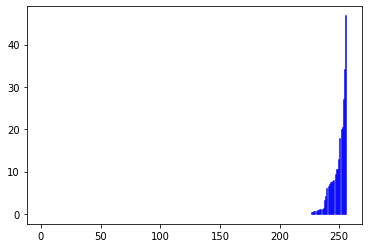

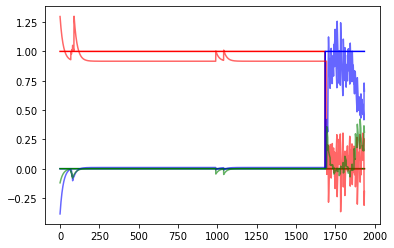

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 2909/3000 [18:07:05<33:24, 22.03s/it]

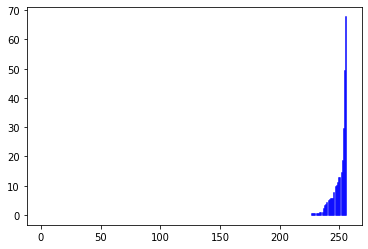

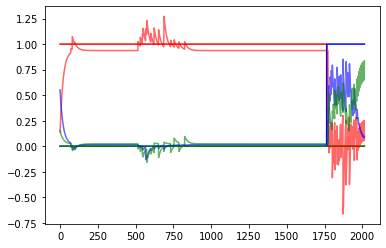

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 2914/3000 [18:08:54<31:07, 21.72s/it]

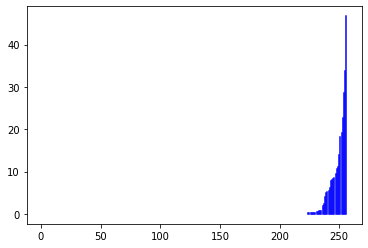

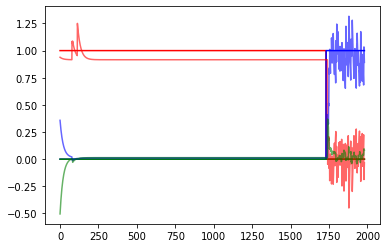

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 2919/3000 [18:10:39<28:00, 20.74s/it]

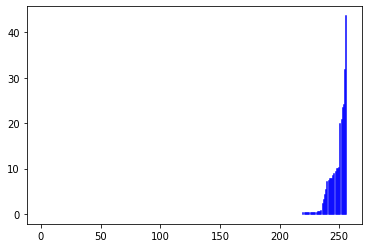

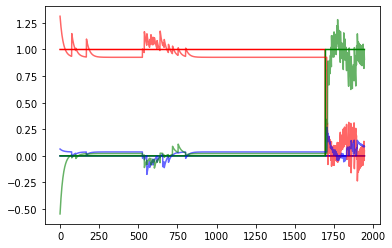

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 2924/3000 [18:12:26<26:21, 20.81s/it]

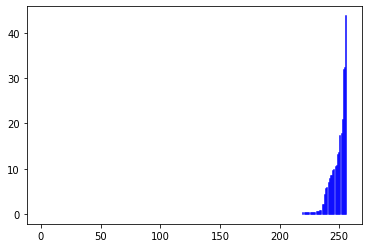

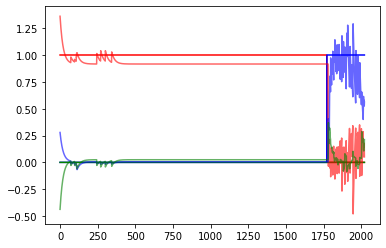

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 2929/3000 [18:14:11<24:20, 20.58s/it]

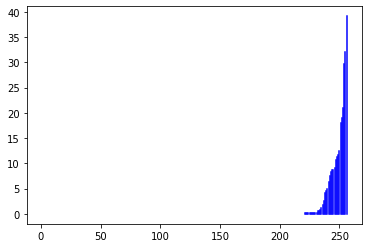

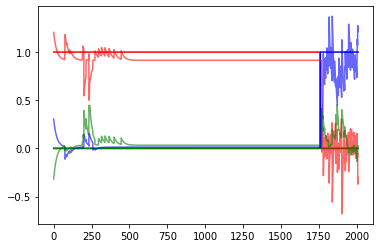

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 2934/3000 [18:15:51<21:30, 19.56s/it]

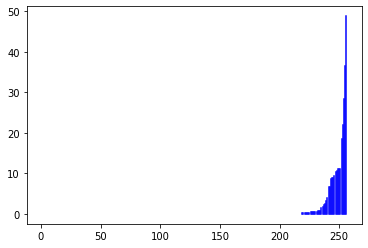

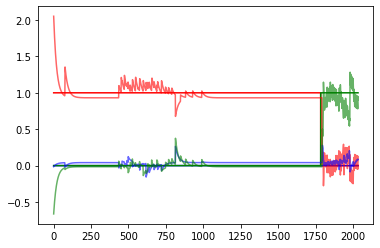

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 2939/3000 [18:17:41<21:16, 20.93s/it]

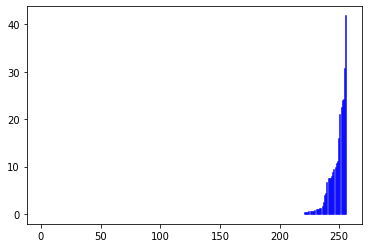

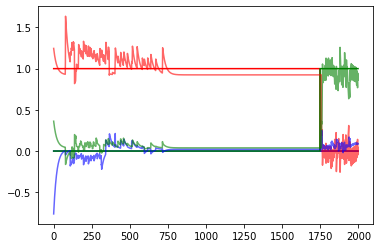

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 2944/3000 [18:19:31<19:59, 21.42s/it]

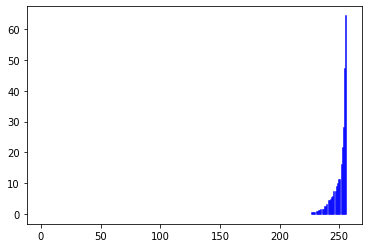

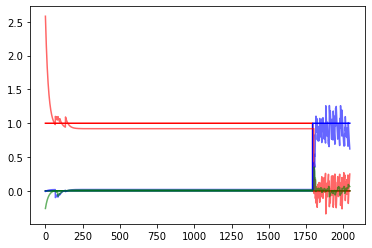

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2949/3000 [18:21:19<18:00, 21.18s/it]

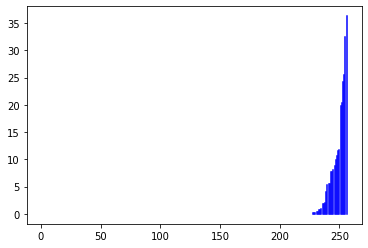

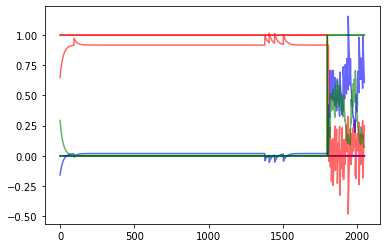

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 2954/3000 [18:23:54<18:34, 24.23s/it]

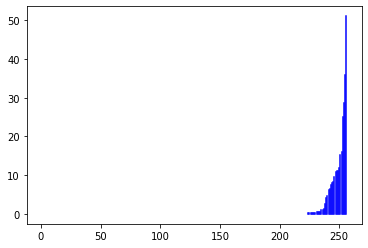

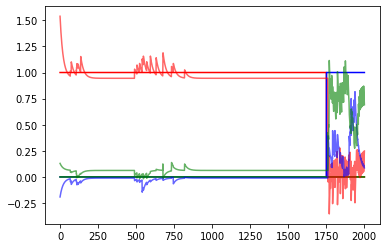

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 2959/3000 [18:25:41<14:39, 21.45s/it]

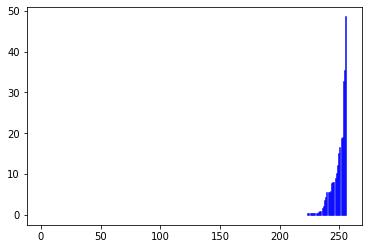

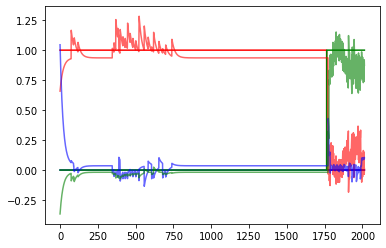

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 2964/3000 [18:27:32<12:46, 21.30s/it]

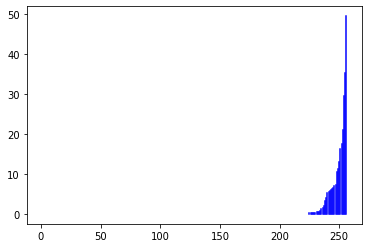

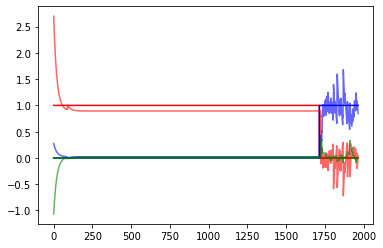

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 2969/3000 [18:29:21<11:04, 21.44s/it]

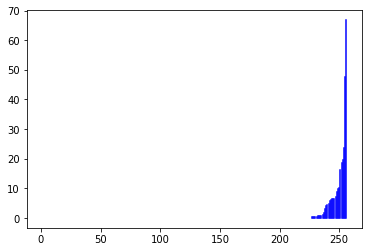

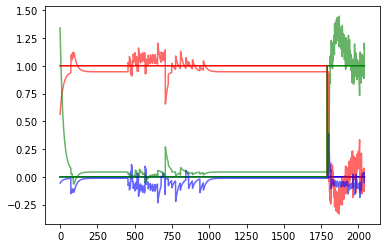

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 2974/3000 [18:31:12<09:20, 21.57s/it]

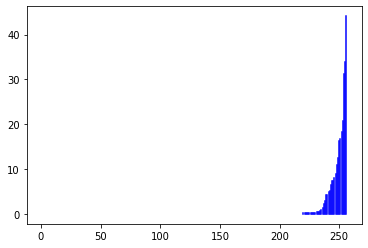

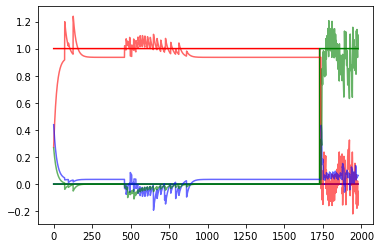

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 2979/3000 [18:32:59<07:28, 21.38s/it]

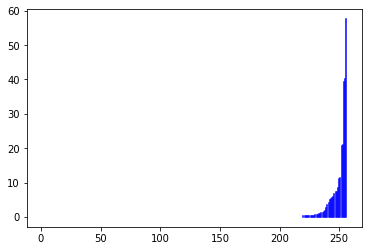

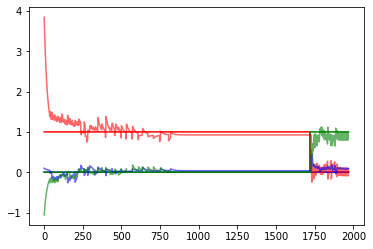

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 2984/3000 [18:34:47<05:31, 20.69s/it]

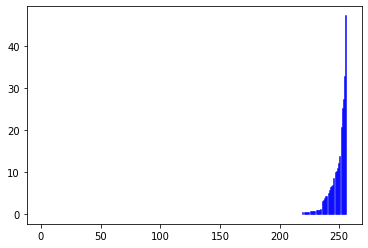

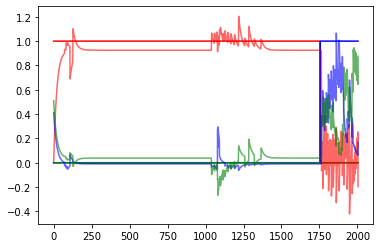

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 2989/3000 [18:36:38<03:56, 21.49s/it]

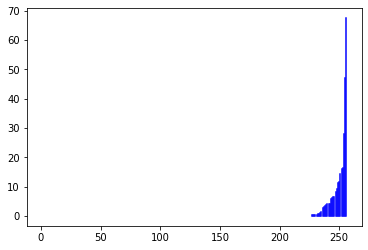

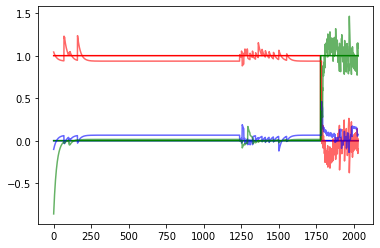

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 2994/3000 [18:38:25<02:06, 21.15s/it]

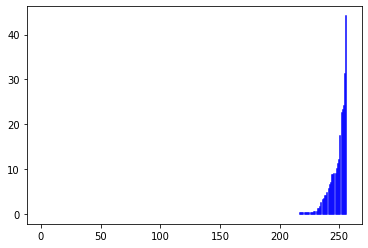

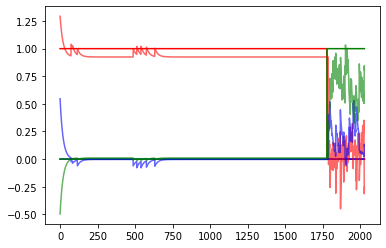

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 2999/3000 [18:40:11<00:20, 20.88s/it]

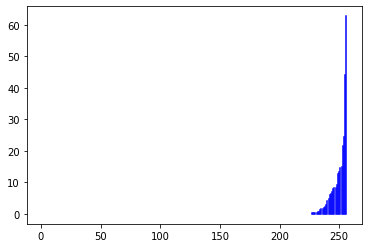

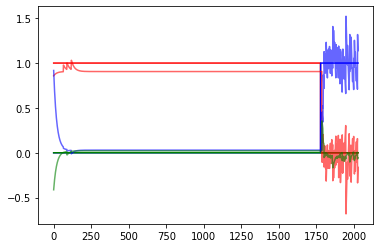

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [18:41:22<00:00, 22.43s/it]

Finished Training


In [14]:
from cgtasknet.instruments.instrument_accuracy_network import correct_answer

name = f"weights/weights_{neuron_parameters.alpha}_N_{hidden_size}_without_square"

running_loss = 0
sigma = 0

for i in tqdm(range(number_of_epochs)):
    if i == 500:
        sigma = 0.2
    if i == 1000:
        sigma = 0.5
    inputs, target_outputs = Task.dataset(number_of_tasks)

    inputs[:, :, 1:3] += every_bath_generator(
        0, sigma, inputs.shape[0], inputs.shape[1], 2
    )
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    loss_mask = torch.zeros_like(target_outputs)
    mask_indexes_signes = torch.where(target_outputs[:, :, 0] == 1)
    mask_indexes_zeros = torch.where(target_outputs[:, :, 0] == 0)
    loss_mask[mask_indexes_signes[0], mask_indexes_signes[1], :] = .1
    loss_mask[mask_indexes_zeros[0], mask_indexes_zeros[1], :] = 1
    optimizer.zero_grad()
    init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
    # forward + backward + optimize
    outputs, _, state = model(
        inputs,
        init_state,
    )

    loss = criterion(outputs, target_outputs, loss_mask, state, window=30)
    loss.backward()
    optimizer.step()

    # print statistics
    running_loss = loss.item()
    if i % 50 == 49:
        with open("log_multy.txt", "a") as f:
            f.write("epoch: {:d} loss: {:0.5f}\n".format(i + 1, running_loss / 10))
        running_loss = 0.0
        with torch.no_grad():
            torch.save(
                model.state_dict(),
                name + f'_{i}_',
            )
    if i % 50== 49:

        result = 0
        for j in range(10):
            try:
                del inputs
            except:
                pass
            try:
                del target_outputs
            except:
                pass
            try:
                del outputs
            except:
                pass
            torch.cuda.empty_cache()
            inputs, target_outputs = Task.dataset(1, delay_between=0)
            inputs[:, :, 1:3] += every_bath_generator(
                0, 0.01, inputs.shape[0], inputs.shape[1], 2
            )
            inputs = torch.from_numpy(inputs).type(torch.float).to(device)
            target_outputs = (
                torch.from_numpy(target_outputs).type(torch.float).to(device)
            )
            outputs = model(
                inputs,
                init_state,
            )[0]
            type_tasks = list(
                np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1]
            )
            answers = can.run(
                target_outputs[50:, :, 0].cpu(),
                outputs[50:, :, 0].cpu(),
                target_outputs[50:, :, 1:].cpu(),
                outputs[50:, :, 1:].cpu(),
                type_tasks,
            )
            result += answers

        accuracy = result / batch_size / 10 * 100
        with open("accuracy_multy.txt", "a") as f:
            f.write(f"ecpoch = {i}; correct/all = {accuracy}\n")
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
        del states
    except:
        pass
    
    if i % 5 == 4:
        check_mean_fr()
    torch.cuda.empty_cache()
    
print("Finished Training")

In [15]:
len(state)

5124

In [16]:
model.save_states = True
sorted_tasks = sorted(tasks)
re_word = "Go"
choices_tasks = []
values_tasks = []
for i in range(len(sorted_tasks)):
    if re_word in sorted_tasks[i]:
        values_tasks.append(i)
    else:
        choices_tasks.append(i)
can = CorrectAnswerNetwork(choices_tasks, values_tasks, 0.15)
inputs, target_outputs = Task.dataset(1, delay_between=0)
inputs[:, :, 1:3] += every_bath_generator(0, 0.01, inputs.shape[0], inputs.shape[1], 2)
inputs = torch.from_numpy(inputs).type(torch.float).to(device)
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
outputs, states = model(
    inputs,
    init_state,
    additional_current=additional_current_generate(
        len(inputs),
        batch_size,
        hidden_size,
    ).to(device),
)
type_tasks = list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])
answers = can.run(
    target_outputs[:, :, 0].cpu(),
    outputs[:, :, 0].cpu(),
    target_outputs[:, :, 1:].cpu(),
    outputs[:, :, 1:].cpu(),
    type_tasks,
)
result += answers

NameError: name 'additional_current_generate' is not defined

In [ ]:
inputs, target_outputs = Task.dataset(1, delay_between=0)
inputs = torch.from_numpy(inputs).type(torch.float).to(device)# * 0
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
outputs, states, _ = model(
    inputs,
    init_state,
        
    )
task_number = sorted_tasks.index('RomoTask1')

outputs = outputs.cpu().detach()
target_outputs = target_outputs.detach().cpu()
s = []
for i in range(len(states)):
    s.append(states[i].z)
s = torch.stack(s).detach().cpu()

plt.plot(target_outputs[:, task_number, 0].cpu())
plt.plot(outputs[:, task_number, 0].detach().cpu())
plt.show()
plt.close()
plt.plot(target_outputs[:, task_number, 1].cpu())
plt.plot(outputs[:, task_number, 1].detach().cpu())
plt.show()
plt.close()
plt.plot(target_outputs[:, task_number, 2].cpu())
plt.plot(outputs[:, task_number, 2].detach().cpu())
plt.show()
plt.close()
plt.figure(figsize=(20, 10))
plt.imshow(s[:, task_number, :].T, aspect="auto", interpolation="nearest")

In [ ]:
for_sort = torch.sort(torch.mean(torch.mean(s, axis=0), axis=0), dim=0
).indices
s_new = torch.zeros_like(s)
for i in range(hidden_size):
    s_new[:, :, i] = s[:, :, for_sort[i]]
plt.imshow(s_new[:, task_number, :].T, aspect="auto", interpolation="nearest", origin='lower',)

In [ ]:
# spike_sequence = torch.stack(spike_sequence)
freq_sequence = torch.mean(torch.mean(spike_sequence, axis=0), axis=0)

# freq_sequence = sort_elemnts_by_another (freq_sequence, freq_sequence)
print(f"{spike_sequence.shape=}")
print(f"{freq_sequence.shape=}")
for i in range(len(freq_sequence)):
    plt.plot([i + 1] * 2, [0, freq_sequence[i]], c="b")
plt.show()
plt.close()
model.save_states = False

In [ ]:
from cgtasknet.instruments.instrument_subgroups import sort_elemnts_by_another

frequency = torch.mean(torch.mean(s, axis=0), axis=0) * 1e3
frequency = sort_elemnts_by_another(freq_sequence, frequency)
for i in range(len(frequency)):
    plt.plot([i + 1] * 2, [0, frequency[i]], c="b")

In [ ]:
result

In [ ]:
list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])

# Тестовая функция

In [ ]:
def test_network(
        test_sigma: float, number_of_trials: int = 100, plot_data: bool = True
):
    result = 0
    for j in tqdm(range(number_of_trials)):
        try:
            del inputs
        except:
            pass
        try:
            del target_outputs
        except:
            pass
        try:
            del outputs
        except:
            pass
        torch.cuda.empty_cache()
        inputs, target_outputs = Task.dataset(1, delay_between=0)
        inputs[:, :, :3] += every_bath_generator(
            0, test_sigma, inputs.shape[0], inputs.shape[1], 3
        )
        inputs = torch.from_numpy(inputs).type(torch.float).to(device)
        target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
        outputs = model(inputs)[0]
        answers = correct_answer(
            outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
        )
        result += torch.sum(answers).item()

    accuracy = result / batch_size / number_of_trials * 100
    if plot_data:
        plot_results(inputs, target_outputs, outputs)
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    return accuracy

# Тестирование
```  np.random.normal(0, 0.01, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.01, 1)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.05, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.05, 10)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.1, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.1)
print(accuracy)

# Тестирование
```  np.random.normal(0, 0.5, size=(inputs.shape)) ```

In [ ]:
accuracy = test_network(0.5)
print(accuracy)

In [ ]:
result = 0
for j in tqdm(range(1)):
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    inputs, target_outputs = Task.dataset(1, delay_between=0)
    inputs[:, :, :3] += np.random.normal(0, 0.5, size=inputs[:, :, :3].shape)
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    outputs = model(inputs)[0]
    answers = correct_answer(
        outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
    )
    result += torch.sum(answers).item()

accuracy = result / batch_size / 100 * 100
print(accuracy)
plot_results(inputs, target_outputs, outputs)
try:
    del inputs
except:
    pass
try:
    del target_outputs
except:
    pass
try:
    del outputs
except:
    pass
torch.cuda.empty_cache()

In [ ]:
result = 0
for j in tqdm(range(1)):
    try:
        del inputs
    except:
        pass
    try:
        del target_outputs
    except:
        pass
    try:
        del outputs
    except:
        pass
    torch.cuda.empty_cache()
    inputs, target_outputs = Task.dataset(1, delay_between=0)
    inputs[:, :, :3] += np.random.normal(0, 0.7, size=inputs[:, :, :3].shape)
    inputs = torch.from_numpy(inputs).type(torch.float).to(device)
    target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
    outputs = model(inputs)[0]
    answers = correct_answer(
        outputs[:, :, 1:], target_outputs[:, :, 1:], target_outputs[:, :, 0]
    )
    result += torch.sum(answers).item()

accuracy = result / batch_size / 100 * 100
print(accuracy)
plot_results(inputs, target_outputs, outputs)
try:
    del inputs
except:
    pass
try:
    del target_outputs
except:
    pass
try:
    del outputs
except:
    pass
torch.cuda.empty_cache()

In [ ]:
inputs = 0
outputs = 0

In [ ]:
lines = []
with open("accuracy_multy.txt", "r") as f:
    while line := f.readline():
        lines.append(float(line.split("=")[2]))

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot([*range(9, 3000, 50)], lines, ".", linestyle="--", markersize=5)
plt.ylabel(r"Accuracy%")
plt.xlabel(r"Epochs")

In [ ]:
start_sigma = 0
stop_sigma = 2
step_sigma = 0.05
sigma_array = np.arange(start_sigma, stop_sigma, step_sigma)
for test_sigma in tqdm(sigma_array):
    result = 0
    for j in range(20):
        try:
            del inputs
        except:
            pass
        try:
            del target_outputs
        except:
            pass
        try:
            del outputs
        except:
            pass
        torch.cuda.empty_cache()
        inputs, target_outputs = Task.dataset(1, delay_between=0)
        inputs[:, :, 1:3] += np.random.normal(
            0, test_sigma, size=inputs[:, :, 1:3].shape
        )
        inputs = torch.from_numpy(inputs).type(torch.float).to(device)
        target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
        outputs = model(inputs)[0]
        type_tasks = list(np.where(inputs[-1, :, 3:].detach().cpu().numpy() == 1)[1])
        answers = can.run(
            target_outputs[50:, :, 0].cpu(),
            outputs[50:, :, 0].cpu(),
            target_outputs[50:, :, 1:].cpu(),
            outputs[50:, :, 1:].cpu(),
            type_tasks,
        )
        result += answers
    accuracy = result / batch_size / 20 * 100
    with open("accuracy_vs_noise.txt", "a") as f:
        f.write(f"noise={test_sigma}:accuracy={accuracy}\n")

In [ ]:
import matplotlib.patches as patches

plt.style.use("ggplot")


def parser(line_text: str) -> tuple:
    """
    Function parses text in form:
    ```v_name_1=v1:v_name_2:v2```
    and return (v1, v2)
    :param line_text:
    :return: (v1, v2)
    """
    line_text = line_text.split(":")
    print(line_text)
    v1 = line_text[0].split("=")[1]
    v2 = line_text[1].split("=")[1]
    return float(v1), float(v2)


x, y = [], []
# with open('accuracy_vs_noise.txt', 'r') as f:
with open(
        r"accuracy_vs_noise.txt",
        "r",
) as f:
    while line := f.readline():
        t_x, t_y = parser(line)
        x.append(t_x)
        y.append(t_y)

fig, ax = plt.subplots()
ax.plot(x, y, ".", linestyle="--")
# ax.plot([.5]*2, [50, 100])
ax.set_ylabel("Accuracy,%")
ax.set_xlabel(r"$\sigma$")
ax.add_patch(
    patches.Rectangle(
        (0, 50), 0.5, 50, edgecolor="grey", facecolor="grey", alpha=0.5, fill=True
    )
)

plt.show()
plt.close()

In [ ]:
batch_size = 1
number_of_tasks = 1
romo_parameters = RomoTaskRandomModParameters(
    romo=RomoTaskParameters(
        delay=0.6,
        positive_shift_delay_time=0.0,
        trial_time=0.1,
        positive_shift_trial_time=0.2,
    ),
)
dm_parameters = DMTaskRandomModParameters(
    dm=DMTaskParameters(trial_time=0.6, positive_shift_trial_time=0.0)
)
ctx_parameters = CtxDMTaskParameters(dm=dm_parameters.dm)
go_parameters = GoTaskRandomModParameters(
    go=GoTaskParameters(
        trial_time=0.1,
        positive_shift_trial_time=0.8,
    )
)
gort_parameters = GoRtTaskRandomModParameters(
    go=GoRtTaskParameters(
        trial_time=0.1,
        positive_shift_trial_time=0.8,
    )
)
godl_parameters = GoDlTaskRandomModParameters(
    go_dl=GoDlTaskParameters(
        go=GoTaskParameters(trial_time=0.1, positive_shift_trial_time=0.2),
        delay=0.1,
        positive_shift_delay_time=1.4,
    )
)
sigma = 0.5
tasks = [
    "RomoTask1",
    "RomoTask2",
    "DMTask1",
    "DMTask2",
    "CtxDMTask1",
    "CtxDMTask2",
    "GoTask1",
    "GoTask2",
    "GoRtTask1",
    "GoRtTask2",
    "GoDlTask1",
    "GoDlTask2",
]
task_dict = {
    tasks[0]: romo_parameters,
    tasks[1]: romo_parameters,
    tasks[2]: dm_parameters,
    tasks[3]: dm_parameters,
    tasks[4]: ctx_parameters,
    tasks[5]: ctx_parameters,
    tasks[6]: go_parameters,
    tasks[7]: go_parameters,
    tasks[8]: gort_parameters,
    tasks[9]: gort_parameters,
    tasks[10]: godl_parameters,
    tasks[11]: godl_parameters,
}

tasks_sequence = [
    MultyReduceTasks(
        tasks=task_dict,
        batch_size=batch_size,
        delay_between=0,
        enable_fixation_delay=True,
        task_number=i,
    )
    for i in range(len(tasks))
]

In [ ]:
tasks_and_names = dict([*zip(sorted(tasks), tasks_sequence)])
chosed_tasks = ["CtxDMTask1", "GoTask1", "GoRtTask1", "GoDlTask1", "RomoTask1"]
chosed_tasks_dict = {}
for key, item in tasks_and_names.items():
    if key in chosed_tasks:
        chosed_tasks_dict[key] = item
print("Tasks for PCA")
print(chosed_tasks_dict)

In [ ]:
import matplotlib.pyplot as plt
from cgtasknet.instruments.instrument_accuracy_network import correct_answer
from cgtasknet.net.states import LIFAdExInitState

name = f"Train_dm_and_romo_task_reduce_lif_adex_without_refrac_random_delay_long_a_alpha_{neuron_parameters.alpha}_N_{hidden_size}"
init_state = LIFAdExInitState(batch_size, hidden_size, device=device)
data, t_outputs = tasks_and_names["DMTask1"].dataset(2, delay_between=0)
data[:, :, 1:3] += every_bath_generator(0, sigma, data.shape[0], data.shape[1], 2)
data = torch.from_numpy(data).type(torch.float).to(device)
out, states = model(data, init_state.random_state())
out = out.detach().cpu().numpy()
plt.figure()
plt.plot(t_outputs[:, 0, 0])
plt.plot(t_outputs[:, 0, 1])
plt.plot(t_outputs[:, 0, 2])

plt.figure()
plt.plot(out[:, 0, 0])
plt.plot(out[:, 0, 1])
plt.plot(out[:, 0, 2])

In [ ]:

for name, param in model.named_parameters():
    if name == 'alif.recurrent_weights':
        final_parameters = torch.clone(param.detach().cpu())


In [ ]:
eigs_final = torch.eig(final_parameters)[0]
eigs_initial = torch.eig(initial_parameters)[0]

In [ ]:
x_final = eigs_final[:, 0]
y_final = eigs_final[:, 1]

x_initial = eigs_initial[:, 0]
y_initial = eigs_initial[:, 1]

In [ ]:
plt.scatter(x_initial, y_initial)
plt.scatter(x_final, y_final)

In [ ]:
model.save_states = True
init_state = LIFAdExState(
        torch.zeros(batch_size, hidden_size).to(device),
        torch.rand(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
        torch.zeros(batch_size, hidden_size).to(device),
    )
inputs, target_outputs = Task_test.dataset(1)

inputs = torch.from_numpy(inputs).type(torch.float).to(device)
target_outputs = torch.from_numpy(target_outputs).type(torch.float).to(device)
result = model(inputs, init_state,)
#del inputs, init_state
torch.cuda.empty_cache()
states = result[-1]
spikes = []
for state in states:
    spikes.append(state.detach().cpu())

last_fix = torch.where(inputs[:, :, 0] == 1)[0][-1].item()
s = torch.stack(spikes)[last_fix:, ...]
freq_sequence_new = torch.sort(
    torch.mean(torch.mean(s, axis=0), axis=0), dim=0
).values
for i in range(len(freq_sequence_new)):
    plt.plot([i + 1] * 2, [0, freq_sequence_new[i] * 1e3], c="b")
plt.show()
plt.close()

In [ ]:
index=10
plt.plot(target_outputs[:, index, 0].detach().cpu(), c='r')
plt.plot(target_outputs[:, index, 1].detach().cpu(), c='b')
plt.plot(target_outputs[:, index, 2].detach().cpu(), c='g')

plt.plot(result[0][:, index, 0].detach().cpu(), c='r', alpha=.6
        )
plt.plot(result[0][:, index, 1].detach().cpu(), c='b', alpha=.6
        )
plt.plot(result[0][:, index, 2].detach().cpu(), c='g', alpha=.6
        )


plt.plot(inputs[:, index, 0].detach().cpu() + 1.5)

plt.plot(inputs[:, index, 1].detach().cpu() + 1.5)
plt.plot(inputs[:, index, 2].detach().cpu() + 1.5)
plt.yticks([])

In [ ]:
plt.plot(torch.sort(torch.mean(final_parameters, axis=1)).values)
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)

In [ ]:
torch.mean(final_parameters, axis=1).shape

In [ ]:
torch.sort(torch.mean(final_parameters, axis=1))

In [ ]:
torch.mean(torch.zeros((10, 20)), axis=1).shape

In [ ]:
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)
plt.plot(torch.sort(torch.mean(final_parameters, axis=1)).values)

In [ ]:
plt.plot(torch.sort(torch.mean(initial_parameters, axis=1)).values)